# IEEE-CIS Fraud Detection
- https://www.kaggle.com/competitions/ieee-fraud-detection

# 팀원

- 이미지

## Data Explanation

### Transaction Table *
- TransactionDT: timedelta from a given reference datetime (not an actual timestamp)
- TransactionAMT: transaction payment amount in USD
- ProductCD: product code, the product for each transaction
- card1 - card6: payment card information, such as card type, card category, issue bank, country, etc.
- addr: address
- dist: distance
- P_ and (R__) emaildomain: purchaser and recipient email domain
- C1-C14: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
- D1-D15: timedelta, such as days between previous transaction, etc.
- M1-M9: match, such as names on card and address, etc.
- Vxxx: Vesta engineered rich features, including ranking, counting, and other entity relations.
- Categorical Features:
- ProductCD
- card1 - card6
- addr1, addr2
- P_emaildomain
- R_emaildomain
- M1 - M9

### Identity Table *
- Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions.They're collected by Vesta’s fraud protection system and digital security partners. (The field names are masked and pairwise dictionary will not be provided for privacy protection and contract agreement)

- Categorical Features:
- DeviceType
- DeviceInfo
- id_12 - id_38


#### Refer : https://www.kaggle.com/competitions/ieee-fraud-detection/discussion/101203

## Simple Comprehension Of Dataset

- IEEE-CIS Fraud Detection 는 vesta 사의 카드거래에서의 신용카드 거래가 사기거래인지 정상거래인지 확인하는 Competition 이다. 중요하게 봐야할 부분은 당연히 사기거래를 탐지해 내는 것이다. 또한 정상거래임에도 사기거래로 탐지하지 않도록 노력해야햔다.

- 불균형 데이터이며 총 248,807 건의 거래에서 492 건의 사기거래가 포함되어있다. 이는 불균형 데이터에 대한 Classification 이고 이를 해결하기 위하여 Under/Over Sampling, Unsupervised Learning 등을 사용해 볼 수 있다.

## EDA

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
from sklearn.model_selection import train_test_split

In [2]:
tr = pd.read_csv('train_transaction.csv')
te = pd.read_csv('test_transaction.csv')
trid = pd.read_csv('train_identity.csv')
teid = pd.read_csv('test_identity.csv')

In [3]:
tr.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
te.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
trid.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [6]:
teid.head()

,TransactionID,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW


In [7]:
tr.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,...,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.00000,82351.000000,82351.000000,82351.000000,82351.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027176,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,...,0.775874,721.741883,1375.783644,1014.622782,9.807015,59.16455,28.530903,55.352422,151.160542,100.700882
std,1.704744e+05,0.183755,4.617224e+06,239.162522,4901.170153,157.793246,11.336444,41.244453,101.741072,2.690623,...,4.727971,6217.223583,11169.275702,7955.735482,243.861391,387.62948,274.576920,668.486833,1095.034387,814.946722
min,2.987000e+06,0.000000,8.640000e+04,0.251000,1000.000000,100.000000,100.000000,100.000000,100.000000,10.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,3.134635e+06,0.000000,3.027058e+06,43.321000,6019.000000,214.000000,150.000000,166.000000,204.000000,87.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,3.282270e+06,0.000000,7.306528e+06,68.769000,9678.000000,361.000000,150.000000,226.000000,299.000000,87.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
75%,3.429904e+06,0.000000,1.124662e+07,125.000000,14184.000000,512.000000,150.000000,226.000000,330.000000,87.000000,...,0.000000,0.000000,25.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
max,3.577539e+06,1.000000,1.581113e+07,31937.391000,18396.000000,600.000000,231.000000,237.000000,540.000000,102.000000,...,55.000000,160000.000000,160000.000000,160000.000000,55125.000000,55125.00000,55125.000000,104060.000000,104060.000000,104060.000000


In [8]:
trid.describe()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,1.442330e+05,144233.000000,140872.000000,66324.000000,66324.000000,136865.000000,136865.000000,5155.000000,5155.000000,74926.000000,...,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000
mean,3.236329e+06,-10.170502,174716.584708,0.060189,-0.058938,1.615585,-6.698710,13.285354,-38.600388,0.091023,...,189.451377,14.237337,353.128174,403.882666,368.269820,16.002708,12.800927,329.608924,149.070308,26.508597
std,1.788496e+05,14.347949,159651.816856,0.598231,0.701015,5.249856,16.491104,11.384207,26.084899,0.983842,...,30.375360,1.561302,141.095343,152.160327,198.847038,6.897665,2.372447,97.461089,32.101995,3.737502
min,2.987004e+06,-100.000000,1.000000,-13.000000,-28.000000,-72.000000,-100.000000,-46.000000,-100.000000,-36.000000,...,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,11.000000,100.000000,100.000000,0.000000
25%,3.077142e+06,-10.000000,67992.000000,0.000000,0.000000,0.000000,-6.000000,5.000000,-48.000000,0.000000,...,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,11.000000,321.000000,119.000000,24.000000
50%,3.198818e+06,-5.000000,125800.500000,0.000000,0.000000,0.000000,0.000000,14.000000,-34.000000,0.000000,...,166.000000,15.000000,341.000000,472.000000,252.000000,14.000000,11.000000,321.000000,149.000000,24.000000
75%,3.392923e+06,-5.000000,228749.000000,0.000000,0.000000,1.000000,0.000000,22.000000,-23.000000,0.000000,...,225.000000,15.000000,427.000000,533.000000,486.500000,14.000000,15.000000,371.000000,169.000000,32.000000
max,3.577534e+06,0.000000,999595.000000,10.000000,0.000000,52.000000,0.000000,61.000000,0.000000,25.000000,...,229.000000,29.000000,671.000000,661.000000,854.000000,44.000000,26.000000,548.000000,216.000000,32.000000


In [9]:
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590540 entries, 0 to 590539
Columns: 394 entries, TransactionID to V339
dtypes: float64(376), int64(4), object(14)
memory usage: 1.7+ GB


In [10]:
te.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506691 entries, 0 to 506690
Columns: 393 entries, TransactionID to V339
dtypes: float64(376), int64(3), object(14)
memory usage: 1.5+ GB


In [11]:
trid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144233 entries, 0 to 144232
Data columns (total 41 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   TransactionID  144233 non-null  int64  
 1   id_01          144233 non-null  float64
 2   id_02          140872 non-null  float64
 3   id_03          66324 non-null   float64
 4   id_04          66324 non-null   float64
 5   id_05          136865 non-null  float64
 6   id_06          136865 non-null  float64
 7   id_07          5155 non-null    float64
 8   id_08          5155 non-null    float64
 9   id_09          74926 non-null   float64
 10  id_10          74926 non-null   float64
 11  id_11          140978 non-null  float64
 12  id_12          144233 non-null  object 
 13  id_13          127320 non-null  float64
 14  id_14          80044 non-null   float64
 15  id_15          140985 non-null  object 
 16  id_16          129340 non-null  object 
 17  id_17          139369 non-nul

In [12]:
teid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141907 entries, 0 to 141906
Data columns (total 41 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   TransactionID  141907 non-null  int64  
 1   id-01          141907 non-null  float64
 2   id-02          136976 non-null  float64
 3   id-03          66481 non-null   float64
 4   id-04          66481 non-null   float64
 5   id-05          134750 non-null  float64
 6   id-06          134750 non-null  float64
 7   id-07          5059 non-null    float64
 8   id-08          5059 non-null    float64
 9   id-09          74338 non-null   float64
 10  id-10          74338 non-null   float64
 11  id-11          136778 non-null  float64
 12  id-12          141907 non-null  object 
 13  id-13          130286 non-null  float64
 14  id-14          71357 non-null   float64
 15  id-15          136977 non-null  object 
 16  id-16          125747 non-null  object 
 17  id-17          135966 non-nul

In [13]:
tr.isnull().sum()

TransactionID          0
isFraud                0
TransactionDT          0
TransactionAmt         0
ProductCD              0
                   ...  
V335              508189
V336              508189
V337              508189
V338              508189
V339              508189
Length: 394, dtype: int64

In [14]:
te.isnull().sum()

TransactionID          0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
                   ...  
V335              430260
V336              430260
V337              430260
V338              430260
V339              430260
Length: 393, dtype: int64

In [15]:
trid.isnull().sum()

TransactionID         0
id_01                 0
id_02              3361
id_03             77909
id_04             77909
id_05              7368
id_06              7368
id_07            139078
id_08            139078
id_09             69307
id_10             69307
id_11              3255
id_12                 0
id_13             16913
id_14             64189
id_15              3248
id_16             14893
id_17              4864
id_18             99120
id_19              4915
id_20              4972
id_21            139074
id_22            139064
id_23            139064
id_24            139486
id_25            139101
id_26            139070
id_27            139064
id_28              3255
id_29              3255
id_30             66668
id_31              3951
id_32             66647
id_33             70944
id_34             66428
id_35              3248
id_36              3248
id_37              3248
id_38              3248
DeviceType         3423
DeviceInfo        25567
dtype: int64

In [16]:
teid.isnull().sum()

TransactionID         0
id-01                 0
id-02              4931
id-03             75426
id-04             75426
id-05              7157
id-06              7157
id-07            136848
id-08            136848
id-09             67569
id-10             67569
id-11              5129
id-12                 0
id-13             11621
id-14             70550
id-15              4930
id-16             16160
id-17              5941
id-18             91032
id-19              6001
id-20              6274
id-21            136848
id-22            136845
id-23            136845
id-24            137167
id-25            136868
id-26            136860
id-27            136845
id-28              5129
id-29              5129
id-30             71248
id-31              5282
id-32             71236
id-33             71236
id-34             69732
id-35              4930
id-36              4930
id-37              4930
id-38              4930
DeviceType         4976
DeviceInfo        26850
dtype: int64

In [17]:
print(trid.shape, teid.shape)
print(tr.shape, te.shape)

(144233, 41) (141907, 41)
(590540, 394) (506691, 393)


In [18]:
[c for c in tr if c not in te.columns]

['isFraud']

C:\Users\min\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='isFraud', ylabel='count'>

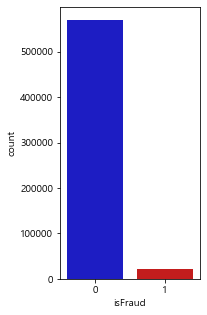

In [19]:
plt.figure(figsize=(2.5,5))

colors = ["#0101DF", "#DF0101"]

sns.countplot('isFraud', data=tr, palette=colors)

In [183]:
(np.sum(pd.isnull(trid)).sort_values(ascending=False)/len(trid))*100

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import gc,os,sys
import re

from sklearn import metrics, preprocessing
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA, KernelPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.cluster import KMeans
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

sns.set_style('darkgrid')

pd.options.display.float_format = '{:,.3f}'.format

print(os.listdir("../Modeling Project"))

['.ipynb_checkpoints', '0.963-ieee-internal-blend.ipynb', '1.png', '2.png', '2차.ipynb', '3-choose-base-model.ipynb', '3.png', '4.PNG', '5.PNG', '6.PNG', '7.PNG', 'beat-my-score.ipynb', 'CIS Fraud Detection base model lgbm.csv', 'CIS Fraud Detection base model lgbm_min.csv', 'CIS Fraud Detection base model xgboost.csv', 'CIS Fraud Detection base model xgboost_min.csv', 'data', 'ieee-cis-fraud-detection-eda-1.ipynb', 'ieee-cis-fraud-detection-eda.ipynb', 'ieee-fraud-adversarial-lgb-split-points.ipynb', 'ieee-transaction-columns-reference.ipynb', 'joined_model_submission.csv', 'joined_model_submission_min.csv', 'oof_xgb_95.csv', 'oof_xgb_96.csv', 'sample_submission.csv', 'sub_xgb_95.csv', 'sub_xgb_96.csv', 'test_identity.csv', 'test_transaction.csv', 'train_identity.csv', 'train_transaction.csv', 'Untitled.ipynb', 'Untitled5.ipynb', 'Untitled7.ipynb', 'Untitled8.ipynb', 'Untitled9.ipynb', 'xgb-fraud-with-magic-0-9600.ipynb', 'xgboost-with-smote-method.ipynb']


In [22]:
# Memory saving function credit to https://www.kaggle.com/gemartin/load-data-reduce-memory-usage
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.
    """
    start_mem = df.memory_usage().sum() / 1024**2
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        #else:
            #df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB --> {:.2f} MB (Decreased by {:.1f}%)'.format(
        start_mem, end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [23]:
train_id = pd.read_csv('train_identity.csv')
train_trn = pd.read_csv('train_transaction.csv')
test_id = pd.read_csv('test_identity.csv')
test_trn = pd.read_csv('test_transaction.csv')

In [24]:
train_id = reduce_mem_usage(train_id)
train_trn = reduce_mem_usage(train_trn)
test_id = reduce_mem_usage(test_id)
test_trn = reduce_mem_usage(test_trn)

Memory usage of dataframe is 45.12 MB --> 25.86 MB (Decreased by 42.7%)
Memory usage of dataframe is 1775.15 MB --> 542.35 MB (Decreased by 69.4%)
Memory usage of dataframe is 44.39 MB --> 25.44 MB (Decreased by 42.7%)
Memory usage of dataframe is 1519.24 MB --> 472.59 MB (Decreased by 68.9%)


- fraud transaction rate by day, and week

<AxesSubplot:xlabel='_seq_week'>

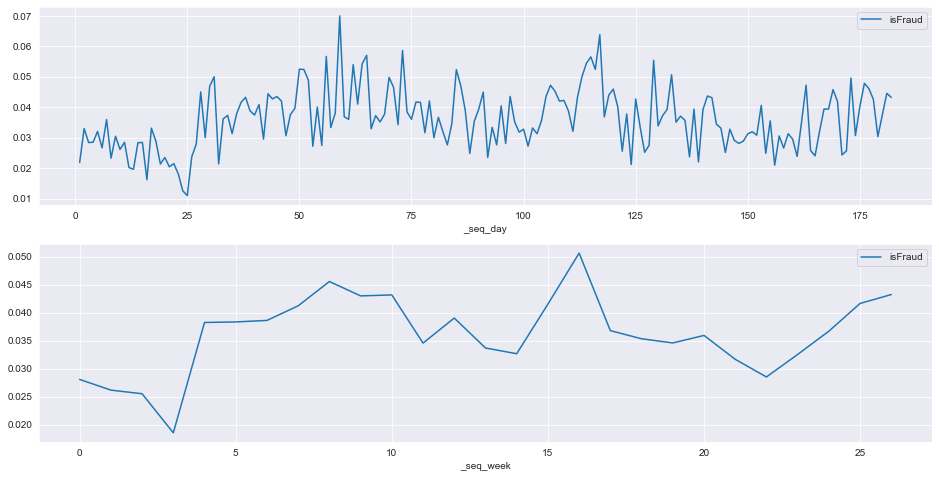

In [25]:
fig,ax = plt.subplots(2, 1, figsize=(16,8))

train_trn['_seq_day'] = train_trn['TransactionDT'] // (24*60*60)
train_trn['_seq_week'] = train_trn['_seq_day'] // 7
train_trn.groupby('_seq_day')['isFraud'].mean().to_frame().plot.line(ax=ax[0])
train_trn.groupby('_seq_week')['isFraud'].mean().to_frame().plot.line(ax=ax[1])

- fraud transaction rate by weekday, hour, month-day, and year-month

<AxesSubplot:xlabel='_year_month'>

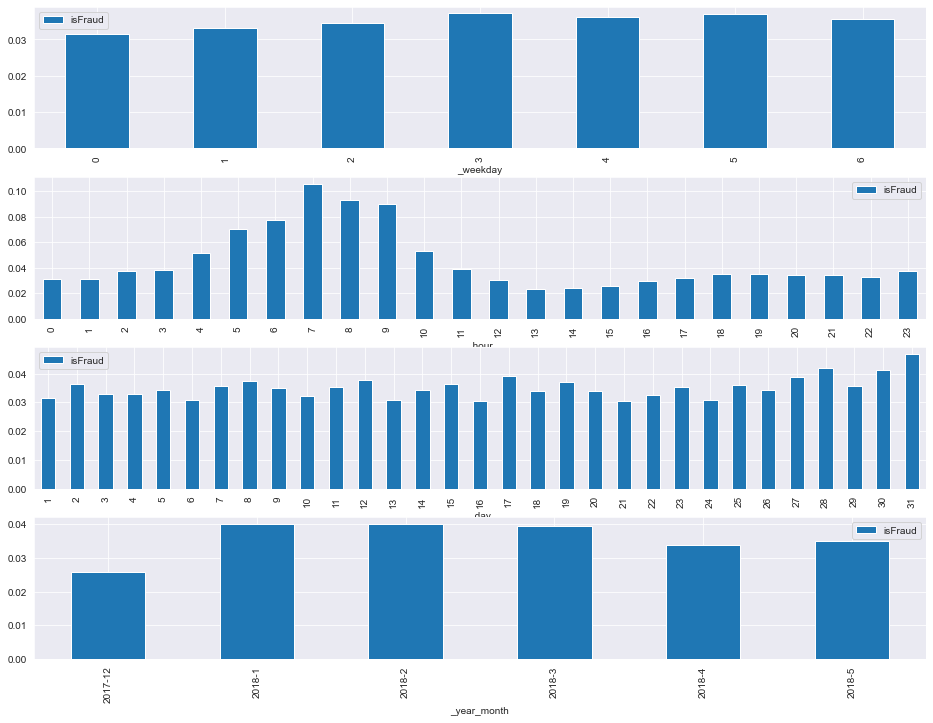

In [26]:
import datetime

START_DATE = '2017-11-30'
startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
train_trn['Date'] = train_trn['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))
train_trn['_ymd'] = train_trn['Date'].dt.year.astype(str) + '-' + train_trn['Date'].dt.month.astype(str) + '-' + train_trn['Date'].dt.day.astype(str)
train_trn['_year_month'] = train_trn['Date'].dt.year.astype(str) + '-' + train_trn['Date'].dt.month.astype(str)
train_trn['_weekday'] = train_trn['Date'].dt.dayofweek
train_trn['_hour'] = train_trn['Date'].dt.hour
train_trn['_day'] = train_trn['Date'].dt.day

fig,ax = plt.subplots(4, 1, figsize=(16,12))

train_trn.groupby('_weekday')['isFraud'].mean().to_frame().plot.bar(ax=ax[0])
train_trn.groupby('_hour')['isFraud'].mean().to_frame().plot.bar(ax=ax[1])
train_trn.groupby('_day')['isFraud'].mean().to_frame().plot.bar(ax=ax[2])
train_trn.groupby('_year_month')['isFraud'].mean().to_frame().plot.bar(ax=ax[3])

- fraud transaction rate by day

In [27]:
df = train_trn.groupby(['_ymd'])['isFraud'].agg(['count','mean','sum'])
df.sort_values(by='mean',ascending=False)[:10].T

_ymd,2018-1-28,2018-3-27,2018-2-11,2018-2-3,2018-1-25,2018-3-25,2018-4-8,2018-3-24,2018-2-2,2018-1-31
count,"2,402.000","3,042.000","2,304.000","3,209.000","2,789.000","2,461.000","2,348.000","2,758.000","4,317.000","3,057.000"
mean,0.070,0.064,0.059,0.057,0.057,0.056,0.055,0.054,0.054,0.054
sum,168.000,194.000,135.000,183.000,158.000,139.000,130.000,150.000,234.000,165.000


In [28]:
df.sort_values(by='count',ascending=False)[:10].T

_ymd,2017-12-22,2018-3-2,2017-12-24,2017-12-23,2017-12-20,2017-12-25,2017-12-21,2017-12-18,2017-12-19,2017-12-1
count,"6,852.000","6,252.000","6,065.000","5,872.000","5,749.000","5,742.000","5,677.000","5,585.000","5,526.000","5,122.000"
mean,0.021,0.024,0.013,0.018,0.023,0.011,0.020,0.029,0.021,0.022
sum,147.000,147.000,76.000,106.000,135.000,63.000,116.000,161.000,118.000,112.000


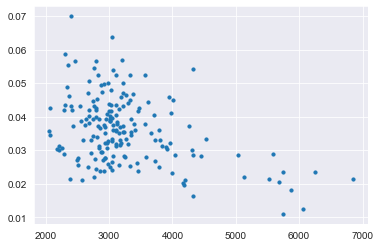

In [29]:
# transaction-count X fraud-rate
plt.scatter(df['count'], df['mean'], s=10)

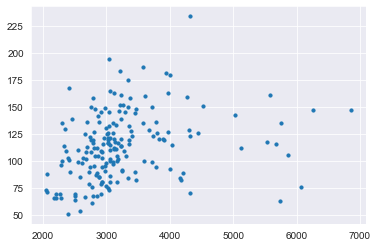

In [30]:
# transaction-count X fraud-count
plt.scatter(df['count'], df['sum'], s=10)

- fraud transaction rate by weekday-hour

<AxesSubplot:xlabel='_weekday_hour'>

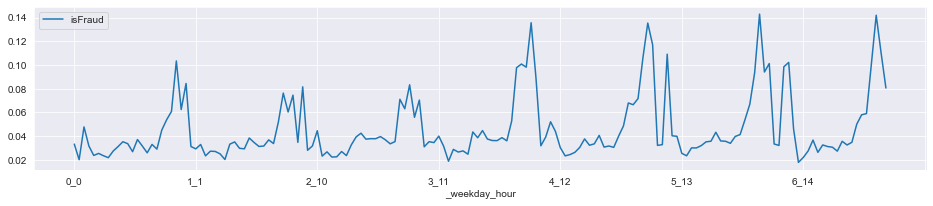

In [31]:
train_trn['_weekday_hour'] = train_trn['_weekday'].astype(str) + '_' + train_trn['_hour'].astype(str)
train_trn.groupby('_weekday_hour')['isFraud'].mean().to_frame().plot.line(figsize=(16,3))

- fraud rate by weekday 

In [32]:
df = train_trn.groupby('_weekday')['isFraud'].mean().to_frame()
df.sort_values(by='isFraud', ascending=False)

,isFraud
_weekday,
3,0.037
5,0.037
4,0.036
6,0.036
2,0.035
1,0.033
0,0.031


- fraud rate by hour 

In [33]:
df = train_trn.groupby('_hour')['isFraud'].mean().to_frame()
df.sort_values(by='isFraud', ascending=False).head(10)

,isFraud
_hour,
7,0.106
8,0.093
9,0.090
6,0.078
5,0.070
10,0.053
4,0.052
11,0.039
3,0.038


- fraud rate by weekday-hour

In [34]:
df = train_trn.groupby('_weekday_hour')['isFraud'].mean().to_frame()
df.sort_values(by='isFraud', ascending=False).head(10)

,isFraud
_weekday_hour,
5_7,0.143
6_7,0.142
3_8,0.136
4_8,0.135
4_9,0.117
6_8,0.110
5_10,0.109
4_7,0.106
0_7,0.103


- fraud rate by amount-bin

In [35]:
train_trn['_amount_qcut10'] = pd.qcut(train_trn['TransactionAmt'],10)
df = train_trn.groupby('_amount_qcut10')['isFraud'].mean().to_frame()
df.sort_values(by='isFraud', ascending=False)

,isFraud
_amount_qcut10,
"(0.25, 25.953]",0.056
"(275.25, 31936.0]",0.051
"(117.0, 160.0]",0.043
"(160.0, 275.25]",0.038
"(68.75, 100.0]",0.036
"(35.938, 49.0]",0.032
"(25.953, 35.938]",0.032
"(57.938, 68.75]",0.029
"(100.0, 117.0]",0.020


## TransactionID

In [36]:
# Not all transactions have corresponding identity information.
#len([c for c in train_trn['TransactionID'] if c not in train_id['TransactionID'].values]) #446307

# Not all fraud transactions have corresponding identity information.
fraud_id = train_trn[train_trn['isFraud'] == 1]['TransactionID']
fraud_id_in_trn = [i for i in fraud_id if i in train_id['TransactionID'].values]
print(f'fraud data count:{len(fraud_id)}, and in trn:{len(fraud_id_in_trn)}')

fraud data count:20663, and in trn:11318


## Identity data

Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions. They're collected by Vesta’s fraud protection system and digital security partners. (The field names are masked and pairwise dictionary will not be provided for privacy protection and contract agreement)

Categorical Features:

- DeviceType
- DeviceInfo
- id12 - id38

In [37]:
train_id_trn = pd.merge(train_id, train_trn[['isFraud','TransactionAmt','TransactionID']])
train_id_f0 = train_id_trn[train_id_trn['isFraud'] == 0]
train_id_f1 = train_id_trn[train_id_trn['isFraud'] == 1]
print(train_id_f0.shape, train_id_f1.shape)

def plotHistByFraud(col, bins=20, figsize=(8,3)):
    with np.errstate(invalid='ignore'):
        plt.figure(figsize=figsize)
        plt.hist([train_id_f0[col], train_id_f1[col]], bins=bins, density=True, color=['royalblue', 'orange'])
        
def plotCategoryRateBar(col, topN=np.nan, figsize=(8,3)):
    a, b = train_id_f0, train_id_f1
    if topN == topN: # isNotNan
        vals = b[col].value_counts(normalize=True).to_frame().iloc[:topN,0]
        subA = a.loc[a[col].isin(vals.index.values), col]
        df = pd.DataFrame({'normal':subA.value_counts(normalize=True), 'fraud':vals})
    else:
        df = pd.DataFrame({'normal':a[col].value_counts(normalize=True), 'fraud':b[col].value_counts(normalize=True)})
    df.sort_values('fraud', ascending=False).plot.bar(figsize=figsize)

(132915, 43) (11318, 43)


### id_01 - id_11

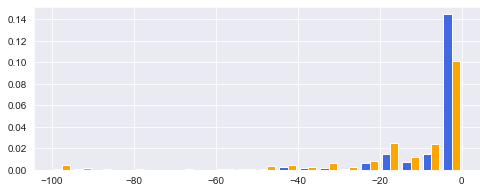

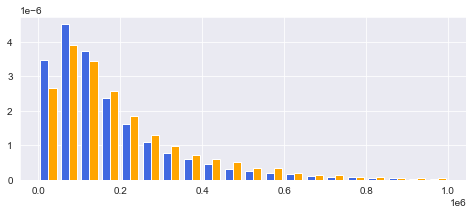

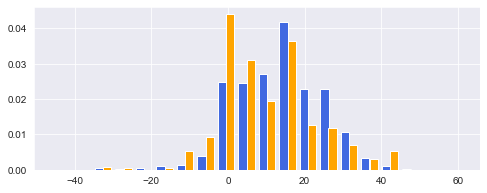

In [38]:
plotHistByFraud('id_01')
plotHistByFraud('id_02')
plotHistByFraud('id_07')

In [39]:
numid_cols = [f'id_{str(i).zfill(2)}' for i in range(1,12)]
train_id_trn[numid_cols].isna().sum().to_frame().T / len(train_id)

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11
0,0.000,0.023,0.540,0.540,0.051,0.051,0.964,0.964,0.481,0.481,0.023


<AxesSubplot:>

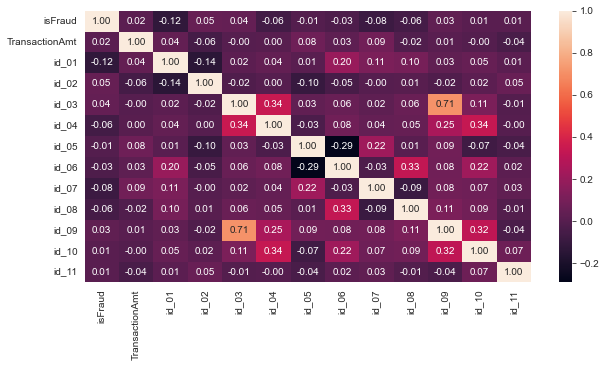

In [40]:
plt.figure(figsize=(10, 5))
sns.heatmap(train_id_trn[['isFraud','TransactionAmt']+numid_cols].corr(), annot=True, fmt='.2f')

In [41]:
train_id_f1[['isFraud'] + numid_cols].head(10)

,isFraud,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11
52,1,0.000,"169,947.000",0.000,0.000,3.000,0.000,nan,nan,0.000,0.000,100.000
53,1,0.000,"222,455.000",0.000,0.000,0.000,0.000,nan,nan,0.000,0.000,100.000
54,1,0.000,"271,870.000",0.000,0.000,3.000,0.000,nan,nan,0.000,0.000,100.000
69,1,-20.000,"258,138.000",nan,nan,0.000,-1.000,nan,nan,nan,nan,100.000
86,1,-5.000,"141,271.000",nan,nan,9.000,-81.000,nan,nan,0.000,0.000,97.562
98,1,-20.000,"550,210.000",nan,nan,0.000,-1.000,nan,nan,nan,nan,100.000
185,1,-25.000,"59,967.000",nan,nan,1.000,-12.000,nan,nan,nan,nan,100.000
201,1,-5.000,"30,602.000",nan,nan,0.000,-12.000,nan,nan,0.000,0.000,95.062
235,1,-5.000,"4,235.000",nan,nan,0.000,0.000,nan,nan,nan,nan,100.000
236,1,0.000,"36,004.000",0.000,0.000,0.000,0.000,nan,nan,0.000,0.000,100.000


In [42]:
train_id_f0[['isFraud'] + numid_cols].head(10)

,isFraud,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11
0,0,0.000,"70,787.000",nan,nan,nan,nan,nan,nan,nan,nan,100.000
1,0,-5.000,"98,945.000",nan,nan,0.000,-5.000,nan,nan,nan,nan,100.000
2,0,-5.000,"191,631.000",0.000,0.000,0.000,0.000,nan,nan,0.000,0.000,100.000
3,0,-5.000,"221,832.000",nan,nan,0.000,-6.000,nan,nan,nan,nan,100.000
4,0,0.000,"7,460.000",0.000,0.000,1.000,0.000,nan,nan,0.000,0.000,100.000
5,0,-5.000,"61,141.000",3.000,0.000,3.000,0.000,nan,nan,3.000,0.000,100.000
6,0,-15.000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
7,0,0.000,"31,964.000",0.000,0.000,0.000,-10.000,nan,nan,0.000,0.000,100.000
8,0,-10.000,"116,098.000",0.000,0.000,0.000,0.000,nan,nan,0.000,0.000,100.000
9,0,-5.000,"257,037.000",nan,nan,0.000,0.000,nan,nan,nan,nan,100.000


### id_12 - id_38

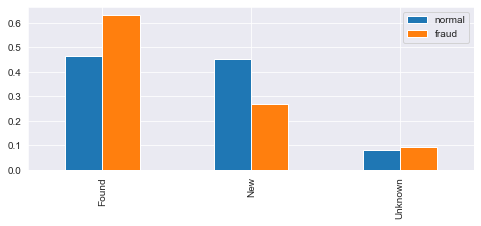

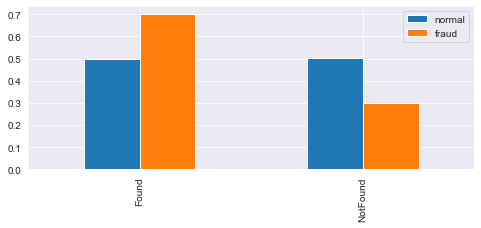

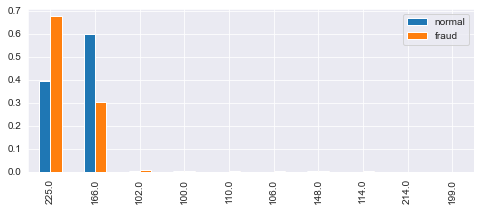

In [43]:
plotCategoryRateBar('id_15')
plotCategoryRateBar('id_16')
plotCategoryRateBar('id_17',10)

unique count: 522


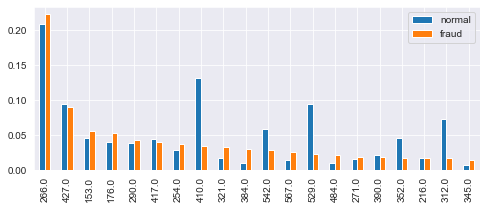

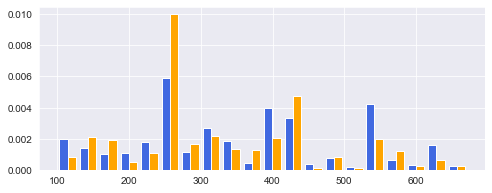

In [44]:
plotCategoryRateBar('id_19', 20)
plotHistByFraud('id_19')
print('unique count:', train_id['id_19'].nunique())

unique count: 394


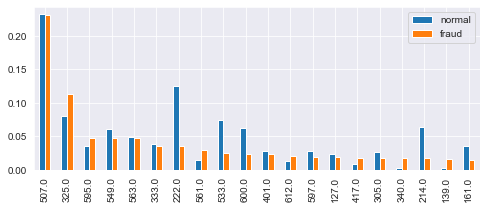

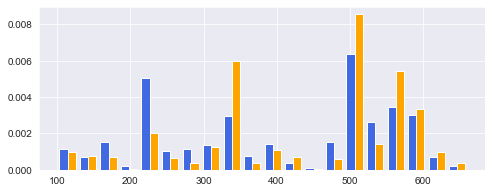

In [45]:
plotCategoryRateBar('id_20', 20)
plotHistByFraud('id_20')
print('unique count:', train_id['id_20'].nunique())

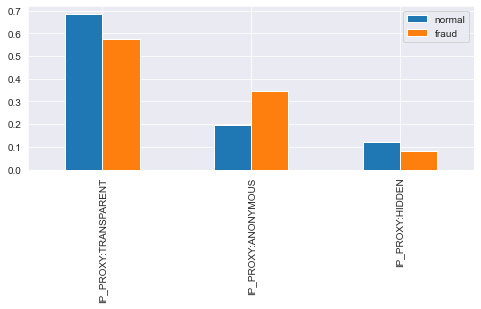

In [46]:
plotCategoryRateBar('id_23')

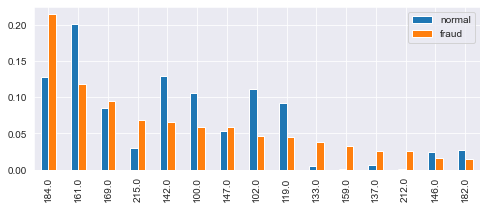

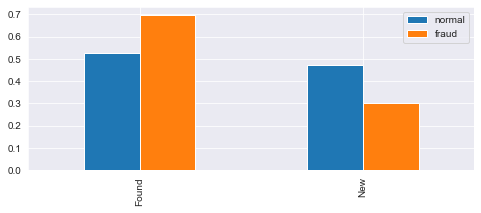

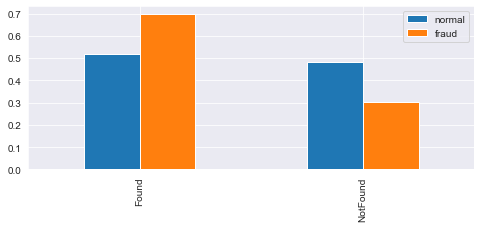

In [47]:
plotCategoryRateBar('id_26', 15)
plotCategoryRateBar('id_28')
plotCategoryRateBar('id_29')

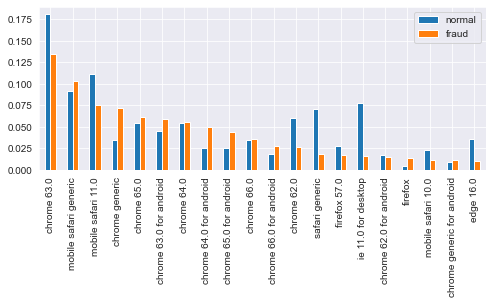

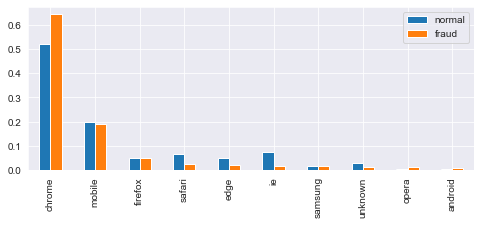

In [48]:
plotCategoryRateBar('id_31', 20)

train_id_f0['_id_31_ua'] = train_id_f0['id_31'].apply(lambda x: x.split()[0] if x == x else 'unknown')
train_id_f1['_id_31_ua'] = train_id_f1['id_31'].apply(lambda x: x.split()[0] if x == x else 'unknown')
plotCategoryRateBar('_id_31_ua', 10)

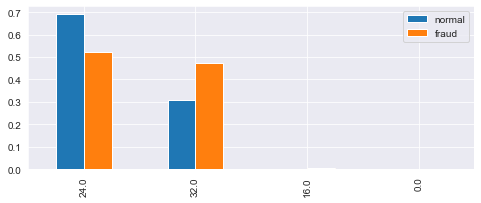

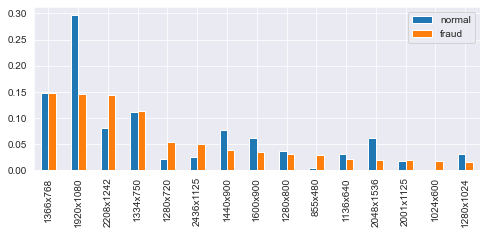

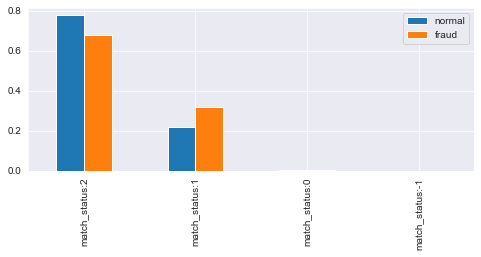

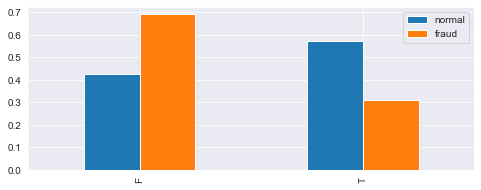

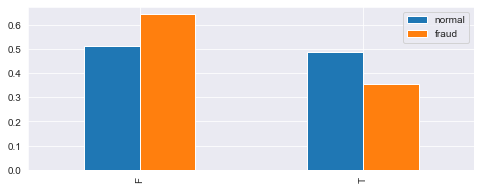

In [49]:
plotCategoryRateBar('id_32')
plotCategoryRateBar('id_33',15)
plotCategoryRateBar('id_34')
plotCategoryRateBar('id_35')
plotCategoryRateBar('id_38')

### DeviceType, DeviceInfo

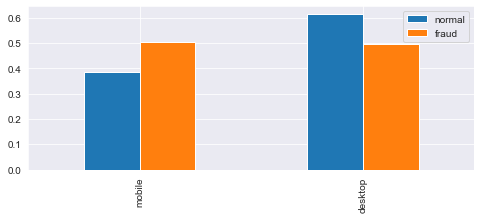

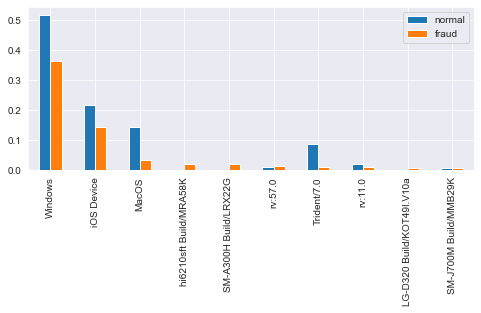

In [50]:
plotCategoryRateBar('DeviceType')
plotCategoryRateBar('DeviceInfo',10)

In [51]:
ccols = [f'C{i}' for i in range(1,15)]
dcols = [f'D{i}' for i in range(1,16)]
mcols = [f'M{i}' for i in range(1,10)]
vcols = [f'V{i}' for i in range(1,340)]

In [52]:
train_trn_f0 = train_trn[train_trn['isFraud'] == 0]
train_trn_f1 = train_trn[train_trn['isFraud'] == 1]
print(train_trn_f0.shape, train_trn_f1.shape)

def plotTrnHistByFraud(col, bins=20, figsize=(8,3)):
    with np.errstate(invalid='ignore'):
        plt.figure(figsize=figsize)
        plt.hist([train_trn_f0[col], train_trn_f1[col]], bins=bins, density=True, color=['royalblue', 'orange'])

def plotTrnLogHistByFraud(col, bins=20, figsize=(8,3)):
    with np.errstate(invalid='ignore'):
        plt.figure(figsize=figsize)
        plt.hist([np.log1p(train_trn_f0[col]), np.log1p(train_trn_f1[col])], bins=bins, density=True, color=['royalblue', 'orange'])
        
def plotTrnCategoryRateBar(col, topN=np.nan, figsize=(8,3)):
    a, b = train_trn_f0, train_trn_f1
    if topN == topN: # isNotNan
        vals = b[col].value_counts(normalize=True).to_frame().iloc[:topN,0]
        subA = a.loc[a[col].isin(vals.index.values), col]
        df = pd.DataFrame({'normal':subA.value_counts(normalize=True), 'fraud':vals})
    else:
        df = pd.DataFrame({'normal':a[col].value_counts(normalize=True), 'fraud':b[col].value_counts(normalize=True)})
    df.sort_values('fraud', ascending=False).plot.bar(figsize=figsize)

(569877, 404) (20663, 404)


## TransactionDT

In [53]:
#START_DATE = '2017-11-30'
START_DATE = '2017-12-01'
startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")

train_date = train_trn['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))
test_date = test_trn['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))

print('train date:', train_date.min(), '-', train_date.max())
print('test  date:', test_date.min(), '-', test_date.max())

train date: 2017-12-02 00:00:00 - 2018-06-01 23:58:51
test  date: 2018-07-02 00:00:24 - 2018-12-31 23:59:05


<AxesSubplot:>

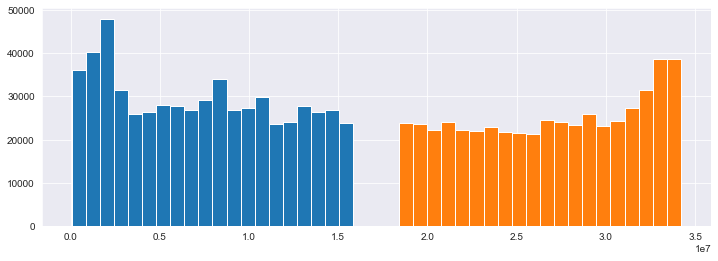

In [54]:
plt.figure(figsize=(12,4))
train_trn['TransactionDT'].hist(bins=20)
test_trn['TransactionDT'].hist(bins=20)

In [55]:
def appendLagDT(df):
    df = df.assign(_date_lag = df['TransactionDT'] - df.groupby(['card1','card2'])['TransactionDT'].shift(1))
    return df

train_trn = appendLagDT(train_trn)
train_trn_f0 = train_trn[train_trn['isFraud'] == 0]
train_trn_f1 = train_trn[train_trn['isFraud'] == 1]

In [56]:
pd.concat([train_trn_f0['_date_lag'].describe(), 
           train_trn_f1['_date_lag'].describe()], axis=1)

,_date_lag,_date_lag
count,"548,219.000","19,898.000"
mean,"171,647.294","122,550.929"
std,"707,372.753","649,306.365"
min,0.000,0.000
25%,"1,004.000",423.000
50%,"6,010.000","3,511.000"
75%,"59,342.000","29,619.500"
max,"15,599,674.000","14,447,608.000"


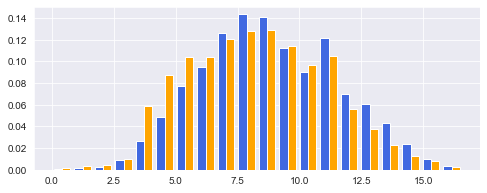

In [57]:
plotTrnLogHistByFraud('_date_lag')

## TransactionAmt

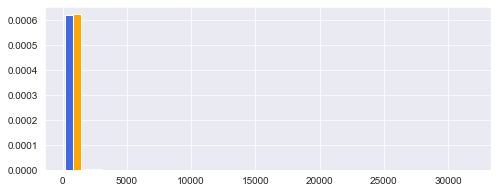

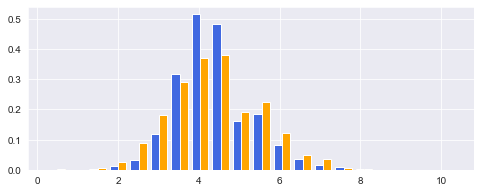

In [58]:
plotTrnHistByFraud('TransactionAmt')
plotTrnLogHistByFraud('TransactionAmt')

In [59]:
amt_desc = pd.concat([train_trn_f0['TransactionAmt'].describe(), train_trn_f1['TransactionAmt'].describe()], axis=1)
amt_desc.columns = ['normal','fraud']
amt_desc

,normal,fraud
count,"569,877.000","20,663.000"
mean,nan,inf
std,nan,inf
min,0.251,0.292
25%,43.969,35.031
50%,68.500,75.000
75%,120.000,161.000
max,"31,936.000","5,192.000"


In [60]:
def appendLagAmt(df):
    df = df.assign(_amt_lag = df['TransactionAmt'] - df.groupby(['card1','card2'])['TransactionAmt'].shift(1))
    df['_amt_lag_sig'] = df['_amt_lag'].apply(lambda x: '0' if np.isnan(x) else '+' if x >=0 else '-')
    return df

train_trn = appendLagAmt(train_trn)
train_trn_f0 = train_trn[train_trn['isFraud'] == 0]
train_trn_f1 = train_trn[train_trn['isFraud'] == 1]

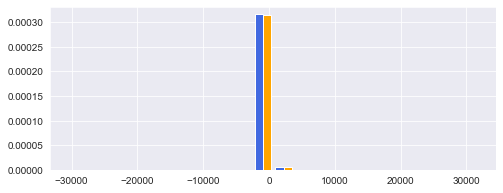

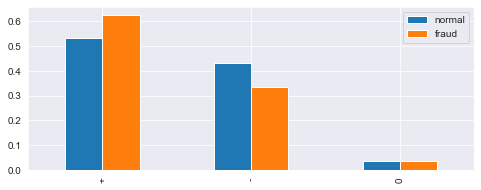

In [61]:
plotTrnHistByFraud('_amt_lag')
plotTrnCategoryRateBar('_amt_lag_sig')

## ProductCD

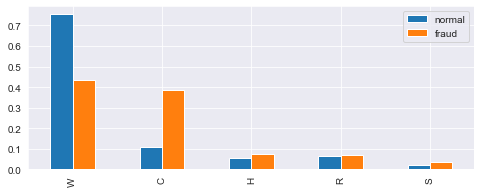

In [62]:
plotTrnCategoryRateBar('ProductCD')

In [63]:
cols = ['ProductCD','addr1','addr2','dist1','dist2']
train_trn[cols].head(20)

,ProductCD,addr1,addr2,dist1,dist2
0,W,315.000,87.000,19.000,nan
1,W,325.000,87.000,nan,nan
2,W,330.000,87.000,287.000,nan
3,W,476.000,87.000,nan,nan
4,H,420.000,87.000,nan,nan
5,W,272.000,87.000,36.000,nan
6,W,126.000,87.000,0.000,nan
7,W,325.000,87.000,nan,nan
8,H,337.000,87.000,nan,nan
9,W,204.000,87.000,19.000,nan


In [64]:
cols = ['addr1','addr2','dist1','dist2']
for f in cols:
    train_trn[f + '_isna'] = train_trn[f].isna()

In [65]:
pd.crosstab(train_trn['ProductCD'], train_trn['addr1_isna'])

addr1_isna,False,True
ProductCD,,
C,3400,65119
H,32940,84
R,37649,50
S,11419,209
W,439426,244


In [66]:
pd.crosstab(train_trn['ProductCD'], train_trn['dist1_isna'])

dist1_isna,False,True
ProductCD,,
C,0,68519
H,0,33024
R,0,37699
S,0,11628
W,238269,201401


In [67]:
pd.crosstab(train_trn['ProductCD'], train_trn['dist2_isna'])

dist2_isna,False,True
ProductCD,,
C,26741,41778
H,901,32123
R,5524,32175
S,4461,7167
W,0,439670


In [68]:
train_trn[(train_trn['dist1_isna'] == False) & (train_trn['dist2_isna'] == False)][cols]

,addr1,addr2,dist1,dist2


In [69]:
train_trn = pd.concat([train_trn, pd.get_dummies(train_trn[['ProductCD']])], axis=1)
train_trn.head(5)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,_amt_lag_sig,addr1_isna,addr2_isna,dist1_isna,dist2_isna,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W
0,2987000,0,86400,68.500,W,13926,nan,150.000,discover,142.000,...,0,False,False,False,True,0,0,0,0,1
1,2987001,0,86401,29.000,W,2755,404.000,150.000,mastercard,102.000,...,0,False,False,True,True,0,0,0,0,1
2,2987002,0,86469,59.000,W,4663,490.000,150.000,visa,166.000,...,0,False,False,False,True,0,0,0,0,1
3,2987003,0,86499,50.000,W,18132,567.000,150.000,mastercard,117.000,...,0,False,False,True,True,0,0,0,0,1
4,2987004,0,86506,50.000,H,4497,514.000,150.000,mastercard,102.000,...,0,False,False,True,True,0,1,0,0,0


In [70]:
cols = ['ProductCD_W','ProductCD_C','ProductCD_H','ProductCD_R','ProductCD_S','dist1_isna','dist2_isna','addr1_isna','addr2_isna']
train_trn[cols].corr()

,ProductCD_W,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,dist1_isna,dist2_isna,addr1_isna,addr2_isna
ProductCD_W,1.000,-0.618,-0.415,-0.446,-0.242,-0.482,0.445,-0.601,-0.601
ProductCD_C,-0.618,1.000,-0.088,-0.095,-0.051,0.298,-0.484,0.967,0.967
ProductCD_H,-0.415,-0.088,1.000,-0.064,-0.034,0.200,0.036,-0.084,-0.084
ProductCD_R,-0.446,-0.095,-0.064,1.000,-0.037,0.215,-0.089,-0.091,-0.091
ProductCD_S,-0.242,-0.051,-0.034,-0.037,1.000,0.117,-0.186,-0.042,-0.042
dist1_isna,-0.482,0.298,0.200,0.215,0.117,1.000,-0.215,0.290,0.290
dist2_isna,0.445,-0.484,0.036,-0.089,-0.186,-0.215,1.000,-0.462,-0.462
addr1_isna,-0.601,0.967,-0.084,-0.091,-0.042,0.290,-0.462,1.000,1.000
addr2_isna,-0.601,0.967,-0.084,-0.091,-0.042,0.290,-0.462,1.000,1.000


In [71]:
train_trn['_amount_max_ProductCD'] = train_trn.groupby(['ProductCD'])['TransactionAmt'].transform('max')
train_trn[['ProductCD','_amount_max_ProductCD']].drop_duplicates().sort_values(by='_amount_max_ProductCD', ascending=False)

,ProductCD,_amount_max_ProductCD
0,W,"31,936.000"
99,R,"1,800.000"
38,S,"1,550.000"
10,C,713.000
4,H,500.000


## card1 - card6

In [72]:
cols = [f'card{n}' for n in range(1,7)]
train_trn[cols].isnull().sum()

card1       0
card2    8933
card3    1565
card4    1577
card5    4259
card6    1571
dtype: int64

In [73]:
train_trn[cols].nunique()

card1    13553
card2      500
card3      114
card4        4
card5      119
card6        4
dtype: int64

In [74]:
train_trn[cols].head(10)

,card1,card2,card3,card4,card5,card6
0,13926,nan,150.000,discover,142.000,credit
1,2755,404.000,150.000,mastercard,102.000,credit
2,4663,490.000,150.000,visa,166.000,debit
3,18132,567.000,150.000,mastercard,117.000,debit
4,4497,514.000,150.000,mastercard,102.000,credit
5,5937,555.000,150.000,visa,226.000,debit
6,12308,360.000,150.000,visa,166.000,debit
7,12695,490.000,150.000,visa,226.000,debit
8,2803,100.000,150.000,visa,226.000,debit
9,17399,111.000,150.000,mastercard,224.000,debit


<AxesSubplot:>

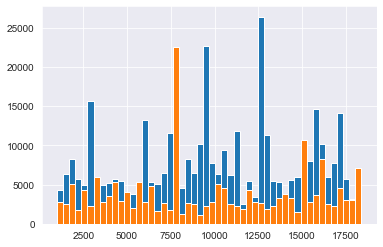

In [75]:
train_trn[train_trn['card4']=='visa']['card1'].hist(bins=50)
train_trn[train_trn['card4']=='mastercard']['card1'].hist(bins=50)

<AxesSubplot:>

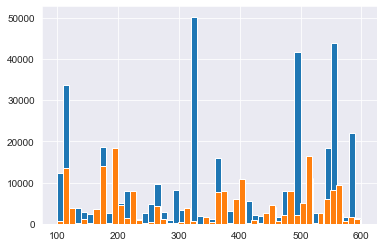

In [76]:
train_trn[train_trn['card4']=='visa']['card2'].hist(bins=50)
train_trn[train_trn['card4']=='mastercard']['card2'].hist(bins=50)

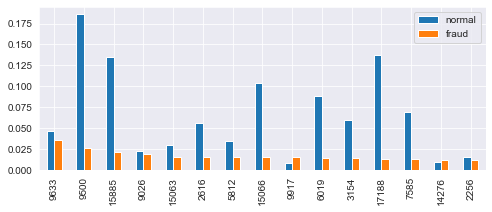

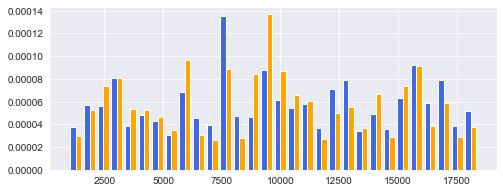

In [77]:
plotTrnCategoryRateBar('card1', 15)
plotTrnHistByFraud('card1', bins=30)

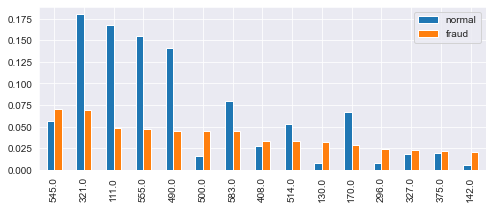

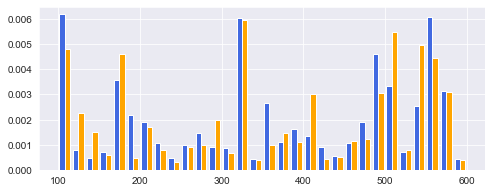

In [78]:
plotTrnCategoryRateBar('card2', 15)
plotTrnHistByFraud('card2', bins=30)

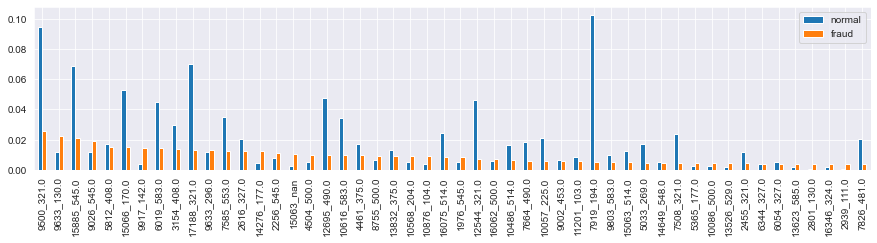

In [79]:
train_trn_f0['_card1_card2'] = train_trn_f0['card1'].astype(str) + '_' + train_trn_f0['card2'].astype(str)
train_trn_f1['_card1_card2'] = train_trn_f1['card1'].astype(str) + '_' + train_trn_f1['card2'].astype(str)

plotTrnCategoryRateBar('_card1_card2', 50, figsize=(15,3))

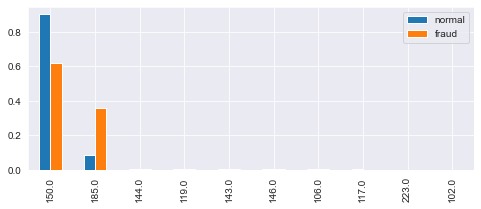

In [80]:
plotTrnCategoryRateBar('card3', 10)

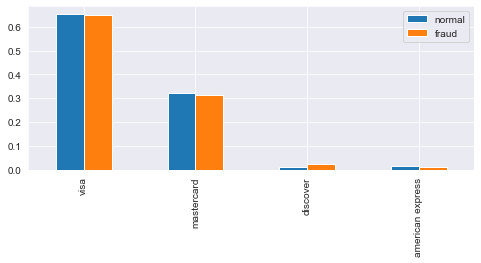

In [81]:
plotTrnCategoryRateBar('card4')

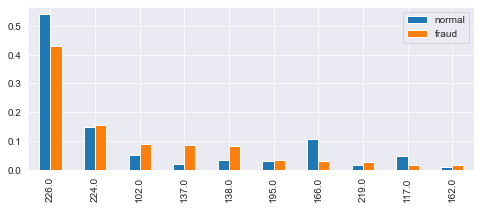

In [82]:
plotTrnCategoryRateBar('card5', 10)

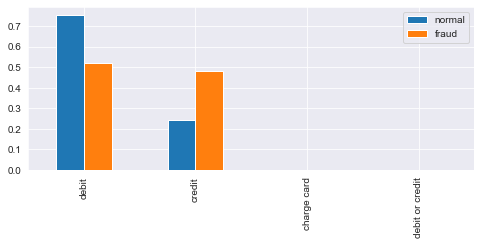

In [83]:
plotTrnCategoryRateBar('card6')

In [84]:
print(len(train_trn))
print(train_trn['card1'].nunique(), train_trn['card2'].nunique(), train_trn['card3'].nunique(), train_trn['card5'].nunique())

train_trn['card_n'] = (train_trn['card1'].astype(str) + '_' + train_trn['card2'].astype(str) \
       + '_' + train_trn['card3'].astype(str) + '_' + train_trn['card5'].astype(str))
print('unique cards:', train_trn['card_n'].nunique())

590540
13553 500 114 119
unique cards: 14845


<AxesSubplot:>

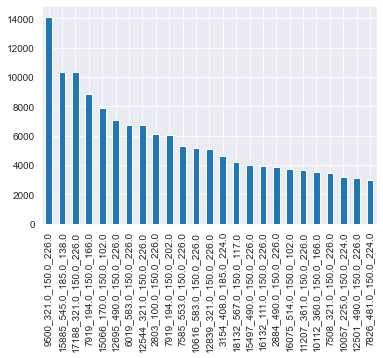

In [85]:
vc = train_trn['card_n'].value_counts()
vc[vc > 3000].plot.bar()

In [86]:
train_trn.groupby(['card_n'])['isFraud'].mean().sort_values(ascending=False)

card_n
4774_555.0_150.0_226.0    1.000
5848_555.0_223.0_226.0    1.000
1509_555.0_150.0_226.0    1.000
6314_555.0_182.0_102.0    1.000
14770_142.0_185.0_224.0   1.000
                           ... 
3783_225.0_150.0_224.0    0.000
3781_369.0_150.0_102.0    0.000
3779_555.0_150.0_226.0    0.000
3776_512.0_150.0_117.0    0.000
10000_111.0_150.0_117.0   0.000
Name: isFraud, Length: 14845, dtype: float64

## addr1, addr2

In [87]:
train_trn['addr1'].nunique(), train_trn['addr2'].nunique()

(332, 74)

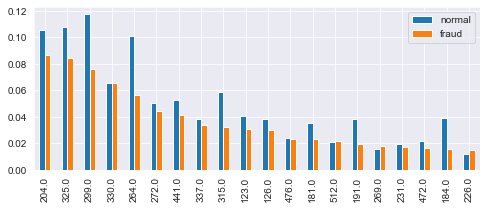

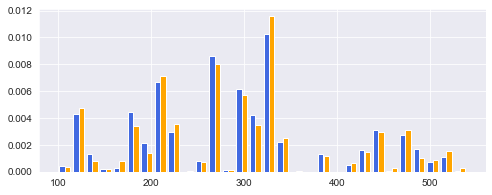

In [88]:
plotTrnCategoryRateBar('addr1', 20)
plotTrnHistByFraud('addr1', bins=30)

In [89]:
train_trn['addr1'].value_counts(dropna=False).to_frame().iloc[:10]

,addr1
nan,65706
299.000,46335
325.000,42751
204.000,42020
264.000,39870
330.000,26287
315.000,23078
441.000,20827
272.000,20141
123.000,16105


addr2 nunique: 74


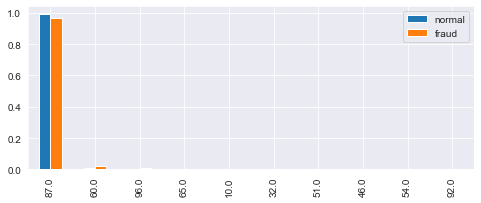

In [90]:
plotTrnCategoryRateBar('addr2', 10)
print('addr2 nunique:', train_trn['addr2'].nunique())

In [91]:
train_trn['addr2'].value_counts(dropna=False).to_frame().iloc[:10]

,addr2
87.000,520481
nan,65706
60.000,3084
96.000,638
32.000,91
65.000,82
16.000,55
31.000,47
19.000,33
26.000,25


## dist1, dist2

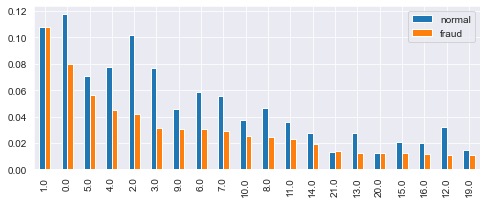

In [92]:
plotTrnCategoryRateBar('dist1', 20)

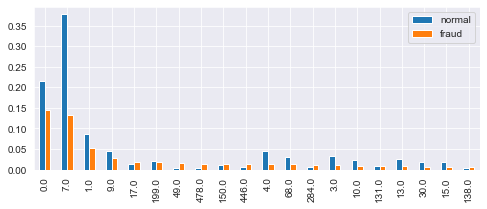

In [93]:
plotTrnCategoryRateBar('dist2', 20)

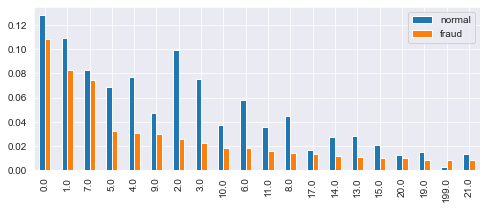

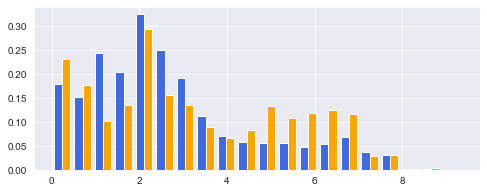

In [94]:
train_trn_f0['dist3'] = np.where(train_trn_f0['dist1'].isna(), train_trn_f0['dist2'], train_trn_f0['dist1'])
train_trn_f1['dist3'] = np.where(train_trn_f1['dist1'].isna(), train_trn_f1['dist2'], train_trn_f1['dist1'])

plotTrnCategoryRateBar('dist3', 20)
plotTrnLogHistByFraud('dist3')

## P_emaildomain, R_emaildomain

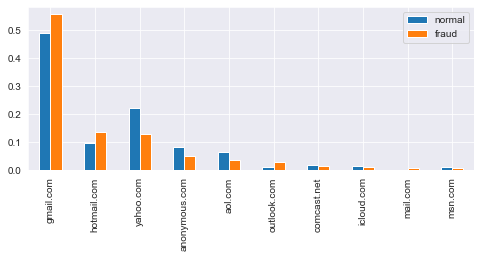

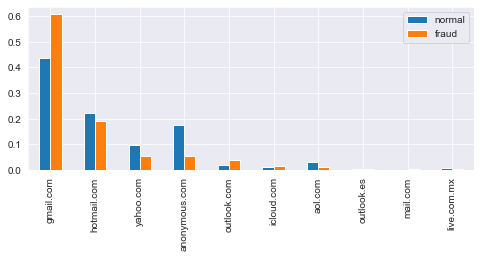

In [95]:
plotTrnCategoryRateBar('P_emaildomain',10)
plotTrnCategoryRateBar('R_emaildomain',10)

In [96]:
train_trn['P_emaildomain'].fillna('unknown',inplace=True)
train_trn['R_emaildomain'].fillna('unknown',inplace=True)

inf = pd.DataFrame([], columns=['P_emaildomain','R_emaildomain','Count','isFraud'])
for n in (train_trn['P_emaildomain'] + ' ' + train_trn['R_emaildomain']).unique():
    p, r = n.split()[0], n.split()[1]
    df = train_trn[(train_trn['P_emaildomain'] == p) & (train_trn['R_emaildomain'] == r)]
    inf = inf.append(pd.DataFrame([p, r, len(df), df['isFraud'].mean()], index=inf.columns).T)

inf.sort_values(by='isFraud', ascending=False).head(10)

,P_emaildomain,R_emaildomain,Count,isFraud
0,yahoo.com,mail.com,1,1.000
0,anonymous.com,protonmail.com,2,1.000
0,aol.com,mail.com,3,1.000
0,unknown,protonmail.com,6,1.000
0,protonmail.com,gmail.com,4,1.000
0,protonmail.com,protonmail.com,23,1.000
0,yahoo.com,protonmail.com,1,1.000
0,gmail.com,protonmail.com,6,0.833
0,mail.com,hotmail.com,4,0.750
0,aol.com,protonmail.com,3,0.667


In [97]:
train_trn_f1['P_emaildomain_prefix'] = train_trn_f1['P_emaildomain'].fillna('unknown').apply(lambda x: x.split('.')[0])
pd.crosstab(train_trn_f1['P_emaildomain_prefix'], train_trn_f1['ProductCD']).T

P_emaildomain_prefix,aim,anonymous,aol,att,bellsouth,cableone,charter,comcast,cox,earthlink,...,protonmail,roadrunner,rocketmail,sbcglobal,sc,suddenlink,unknown,verizon,yahoo,ymail
ProductCD,,,,,,,,,,,,,,,,,,,,,
C,0,366,6,0,0,0,0,0,0,0,...,2,0,0,0,0,0,311,0,124,0
H,0,143,42,0,2,0,0,32,0,6,...,16,0,0,2,0,4,0,2,179,9
R,1,122,34,0,7,0,3,10,4,0,...,10,0,0,1,0,0,2,7,218,3
S,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,686,0,0,0
W,39,228,535,30,44,3,22,204,25,5,...,3,3,2,9,1,0,1791,13,1799,38


<AxesSubplot:ylabel='P_emaildomain_prefix'>

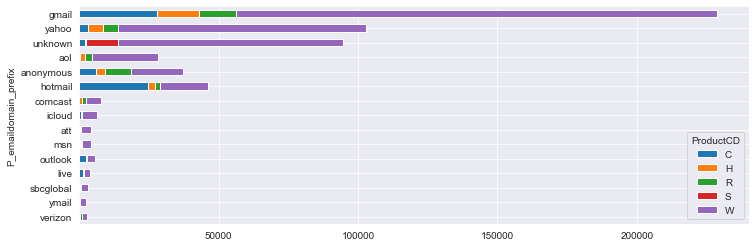

In [98]:
train_trn['P_emaildomain_prefix'] = train_trn['P_emaildomain'].apply(lambda x: x.split('.')[0])
ct = pd.crosstab(train_trn['P_emaildomain_prefix'], train_trn['ProductCD'])
ct = ct.sort_values(by='W')[-15:]
ct.plot.barh(stacked=True, figsize=(12,4))

## C1 - C14

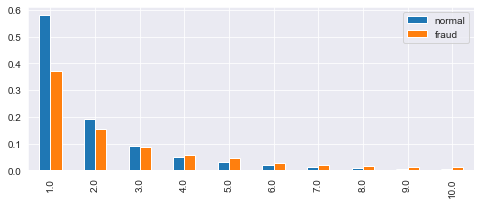

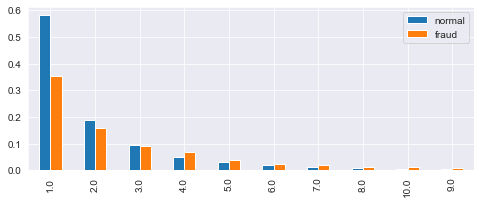

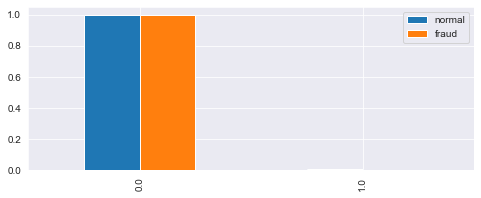

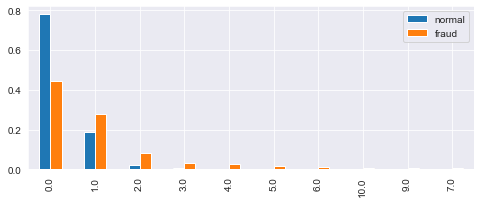

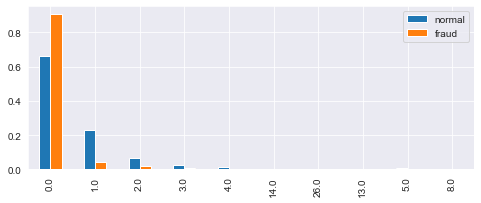

...

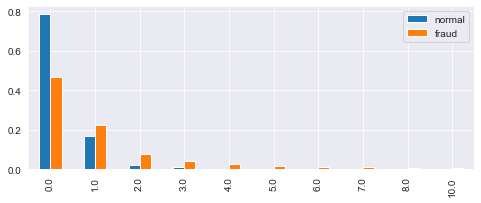

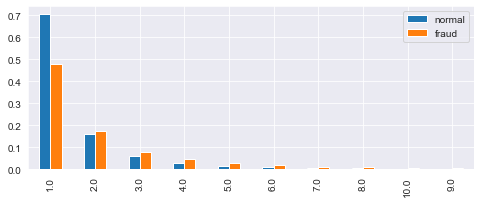

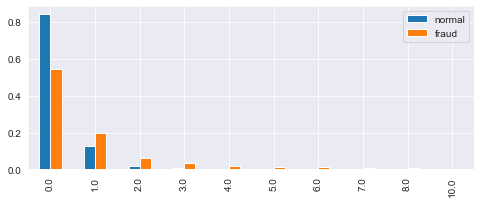

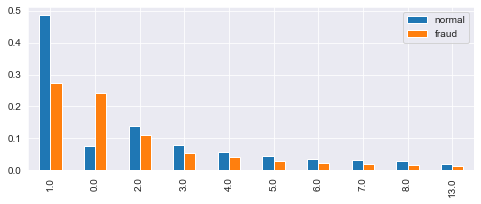

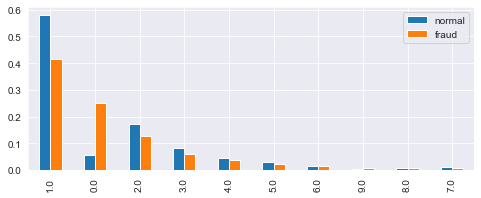

In [99]:
for i in range(1,15):
    plotTrnCategoryRateBar(f'C{i}',10)

In [100]:
train_trn[ccols].describe().loc[['count','mean','std','min','max']]

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,"590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000","590,540.000"
mean,nan,nan,0.006,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
std,nan,nan,0.151,nan,nan,nan,nan,nan,0.000,nan,nan,nan,nan,nan
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
max,"4,684.000","5,692.000",26.000,"2,252.000",349.000,"2,252.000","2,256.000","3,332.000",210.000,"3,256.000","3,188.000","3,188.000","2,918.000","1,429.000"


<AxesSubplot:>

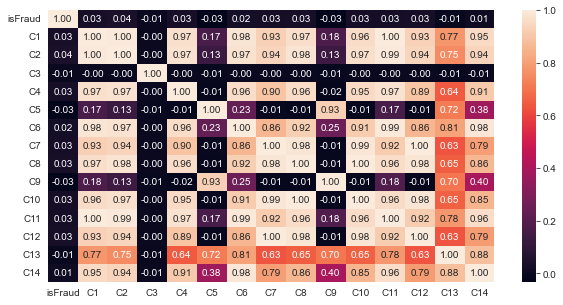

In [101]:
plt.figure(figsize=(10,5))

corr = train_trn[['isFraud'] + ccols].corr()
sns.heatmap(corr, annot=True, fmt='.2f')

- Cx & card

In [102]:
cols = ['TransactionDT','TransactionAmt','isFraud'] + ccols
train_trn[train_trn['card1'] == 9500][cols].head(20)

,TransactionDT,TransactionAmt,isFraud,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
107,88258,226.000,0,3.000,3.000,0.000,0.000,0.000,2.000,0.000,0.000,1.000,0.000,2.000,0.000,8.000,2.000
122,88538,80.000,0,21.000,25.000,0.000,0.000,33.000,22.000,0.000,0.000,17.000,0.000,19.000,0.000,99.000,18.000
161,89085,107.938,0,1.000,1.000,0.000,0.000,4.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,5.000,1.000
174,89250,107.938,0,3.000,3.000,0.000,0.000,7.000,1.000,0.000,0.000,2.000,0.000,2.000,0.000,31.000,3.000
225,89969,43.000,0,2.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,2.000,0.000,1.000,0.000,7.000,2.000
255,90440,54.000,0,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000
332,91758,100.000,0,1.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000
335,91804,100.000,0,1.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000
336,91824,100.000,0,1.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000
338,91884,100.000,0,1.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000


In [103]:
cols = ['TransactionDT','TransactionAmt','isFraud'] + ccols
train_trn[train_trn['card1'] == 4774][cols].head(20)

,TransactionDT,TransactionAmt,isFraud,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
389687,9766493,445.000,1,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000
393954,9906065,445.000,1,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000
393970,9906367,445.000,1,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000
394352,9913683,445.000,1,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000
394372,9913975,445.000,1,1.000,1.000,0.000,0.000,0.000,2.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000
394375,9914050,426.000,1,1.000,1.000,0.000,0.000,0.000,2.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000


In [104]:
train_trn[train_trn['card1'] == 14770][cols].head(20)

,TransactionDT,TransactionAmt,isFraud,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
78089,1706422,64.688,1,1.000,1.000,0.000,1.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,1.000,1.000,1.000
78134,1706831,64.688,1,1.000,2.000,0.000,1.000,0.000,1.000,1.000,1.000,0.000,1.000,2.000,2.000,1.000,1.000


## D1-D15

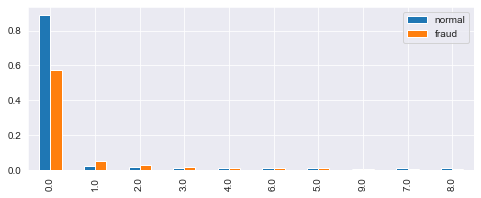

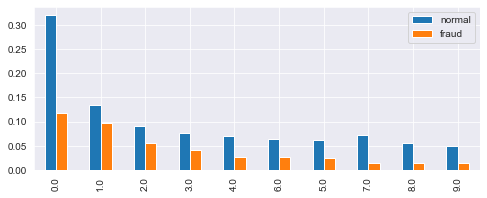

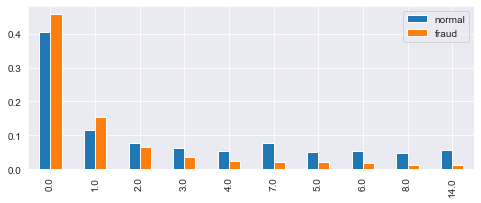

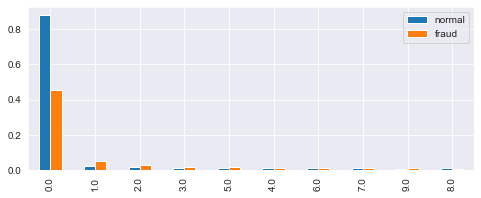

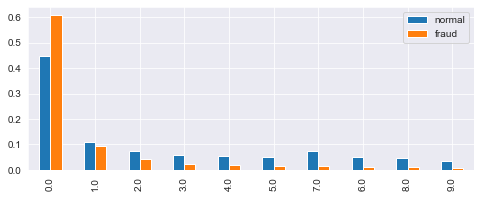

...

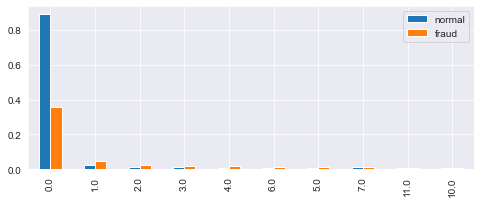

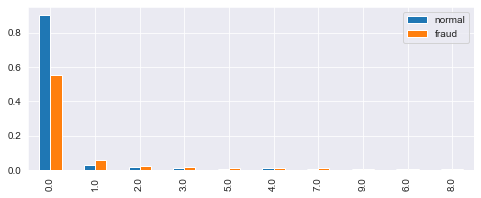

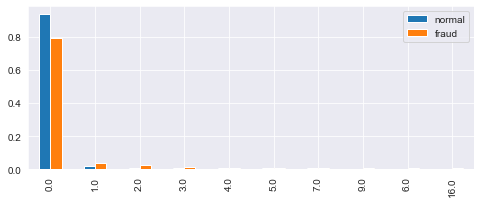

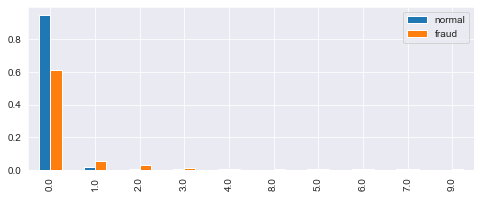

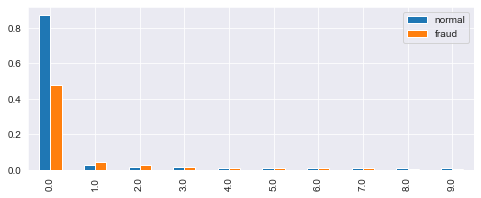

In [105]:
for i in range(1,16):
    plotTrnCategoryRateBar(f'D{i}',10)

In [106]:
train_trn[dcols].describe().loc[['count','mean','std','min','max']]

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
count,"589,271.000","309,743.000","327,662.000","421,618.000","280,699.000","73,187.000","38,917.000","74,926.000","74,926.000","514,518.000","311,253.000","64,717.000","61,952.000","62,187.000","501,427.000"
mean,nan,nan,nan,nan,nan,nan,inf,nan,0.560,nan,nan,inf,inf,inf,nan
std,nan,nan,nan,nan,nan,nan,inf,nan,0.317,nan,nan,inf,inf,inf,nan
min,0.000,0.000,0.000,-122.000,0.000,-83.000,0.000,0.000,0.000,0.000,-53.000,-83.000,0.000,-193.000,-83.000
max,640.000,640.000,819.000,869.000,819.000,873.000,843.000,"1,708.000",0.958,876.000,670.000,648.000,847.000,878.000,879.000


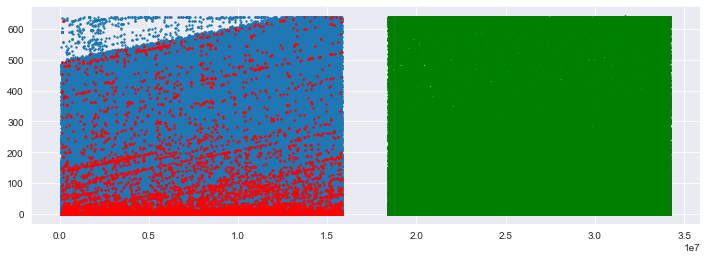

In [107]:
plt.figure(figsize=(12,4))

plt.scatter(train_trn_f0['TransactionDT'], train_trn_f0['D1'], s=2)
plt.scatter(train_trn_f1['TransactionDT'], train_trn_f1['D1'], s=2, c='r')
plt.scatter(test_trn['TransactionDT'], test_trn['D1'], s=2, c='g')

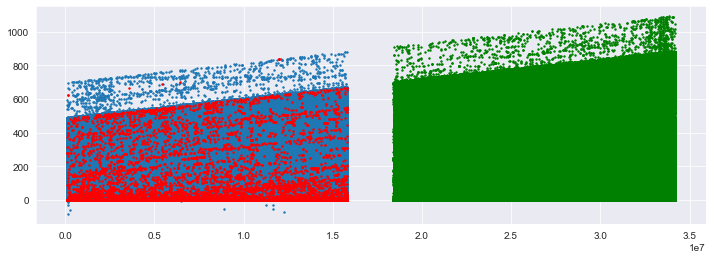

In [108]:
plt.figure(figsize=(12,4))

# ref. https://www.kaggle.com/kyakovlev/ieee-columns-scaling
plt.scatter(train_trn_f0['TransactionDT'], train_trn_f0['D15'], s=2)
plt.scatter(train_trn_f1['TransactionDT'], train_trn_f1['D15'], s=2, c='r')
plt.scatter(test_trn['TransactionDT'], test_trn['D15'], s=2, c='g')

<AxesSubplot:>

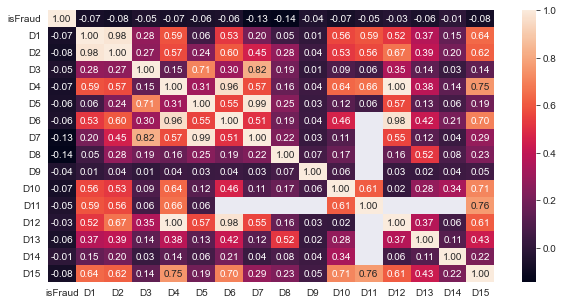

In [109]:
plt.figure(figsize=(10,5))

corr = train_trn[['isFraud'] + dcols].corr()
sns.heatmap(corr, annot=True, fmt='.2f')

array([<AxesSubplot:title={'center':'0'}>], dtype=object)

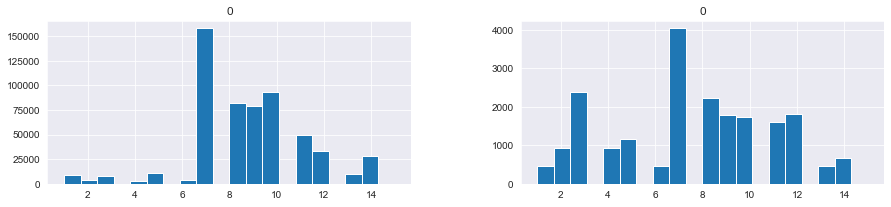

In [110]:
fig, ax = plt.subplots(1, 2, figsize=(15, 3))
train_trn.loc[train_trn['isFraud']==0, dcols].isnull().sum(axis=1).to_frame().hist(ax=ax[0], bins=20)
train_trn.loc[train_trn['isFraud']==1, dcols].isnull().sum(axis=1).to_frame().hist(ax=ax[1], bins=20)

- Dx & card

In [111]:
cols = ['TransactionDT','TransactionAmt','isFraud'] + dcols
train_trn[train_trn['card1'] == 9500][cols].head(20)

,TransactionDT,TransactionAmt,isFraud,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
107,88258,226.000,0,119.000,119.000,28.000,327.000,28.000,nan,nan,nan,nan,327.000,226.000,nan,nan,nan,327.000
122,88538,80.000,0,416.000,416.000,39.000,nan,nan,nan,nan,nan,nan,0.000,343.000,nan,nan,nan,416.000
161,89085,107.938,0,125.000,125.000,59.000,124.000,59.000,nan,nan,nan,nan,124.000,nan,nan,nan,nan,124.000
174,89250,107.938,0,60.000,60.000,15.000,413.000,15.000,nan,nan,nan,nan,15.000,276.000,nan,nan,nan,413.000
225,89969,43.000,0,86.000,86.000,4.000,299.000,4.000,nan,nan,nan,nan,299.000,nan,nan,nan,nan,299.000
255,90440,54.000,0,0.000,nan,nan,0.000,nan,nan,nan,nan,nan,0.000,0.000,nan,nan,nan,0.000
332,91758,100.000,0,0.000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
335,91804,100.000,0,0.000,nan,nan,nan,nan,nan,nan,0.042,0.042,nan,nan,nan,nan,nan,nan
336,91824,100.000,0,0.000,nan,nan,nan,nan,nan,nan,0.042,0.042,nan,nan,nan,nan,nan,nan
338,91884,100.000,0,0.000,nan,nan,nan,nan,nan,nan,0.042,0.042,nan,nan,nan,nan,nan,nan


In [112]:
cols = ['TransactionDT','TransactionAmt','isFraud'] + dcols
train_trn[train_trn['card1'] == 4774][cols].head(20)

,TransactionDT,TransactionAmt,isFraud,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
389687,9766493,445.000,1,0.000,nan,nan,0.000,nan,nan,nan,nan,nan,0.000,0.000,nan,nan,nan,0.000
393954,9906065,445.000,1,1.000,1.000,2.000,2.000,2.000,nan,nan,nan,nan,2.000,2.000,nan,nan,nan,2.000
393970,9906367,445.000,1,1.000,1.000,0.000,2.000,0.000,nan,nan,nan,nan,2.000,2.000,nan,nan,nan,2.000
394352,9913683,445.000,1,1.000,1.000,0.000,2.000,0.000,nan,nan,nan,nan,2.000,2.000,nan,nan,nan,2.000
394372,9913975,445.000,1,1.000,1.000,0.000,0.000,nan,nan,nan,nan,nan,2.000,2.000,nan,nan,nan,2.000
394375,9914050,426.000,1,1.000,1.000,0.000,0.000,0.000,nan,nan,nan,nan,2.000,2.000,nan,nan,nan,2.000


In [113]:
train_trn[train_trn['card1'] == 14770][cols].head(20)

,TransactionDT,TransactionAmt,isFraud,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
78089,1706422,64.688,1,0.000,nan,nan,0.000,nan,0.000,nan,0.750,0.750,0.000,nan,0.000,0.000,0.000,0.000
78134,1706831,64.688,1,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.750,0.750,0.000,nan,0.000,0.000,0.000,0.000


## M1 - M9

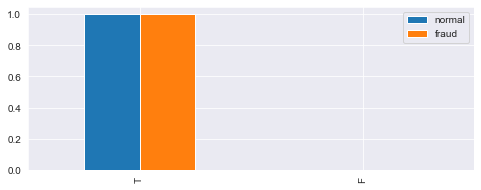

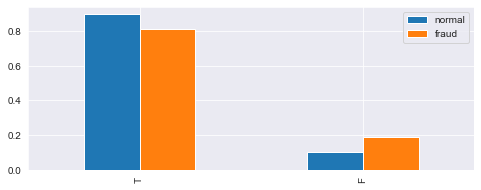

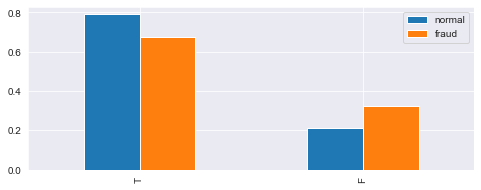

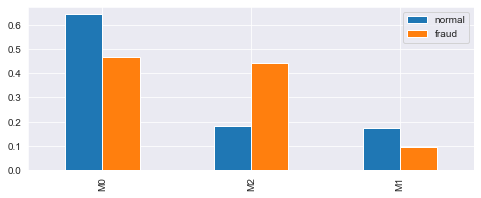

In [114]:
plotTrnCategoryRateBar('M1')
plotTrnCategoryRateBar('M2')
plotTrnCategoryRateBar('M3')
plotTrnCategoryRateBar('M4')

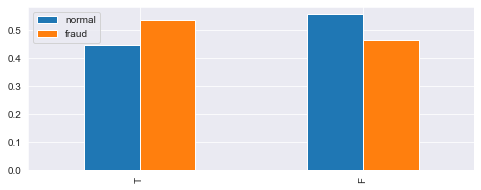

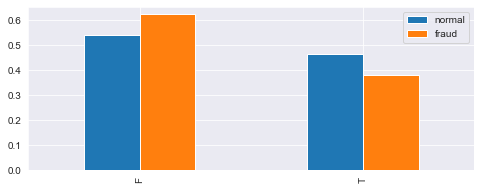

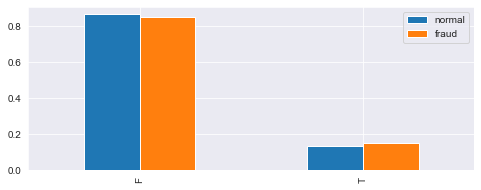

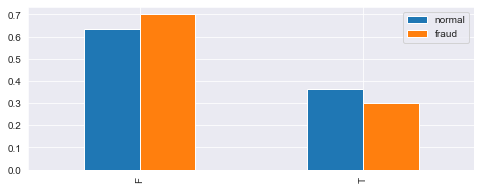

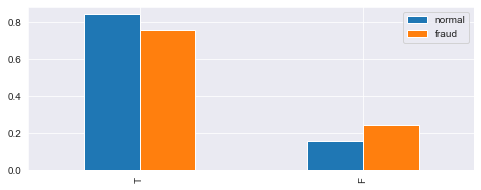

In [115]:
plotTrnCategoryRateBar('M5')
plotTrnCategoryRateBar('M6')
plotTrnCategoryRateBar('M7')
plotTrnCategoryRateBar('M8')
plotTrnCategoryRateBar('M9')

## Vxxx

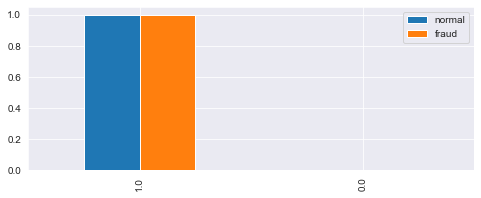

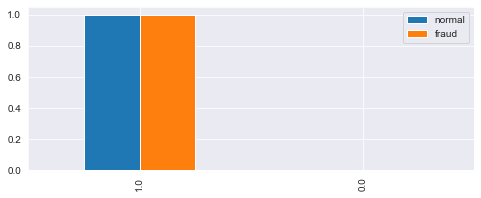

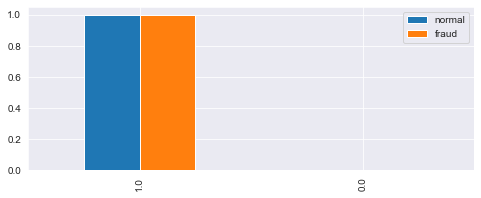

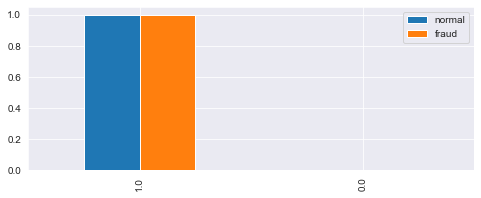

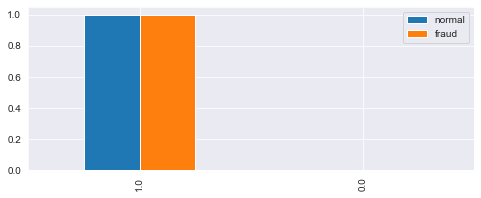

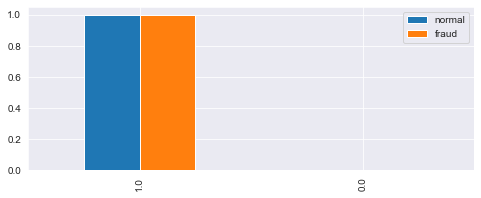

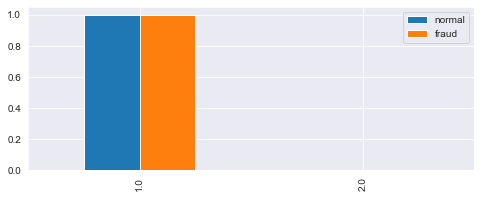

In [116]:
for f in ['V1','V14','V41','V65','V88','V107','V305']:
    plotTrnCategoryRateBar(f)

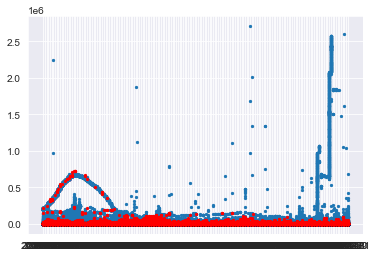

In [117]:
vsum0 = train_trn_f0[vcols].sum(axis=1)
vsum1 = train_trn_f1[vcols].sum(axis=1)
plt.scatter(train_trn_f0['_ymd'], vsum0, s=5)
plt.scatter(train_trn_f1['_ymd'], vsum1, s=5, c='r')

In [118]:
m = train_trn_f1[vcols].describe().T['max']
m[m >= 10000]

V127    19,860.000
V128    10,162.000
V133    15,607.000
V159    43,552.000
V160   639,717.438
V165    17,468.949
V202    10,900.000
V203    81,450.000
V204    37,850.000
V207    20,080.000
V212    34,625.000
V213    16,950.000
V215    13,725.000
V264    10,035.000
V306    11,848.000
V307    83,258.367
V308    18,123.957
V316    11,848.000
V317    82,130.953
V318    18,123.957
Name: max, dtype: float64

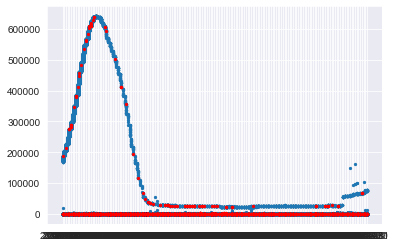

In [119]:
plt.scatter(train_trn_f0['_ymd'], train_trn_f0['V160'], s=5)
plt.scatter(train_trn_f1['_ymd'], train_trn_f1['V160'], s=5, c='r')

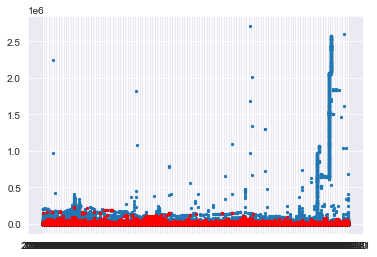

In [120]:
vcols_1 = [f'V{i}' for i in range(1,160)]+[f'V{i}' for i in range(161,340)]
vsum0 = train_trn_f0[vcols_1].sum(axis=1)
vsum1 = train_trn_f1[vcols_1].sum(axis=1)
plt.scatter(train_trn_f0['_ymd'], vsum0, s=5)
plt.scatter(train_trn_f1['_ymd'], vsum1, s=5, c='r')

In [121]:
train_trn[vcols].isnull().sum() / len(train_trn)

V1     0.473
V2     0.473
V3     0.473
V4     0.473
V5     0.473
        ... 
V335   0.861
V336   0.861
V337   0.861
V338   0.861
V339   0.861
Length: 339, dtype: float64

In [122]:
train_trn.loc[train_trn['V1'].isnull(), vcols].head(10)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
3,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
4,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
7,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
8,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
10,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
11,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
12,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
13,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
14,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [123]:
train_trn.loc[train_trn['V1'].isnull() == False, vcols].head(10)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
5,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
6,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
9,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
15,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
18,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
20,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
23,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
27,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


array([<AxesSubplot:title={'center':'0'}>], dtype=object)

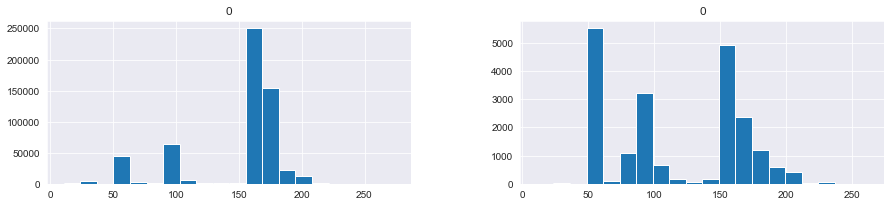

In [124]:
fig, ax = plt.subplots(1, 2, figsize=(15, 3))
train_trn.loc[train_trn['isFraud']==0, vcols].isnull().sum(axis=1).to_frame().hist(ax=ax[0], bins=20)
train_trn.loc[train_trn['isFraud']==1, vcols].isnull().sum(axis=1).to_frame().hist(ax=ax[1], bins=20)

In [125]:
train_trn[vcols].describe().T[['min','max']].T

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
max,1.000,8.000,9.000,6.000,6.000,9.000,9.000,8.000,8.000,4.000,...,55.000,"160,000.000","160,000.000","160,000.000","55,136.000","55,136.000","55,136.000","104,060.000","104,060.000","104,060.000"


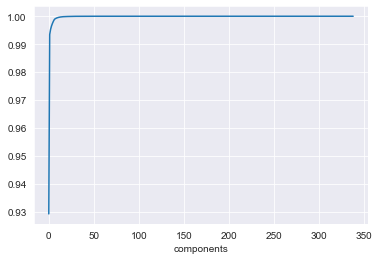

2


In [126]:
vcols = [f'V{i}' for i in range(1,340)]

pca = PCA()
pca.fit(train_trn[vcols].fillna(-1))
plt.xlabel('components')
plt.plot(np.add.accumulate(pca.explained_variance_ratio_))
plt.show()

pca = PCA(n_components=0.99)
vcol_pca = pca.fit_transform(train_trn[vcols].fillna(-1))
print(vcol_pca.ndim)

## 대회 1등팀인 FraudSquad 가 참고한 Alijis의 EDA

- Refer : https://www.kaggle.com/code/alijs1/ieee-transaction-columns-reference/notebook

# IEEE Fraud Detection transactions columns reference

In [127]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.core.display import HTML
import warnings
warnings.filterwarnings("ignore")

INPUT_DIR = '../input/'
COLS_TO_SHOW = 150

def h(content):
    display(HTML(content))

def timehist1(col):
    N = 8000 if col in ['TransactionAmt'] else 9999999999999999 # clip trans amount for better view
    tr[tr['isFraud'] == 0].set_index('TransactionDT')[col].clip(0, N).plot(style='.', title='Hist ' + col, figsize=(15, 3))
    tr[tr['isFraud'] == 1].set_index('TransactionDT')[col].clip(0, N).plot(style='.', title='Hist ' + col, figsize=(15, 3))
    te.set_index('TransactionDT')[col].clip(0, N).plot(style='.', title=col + ' values over time (blue=no-fraud, orange=fraud, green=test)', figsize=(15, 3))
    plt.show()
    
def _desc(data, col, label):
    d0 = data.describe().reset_index()
    d0.columns = [col, label]
    return d0.append({col:'unique values', label:data.unique().shape[0]}, ignore_index=True) \
             .append({col:'NaNs', label:data.isnull().sum()}, ignore_index=True) \
             .append({col:'NaNs share', label:np.round(data.isnull().sum() / data.shape[0], 4)}, ignore_index=True) \
    
def desc1(col):
    d0 = _desc(tr[col], col, 'Train')
    d1 = _desc(tr.loc[tr['isFraud'] == 1, col], col, 'Train fraud')
    d2 = _desc(tr.loc[tr['isFraud'] == 0, col], col, 'Train Not fraud')
    d3 = _desc(te[col], col, 'Test')
    n_public = int(te.shape[0] * 0.2)
    d4 = _desc(te.loc[:n_public, col], col, 'Test public')
    d5 = _desc(te.loc[n_public:, col], col, 'Test private')
    dd = d0.merge(d1).merge(d2).merge(d3).merge(d4).merge(d5)
    display(dd)
    
    if col not in ['TransactionID']:
        h('<b>Most popular values (NaN = -999):</b>')
        N = 10
        d0 = tr[['isFraud',col]].fillna(-999).groupby(col)['isFraud'].agg(['size','mean','sum']).reset_index().sort_values('size', ascending=False).reset_index(drop=True)
        d1 = te[['TransactionID',col]].fillna(-999).groupby(col)['TransactionID'].count().reset_index()
        dd = d0.merge(d1, how='left', on=col).head(N)
        dd = dd.rename({'size':'Count in train (desc)','mean':'Mean target','sum':'Sum target','TransactionID':'Count in test'}, axis=1)
        display(dd)

        h('<b>Biggest fraud sum values in train (NaN = -999):</b>')
        dd = d0.sort_values('sum', ascending=False).reset_index(drop=True).head(N).merge(d1, how='left', on=col)
        dd = dd.rename({'size':'Count in train','mean':'Mean target','sum':'Sum target (desc)','TransactionID':'Count in test'}, axis=1)
        display(dd)

def hist1(col):
    plt.figure(figsize=(15, 3))
    plt.subplot(121)
    plt.hist(tr[col], bins=70);
    plt.title('Train histogram: ' + col);
    plt.subplot(122)
    plt.hist(te[col], bins=70);
    plt.title('Test histogram: ' + col);
    plt.show()

def corr1(col):
    N = None #10000
    num_vars = [f for f in tr.columns if tr[f].dtype != 'object']
    trx = tr.head(N) if N is not None else tr.copy()
    corrs = trx[num_vars].corrwith(trx[col]).reset_index().sort_values(0, ascending=False).reset_index(drop=True).rename({'index':'Column',0:'Correlation with ' + col}, axis=1)
    h('<b>Most correlated values with ' + col + ':</b>')
    trx = pd.concat([corrs.head(6), corrs.dropna().tail(5)])
    def linkx(val):
        return '<a href="#c_{}">{}</a>'.format(val, val) if val in included_cols else val
    trx['Column'] = trx['Column'].apply(linkx)
    h(trx.to_html(escape=False))
    
def numeric(col):
    timehist1(col)
    hist1(col)
    desc1(col)
    corr1(col) 
    
def categorical(col):
    desc1(col)

def proc(col):
    if col not in ['isFraud','TransactionDT']:
        h('<h3 id="c_' + col + '">' + col + '</h3>' + '<a style="font-size:11px" href="#home">(Jump to top)</a>')
        categorical(col) if tr[col].dtype == 'object' else numeric(col)
        
tr = pd.read_csv('train_transaction.csv')
te = pd.read_csv('test_transaction.csv')
trid = pd.read_csv('train_identity.csv')
teid = pd.read_csv('test_identity.csv')

included_cols = list(tr.columns.values[:COLS_TO_SHOW])
split_on = ['TransactionID','card1','addr1','C1','D1','M1','V1']
h('<b>Links to column info:</b> ' + ', '.join([('<li>' if col in split_on else '') + '<a href="#c_' + col + '">' + col + '</a>' for col in included_cols]))
h('Train transactions shape: <b>' + str(tr.shape) + '</b>, identity <b>' + str(trid.shape) + '</b>' + 
  '<br>Test transactions shape: <b>' + str(te.shape) + '</b>, identity <b>' + str(teid.shape) + '</b>')
h('Train transactions preview:')
display(tr.head(10))

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.500,W,13926,nan,150.000,discover,142.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
1,2987001,0,86401,29.000,W,2755,404.000,150.000,mastercard,102.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2,2987002,0,86469,59.000,W,4663,490.000,150.000,visa,166.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
3,2987003,0,86499,50.000,W,18132,567.000,150.000,mastercard,117.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
4,2987004,0,86506,50.000,H,4497,514.000,150.000,mastercard,102.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5,2987005,0,86510,49.000,W,5937,555.000,150.000,visa,226.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
6,2987006,0,86522,159.000,W,12308,360.000,150.000,visa,166.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
7,2987007,0,86529,422.500,W,12695,490.000,150.000,visa,226.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
8,2987008,0,86535,15.000,H,2803,100.000,150.000,visa,226.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
9,2987009,0,86536,117.000,W,17399,111.000,150.000,mastercard,224.000,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


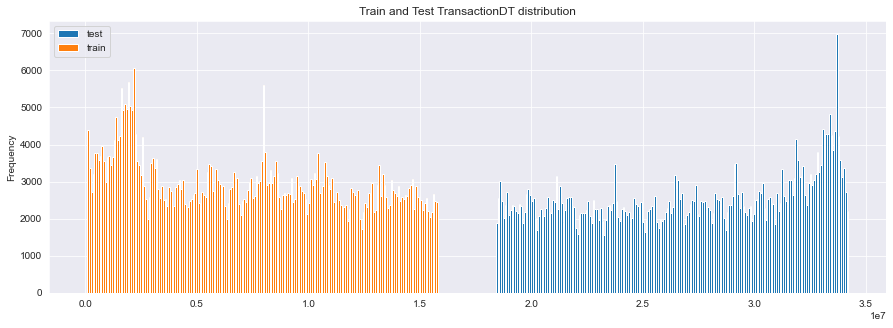

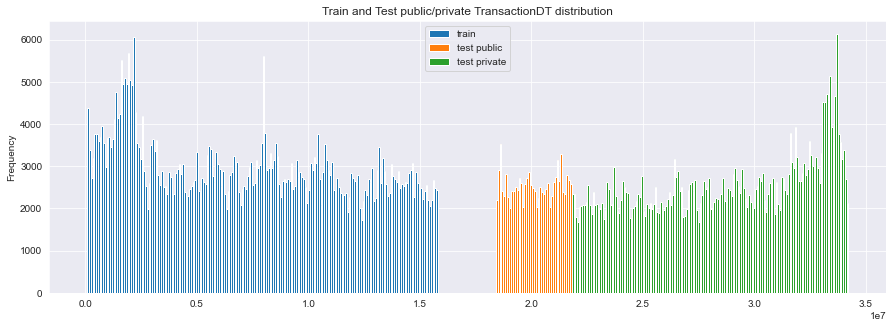

,Column,Correlation with TransactionDT
0,TransactionDT,1.000
1,TransactionID,0.998
2,V330,0.259
3,V326,0.257
4,V329,0.253
5,V327,0.248
375,V145,-0.253
376,V160,-0.266
377,V159,-0.279
378,V151,-0.281


In [128]:
COL = 'TransactionDT'
h('<h2 id="c_' + COL + '">' + COL + '</h2>' + '<a style="font-size:11px" href="#home">(Jump to top)</a>')

te['TransactionDT'].plot(kind='hist', figsize=(15, 5), label='test', bins=200, title='Train and Test TransactionDT distribution')
tr['TransactionDT'].plot(kind='hist', label='train', bins=200)
plt.legend()
plt.show()
tr['TransactionDT'].plot(kind='hist', figsize=(15, 5), label='train', bins=200, title='Train and Test public/private TransactionDT distribution')
n_public = int(te.shape[0] * 0.2)
te.loc[:n_public, 'TransactionDT'].plot(kind='hist', label='test public', bins=40)
te.loc[n_public:, 'TransactionDT'].plot(kind='hist', label='test private', bins=160)
plt.legend()
plt.show()
corr1(COL)

In [129]:
COL = 'isFraud'
h('<h2 id="c_' + COL + '">' + COL + '</h2>' + '<a style="font-size:11px" href="#home">(Jump to top)</a>')
h('This is target column.')
trx = tr['isFraud'].value_counts().reset_index().rename({'index':'Value','isFraud':'Count'}, axis=1)
trx['Share'] = np.round(trx['Count'] / trx['Count'].sum(), 6)
display(trx)
corr1(COL)

,Value,Count,Share
0,0,569877,0.965
1,1,20663,0.035


,Column,Correlation with isFraud
0,isFraud,1.000
1,V257,0.383
2,V246,0.367
3,V244,0.364
4,V242,0.361
5,V201,0.328
375,V90,-0.110
376,V49,-0.111
377,V48,-0.116
378,D7,-0.127


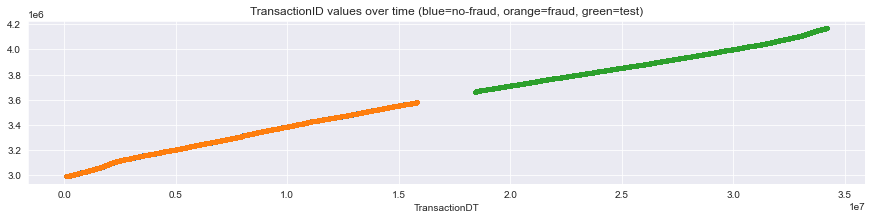

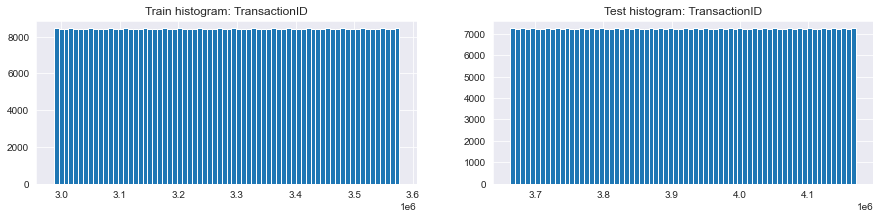

,TransactionID,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,691.000","101,339.000","405,353.000"
1,mean,"3,282,269.500","3,294,951.649","3,281,809.662","3,916,894.000","3,714,218.000","3,967,563.000"
2,std,"170,474.358","162,040.328","170,754.781","146,269.237","29,254.194","117,015.476"
3,min,"2,987,000.000","2,987,203.000","2,987,000.000","3,663,549.000","3,663,549.000","3,764,887.000"
4,25%,"3,134,634.750","3,167,366.500","3,133,317.000","3,790,221.500","3,688,883.500","3,866,225.000"
5,50%,"3,282,269.500","3,291,934.000","3,281,808.000","3,916,894.000","3,714,218.000","3,967,563.000"
6,75%,"3,429,904.250","3,428,646.000","3,429,974.000","4,043,566.500","3,739,552.500","4,068,901.000"
7,max,"3,577,539.000","3,577,526.000","3,577,539.000","4,170,239.000","3,764,887.000","4,170,239.000"
8,unique values,"590,540.000","20,663.000","569,877.000","506,691.000","101,339.000","405,353.000"
9,NaNs,0.000,0.000,0.000,0.000,0.000,0.000


,Column,Correlation with TransactionID
0,TransactionID,1.000
1,TransactionDT,0.998
2,V326,0.252
3,V330,0.251
4,V329,0.245
5,V327,0.243
375,V145,-0.274
376,V160,-0.283
377,V159,-0.303
378,V151,-0.304


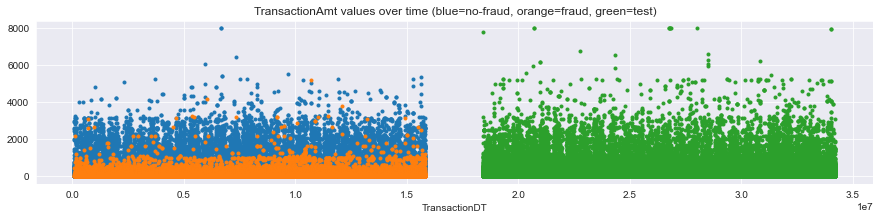

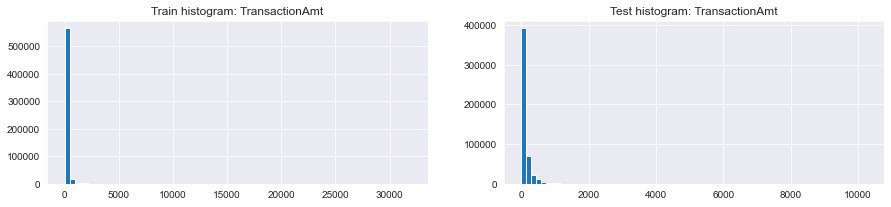

,TransactionAmt,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,691.000","101,339.000","405,353.000"
1,mean,135.027,149.245,134.512,134.726,141.732,132.974
2,std,239.163,232.212,239.395,245.780,257.474,242.737
3,min,0.251,0.292,0.251,0.018,0.018,0.140
4,25%,43.321,35.044,43.970,40.000,45.950,39.000
5,50%,68.769,75.000,68.500,67.950,72.950,67.950
6,75%,125.000,161.000,120.000,125.000,134.950,120.950
7,max,"31,937.391","5,191.000","31,937.391","10,270.000","9,154.460","10,270.000"
8,unique values,"20,902.000","2,515.000","20,560.000","14,119.000","5,144.000","12,117.000"
9,NaNs,0.000,0.000,0.000,0.000,0.000,0.000


,TransactionAmt,Count in train (desc),Mean target,Sum target,Count in test
0,59.000,30582,0.021,646,"27,365.000"
1,117.000,28933,0.025,719,"25,798.000"
2,107.950,23954,0.009,221,"20,243.000"
3,57.950,23600,0.004,90,"20,063.000"
4,100.000,20362,0.026,523,"17,565.000"
5,50.000,17009,0.021,353,"14,469.000"
6,49.000,15990,0.029,469,"14,231.000"
7,226.000,11704,0.033,390,"11,084.000"
8,39.000,11095,0.022,242,"9,926.000"
9,29.000,10683,0.019,201,"9,019.000"


,TransactionAmt,Count in train,Mean target,Sum target (desc),Count in test
0,117.000,28933,0.025,719,25798
1,59.000,30582,0.021,646,27365
2,150.000,8356,0.067,561,7426
3,100.000,20362,0.026,523,17565
4,49.000,15990,0.029,469,14231
5,200.000,6590,0.064,423,6115
6,226.000,11704,0.033,390,11084
7,300.000,2438,0.146,355,2104
8,50.000,17009,0.021,353,14469
9,171.000,7682,0.035,272,7233


,Column,Correlation with TransactionAmt
0,TransactionAmt,1.000
1,V139,0.222
2,V140,0.207
3,V208,0.199
4,V161,0.197
5,V163,0.191
375,V15,-0.139
376,V94,-0.141
377,V52,-0.142
378,V50,-0.145


,ProductCD,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,590540,20663,569877,506691,101339,405353
1,unique,5,5,5,5,5,5
2,top,W,W,W,W,W,W
3,freq,439670,8969,430701,360987,82563,278425
4,unique values,5,5,5,5,5,5
5,NaNs,0,0,0,0,0,0
6,NaNs share,0.000,0.000,0.000,0.000,0.000,0.000


,ProductCD,Count in train (desc),Mean target,Sum target,Count in test
0,W,439670,0.020,8969,360987
1,C,68519,0.117,8008,69266
2,R,37699,0.038,1426,35647
3,H,33024,0.048,1574,29373
4,S,11628,0.059,686,11418


,ProductCD,Count in train,Mean target,Sum target (desc),Count in test
0,W,439670,0.020,8969,360987
1,C,68519,0.117,8008,69266
2,H,33024,0.048,1574,29373
3,R,37699,0.038,1426,35647
4,S,11628,0.059,686,11418


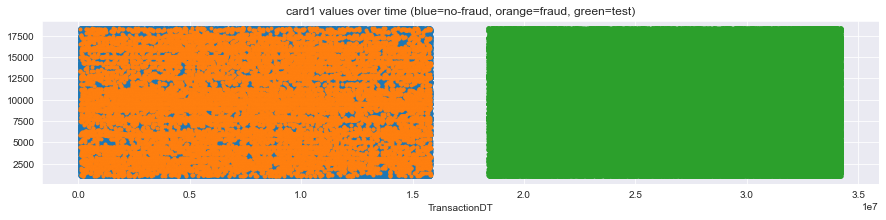

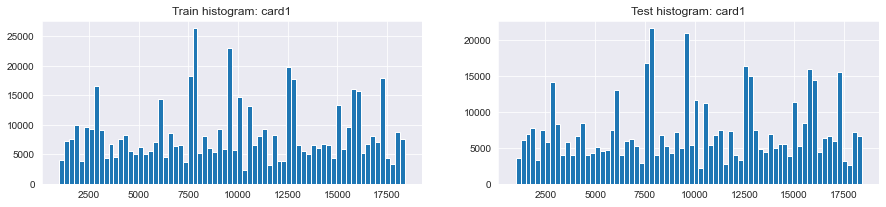

,card1,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,691.000","101,339.000","405,353.000"
1,mean,"9,898.735","9,547.654","9,911.464","9,957.222","9,907.330","9,969.702"
2,std,"4,901.170","4,762.051","4,905.672","4,884.961","4,854.918","4,892.365"
3,min,"1,000.000","1,015.000","1,000.000","1,001.000","1,006.000","1,001.000"
4,25%,"6,019.000","5,732.500","6,019.000","6,019.000","6,053.000","6,019.000"
5,50%,"9,678.000","9,633.000","9,711.000","9,803.000","9,653.000","9,803.000"
6,75%,"14,184.000","13,623.000","14,229.000","14,276.000","14,052.000","14,290.000"
7,max,"18,396.000","18,375.000","18,396.000","18,397.000","18,396.000","18,397.000"
8,unique values,"13,553.000","1,740.000","13,350.000","13,244.000","6,935.000","12,300.000"
9,NaNs,0.000,0.000,0.000,0.000,0.000,0.000


,card1,Count in train (desc),Mean target,Sum target,Count in test
0,7919,14932,0.008,112,"13,083.000"
1,9500,14162,0.037,528,"12,081.000"
2,15885,10361,0.043,444,"12,330.000"
3,17188,10344,0.027,278,"9,262.000"
4,15066,7945,0.039,313,"6,661.000"
5,12695,7091,0.028,201,"5,641.000"
6,12544,6773,0.022,146,"5,921.000"
7,6019,6771,0.043,294,"6,497.000"
8,2803,6141,0.012,73,"4,902.000"
9,7585,5334,0.049,263,"4,763.000"


,card1,Count in train,Mean target,Sum target (desc),Count in test
0,9633,4158,0.178,742,4751
1,9500,14162,0.037,528,12081
2,15885,10361,0.043,444,12330
3,9026,2076,0.191,397,894
4,15063,2522,0.126,319,2060
5,5812,2818,0.111,314,3879
6,2616,4410,0.071,314,1786
7,15066,7945,0.039,313,6661
8,9917,919,0.333,306,920
9,6019,6771,0.043,294,6497


,Column,Correlation with card1
0,card1,1.000
1,V330,0.146
2,V329,0.143
3,V324,0.139
4,V333,0.137
5,V328,0.134
375,V149,-0.024
376,V156,-0.024
377,D13,-0.029
378,D8,-0.041


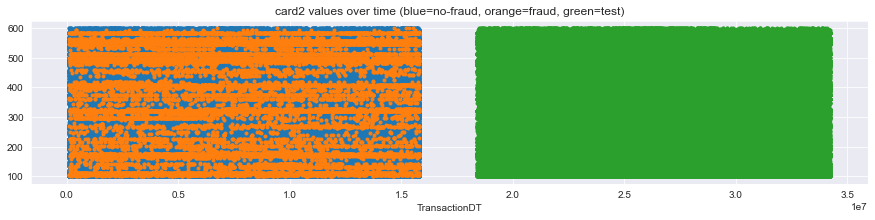

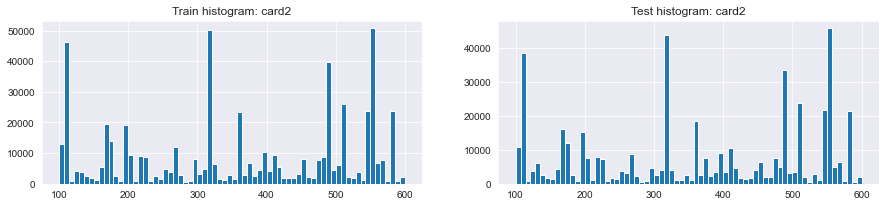

,card2,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"581,607.000","20,240.000","561,367.000","498,037.000","99,008.000","399,030.000"
1,mean,362.555,365.371,362.454,363.735,358.809,364.958
2,std,157.793,159.624,157.726,158.689,157.773,158.891
3,min,100.000,100.000,100.000,100.000,100.000,100.000
4,25%,214.000,204.000,215.000,207.000,204.000,214.000
5,50%,361.000,375.000,361.000,369.000,360.000,375.000
6,75%,512.000,514.000,512.000,512.000,512.000,514.000
7,max,600.000,600.000,600.000,600.000,600.000,600.000
8,unique values,501.000,328.000,501.000,498.000,497.000,497.000
9,NaNs,"8,933.000",423.000,"8,510.000","8,654.000","2,331.000","6,323.000"


,card2,Count in train (desc),Mean target,Sum target,Count in test
0,321.000,48935,0.029,1396,"42,796.000"
1,111.000,45191,0.022,978,"37,346.000"
2,555.000,41995,0.023,959,"38,409.000"
3,490.000,38145,0.024,916,"32,351.000"
4,583.000,21803,0.041,899,"19,700.000"
5,170.000,18214,0.031,570,"15,197.000"
6,194.000,16938,0.008,130,"14,573.000"
7,545.000,16355,0.087,1420,"15,539.000"
8,360.000,15190,0.010,158,"11,342.000"
9,514.000,14541,0.046,672,"12,684.000"


,card2,Count in train,Mean target,Sum target (desc),Count in test
0,545.000,16355,0.087,1420,15539
1,321.000,48935,0.029,1396,42796
2,111.000,45191,0.022,978,37346
3,555.000,41995,0.023,959,38409
4,490.000,38145,0.024,916,32351
5,500.000,5045,0.181,911,2430
6,583.000,21803,0.041,899,19700
7,408.000,8012,0.084,673,9148
8,514.000,14541,0.046,672,12684
9,130.000,2746,0.239,657,5395


,Column,Correlation with card2
0,card2,1.000
1,V302,0.098
2,V304,0.097
3,V303,0.092
4,V50,0.085
5,V71,0.081
375,V36,-0.042
376,V13,-0.044
377,V12,-0.044
378,V53,-0.044


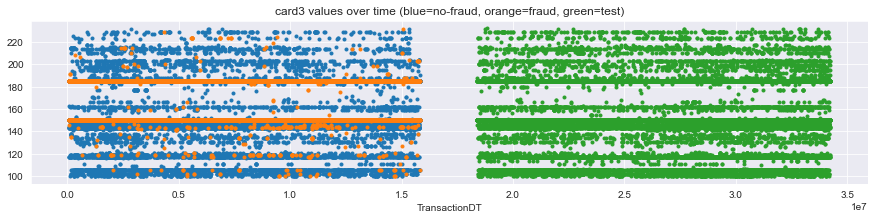

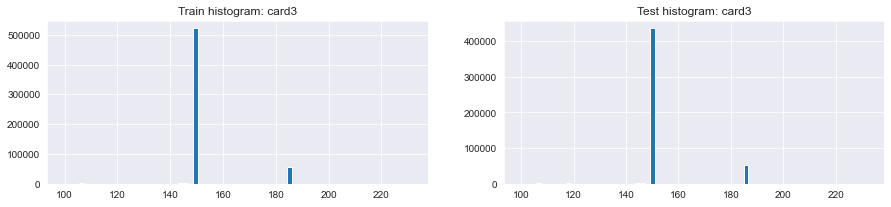

,card3,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"588,975.000","20,624.000","568,351.000","503,689.000","100,033.000","403,657.000"
1,mean,153.195,162.369,152.862,153.543,152.128,153.894
2,std,11.336,17.496,10.904,12.443,10.592,12.837
3,min,100.000,100.000,100.000,100.000,100.000,100.000
4,25%,150.000,150.000,150.000,150.000,150.000,150.000
5,50%,150.000,150.000,150.000,150.000,150.000,150.000
6,75%,150.000,185.000,150.000,150.000,150.000,150.000
7,max,231.000,231.000,231.000,232.000,232.000,231.000
8,unique values,115.000,63.000,107.000,116.000,75.000,111.000
9,NaNs,"1,565.000",39.000,"1,526.000","3,002.000","1,306.000","1,696.000"


,card3,Count in train (desc),Mean target,Sum target,Count in test
0,150.000,521287,0.025,12807,"435,558.000"
1,185.000,56346,0.131,7362,"53,614.000"
2,106.000,1571,0.015,24,"1,972.000"
3,-999.000,1565,0.025,39,"3,002.000"
4,146.000,1252,0.020,25,"1,218.000"
5,144.000,1252,0.089,112,"1,381.000"
6,117.000,962,0.019,18,"1,879.000"
7,143.000,899,0.031,28,771.000
8,119.000,750,0.093,70,341.000
9,102.000,460,0.024,11,738.000


,card3,Count in train,Mean target,Sum target (desc),Count in test
0,150.000,521287,0.025,12807,435558
1,185.000,56346,0.131,7362,53614
2,144.000,1252,0.089,112,1381
3,119.000,750,0.093,70,341
4,-999.000,1565,0.025,39,3002
5,143.000,899,0.031,28,771
6,146.000,1252,0.020,25,1218
7,106.000,1571,0.015,24,1972
8,117.000,962,0.019,18,1879
9,223.000,55,0.255,14,126


,Column,Correlation with card3
0,card3,1.000
1,V15,0.760
2,V94,0.759
3,V16,0.745
4,V57,0.744
5,V79,0.738
375,V53,-0.342
376,V35,-0.349
377,V54,-0.351
378,V36,-0.356


,card4,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,588963,20622,568341,503605,99996,403610
1,unique,4,4,4,4,4,4
2,top,visa,visa,visa,visa,visa,visa
3,freq,384767,13373,371394,334882,66078,268805
4,unique values,5,5,5,5,5,5
5,NaNs,1577,41,1536,3086,1343,1743
6,NaNs share,0.003,0.002,0.003,0.006,0.013,0.004


,card4,Count in train (desc),Mean target,Sum target,Count in test
0,visa,384767,0.035,13373,334882
1,mastercard,189217,0.034,6496,158169
2,american express,8328,0.029,239,7681
3,discover,6651,0.077,514,2873
4,-999,1577,0.026,41,3086


,card4,Count in train,Mean target,Sum target (desc),Count in test
0,visa,384767,0.035,13373,334882
1,mastercard,189217,0.034,6496,158169
2,discover,6651,0.077,514,2873
3,american express,8328,0.029,239,7681
4,-999,1577,0.026,41,3086


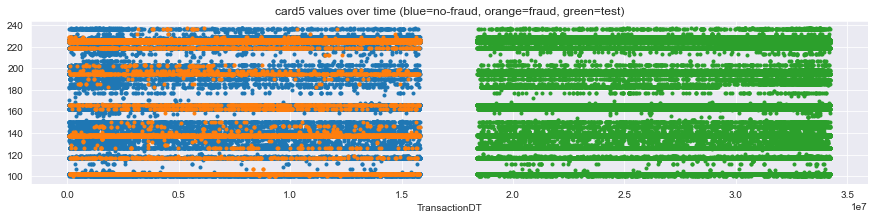

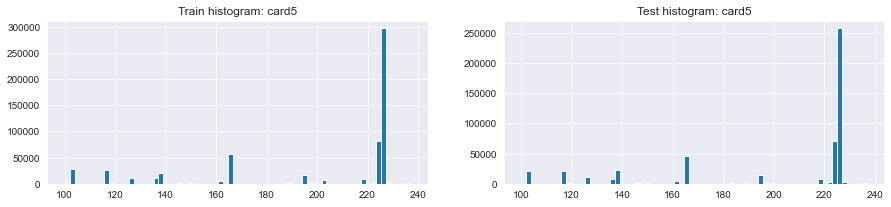

,card5,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"586,281.000","20,453.000","565,828.000","502,144.000","99,816.000","402,329.000"
1,mean,199.279,191.994,199.542,200.163,200.407,200.103
2,std,41.244,45.780,41.047,40.562,40.584,40.557
3,min,100.000,100.000,100.000,100.000,100.000,100.000
4,25%,166.000,138.000,166.000,166.000,166.000,166.000
5,50%,226.000,224.000,226.000,226.000,226.000,226.000
6,75%,226.000,226.000,226.000,226.000,226.000,226.000
7,max,237.000,237.000,237.000,237.000,237.000,237.000
8,unique values,120.000,50.000,119.000,103.000,70.000,97.000
9,NaNs,"4,259.000",210.000,"4,049.000","4,547.000","1,523.000","3,024.000"


,card5,Count in train (desc),Mean target,Sum target,Count in test
0,226.000,296546,0.030,8753,"256,991.000"
1,224.000,81513,0.039,3152,"71,596.000"
2,166.000,57140,0.011,630,"45,790.000"
3,102.000,29105,0.063,1832,"20,386.000"
4,117.000,25941,0.014,354,"21,120.000"
5,138.000,19737,0.085,1682,"22,102.000"
6,195.000,16945,0.040,681,"14,951.000"
7,137.000,11720,0.147,1725,"7,730.000"
8,126.000,10298,0.010,105,"11,439.000"
9,219.000,9924,0.058,571,"8,402.000"


,card5,Count in train,Mean target,Sum target (desc),Count in test
0,226.000,296546,0.030,8753,256991
1,224.000,81513,0.039,3152,71596
2,102.000,29105,0.063,1832,20386
3,137.000,11720,0.147,1725,7730
4,138.000,19737,0.085,1682,22102
5,195.000,16945,0.040,681,14951
6,166.000,57140,0.011,630,45790
7,219.000,9924,0.058,571,8402
8,117.000,25941,0.014,354,21120
9,162.000,4524,0.067,301,4512


,Column,Correlation with card5
0,card5,1.000
1,D15,0.110
2,D1,0.100
3,D2,0.096
4,D4,0.096
5,D10,0.096
375,V333,-0.266
376,V324,-0.268
377,V328,-0.270
378,V329,-0.283


,card6,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,588969,20624,568345,503684,100033,403652
1,unique,4,2,4,3,2,3
2,top,debit,debit,debit,debit,debit,debit
3,freq,439938,10674,429264,385021,78402,306620
4,unique values,5,3,5,4,3,4
5,NaNs,1571,39,1532,3007,1306,1701
6,NaNs share,0.003,0.002,0.003,0.006,0.013,0.004


,card6,Count in train (desc),Mean target,Sum target,Count in test
0,debit,439938,0.024,10674,"385,021.000"
1,credit,148986,0.067,9950,"118,662.000"
2,-999,1571,0.025,39,"3,007.000"
3,debit or credit,30,0.000,0,nan
4,charge card,15,0.000,0,1.000


,card6,Count in train,Mean target,Sum target (desc),Count in test
0,debit,439938,0.024,10674,"385,021.000"
1,credit,148986,0.067,9950,"118,662.000"
2,-999,1571,0.025,39,"3,007.000"
3,debit or credit,30,0.000,0,nan
4,charge card,15,0.000,0,1.000


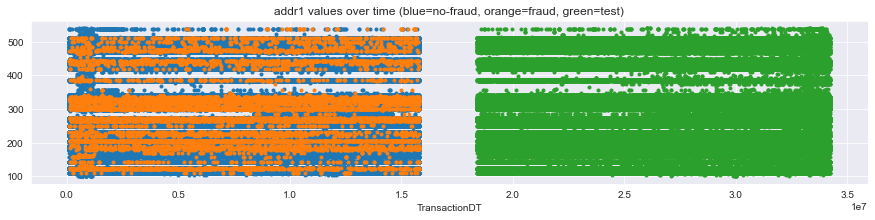

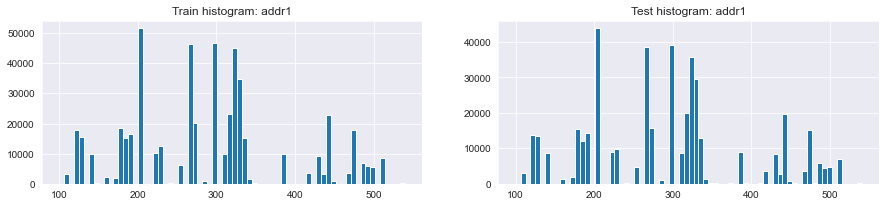

,addr1,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"524,834.000","12,922.000","511,912.000","441,082.000","91,556.000","349,527.000"
1,mean,290.734,294.317,290.643,291.847,290.515,292.195
2,std,101.741,103.585,101.693,102.063,101.350,102.246
3,min,100.000,110.000,100.000,100.000,110.000,100.000
4,25%,204.000,204.000,204.000,204.000,204.000,204.000
5,50%,299.000,299.000,299.000,299.000,299.000,299.000
6,75%,330.000,330.000,330.000,330.000,330.000,330.000
7,max,540.000,536.000,540.000,540.000,536.000,540.000
8,unique values,333.000,87.000,333.000,293.000,83.000,289.000
9,NaNs,"65,706.000","7,741.000","57,965.000","65,609.000","9,783.000","55,826.000"


,addr1,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,65706,0.118,7741,"65,609.000"
1,299.000,46335,0.021,985,"38,710.000"
2,325.000,42751,0.025,1087,"34,151.000"
3,204.000,42020,0.027,1120,"35,049.000"
4,264.000,39870,0.018,728,"32,710.000"
5,330.000,26287,0.032,840,"22,100.000"
6,315.000,23078,0.018,411,"19,957.000"
7,441.000,20827,0.026,533,"18,063.000"
8,272.000,20141,0.029,576,"15,788.000"
9,123.000,16105,0.025,398,"12,595.000"


,addr1,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,65706,0.118,7741,65609
1,204.000,42020,0.027,1120,35049
2,325.000,42751,0.025,1087,34151
3,299.000,46335,0.021,985,38710
4,330.000,26287,0.032,840,22100
5,264.000,39870,0.018,728,32710
6,272.000,20141,0.029,576,15788
7,441.000,20827,0.026,533,18063
8,337.000,15149,0.029,439,12932
9,315.000,23078,0.018,411,19957


,Column,Correlation with addr1
0,addr1,1.000
1,V326,0.051
2,D13,0.051
3,V327,0.048
4,V330,0.043
5,V329,0.042
375,V100,-0.020
376,V99,-0.021
377,V287,-0.023
378,V285,-0.028


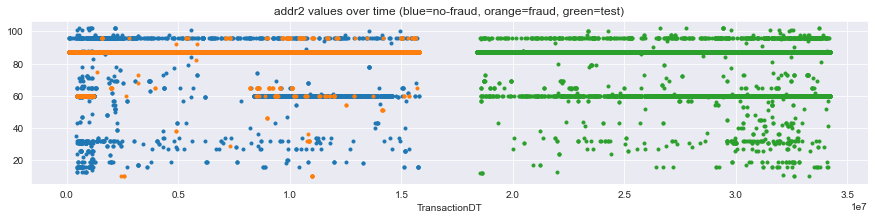

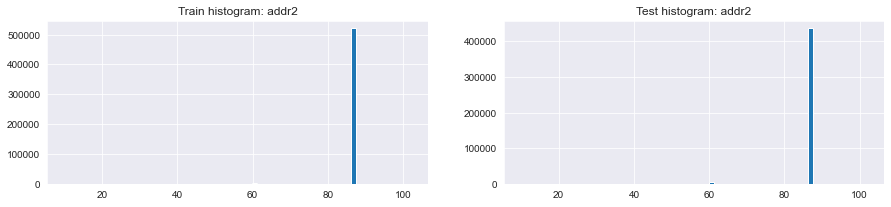

,addr2,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"524,834.000","12,922.000","511,912.000","441,082.000","91,556.000","349,527.000"
1,mean,86.801,86.286,86.814,86.723,86.964,86.660
2,std,2.691,4.936,2.608,2.987,1.218,3.295
3,min,10.000,10.000,13.000,10.000,12.000,10.000
4,25%,87.000,87.000,87.000,87.000,87.000,87.000
5,50%,87.000,87.000,87.000,87.000,87.000,87.000
6,75%,87.000,87.000,87.000,87.000,87.000,87.000
7,max,102.000,96.000,102.000,102.000,96.000,102.000
8,unique values,75.000,18.000,69.000,73.000,18.000,72.000
9,NaNs,"65,706.000","7,741.000","57,965.000","65,609.000","9,783.000","55,826.000"


,addr2,Count in train (desc),Mean target,Sum target,Count in test
0,87.000,520481,0.024,12477,"435,934.000"
1,-999.000,65706,0.118,7741,"65,609.000"
2,60.000,3084,0.090,279,"4,041.000"
3,96.000,638,0.139,89,608.000
4,32.000,91,0.066,6,61.000
5,65.000,82,0.537,44,49.000
6,16.000,55,0.000,0,22.000
7,31.000,47,0.000,0,36.000
8,19.000,33,0.000,0,23.000
9,26.000,25,0.000,0,7.000


,addr2,Count in train,Mean target,Sum target (desc),Count in test
0,87.000,520481,0.024,12477,435934
1,-999.000,65706,0.118,7741,65609
2,60.000,3084,0.090,279,4041
3,96.000,638,0.139,89,608
4,65.000,82,0.537,44,49
5,10.000,8,1.000,8,3
6,32.000,91,0.066,6,61
7,51.000,4,1.000,4,1
8,46.000,3,1.000,3,1
9,54.000,6,0.333,2,10


,Column,Correlation with addr2
0,addr2,1.000
1,D6,0.291
2,D13,0.209
3,D14,0.142
4,V36,0.114
5,V35,0.111
375,V16,-0.713
376,V15,-0.819
377,V58,-0.877
378,V57,-0.877


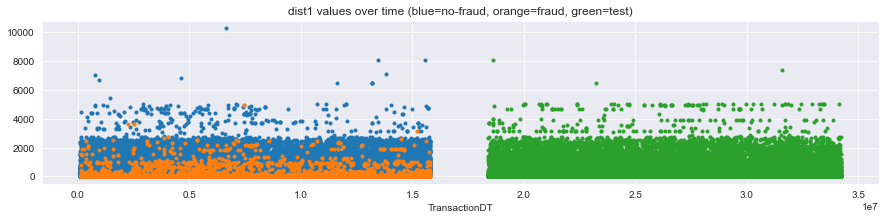

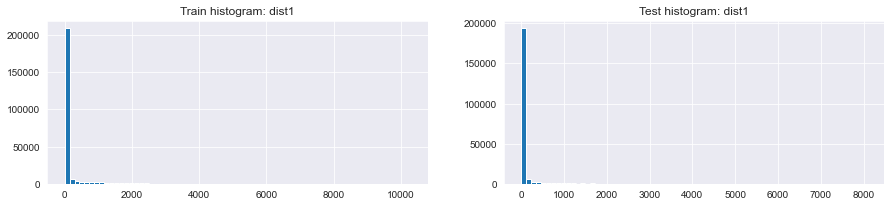

,dist1,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"238,269.000","4,755.000","233,514.000","215,474.000","47,587.000","167,888.000"
1,mean,118.502,174.589,117.360,87.065,92.930,85.404
2,std,371.872,424.232,370.642,314.132,332.383,308.743
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,3.000,3.000,3.000,3.000,3.000,3.000
5,50%,8.000,10.000,8.000,8.000,8.000,8.000
6,75%,24.000,85.500,24.000,20.000,20.000,20.000
7,max,"10,286.000","4,942.000","10,286.000","8,081.000","8,081.000","7,385.000"
8,unique values,"2,652.000",471.000,"2,636.000","1,989.000","1,347.000","1,843.000"
9,NaNs,"352,271.000","15,908.000","336,363.000","291,217.000","53,752.000","237,465.000"


,dist1,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,352271,0.045,15908,"291,217.000"
1,0.000,19824,0.019,380,"19,278.000"
2,1.000,18330,0.028,512,"18,025.000"
3,2.000,17028,0.012,200,"15,687.000"
4,4.000,13067,0.016,215,"12,137.000"
5,3.000,12808,0.012,150,"12,333.000"
6,5.000,12004,0.022,267,"11,238.000"
7,6.000,9843,0.015,144,"8,775.000"
8,7.000,9340,0.015,137,"9,210.000"
9,8.000,7731,0.015,117,"7,333.000"


,dist1,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,352271,0.045,15908,291217
1,1.000,18330,0.028,512,18025
2,0.000,19824,0.019,380,19278
3,5.000,12004,0.022,267,11238
4,4.000,13067,0.016,215,12137
5,2.000,17028,0.012,200,15687
6,3.000,12808,0.012,150,12333
7,9.000,7728,0.019,146,7608
8,6.000,9843,0.015,144,8775
9,7.000,9340,0.015,137,9210


,Column,Correlation with dist1
0,dist1,1.000
1,V8,0.095
2,V9,0.088
3,V2,0.079
4,V6,0.077
5,V3,0.068
166,V91,-0.067
167,V70,-0.067
168,V90,-0.068
169,V69,-0.068


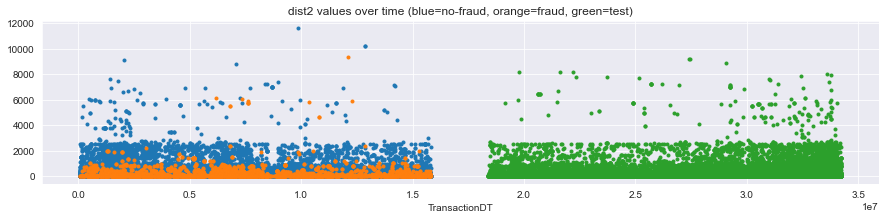

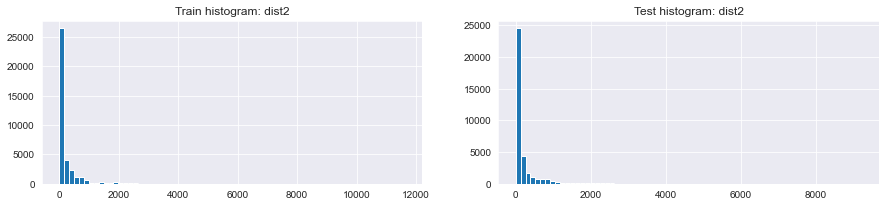

,dist2,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"37,627.000","3,731.000","33,896.000","36,436.000","4,716.000","31,720.000"
1,mean,231.855,201.472,235.200,237.175,233.553,237.714
2,std,529.053,451.590,536.798,556.451,555.366,556.619
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,7.000,7.000,7.000,7.000,7.000,7.000
5,50%,37.000,49.000,36.000,44.000,50.000,42.000
6,75%,206.000,233.000,206.000,196.000,190.000,196.000
7,max,"11,623.000","9,337.000","11,623.000","9,213.000","8,169.000","9,213.000"
8,unique values,"1,752.000",345.000,"1,724.000","1,815.000",611.000,"1,730.000"
9,NaNs,"552,913.000","16,932.000","535,981.000","470,255.000","96,623.000","373,633.000"


,dist2,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,552913,0.031,16932,"470,255.000"
1,7.000,5687,0.087,496,"2,660.000"
2,0.000,3519,0.153,540,"2,821.000"
3,1.000,1374,0.140,192,"1,565.000"
4,9.000,742,0.148,110,993.000
5,4.000,659,0.071,47,557.000
6,2.000,556,0.036,20,805.000
7,3.000,490,0.078,38,606.000
8,68.000,485,0.097,47,342.000
9,6.000,412,0.024,10,497.000


,dist2,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,552913,0.031,16932,470255
1,0.000,3519,0.153,540,2821
2,7.000,5687,0.087,496,2660
3,1.000,1374,0.140,192,1565
4,9.000,742,0.148,110,993
5,17.000,257,0.276,71,367
6,199.000,362,0.193,70,138
7,49.000,110,0.509,56,74
8,478.000,102,0.539,55,25
9,150.000,215,0.237,51,43


,Column,Correlation with dist2
0,dist2,1.000
1,V192,0.102
2,V187,0.095
3,V193,0.091
4,V234,0.076
5,V191,0.067
342,V260,-0.044
343,D6,-0.046
344,D4,-0.058
345,D12,-0.075


,P_emaildomain,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,496084,17873,478211,437499,85891,351609
1,unique,59,42,59,60,59,60
2,top,gmail.com,gmail.com,gmail.com,gmail.com,gmail.com,gmail.com
3,freq,228355,9943,218412,207448,41104,166345
4,unique values,60,43,60,61,60,61
5,NaNs,94456,2790,91666,69192,15448,53744
6,NaNs share,0.160,0.135,0.161,0.137,0.152,0.133


,P_emaildomain,Count in train (desc),Mean target,Sum target,Count in test
0,gmail.com,228355,0.044,9943,207448
1,yahoo.com,100934,0.023,2297,81850
2,-999,94456,0.030,2790,69192
3,hotmail.com,45250,0.053,2396,40399
4,anonymous.com,36998,0.023,859,34064
5,aol.com,28289,0.022,617,24048
6,comcast.net,7888,0.031,246,6586
7,icloud.com,6267,0.031,197,6049
8,outlook.com,5096,0.095,482,4838
9,msn.com,4092,0.022,90,3388


,P_emaildomain,Count in train,Mean target,Sum target (desc),Count in test
0,gmail.com,228355,0.044,9943,207448
1,-999,94456,0.030,2790,69192
2,hotmail.com,45250,0.053,2396,40399
3,yahoo.com,100934,0.023,2297,81850
4,anonymous.com,36998,0.023,859,34064
5,aol.com,28289,0.022,617,24048
6,outlook.com,5096,0.095,482,4838
7,comcast.net,7888,0.031,246,6586
8,icloud.com,6267,0.031,197,6049
9,mail.com,559,0.190,106,597


,R_emaildomain,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,137291,11227,126064,135870,18223,117647
1,unique,60,32,60,60,57,60
2,top,gmail.com,gmail.com,gmail.com,gmail.com,gmail.com,gmail.com
3,freq,57147,6811,50336,61738,8588,53150
4,unique values,61,33,61,61,58,61
5,NaNs,453249,9436,443813,370821,83116,287706
6,NaNs share,0.767,0.457,0.779,0.732,0.820,0.710


,R_emaildomain,Count in train (desc),Mean target,Sum target,Count in test
0,-999,453249,0.021,9436,370821
1,gmail.com,57147,0.119,6811,61738
2,hotmail.com,27509,0.078,2140,25657
3,anonymous.com,20529,0.029,598,19115
4,yahoo.com,11842,0.052,610,9563
5,aol.com,3701,0.035,129,3538
6,outlook.com,2507,0.165,414,2504
7,comcast.net,1812,0.012,21,1701
8,yahoo.com.mx,1508,0.011,16,1235
9,icloud.com,1398,0.129,180,1422


,R_emaildomain,Count in train,Mean target,Sum target (desc),Count in test
0,-999,453249,0.021,9436,370821
1,gmail.com,57147,0.119,6811,61738
2,hotmail.com,27509,0.078,2140,25657
3,yahoo.com,11842,0.052,610,9563
4,anonymous.com,20529,0.029,598,19115
5,outlook.com,2507,0.165,414,2504
6,icloud.com,1398,0.129,180,1422
7,aol.com,3701,0.035,129,3538
8,outlook.es,433,0.132,57,420
9,mail.com,122,0.377,46,219


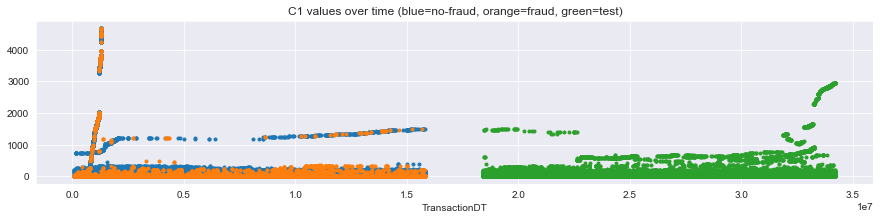

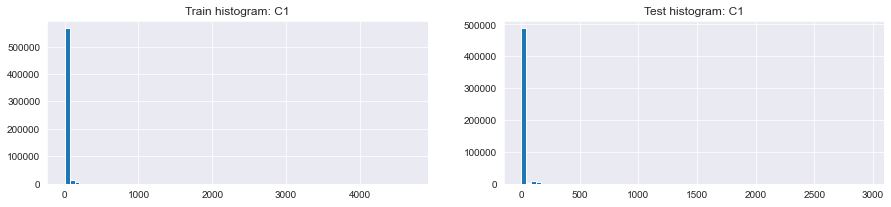

,C1,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,14.092,35.536,13.315,10.093,8.409,10.514
2,std,133.569,242.976,127.788,79.335,40.872,86.308
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,2.000,1.000,1.000,2.000,1.000
6,75%,3.000,6.000,3.000,3.000,3.000,3.000
7,max,"4,685.000","4,682.000","4,685.000","2,950.000","1,501.000","2,950.000"
8,unique values,"1,657.000",497.000,"1,526.000","1,175.000",344.000,"1,118.000"
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C1,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,316791,0.024,7676,"269,951.000"
1,2.000,105071,0.030,3182,"92,449.000"
2,3.000,51315,0.036,1841,"45,254.000"
3,4.000,28845,0.041,1171,"24,949.000"
4,5.000,17922,0.054,971,"14,929.000"
5,6.000,10567,0.054,567,"9,207.000"
6,7.000,7263,0.058,423,"5,721.000"
7,8.000,5072,0.066,336,"3,996.000"
8,9.000,3612,0.080,289,"2,771.000"
9,10.000,2904,0.092,267,"1,969.000"


,C1,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,316791,0.024,7676,269951
1,2.000,105071,0.030,3182,92449
2,3.000,51315,0.036,1841,45254
3,4.000,28845,0.041,1171,24949
4,5.000,17922,0.054,971,14929
5,6.000,10567,0.054,567,9207
6,7.000,7263,0.058,423,5721
7,8.000,5072,0.066,336,3996
8,9.000,3612,0.080,289,2771
9,10.000,2904,0.092,267,1969


,Column,Correlation with C1
0,C1,1.000
1,C11,0.997
2,C2,0.995
3,C6,0.982
4,C4,0.968
5,C8,0.968
375,V75,-0.051
376,V76,-0.052
377,TransactionID,-0.053
378,V35,-0.054


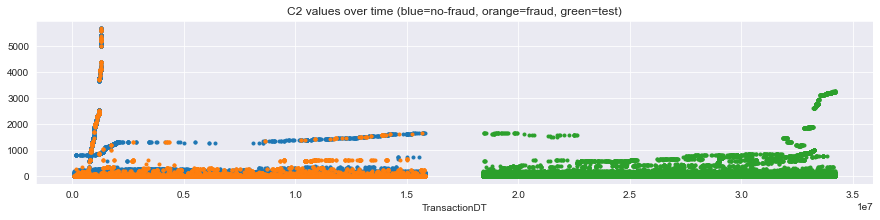

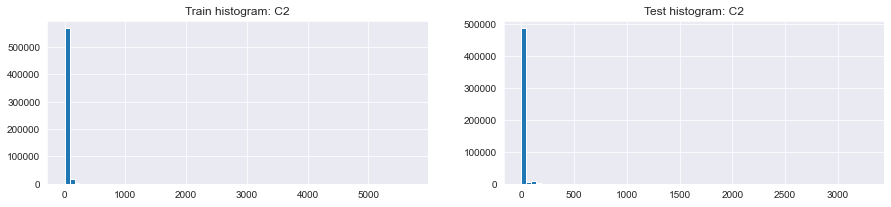

,C2,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,15.270,45.509,14.173,10.715,8.607,11.242
2,std,154.669,287.814,147.486,88.897,44.375,96.874
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,2.000,1.000,1.000,2.000,1.000
6,75%,3.000,7.000,3.000,3.000,3.000,3.000
7,max,"5,691.000","5,690.000","5,691.000","3,275.000","1,672.000","3,275.000"
8,unique values,"1,216.000",544.000,"1,075.000","1,124.000",370.000,"1,054.000"
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C2,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,316261,0.023,7297,"265,435.000"
1,2.000,103948,0.032,3324,"93,084.000"
2,3.000,51770,0.036,1872,"44,267.000"
3,4.000,28251,0.050,1423,"24,329.000"
4,5.000,16971,0.049,840,"14,711.000"
5,6.000,10682,0.050,534,"9,662.000"
6,7.000,7382,0.061,449,"6,097.000"
7,8.000,5105,0.053,273,"4,387.000"
8,9.000,3750,0.059,221,"3,364.000"
9,10.000,2797,0.085,239,"2,432.000"


,C2,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,316261,0.023,7297,265435
1,2.000,103948,0.032,3324,93084
2,3.000,51770,0.036,1872,44267
3,4.000,28251,0.050,1423,24329
4,5.000,16971,0.049,840,14711
5,6.000,10682,0.050,534,9662
6,7.000,7382,0.061,449,6097
7,8.000,5105,0.053,273,4387
8,10.000,2797,0.085,239,2432
9,9.000,3750,0.059,221,3364


,Column,Correlation with C2
0,C2,1.000
1,C1,0.995
2,C11,0.994
3,C8,0.976
4,C6,0.975
5,C4,0.972
375,TransactionID,-0.055
376,V75,-0.056
377,V76,-0.057
378,V35,-0.060


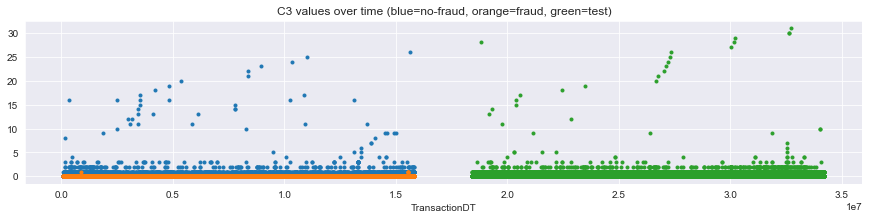

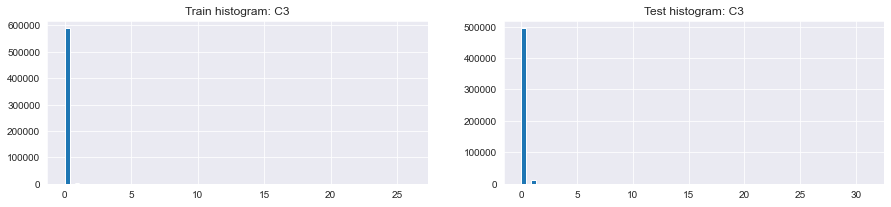

,C3,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,0.006,0.000,0.006,0.027,0.009,0.032
2,std,0.151,0.016,0.153,0.228,0.176,0.239
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,0.000,0.000,0.000,0.000,0.000
7,max,26.000,1.000,26.000,31.000,28.000,31.000
8,unique values,27.000,2.000,27.000,32.000,14.000,26.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C3,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,588111,0.035,20658,"493,779.000"
1,1.000,2137,0.002,5,"12,506.000"
2,2.000,180,0.000,0,320.000
3,3.000,58,0.000,0,37.000
4,4.000,7,0.000,0,11.000
5,16.000,6,0.000,0,1.000
6,9.000,5,0.000,0,3.000
7,11.000,5,0.000,0,1.000
8,14.000,3,0.000,0,1.000
9,13.000,3,0.000,0,1.000


,C3,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,588111,0.035,20658,493779
1,1.000,2137,0.002,5,12506
2,15.000,2,0.000,0,1
3,6.000,1,0.000,0,1
4,19.000,1,0.000,0,1
5,20.000,1,0.000,0,1
6,21.000,1,0.000,0,1
7,18.000,1,0.000,0,1
8,23.000,1,0.000,0,1
9,24.000,1,0.000,0,1


,Column,Correlation with C3
0,C3,1.000
1,V28,0.594
2,V89,0.592
3,V68,0.555
4,V27,0.548
5,D6,0.090
361,V155,-0.039
362,V82,-0.040
363,V148,-0.040
364,V154,-0.042


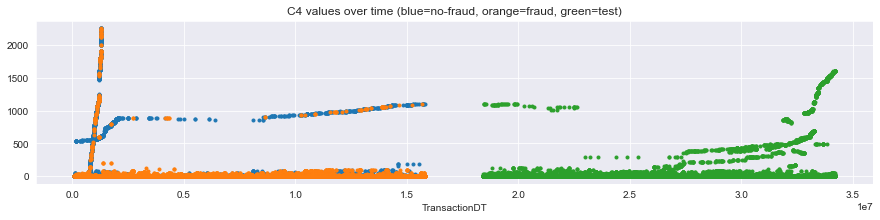

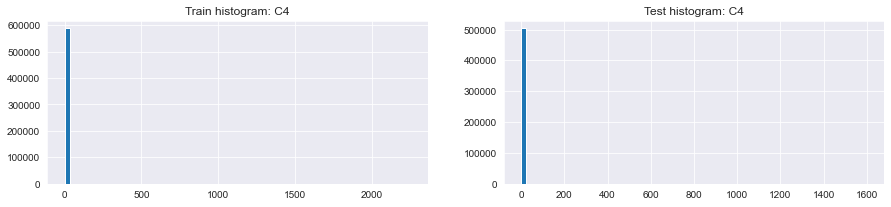

,C4,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,4.092,15.077,3.694,2.386,0.985,2.736
2,std,68.848,125.674,65.839,41.943,23.116,45.440
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,1.000,0.000,0.000,0.000,0.000
6,75%,0.000,2.000,0.000,1.000,0.000,1.000
7,max,"2,253.000","2,251.000","2,253.000","1,601.000","1,100.000","1,601.000"
8,unique values,"1,260.000",224.000,"1,180.000",729.000,99.000,698.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C4,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,451883,0.020,9212,"371,571.000"
1,1.000,111817,0.051,5736,"107,826.000"
2,2.000,12994,0.128,1669,"13,702.000"
3,3.000,4949,0.144,713,"4,307.000"
4,4.000,1902,0.305,581,"1,759.000"
5,5.000,851,0.404,344,"1,159.000"
6,6.000,597,0.402,240,713.000
7,7.000,372,0.325,121,482.000
8,9.000,273,0.546,149,298.000
9,10.000,233,0.682,159,305.000


,C4,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,451883,0.020,9212,371571
1,1.000,111817,0.051,5736,107826
2,2.000,12994,0.128,1669,13702
3,3.000,4949,0.144,713,4307
4,4.000,1902,0.305,581,1759
5,5.000,851,0.404,344,1159
6,6.000,597,0.402,240,713
7,10.000,233,0.682,159,305
8,9.000,273,0.546,149,298
9,7.000,372,0.325,121,482


,Column,Correlation with C4
0,C4,1.000
1,C11,0.975
2,C2,0.972
3,C1,0.968
4,C6,0.962
5,C8,0.960
362,V54,-0.057
363,V197,-0.059
364,V35,-0.059
365,V36,-0.060


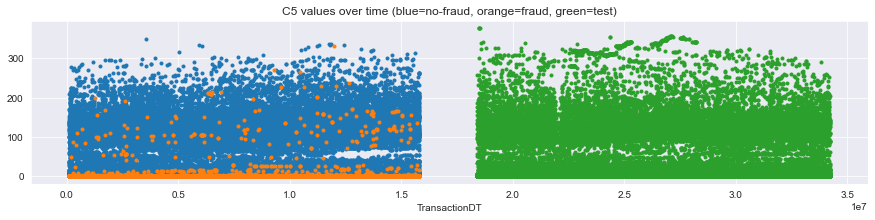

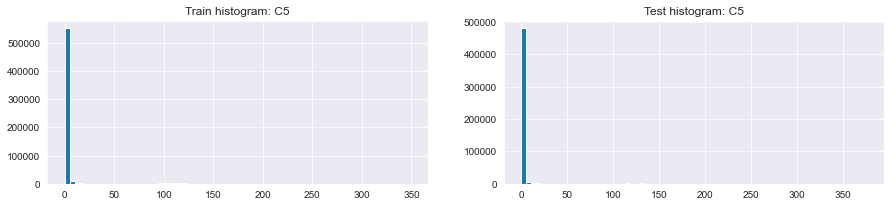

,C5,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,5.572,1.407,5.723,4.963,5.711,4.775
2,std,25.787,12.946,26.122,25.462,26.488,25.196
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,349.000,331.000,349.000,376.000,376.000,355.000
8,unique values,319.000,124.000,319.000,354.000,300.000,353.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C5,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,372435,0.050,18759,334573
1,1.000,122883,0.008,929,96588
2,2.000,34776,0.011,381,29363
3,3.000,13189,0.012,158,10699
4,4.000,6828,0.007,45,5446
5,5.000,3763,0.004,16,2832
6,6.000,2837,0.004,12,1938
7,7.000,1906,0.004,7,1369
8,8.000,1443,0.009,13,991
9,9.000,1076,0.009,10,905


,C5,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,372435,0.050,18759,334573
1,1.000,122883,0.008,929,96588
2,2.000,34776,0.011,381,29363
3,3.000,13189,0.012,158,10699
4,4.000,6828,0.007,45,5446
5,26.000,203,0.113,23,119
6,14.000,420,0.055,23,450
7,13.000,583,0.029,17,546
8,5.000,3763,0.004,16,2832
9,8.000,1443,0.009,13,991


,Column,Correlation with C5
0,C5,1.000
1,C9,0.926
2,C13,0.718
3,C14,0.379
4,V70,0.284
5,V49,0.279
208,V51,-0.096
209,V303,-0.098
210,V50,-0.100
211,V304,-0.108


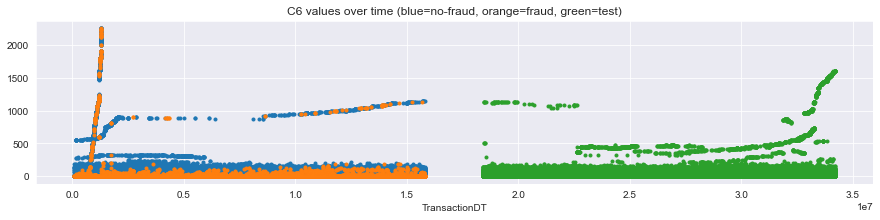

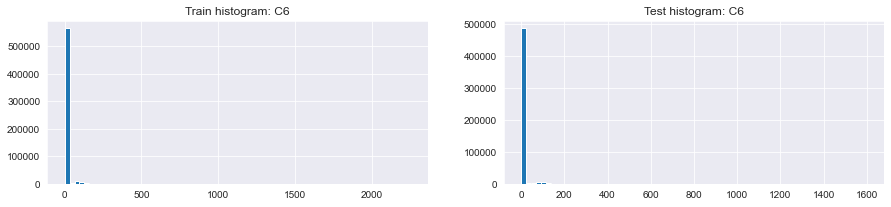

,C6,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,9.071,16.923,8.786,6.855,5.906,7.092
2,std,71.508,126.299,68.689,46.784,29.791,50.137
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,2.000,3.000,2.000,2.000,2.000,2.000
7,max,"2,253.000","2,251.000","2,253.000","1,601.000","1,138.000","1,601.000"
8,unique values,"1,328.000",282.000,"1,270.000",835.000,201.000,820.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C6,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,341552,0.028,9483,"289,685.000"
1,2.000,86103,0.038,3259,"75,316.000"
2,0.000,49066,0.031,1536,"45,707.000"
3,3.000,35490,0.043,1511,"31,815.000"
4,4.000,17805,0.053,949,"16,420.000"
5,5.000,10187,0.060,610,"8,914.000"
6,6.000,6048,0.078,472,"5,293.000"
7,7.000,3934,0.055,215,"3,366.000"
8,8.000,3048,0.057,175,"2,105.000"
9,9.000,2335,0.098,229,"1,563.000"


,C6,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,341552,0.028,9483,289685
1,2.000,86103,0.038,3259,75316
2,0.000,49066,0.031,1536,45707
3,3.000,35490,0.043,1511,31815
4,4.000,17805,0.053,949,16420
5,5.000,10187,0.060,610,8914
6,6.000,6048,0.078,472,5293
7,10.000,1817,0.128,233,1267
8,9.000,2335,0.098,229,1563
9,7.000,3934,0.055,215,3366


,Column,Correlation with C6
0,C6,1.000
1,C11,0.991
2,C14,0.984
3,C1,0.982
4,C2,0.975
5,C4,0.962
375,V75,-0.051
376,V35,-0.052
377,V36,-0.052
378,V197,-0.058


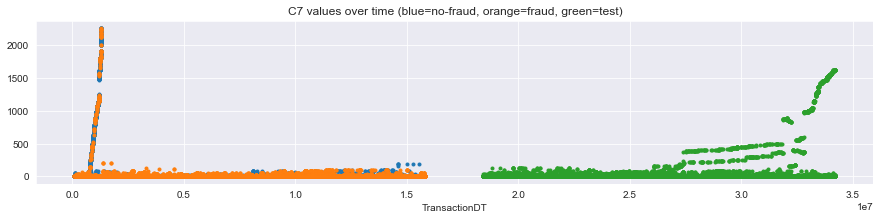

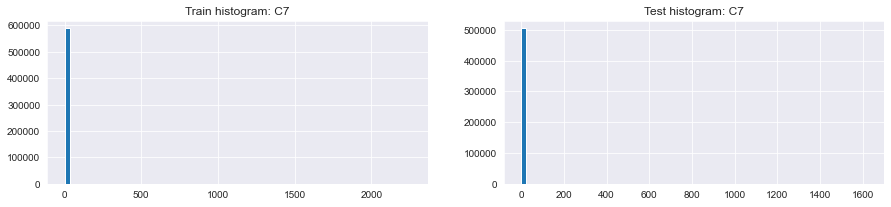

,C7,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,2.848,11.977,2.517,1.678,0.378,2.003
2,std,61.727,115.143,58.861,37.875,3.769,42.297
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,"2,255.000","2,253.000","2,255.000","1,621.000",130.000,"1,621.000"
8,unique values,"1,103.000",197.000,"1,018.000",519.000,74.000,512.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C7,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,523142,0.024,12752,"438,095.000"
1,1.000,51966,0.067,3497,"50,141.000"
2,2.000,7314,0.142,1035,"8,712.000"
3,3.000,2033,0.233,473,"2,734.000"
4,4.000,1109,0.431,478,"1,344.000"
5,5.000,481,0.580,279,691.000
6,6.000,409,0.491,201,478.000
7,7.000,267,0.442,118,369.000
8,9.000,233,0.627,146,216.000
9,10.000,175,0.783,137,199.000


,C7,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,523142,0.024,12752,438095
1,1.000,51966,0.067,3497,50141
2,2.000,7314,0.142,1035,8712
3,4.000,1109,0.431,478,1344
4,3.000,2033,0.233,473,2734
5,5.000,481,0.580,279,691
6,6.000,409,0.491,201,478
7,9.000,233,0.627,146,216
8,10.000,175,0.783,137,199
9,7.000,267,0.442,118,369


,Column,Correlation with C7
0,C7,1.000
1,C12,0.999
2,C10,0.985
3,C8,0.983
4,C2,0.939
5,C1,0.926
315,V54,-0.056
316,V35,-0.057
317,V36,-0.058
318,TransactionID,-0.059


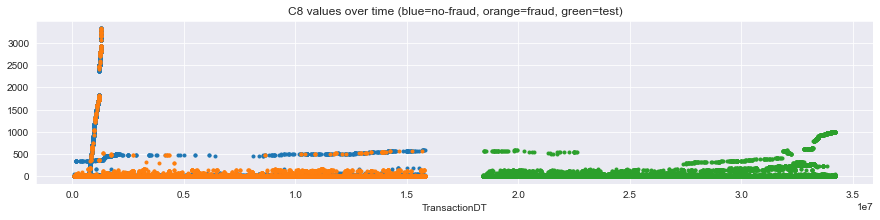

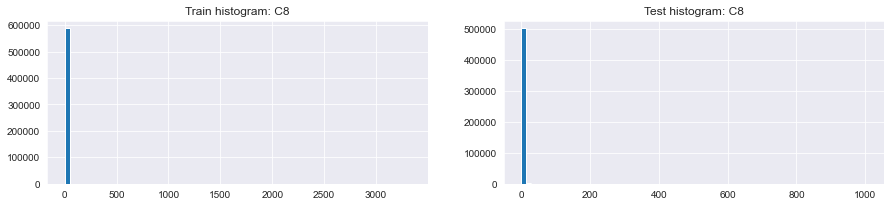

,C8,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,5.145,21.243,4.561,1.894,1.030,2.110
2,std,95.379,176.696,91.023,26.766,13.588,29.140
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,1.000,0.000,0.000,0.000,0.000
6,75%,0.000,2.000,0.000,1.000,0.000,1.000
7,max,"3,331.000","3,328.000","3,331.000","1,005.000",584.000,"1,005.000"
8,unique values,"1,253.000",311.000,"1,115.000",443.000,120.000,422.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C8,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,447667,0.021,9356,"368,637.000"
1,1.000,104994,0.044,4661,"97,332.000"
2,2.000,15927,0.098,1555,"18,261.000"
3,3.000,5493,0.137,754,"6,801.000"
4,4.000,2817,0.182,514,"3,172.000"
5,8.000,1790,0.113,202,810.000
6,6.000,1774,0.204,362,"1,386.000"
7,5.000,1721,0.223,383,"2,035.000"
8,7.000,988,0.238,235,"1,015.000"
9,9.000,718,0.308,221,660.000


,C8,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,447667,0.021,9356,368637
1,1.000,104994,0.044,4661,97332
2,2.000,15927,0.098,1555,18261
3,3.000,5493,0.137,754,6801
4,4.000,2817,0.182,514,3172
5,5.000,1721,0.223,383,2035
6,6.000,1774,0.204,362,1386
7,7.000,988,0.238,235,1015
8,9.000,718,0.308,221,660
9,8.000,1790,0.113,202,810


,Column,Correlation with C8
0,C8,1.000
1,C10,0.997
2,C12,0.983
3,C7,0.983
4,C2,0.976
5,C1,0.968
362,V54,-0.057
363,V35,-0.057
364,V36,-0.059
365,addr2,-0.059


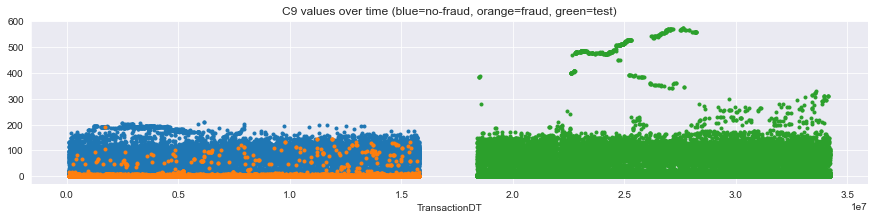

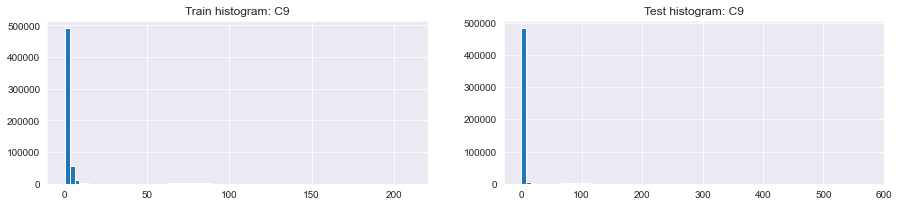

,C9,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,4.480,1.704,4.581,4.612,5.118,4.486
2,std,16.675,8.453,16.889,21.283,18.153,21.994
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,1.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,2.000,1.000,2.000,2.000,2.000,2.000
7,max,210.000,192.000,210.000,572.000,386.000,572.000
8,unique values,205.000,111.000,205.000,355.000,175.000,352.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C9,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,228938,0.019,4364,"191,416.000"
1,0.000,183795,0.067,12256,"157,766.000"
2,2.000,77829,0.022,1686,"68,814.000"
3,3.000,32505,0.026,852,"31,510.000"
4,4.000,16196,0.020,321,"15,476.000"
5,5.000,8648,0.035,301,"7,835.000"
6,6.000,5760,0.030,170,"4,910.000"
7,7.000,3529,0.027,94,"2,970.000"
8,8.000,2548,0.030,76,"2,164.000"
9,9.000,1871,0.078,146,"1,480.000"


,C9,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,183795,0.067,12256,157766
1,1.000,228938,0.019,4364,191416
2,2.000,77829,0.022,1686,68814
3,3.000,32505,0.026,852,31510
4,4.000,16196,0.020,321,15476
5,5.000,8648,0.035,301,7835
6,6.000,5760,0.030,170,4910
7,9.000,1871,0.078,146,1480
8,7.000,3529,0.027,94,2970
9,8.000,2548,0.030,76,2164


,Column,Correlation with C9
0,C9,1.000
1,C5,0.926
2,C13,0.704
3,C14,0.397
4,V70,0.266
5,V49,0.265
208,V51,-0.118
209,V303,-0.122
210,V50,-0.125
211,V304,-0.134


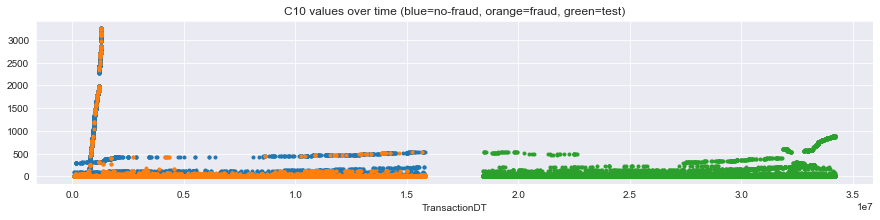

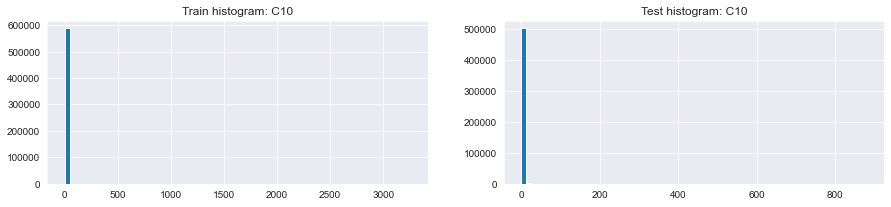

,C10,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,5.240,19.494,4.724,1.810,0.869,2.045
2,std,95.581,176.919,91.239,23.692,11.906,25.806
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,1.000,0.000,0.000,0.000,0.000
6,75%,0.000,2.000,0.000,1.000,0.000,1.000
7,max,"3,257.000","3,254.000","3,257.000",881.000,530.000,881.000
8,unique values,"1,231.000",234.000,"1,163.000",457.000,111.000,439.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C10,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,453442,0.021,9646,"370,978.000"
1,1.000,100231,0.046,4641,"92,343.000"
2,2.000,14938,0.109,1635,"17,752.000"
3,3.000,6417,0.134,861,"6,869.000"
4,4.000,2836,0.197,560,"4,002.000"
5,5.000,1806,0.210,379,"2,550.000"
6,6.000,1286,0.209,269,"1,858.000"
7,7.000,817,0.251,205,"1,235.000"
8,8.000,627,0.281,176,999.000
9,9.000,553,0.228,126,782.000


,C10,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,453442,0.021,9646,370978
1,1.000,100231,0.046,4641,92343
2,2.000,14938,0.109,1635,17752
3,3.000,6417,0.134,861,6869
4,4.000,2836,0.197,560,4002
5,5.000,1806,0.210,379,2550
6,6.000,1286,0.209,269,1858
7,7.000,817,0.251,205,1235
8,8.000,627,0.281,176,999
9,10.000,420,0.374,157,705


,Column,Correlation with C10
0,C10,1.000
1,C8,0.997
2,C7,0.985
3,C12,0.984
4,C2,0.971
5,C1,0.958
362,TransactionDT,-0.058
363,V35,-0.058
364,V36,-0.059
365,TransactionID,-0.062


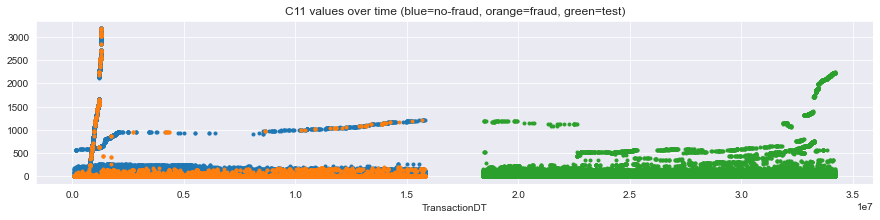

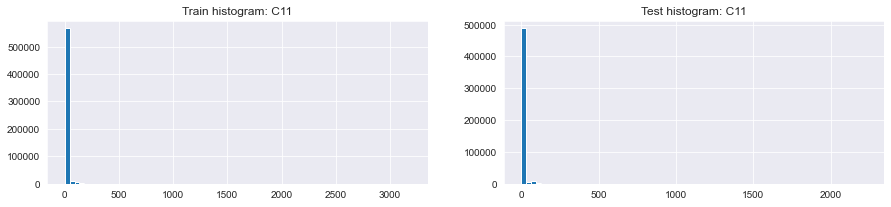

,C11,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,10.242,23.857,9.748,7.485,6.043,7.845
2,std,94.336,170.966,90.307,61.323,31.478,66.725
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,2.000,1.000,1.000,1.000,1.000
6,75%,2.000,4.000,2.000,2.000,2.000,2.000
7,max,"3,188.000","3,186.000","3,188.000","2,234.000","1,196.000","2,234.000"
8,unique values,"1,476.000",330.000,"1,400.000",938.000,246.000,913.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C11,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,389692,0.025,9877,"342,100.000"
1,2.000,89677,0.040,3621,"79,103.000"
2,3.000,34463,0.047,1626,"27,179.000"
3,4.000,16051,0.063,1006,"12,427.000"
4,5.000,9972,0.061,613,"6,394.000"
5,6.000,5966,0.071,422,"3,686.000"
6,7.000,3663,0.069,251,"2,466.000"
7,8.000,2892,0.080,231,"1,799.000"
8,0.000,1864,0.068,127,"4,909.000"
9,9.000,1805,0.077,139,"1,147.000"


,C11,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,389692,0.025,9877,342100
1,2.000,89677,0.040,3621,79103
2,3.000,34463,0.047,1626,27179
3,4.000,16051,0.063,1006,12427
4,5.000,9972,0.061,613,6394
5,6.000,5966,0.071,422,3686
6,7.000,3663,0.069,251,2466
7,8.000,2892,0.080,231,1799
8,10.000,1634,0.091,149,934
9,9.000,1805,0.077,139,1147


,Column,Correlation with C11
0,C11,1.000
1,C1,0.997
2,C2,0.994
3,C6,0.991
4,C4,0.975
5,C8,0.963
375,V76,-0.052
376,TransactionID,-0.054
377,V35,-0.055
378,V36,-0.055


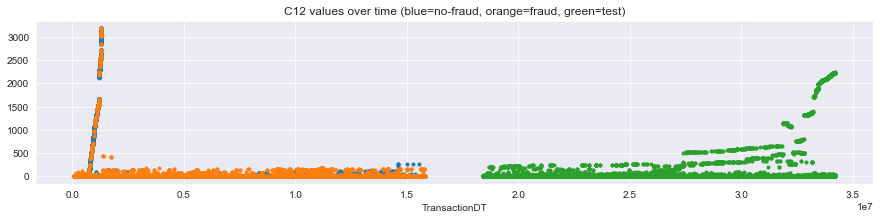

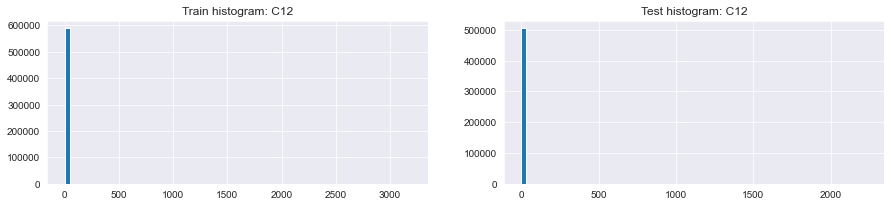

,C12,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,4.076,18.598,3.550,2.649,0.871,3.094
2,std,86.666,162.082,82.601,53.973,9.525,60.147
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,2.000,0.000,1.000,0.000,1.000
7,max,"3,188.000","3,186.000","3,188.000","2,234.000",240.000,"2,234.000"
8,unique values,"1,199.000",282.000,"1,050.000",664.000,129.000,628.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C12,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,489199,0.023,11201,"366,881.000"
1,1.000,76661,0.053,4089,"108,347.000"
2,2.000,12242,0.106,1303,"17,804.000"
3,3.000,4185,0.163,684,"4,980.000"
4,4.000,1716,0.246,422,"2,064.000"
5,5.000,1085,0.268,291,997.000
6,6.000,629,0.353,222,876.000
7,7.000,393,0.351,138,432.000
8,8.000,262,0.439,115,349.000
9,9.000,177,0.395,70,227.000


,C12,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,489199,0.023,11201,366881
1,1.000,76661,0.053,4089,108347
2,2.000,12242,0.106,1303,17804
3,3.000,4185,0.163,684,4980
4,4.000,1716,0.246,422,2064
5,5.000,1085,0.268,291,997
6,6.000,629,0.353,222,876
7,7.000,393,0.351,138,432
8,8.000,262,0.439,115,349
9,10.000,176,0.477,84,185


,Column,Correlation with C12
0,C12,1.000
1,C7,0.999
2,C10,0.984
3,C8,0.983
4,C2,0.940
5,C1,0.928
328,V36,-0.058
329,TransactionID,-0.059
330,addr2,-0.117
331,V11,-0.203


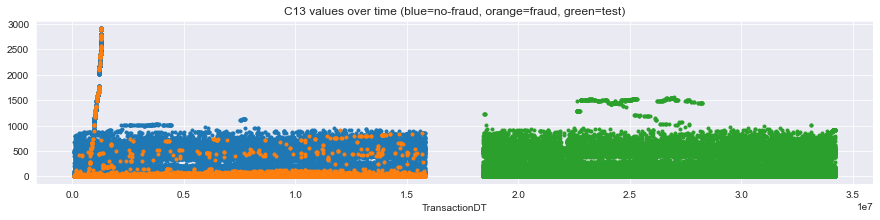

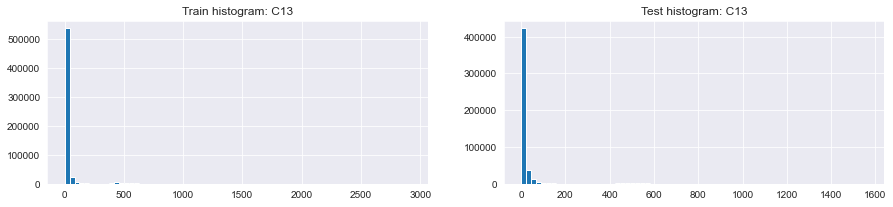

,C13,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","501,943.000","101,339.000","400,605.000"
1,mean,32.540,24.968,32.814,27.816,30.227,27.206
2,std,129.365,165.979,127.832,101.114,99.670,101.467
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,3.000,1.000,3.000,3.000,4.000,2.000
6,75%,12.000,6.000,13.000,13.000,15.000,12.000
7,max,"2,918.000","2,915.000","2,918.000","1,562.000","1,230.000","1,562.000"
8,unique values,"1,597.000",392.000,"1,567.000","1,070.000",797.000,"1,062.000"
9,NaNs,0.000,0.000,0.000,"4,748.000",0.000,"4,748.000"


,C13,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,199337,0.028,5642,"168,280.000"
1,2.000,57616,0.039,2263,"49,947.000"
2,0.000,35460,0.141,5001,"29,778.000"
3,3.000,33033,0.033,1092,"27,602.000"
4,4.000,23704,0.036,852,"19,240.000"
5,5.000,18355,0.032,586,"15,076.000"
6,6.000,15127,0.032,478,"12,659.000"
7,7.000,13001,0.030,384,"10,885.000"
8,8.000,11424,0.032,368,"9,603.000"
9,9.000,10189,0.019,189,"8,972.000"


,C13,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,199337,0.028,5642,168280
1,0.000,35460,0.141,5001,29778
2,2.000,57616,0.039,2263,49947
3,3.000,33033,0.033,1092,27602
4,4.000,23704,0.036,852,19240
5,5.000,18355,0.032,586,15076
6,6.000,15127,0.032,478,12659
7,7.000,13001,0.030,384,10885
8,8.000,11424,0.032,368,9603
9,13.000,8032,0.031,247,6945


,Column,Correlation with C13
0,C13,1.000
1,C14,0.881
2,C6,0.809
3,C11,0.779
4,C1,0.775
5,C2,0.751
375,V21,-0.095
376,V31,-0.096
377,V34,-0.098
378,V15,-0.098


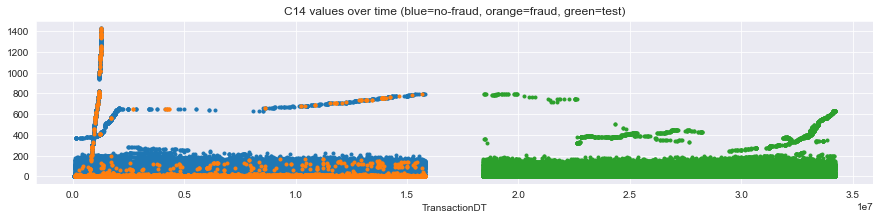

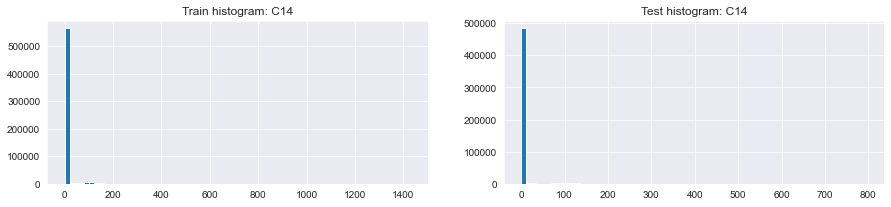

,C14,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,540.000","20,663.000","569,877.000","506,688.000","101,339.000","405,350.000"
1,mean,8.295,10.356,8.220,6.084,6.089,6.083
2,std,49.544,82.903,47.899,28.316,25.508,28.975
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,0.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,2.000,2.000,2.000,2.000,3.000,2.000
7,max,"1,429.000","1,426.000","1,429.000",797.000,797.000,748.000
8,unique values,"1,108.000",244.000,"1,085.000",570.000,204.000,548.000
9,NaNs,0.000,0.000,0.000,3.000,0.000,3.000


,C14,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,320189,0.027,8600,"278,331.000"
1,2.000,93843,0.028,2596,"81,914.000"
2,3.000,44471,0.027,1198,"38,444.000"
3,0.000,35947,0.145,5214,"34,564.000"
4,4.000,25390,0.030,768,"21,074.000"
5,5.000,15655,0.027,420,"11,757.000"
6,6.000,8563,0.033,282,"6,781.000"
7,7.000,5030,0.031,156,"3,987.000"
8,8.000,3471,0.048,167,"2,583.000"
9,9.000,2651,0.065,172,"2,203.000"


,C14,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,320189,0.027,8600,278331
1,0.000,35947,0.145,5214,34564
2,2.000,93843,0.028,2596,81914
3,3.000,44471,0.027,1198,38444
4,4.000,25390,0.030,768,21074
5,5.000,15655,0.027,420,11757
6,6.000,8563,0.033,282,6781
7,9.000,2651,0.065,172,2203
8,8.000,3471,0.048,167,2583
9,7.000,5030,0.031,156,3987


,Column,Correlation with C14
0,C14,1.000
1,C6,0.984
2,C11,0.962
3,C1,0.952
4,C2,0.936
5,C4,0.908
375,V31,-0.074
376,V15,-0.074
377,V21,-0.076
378,V33,-0.078


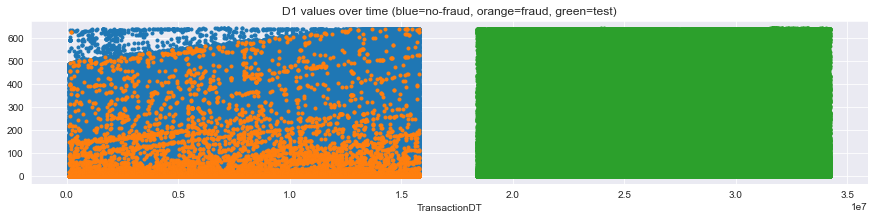

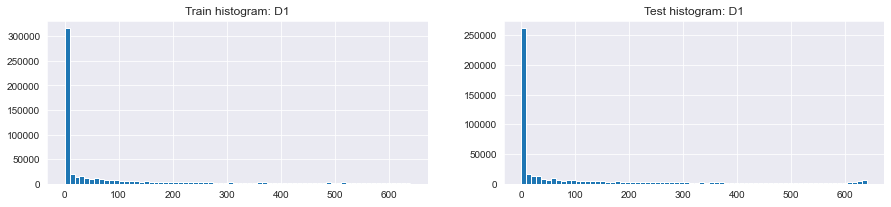

,D1,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"589,271.000","20,617.000","568,654.000","500,660.000","100,922.000","399,739.000"
1,mean,94.348,38.711,96.365,108.208,116.986,105.991
2,std,157.660,100.916,158.973,176.965,180.118,176.090
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,3.000,0.000,4.000,5.000,16.000,3.000
6,75%,122.000,14.000,126.000,148.000,167.000,142.000
7,max,640.000,637.000,640.000,641.000,638.000,641.000
8,unique values,642.000,578.000,642.000,643.000,640.000,643.000
9,NaNs,"1,269.000",46.000,"1,223.000","6,031.000",417.000,"5,614.000"


,D1,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,280130,0.042,11789,227724
1,1.000,8634,0.120,1040,8253
2,2.000,4969,0.114,567,5005
3,3.000,3954,0.099,390,4084
4,4.000,3570,0.075,269,3395
5,7.000,3455,0.044,152,3317
6,6.000,3164,0.076,240,2867
7,5.000,3076,0.077,236,2873
8,14.000,2979,0.035,105,2569
9,8.000,2637,0.057,150,2275


,D1,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,280130,0.042,11789,227724
1,1.000,8634,0.120,1040,8253
2,2.000,4969,0.114,567,5005
3,3.000,3954,0.099,390,4084
4,4.000,3570,0.075,269,3395
5,6.000,3164,0.076,240,2867
6,5.000,3076,0.077,236,2873
7,9.000,2387,0.067,161,1939
8,7.000,3455,0.044,152,3317
9,8.000,2637,0.057,150,2275


,Column,Correlation with D1
0,D1,1.000
1,D2,0.981
2,D15,0.639
3,D11,0.593
4,D4,0.586
5,D10,0.562
375,V153,-0.270
376,V197,-0.272
377,V194,-0.295
378,V283,-0.356


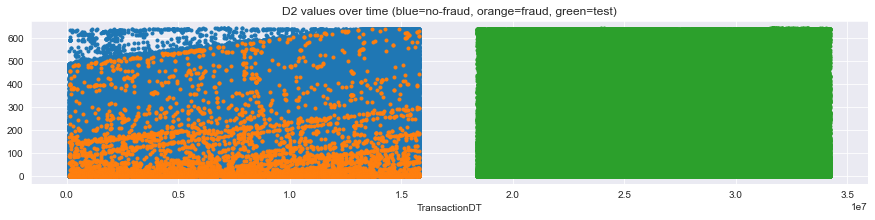

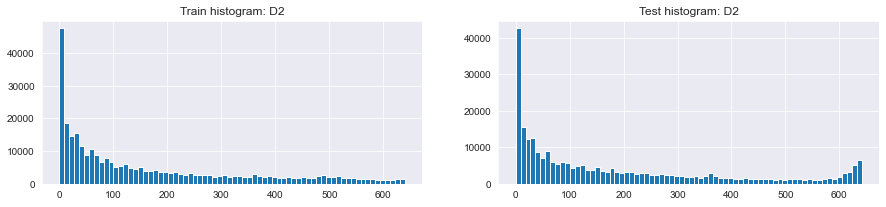

,D2,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"309,743.000","7,870.000","301,873.000","271,922.000","58,869.000","213,054.000"
1,mean,169.563,77.774,171.956,188.667,190.232,188.234
2,std,177.316,128.698,177.774,197.100,195.973,197.408
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,26.000,2.000,27.000,26.000,29.000,24.000
5,50%,97.000,16.000,100.000,112.000,118.000,111.000
6,75%,276.000,95.000,280.000,305.000,301.000,307.000
7,max,640.000,637.000,640.000,641.000,638.000,641.000
8,unique values,642.000,542.000,642.000,643.000,640.000,643.000
9,NaNs,"280,797.000","12,793.000","268,004.000","234,769.000","42,470.000","192,299.000"


,D2,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,280797,0.046,12793,234769
1,0.000,15124,0.062,935,11944
2,1.000,6654,0.115,765,6467
3,2.000,4454,0.099,443,4445
4,3.000,3677,0.089,326,3829
5,4.000,3344,0.063,212,3162
6,7.000,3331,0.036,121,3198
7,6.000,3068,0.067,207,2771
8,5.000,2972,0.066,197,2752
9,14.000,2919,0.030,87,2477


,D2,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,280797,0.046,12793,234769
1,0.000,15124,0.062,935,11944
2,1.000,6654,0.115,765,6467
3,2.000,4454,0.099,443,4445
4,3.000,3677,0.089,326,3829
5,4.000,3344,0.063,212,3162
6,6.000,3068,0.067,207,2771
7,5.000,2972,0.066,197,2752
8,7.000,3331,0.036,121,3198
9,8.000,2593,0.042,110,2140


,Column,Correlation with D2
0,D2,1.000
1,D1,0.981
2,D12,0.669
3,D15,0.618
4,D6,0.601
5,D4,0.570
375,V174,-0.335
376,V283,-0.376
377,V282,-0.454
378,V289,-0.507


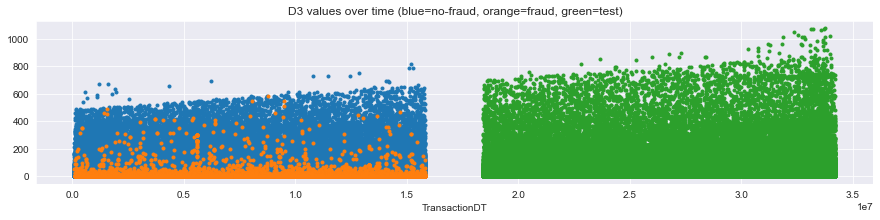

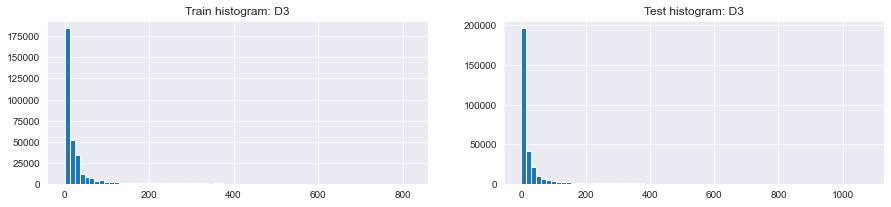

,D3,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"327,662.000","9,619.000","318,043.000","303,549.000","63,607.000","239,943.000"
1,mean,28.343,11.745,28.845,33.395,29.559,34.411
2,std,62.385,42.005,62.830,82.558,68.250,85.924
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,0.000,1.000,1.000,1.000,1.000
5,50%,8.000,1.000,8.000,7.000,8.000,7.000
6,75%,27.000,5.000,28.000,28.000,28.000,28.000
7,max,819.000,582.000,819.000,"1,076.000",754.000,"1,076.000"
8,unique values,650.000,262.000,650.000,888.000,654.000,888.000
9,NaNs,"262,878.000","11,044.000","251,834.000","203,142.000","37,732.000","165,410.000"


,D3,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,262878,0.042,11044,"203,142.000"
1,0.000,73094,0.060,4404,"73,232.000"
2,1.000,21258,0.069,1475,"20,276.000"
3,2.000,13789,0.047,645,"13,103.000"
4,7.000,13320,0.015,200,"11,442.000"
5,3.000,10786,0.032,345,"10,226.000"
6,4.000,9552,0.026,249,"8,664.000"
7,14.000,9547,0.011,108,"8,060.000"
8,6.000,9245,0.020,187,"8,093.000"
9,5.000,8800,0.022,197,"7,722.000"


,D3,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,262878,0.042,11044,203142
1,0.000,73094,0.060,4404,73232
2,1.000,21258,0.069,1475,20276
3,2.000,13789,0.047,645,13103
4,3.000,10786,0.032,345,10226
5,4.000,9552,0.026,249,8664
6,7.000,13320,0.015,200,11442
7,5.000,8800,0.022,197,7722
8,6.000,9245,0.020,187,8093
9,8.000,8092,0.016,131,6859


,Column,Correlation with D3
0,D3,1.000
1,D7,0.818
2,D5,0.707
3,D12,0.349
4,D6,0.305
5,D1,0.280
374,V144,-0.267
375,V330,-0.276
376,V328,-0.280
377,V327,-0.341


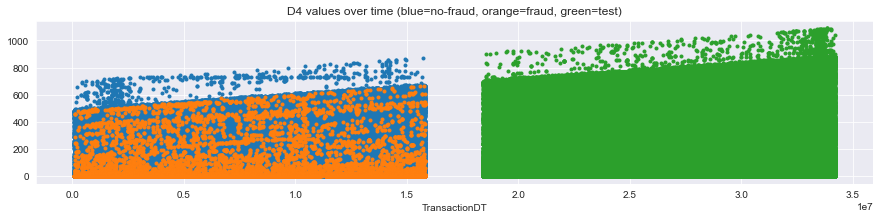

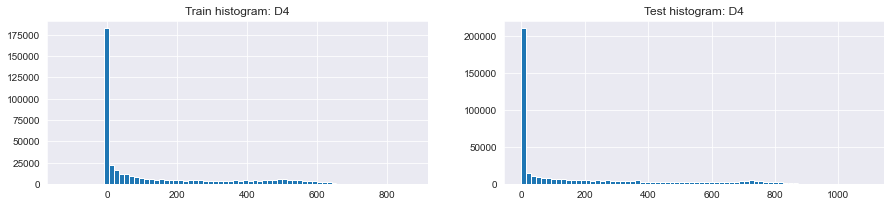

,D4,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,618.000","14,567.000","407,051.000","429,840.000","80,248.000","349,593.000"
1,mean,140.002,72.103,142.432,175.061,180.751,173.754
2,std,191.097,140.656,192.213,250.417,233.900,254.040
3,min,-122.000,0.000,-122.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,26.000,1.000,28.000,21.000,54.000,14.000
6,75%,253.000,61.000,261.000,290.000,313.000,284.000
7,max,869.000,667.000,869.000,"1,091.000",924.000,"1,091.000"
8,unique values,809.000,606.000,809.000,"1,057.000",779.000,"1,056.000"
9,NaNs,"168,922.000","6,096.000","162,826.000","76,851.000","21,091.000","55,760.000"


,D4,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,168922,0.036,6096,"76,851.000"
1,0.000,166571,0.040,6603,"178,278.000"
2,1.000,5315,0.145,770,"5,750.000"
3,2.000,3385,0.126,427,"3,502.000"
4,3.000,2572,0.108,279,"2,871.000"
5,4.000,2354,0.085,200,"2,459.000"
6,7.000,2317,0.061,141,"2,165.000"
7,5.000,2172,0.101,219,"2,125.000"
8,14.000,2117,0.033,70,"1,644.000"
9,6.000,2038,0.074,151,"2,093.000"


,D4,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,166571,0.040,6603,178278
1,-999.000,168922,0.036,6096,76851
2,1.000,5315,0.145,770,5750
3,2.000,3385,0.126,427,3502
4,3.000,2572,0.108,279,2871
5,5.000,2172,0.101,219,2125
6,4.000,2354,0.085,200,2459
7,6.000,2038,0.074,151,2093
8,7.000,2317,0.061,141,2165
9,9.000,1548,0.081,125,1241


,Column,Correlation with D4
0,D4,1.000
1,D12,1.000
2,D6,0.957
3,D15,0.752
4,D11,0.658
5,D10,0.637
375,V149,-0.361
376,V155,-0.374
377,V148,-0.377
378,V154,-0.377


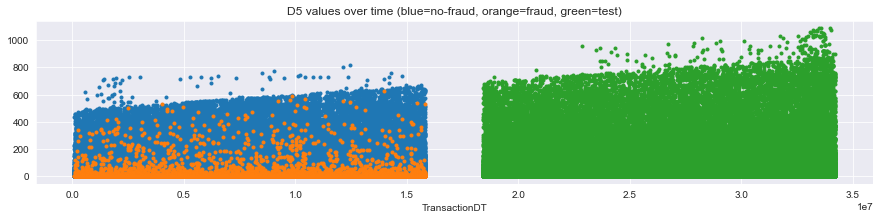

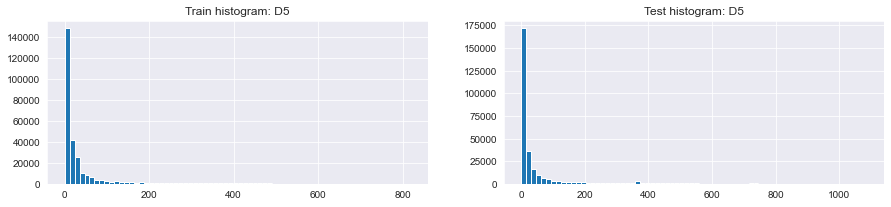

,D5,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"280,699.000","10,880.000","269,819.000","282,316.000","58,085.000","224,232.000"
1,mean,42.336,13.688,43.491,50.978,42.060,53.288
2,std,89.000,51.892,89.986,116.830,94.246,121.894
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,0.000,1.000,0.000,1.000,0.000
5,50%,10.000,0.000,10.000,8.000,9.000,8.000
6,75%,32.000,3.000,34.000,34.000,32.000,34.000
7,max,819.000,625.000,819.000,"1,088.000",779.000,"1,088.000"
8,unique values,689.000,342.000,689.000,962.000,711.000,962.000
9,NaNs,"309,841.000","9,783.000","300,058.000","224,375.000","43,254.000","181,121.000"


,D5,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,309841,0.032,9783,224375
1,0.000,65377,0.102,6638,73887
2,1.000,15282,0.066,1006,15642
3,2.000,10244,0.044,451,10188
4,7.000,9734,0.015,149,9103
5,3.000,7987,0.034,270,7977
6,14.000,7340,0.008,61,6557
7,4.000,7176,0.028,198,6755
8,6.000,6907,0.020,141,6521
9,5.000,6696,0.025,168,6196


,D5,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,309841,0.032,9783,224375
1,0.000,65377,0.102,6638,73887
2,1.000,15282,0.066,1006,15642
3,2.000,10244,0.044,451,10188
4,3.000,7987,0.034,270,7977
5,4.000,7176,0.028,198,6755
6,5.000,6696,0.025,168,6196
7,7.000,9734,0.015,149,9103
8,6.000,6907,0.020,141,6521
9,8.000,6140,0.019,114,5549


,Column,Correlation with D5
0,D5,1.000
1,D7,0.986
2,D3,0.707
3,D12,0.565
4,D6,0.551
5,D4,0.314
372,V155,-0.345
373,V153,-0.346
374,V148,-0.347
375,V158,-0.368


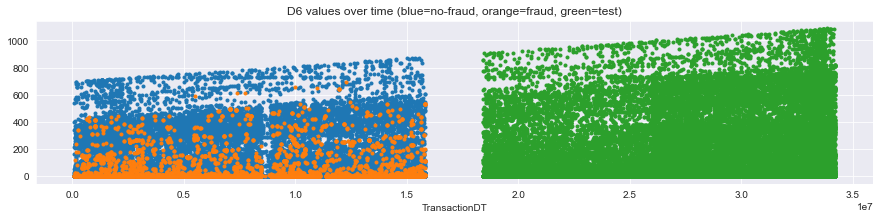

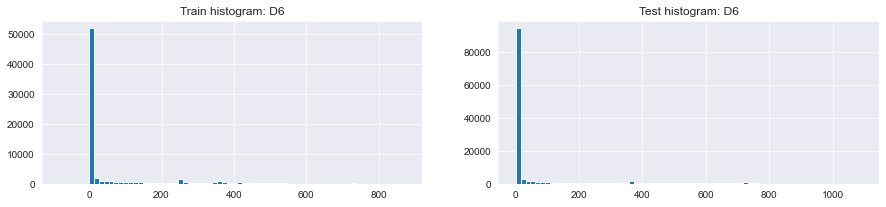

,D6,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"73,187.000","7,718.000","65,469.000","124,783.000","11,194.000","113,589.000"
1,mean,69.806,45.856,72.629,82.443,89.539,81.744
2,std,143.669,101.424,147.601,192.868,178.595,194.204
3,min,-83.000,0.000,-83.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,40.000,24.000,43.000,13.000,68.750,10.000
7,max,873.000,694.000,873.000,"1,091.000",939.000,"1,091.000"
8,unique values,830.000,381.000,830.000,"1,073.000",726.000,"1,072.000"
9,NaNs,"517,353.000","12,945.000","504,408.000","381,908.000","90,145.000","291,764.000"


,D6,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,517353,0.025,12945,"381,908.000"
1,0.000,45782,0.093,4253,"83,120.000"
2,1.000,1588,0.261,415,"2,475.000"
3,256.000,895,0.012,11,22.000
4,2.000,855,0.215,184,"1,482.000"
5,3.000,642,0.209,134,"1,192.000"
6,4.000,579,0.143,83,927.000
7,5.000,436,0.236,103,783.000
8,7.000,380,0.184,70,717.000
9,6.000,353,0.142,50,710.000


,D6,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,517353,0.025,12945,381908
1,0.000,45782,0.093,4253,83120
2,1.000,1588,0.261,415,2475
3,2.000,855,0.215,184,1482
4,3.000,642,0.209,134,1192
5,5.000,436,0.236,103,783
6,4.000,579,0.143,83,927
7,7.000,380,0.184,70,717
8,9.000,258,0.213,55,352
9,8.000,288,0.181,52,474


,Column,Correlation with D6
0,D6,1.000
1,D12,0.977
2,D4,0.957
3,D15,0.701
4,D2,0.601
5,D5,0.551
342,V149,-0.699
343,V155,-0.704
344,V148,-0.704
345,V154,-0.704


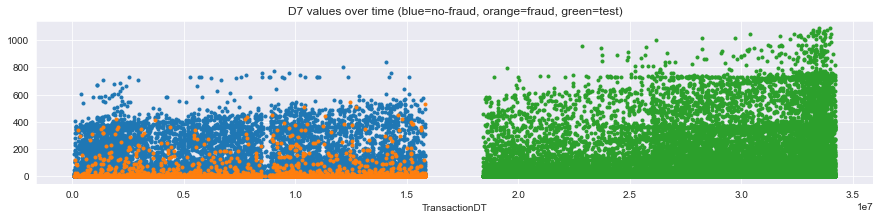

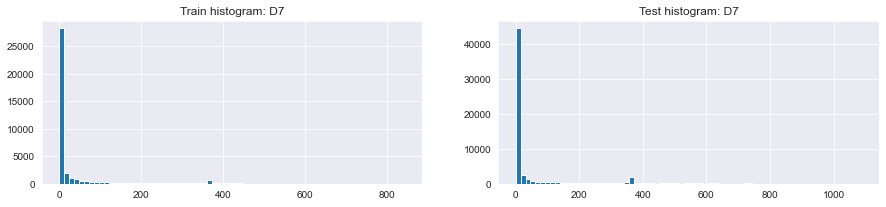

,D7,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"38,917.000","5,790.000","33,127.000","60,133.000","7,160.000","52,973.000"
1,mean,41.639,11.292,46.943,61.816,33.611,65.628
2,std,99.743,46.743,105.436,150.300,94.097,155.964
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,17.000,0.000,24.000,18.000,9.000,20.000
7,max,843.000,547.000,843.000,"1,088.000",798.000,"1,088.000"
8,unique values,598.000,242.000,598.000,905.000,440.000,904.000
9,NaNs,"551,623.000","14,873.000","536,750.000","446,558.000","94,179.000","352,380.000"


,D7,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,551623,0.027,14873,"446,558.000"
1,0.000,21135,0.212,4472,"31,939.000"
2,1.000,1717,0.142,243,"2,868.000"
3,2.000,998,0.108,108,"1,850.000"
4,3.000,791,0.086,68,"1,296.000"
5,7.000,606,0.059,36,886.000
6,4.000,601,0.093,56,"1,004.000"
7,5.000,513,0.097,50,852.000
8,6.000,435,0.074,32,792.000
9,8.000,387,0.080,31,567.000


,D7,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,551623,0.027,14873,446558
1,0.000,21135,0.212,4472,31939
2,1.000,1717,0.142,243,2868
3,2.000,998,0.108,108,1850
4,3.000,791,0.086,68,1296
5,4.000,601,0.093,56,1004
6,5.000,513,0.097,50,852
7,7.000,606,0.059,36,886
8,6.000,435,0.074,32,792
9,8.000,387,0.080,31,567


,Column,Correlation with D7
0,D7,1.000
1,D5,0.986
2,D3,0.818
3,D4,0.574
4,D12,0.554
5,D6,0.507
342,V328,-0.267
343,V144,-0.269
344,V152,-0.276
345,V327,-0.332


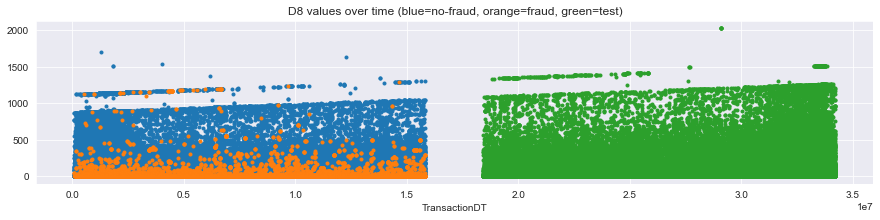

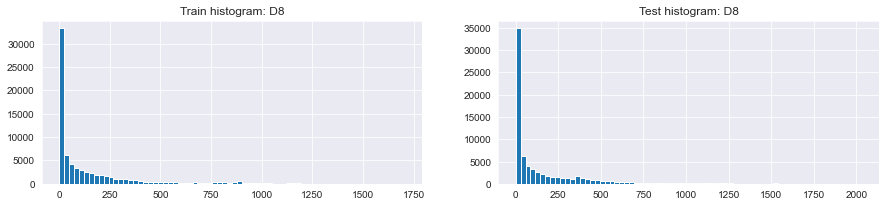

,D8,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"74,926.000","7,827.000","67,099.000","74,338.000","10,200.000","64,138.000"
1,mean,146.058,49.309,157.344,160.834,146.639,163.092
2,std,231.664,133.255,237.988,257.004,249.692,258.077
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.958,0.750,1.750,1.083,0.917,1.208
5,50%,37.875,2.667,50.583,37.708,30.917,38.875
6,75%,187.958,32.375,207.542,221.125,182.875,227.750
7,max,"1,707.792","1,290.583","1,707.792","2,029.583","1,373.042","2,029.583"
8,unique values,"12,354.000","1,352.000","12,207.000","13,245.000","3,683.000","12,457.000"
9,NaNs,"515,614.000","12,836.000","502,778.000","432,353.000","91,139.000","341,215.000"


,D8,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,515614,0.025,12836,"432,353.000"
1,0.792,1351,0.179,242,"1,263.000"
2,0.833,1327,0.158,210,"1,282.000"
3,0.875,1304,0.199,260,"1,299.000"
4,0.958,1300,0.198,257,"1,180.000"
5,0.917,1259,0.181,228,"1,132.000"
6,0.750,1248,0.174,217,"1,107.000"
7,0.708,1175,0.123,144,"1,038.000"
8,0.083,1118,0.167,187,"1,083.000"
9,0.667,1097,0.121,133,"1,075.000"


,D8,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,515614,0.025,12836,432353
1,0.875,1304,0.199,260,1299
2,0.958,1300,0.198,257,1180
3,0.792,1351,0.179,242,1263
4,0.917,1259,0.181,228,1132
5,0.750,1248,0.174,217,1107
6,0.833,1327,0.158,210,1282
7,0.083,1118,0.167,187,1083
8,0.000,835,0.204,170,763
9,0.125,1028,0.162,167,1052


,Column,Correlation with D8
0,D8,1.000
1,D13,0.521
2,D2,0.275
3,D5,0.249
4,D15,0.227
5,V192,0.227
342,V171,-0.206
343,V197,-0.206
344,V79,-0.229
345,V194,-0.233


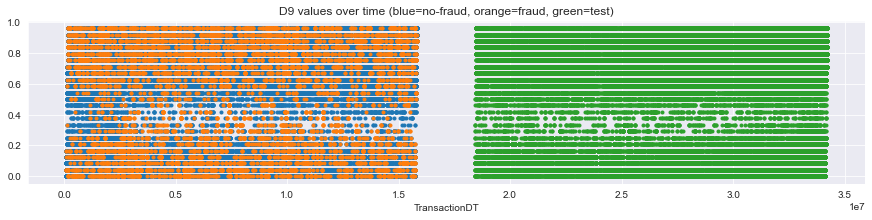

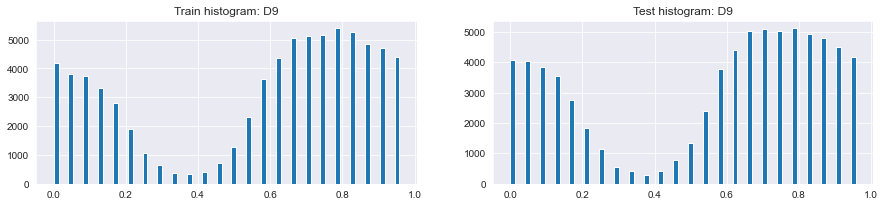

,D9,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"74,926.000","7,827.000","67,099.000","74,338.000","10,200.000","64,138.000"
1,mean,0.561,0.520,0.566,0.554,0.554,0.554
2,std,0.317,0.333,0.315,0.317,0.314,0.318
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.208,0.167,0.208,0.208,0.208,0.208
5,50%,0.667,0.625,0.667,0.667,0.667,0.667
6,75%,0.833,0.833,0.833,0.792,0.792,0.792
7,max,0.958,0.958,0.958,0.958,0.958,0.958
8,unique values,25.000,25.000,25.000,25.000,25.000,25.000
9,NaNs,"515,614.000","12,836.000","502,778.000","432,353.000","91,139.000","341,215.000"


,D9,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,515614,0.025,12836,432353
1,0.792,5388,0.096,516,5111
2,0.833,5273,0.095,502,4939
3,0.750,5147,0.092,473,5033
4,0.708,5132,0.081,414,5106
5,0.667,5069,0.075,380,5021
6,0.875,4857,0.106,517,4805
7,0.917,4694,0.106,499,4503
8,0.958,4411,0.121,533,4179
9,0.625,4380,0.060,262,4415


,D9,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,515614,0.025,12836,432353
1,0.958,4411,0.121,533,4179
2,0.875,4857,0.106,517,4805
3,0.792,5388,0.096,516,5111
4,0.833,5273,0.095,502,4939
5,0.917,4694,0.106,499,4503
6,0.750,5147,0.092,473,5033
7,0.083,3726,0.124,461,3841
8,0.000,4190,0.108,454,4062
9,0.167,2786,0.151,421,2760


,Column,Correlation with D9
0,D9,1.000
1,TransactionAmt,0.074
2,D8,0.066
3,D10,0.063
4,D15,0.055
5,D2,0.043
342,V79,-0.079
343,V15,-0.080
344,V33,-0.081
345,V94,-0.102


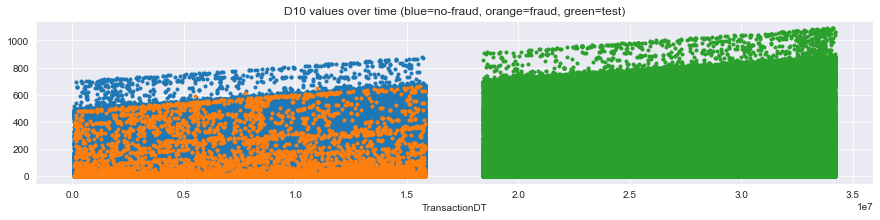

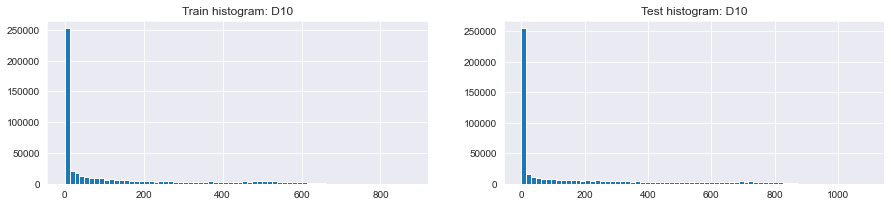

,D10,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,518.000","16,777.000","497,741.000","494,146.000","93,904.000","400,243.000"
1,mean,123.982,52.364,126.396,159.811,166.648,158.206
2,std,182.615,127.051,183.711,240.567,226.360,243.752
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,15.000,0.000,18.000,10.000,42.000,4.000
6,75%,197.000,14.000,205.000,250.000,266.000,246.000
7,max,876.000,664.000,876.000,"1,091.000",947.000,"1,091.000"
8,unique values,819.000,614.000,819.000,"1,076.000",820.000,"1,076.000"
9,NaNs,"76,022.000","3,886.000","72,136.000","12,545.000","7,435.000","5,110.000"


,D10,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,221930,0.047,10541,227999
1,-999.000,76022,0.051,3886,12545
2,1.000,5186,0.105,542,4298
3,2.000,3482,0.097,339,2782
4,3.000,2756,0.069,189,2169
5,7.000,2740,0.042,115,1817
6,14.000,2512,0.024,61,1698
7,5.000,2377,0.053,125,1670
8,28.000,2346,0.016,38,1453
9,4.000,2344,0.063,147,1945


,D10,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,221930,0.047,10541,227999
1,-999.000,76022,0.051,3886,12545
2,1.000,5186,0.105,542,4298
3,2.000,3482,0.097,339,2782
4,3.000,2756,0.069,189,2169
5,4.000,2344,0.063,147,1945
6,5.000,2377,0.053,125,1670
7,7.000,2740,0.042,115,1817
8,6.000,2303,0.045,103,1688
9,9.000,1769,0.050,88,1132


,Column,Correlation with D10
0,D10,1.000
1,D15,0.712
2,D4,0.637
3,D11,0.610
4,D1,0.562
5,D2,0.526
375,V156,-0.409
376,V155,-0.427
377,V148,-0.428
378,V154,-0.428


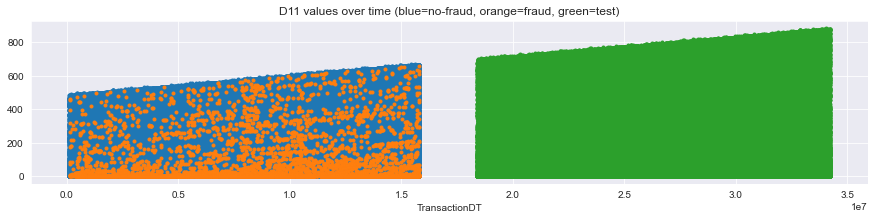

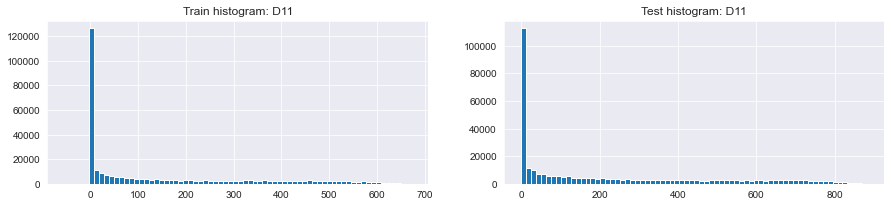

,D11,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,146.621,87.314,147.808,218.415,197.139,224.585
2,std,186.043,146.561,186.555,253.092,227.898,259.617
3,min,-53.000,0.000,-53.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,43.000,7.000,44.000,102.000,93.000,106.000
6,75%,274.000,107.750,277.000,401.000,366.000,412.000
7,max,670.000,655.000,670.000,883.000,742.000,883.000
8,unique values,677.000,557.000,677.000,881.000,739.000,881.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,D11,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,279287,0.052,14557,"176,518.000"
1,0.000,112281,0.020,2192,"93,125.000"
2,1.000,3165,0.088,278,"3,812.000"
3,2.000,2020,0.083,168,"2,334.000"
4,3.000,1642,0.078,128,"1,889.000"
5,7.000,1639,0.043,70,"1,564.000"
6,14.000,1496,0.021,31,"1,403.000"
7,4.000,1449,0.077,112,"1,709.000"
8,6.000,1440,0.062,90,"1,553.000"
9,5.000,1424,0.053,75,"1,414.000"


,D11,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,0.000,112281,0.020,2192,93125
2,1.000,3165,0.088,278,3812
3,2.000,2020,0.083,168,2334
4,3.000,1642,0.078,128,1889
5,4.000,1449,0.077,112,1709
6,6.000,1440,0.062,90,1553
7,5.000,1424,0.053,75,1414
8,7.000,1639,0.043,70,1564
9,11.000,1011,0.055,56,993


,Column,Correlation with D11
0,D11,1.000
1,D15,0.765
2,D4,0.658
3,D10,0.610
4,D1,0.593
5,D2,0.563
168,V36,-0.270
169,V35,-0.284
170,V76,-0.289
171,V75,-0.309


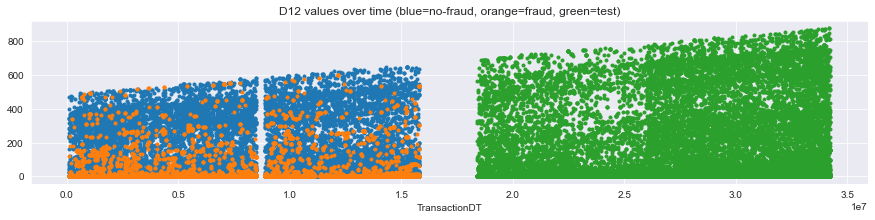

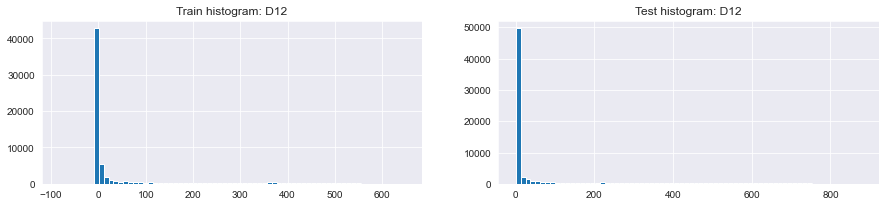

,D12,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"64,717.000","7,598.000","57,119.000","69,254.000","9,801.000","59,453.000"
1,mean,54.038,44.203,55.346,77.404,69.286,78.743
2,std,124.275,99.349,127.166,176.219,154.518,179.510
3,min,-83.000,0.000,-83.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,13.000,22.000,11.000,25.000,24.000,25.000
7,max,648.000,602.000,648.000,879.000,728.000,879.000
8,unique values,636.000,364.000,635.000,867.000,602.000,867.000
9,NaNs,"525,823.000","13,065.000","512,758.000","437,437.000","91,538.000","345,900.000"


,D12,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,525823,0.025,13065,"437,437.000"
1,0.000,42756,0.099,4219,"40,855.000"
2,1.000,1526,0.275,420,"2,043.000"
3,2.000,818,0.224,183,"1,272.000"
4,3.000,634,0.219,139,"1,061.000"
5,4.000,564,0.142,80,798.000
6,5.000,418,0.239,100,691.000
7,7.000,373,0.196,73,658.000
8,6.000,341,0.147,50,630.000
9,8.000,273,0.179,49,414.000


,D12,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,525823,0.025,13065,437437
1,0.000,42756,0.099,4219,40855
2,1.000,1526,0.275,420,2043
3,2.000,818,0.224,183,1272
4,3.000,634,0.219,139,1061
5,5.000,418,0.239,100,691
6,4.000,564,0.142,80,798
7,7.000,373,0.196,73,658
8,9.000,249,0.217,54,309
9,6.000,341,0.147,50,630


,Column,Correlation with D12
0,D12,1.000
1,D4,1.000
2,D6,0.977
3,D2,0.669
4,D15,0.608
5,D5,0.565
287,V195,-0.282
288,V194,-0.288
289,V198,-0.293
290,V197,-0.311


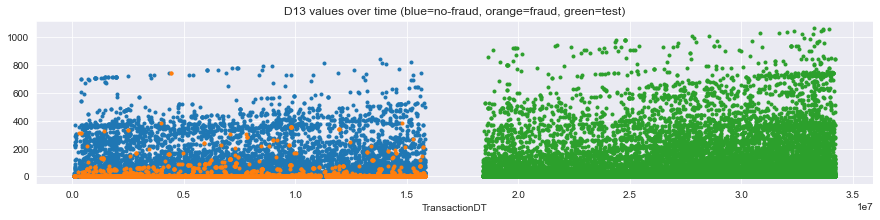

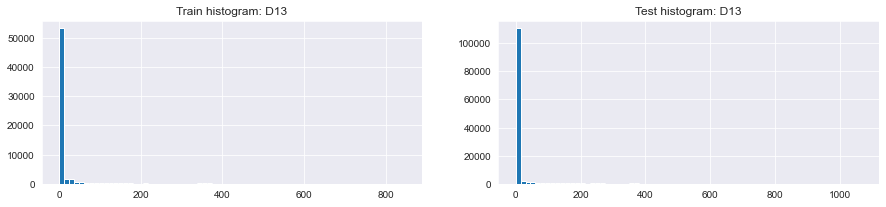

,D13,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"61,952.000","6,837.000","55,115.000","123,384.000","10,039.000","113,345.000"
1,mean,17.901,6.492,19.317,18.226,24.144,17.702
2,std,67.614,31.330,70.703,78.080,82.980,77.610
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,0.000,0.000,0.000,1.000,0.000
7,max,847.000,745.000,847.000,"1,066.000",946.000,"1,066.000"
8,unique values,578.000,130.000,578.000,806.000,398.000,790.000
9,NaNs,"528,588.000","13,826.000","514,762.000","383,307.000","91,300.000","292,008.000"


,D13,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,528588,0.026,13826,"383,307.000"
1,0.000,48840,0.111,5428,"101,387.000"
2,1.000,1097,0.228,250,"2,103.000"
3,26.000,891,0.001,1,118.000
4,2.000,623,0.291,181,"1,294.000"
5,3.000,476,0.197,94,898.000
6,4.000,366,0.175,64,702.000
7,19.000,343,0.000,0,158.000
8,5.000,316,0.203,64,552.000
9,7.000,303,0.158,48,623.000


,D13,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,528588,0.026,13826,383307
1,0.000,48840,0.111,5428,101387
2,1.000,1097,0.228,250,2103
3,2.000,623,0.291,181,1294
4,3.000,476,0.197,94,898
5,4.000,366,0.175,64,702
6,5.000,316,0.203,64,552
7,7.000,303,0.158,48,623
8,9.000,203,0.222,45,355
9,6.000,262,0.164,43,584


,Column,Correlation with D13
0,D13,1.000
1,D8,0.521
2,D15,0.431
3,D6,0.420
4,D2,0.394
5,D4,0.384
342,V188,-0.284
343,V195,-0.709
344,V198,-0.715
345,V194,-0.723


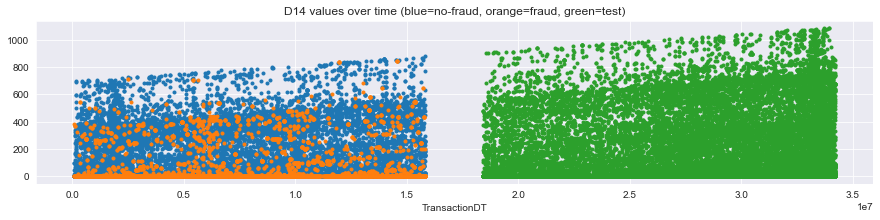

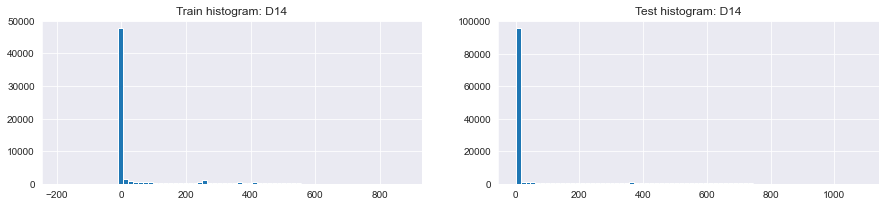

,D14,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"62,187.000","7,213.000","54,974.000","115,194.000","9,735.000","105,459.000"
1,mean,57.724,54.465,58.152,58.163,76.290,56.490
2,std,136.312,126.586,137.533,164.016,168.656,163.480
3,min,-193.000,0.000,-193.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,2.000,9.000,1.000,0.000,17.000,0.000
7,max,878.000,847.000,878.000,"1,085.000",938.000,"1,085.000"
8,unique values,803.000,382.000,801.000,"1,032.000",648.000,"1,029.000"
9,NaNs,"528,353.000","13,450.000","514,903.000","391,497.000","91,604.000","299,894.000"


,D14,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,528353,0.025,13450,"391,497.000"
1,0.000,45266,0.098,4434,"89,500.000"
2,1.000,1105,0.361,399,"1,744.000"
3,256.000,658,0.002,1,19.000
4,2.000,495,0.398,197,740.000
5,3.000,307,0.313,96,498.000
6,249.000,284,0.000,0,15.000
7,4.000,260,0.235,61,531.000
8,7.000,233,0.189,44,363.000
9,5.000,210,0.219,46,478.000


,D14,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,528353,0.025,13450,391497
1,0.000,45266,0.098,4434,89500
2,1.000,1105,0.361,399,1744
3,2.000,495,0.398,197,740
4,3.000,307,0.313,96,498
5,4.000,260,0.235,61,531
6,8.000,158,0.316,50,234
7,5.000,210,0.219,46,478
8,7.000,233,0.189,44,363
9,6.000,183,0.240,44,333


,Column,Correlation with D14
0,D14,1.000
1,D10,0.337
2,V326,0.269
3,V327,0.261
4,V335,0.244
5,V330,0.242
342,V153,-0.250
343,V255,-0.310
344,V256,-0.310
345,V251,-0.654


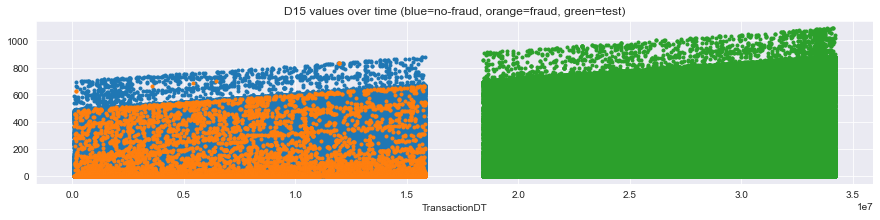

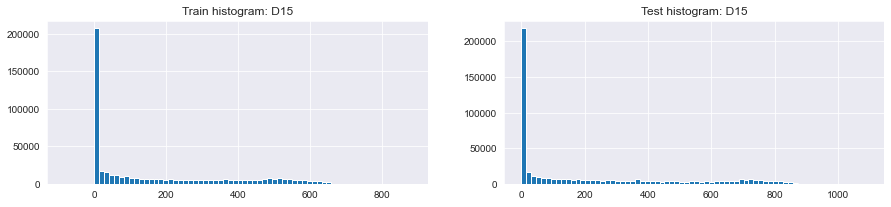

,D15,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,427.000","16,387.000","485,040.000","494,622.000","94,029.000","400,594.000"
1,mean,163.745,78.246,166.633,206.854,216.942,204.486
2,std,202.727,151.957,203.596,269.419,250.888,273.533
3,min,-83.000,0.000,-83.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,52.000,1.000,56.000,48.000,99.000,35.000
6,75%,314.000,63.000,321.000,370.000,406.000,365.000
7,max,879.000,835.000,879.000,"1,091.000",948.000,"1,091.000"
8,unique values,860.000,642.000,860.000,"1,079.000",850.000,"1,079.000"
9,NaNs,"89,113.000","4,276.000","84,837.000","12,069.000","7,310.000","4,759.000"


,D15,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,174246,0.045,7886,"183,720.000"
1,-999.000,89113,0.048,4276,"12,069.000"
2,1.000,5936,0.121,716,"6,202.000"
3,2.000,3691,0.119,440,"3,793.000"
4,3.000,2878,0.092,265,"3,106.000"
5,7.000,2577,0.052,134,"2,360.000"
6,4.000,2573,0.072,184,"2,747.000"
7,5.000,2336,0.076,178,"2,202.000"
8,6.000,2276,0.060,137,"2,276.000"
9,14.000,2265,0.039,89,"1,853.000"


,D15,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,174246,0.045,7886,183720
1,-999.000,89113,0.048,4276,12069
2,1.000,5936,0.121,716,6202
3,2.000,3691,0.119,440,3793
4,3.000,2878,0.092,265,3106
5,4.000,2573,0.072,184,2747
6,5.000,2336,0.076,178,2202
7,6.000,2276,0.060,137,2276
8,7.000,2577,0.052,134,2360
9,8.000,1973,0.060,119,1674


,Column,Correlation with D15
0,D15,1.000
1,D11,0.765
2,D4,0.752
3,D10,0.712
4,D6,0.701
5,D1,0.639
375,V149,-0.439
376,V155,-0.443
377,V154,-0.444
378,V148,-0.445


,M1,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,319440,6342,313098,330052,74212,255841
1,unique,2,1,2,2,2,2
2,top,T,T,T,T,T,T
3,freq,319415,6342,313073,330021,74202,255820
4,unique values,3,2,3,3,3,3
5,NaNs,271100,14321,256779,176639,27127,149512
6,NaNs share,0.459,0.693,0.451,0.349,0.268,0.369


,M1,Count in train (desc),Mean target,Sum target,Count in test
0,T,319415,0.020,6342,330021
1,-999,271100,0.053,14321,176639
2,F,25,0.000,0,31


,M1,Count in train,Mean target,Sum target (desc),Count in test
0,-999,271100,0.053,14321,176639
1,T,319415,0.020,6342,330021
2,F,25,0.000,0,31


,M2,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,319440,6342,313098,330052,74212,255841
1,unique,2,2,2,2,2,2
2,top,T,T,T,T,T,T
3,freq,285468,5158,280310,302855,67868,234988
4,unique values,3,3,3,3,3,3
5,NaNs,271100,14321,256779,176639,27127,149512
6,NaNs share,0.459,0.693,0.451,0.349,0.268,0.369


,M2,Count in train (desc),Mean target,Sum target,Count in test
0,T,285468,0.018,5158,302855
1,-999,271100,0.053,14321,176639
2,F,33972,0.035,1184,27197


,M2,Count in train,Mean target,Sum target (desc),Count in test
0,-999,271100,0.053,14321,176639
1,T,285468,0.018,5158,302855
2,F,33972,0.035,1184,27197


,M3,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,319440,6342,313098,330052,74212,255841
1,unique,2,2,2,2,2,2
2,top,T,T,T,T,T,T
3,freq,251731,4293,247438,266513,59925,206589
4,unique values,3,3,3,3,3,3
5,NaNs,271100,14321,256779,176639,27127,149512
6,NaNs share,0.459,0.693,0.451,0.349,0.268,0.369


,M3,Count in train (desc),Mean target,Sum target,Count in test
0,-999,271100,0.053,14321,176639
1,T,251731,0.017,4293,266513
2,F,67709,0.030,2049,63539


,M3,Count in train,Mean target,Sum target (desc),Count in test
0,-999,271100,0.053,14321,176639
1,T,251731,0.017,4293,266513
2,F,67709,0.030,2049,63539


,M4,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,309096,15436,293660,268946,55401,213545
1,unique,3,3,3,3,3,3
2,top,M0,M0,M0,M0,M0,M0
3,freq,196405,7198,189207,161384,35921,125463
4,unique values,4,4,4,4,4,4
5,NaNs,281444,5227,276217,237745,45938,191808
6,NaNs share,0.477,0.253,0.485,0.469,0.453,0.473


,M4,Count in train (desc),Mean target,Sum target,Count in test
0,-999,281444,0.019,5227,237745
1,M0,196405,0.037,7198,161384
2,M2,59865,0.114,6809,63082
3,M1,52826,0.027,1429,44480


,M4,Count in train,Mean target,Sum target (desc),Count in test
0,M0,196405,0.037,7198,161384
1,M2,59865,0.114,6809,63082
2,-999,281444,0.019,5227,237745
3,M1,52826,0.027,1429,44480


,M5,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,240058,7569,232489,197059,45022,152037
1,unique,2,2,2,2,2,2
2,top,F,T,F,F,F,F
3,freq,132491,4055,128977,107664,24466,83198
4,unique values,3,3,3,3,3,3
5,NaNs,350482,13094,337388,309632,56317,253316
6,NaNs share,0.594,0.634,0.592,0.611,0.556,0.625


,M5,Count in train (desc),Mean target,Sum target,Count in test
0,-999,350482,0.037,13094,309632
1,F,132491,0.027,3514,107664
2,T,107567,0.038,4055,89395


,M5,Count in train,Mean target,Sum target (desc),Count in test
0,-999,350482,0.037,13094,309632
1,T,107567,0.038,4055,89395
2,F,132491,0.027,3514,107664


,M6,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,421180,8692,412488,347752,79525,268228
1,unique,2,2,2,2,2,2
2,top,F,F,F,F,F,F
3,freq,227856,5397,222459,191577,43280,148298
4,unique values,3,3,3,3,3,3
5,NaNs,169360,11971,157389,158939,21814,137125
6,NaNs share,0.287,0.579,0.276,0.314,0.215,0.338


,M6,Count in train (desc),Mean target,Sum target,Count in test
0,F,227856,0.024,5397,191577
1,T,193324,0.017,3295,156175
2,-999,169360,0.071,11971,158939


,M6,Count in train,Mean target,Sum target (desc),Count in test
0,-999,169360,0.071,11971,158939
1,F,227856,0.024,5397,191577
2,T,193324,0.017,3295,156175


,M7,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,244275,4817,239458,271673,61993,209681
1,unique,2,2,2,2,2,2
2,top,F,F,F,F,F,F
3,freq,211374,4089,207285,233230,53284,179947
4,unique values,3,3,3,3,3,3
5,NaNs,346265,15846,330419,235018,39346,195672
6,NaNs share,0.586,0.767,0.580,0.464,0.388,0.483


,M7,Count in train (desc),Mean target,Sum target,Count in test
0,-999,346265,0.046,15846,235018
1,F,211374,0.019,4089,233230
2,T,32901,0.022,728,38443


,M7,Count in train,Mean target,Sum target (desc),Count in test
0,-999,346265,0.046,15846,235018
1,F,211374,0.019,4089,233230
2,T,32901,0.022,728,38443


,M8,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,244288,4817,239471,271687,61998,209690
1,unique,2,2,2,2,2,2
2,top,F,F,F,F,F,F
3,freq,155251,3373,151878,168399,38420,129980
4,unique values,3,3,3,3,3,3
5,NaNs,346252,15846,330406,235004,39341,195663
6,NaNs share,0.586,0.767,0.580,0.464,0.388,0.483


,M8,Count in train (desc),Mean target,Sum target,Count in test
0,-999,346252,0.046,15846,235004
1,F,155251,0.022,3373,168399
2,T,89037,0.016,1444,103288


,M8,Count in train,Mean target,Sum target (desc),Count in test
0,-999,346252,0.046,15846,235004
1,F,155251,0.022,3373,168399
2,T,89037,0.016,1444,103288


,M9,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,244288,4817,239471,271687,61998,209690
1,unique,2,2,2,2,2,2
2,top,T,T,T,T,T,T
3,freq,205656,3658,201998,236279,53776,182503
4,unique values,3,3,3,3,3,3
5,NaNs,346252,15846,330406,235004,39341,195663
6,NaNs share,0.586,0.767,0.580,0.464,0.388,0.483


,M9,Count in train (desc),Mean target,Sum target,Count in test
0,-999,346252,0.046,15846,235004
1,T,205656,0.018,3658,236279
2,F,38632,0.030,1159,35408


,M9,Count in train,Mean target,Sum target (desc),Count in test
0,-999,346252,0.046,15846,235004
1,T,205656,0.018,3658,236279
2,F,38632,0.030,1159,35408


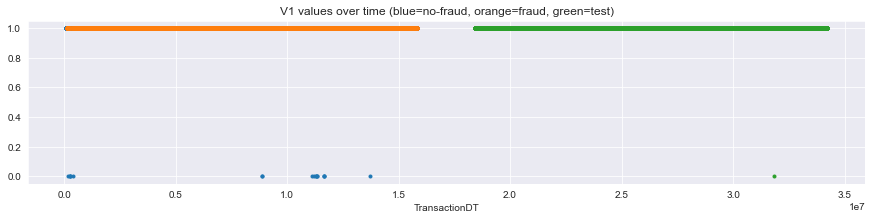

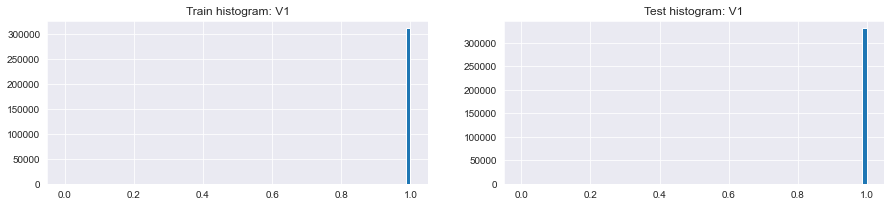

,V1,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,1.000,1.000,1.000,1.000,1.000,1.000
2,std,0.007,0.000,0.007,0.002,0.000,0.002
3,min,0.000,1.000,0.000,0.000,1.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,1.000,1.000,1.000,1.000,1.000,1.000
8,unique values,3.000,2.000,3.000,3.000,2.000,3.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V1,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,311236,0.020,6106,330172
1,-999.000,279287,0.052,14557,176518
2,0.000,17,0.000,0,1


,V1,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,311236,0.020,6106,330172
2,0.000,17,0.000,0,1


,Column,Correlation with V1
0,V1,1.000
1,V88,0.548
2,V41,0.462
3,V8,0.041
4,V66,0.036
5,V9,0.034
167,V282,-0.001
168,addr1,-0.002
169,card5,-0.002
170,D3,-0.003


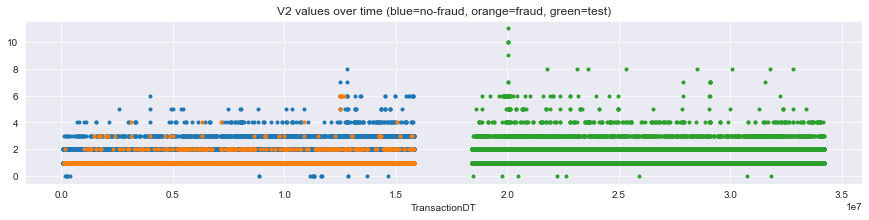

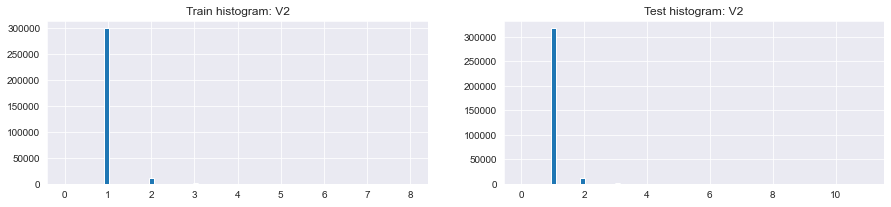

,V2,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,1.045,1.079,1.045,1.047,1.052,1.045
2,std,0.240,0.351,0.237,0.251,0.285,0.240
3,min,0.000,1.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,8.000,6.000,8.000,11.000,11.000,8.000
8,unique values,10.000,7.000,10.000,13.000,13.000,10.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V2,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,298894,0.019,5717,316786
1,-999.000,279287,0.052,14557,176518
2,2.000,10926,0.030,330,11933
3,3.000,1181,0.037,44,1099
4,4.000,163,0.031,5,227
5,5.000,36,0.028,1,51
6,6.000,30,0.300,9,47
7,0.000,20,0.000,0,8
8,7.000,2,0.000,0,9
9,8.000,1,0.000,0,8


,V2,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,298894,0.019,5717,316786
2,2.000,10926,0.030,330,11933
3,3.000,1181,0.037,44,1099
4,6.000,30,0.300,9,47
5,4.000,163,0.031,5,227
6,5.000,36,0.028,1,51
7,0.000,20,0.000,0,8
8,7.000,2,0.000,0,9
9,8.000,1,0.000,0,8


,Column,Correlation with V2
0,V2,1.000
1,V3,0.773
2,V8,0.733
3,V6,0.621
4,V9,0.619
5,V7,0.497
168,D15,-0.039
169,D3,-0.039
170,D10,-0.040
171,D2,-0.062


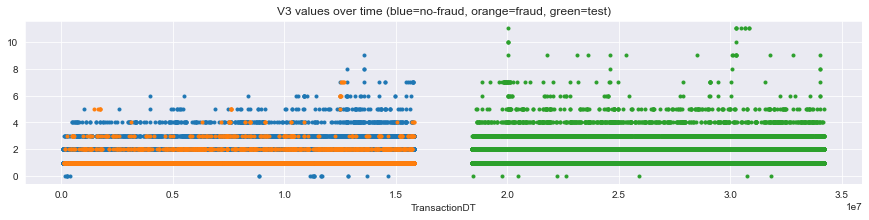

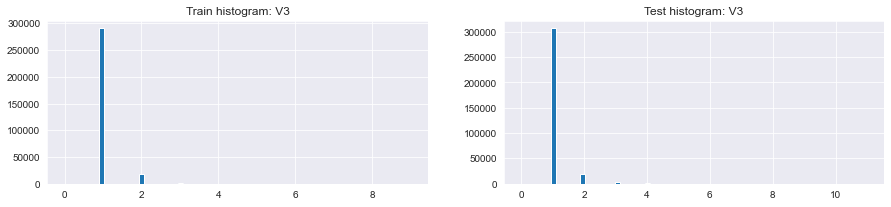

,V3,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,1.078,1.190,1.076,1.087,1.089,1.087
2,std,0.321,0.542,0.314,0.359,0.372,0.355
3,min,0.000,1.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,9.000,7.000,9.000,11.000,11.000,11.000
8,unique values,11.000,8.000,11.000,13.000,12.000,13.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V3,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,290583,0.018,5249,306610
1,-999.000,279287,0.052,14557,176518
2,2.000,17763,0.036,631,19796
3,3.000,2335,0.078,182,2797
4,4.000,403,0.062,25,644
5,5.000,93,0.108,10,200
6,6.000,34,0.147,5,37
7,0.000,20,0.000,0,8
8,7.000,18,0.222,4,48
9,8.000,3,0.000,0,4


,V3,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,290583,0.018,5249,306610
2,2.000,17763,0.036,631,19796
3,3.000,2335,0.078,182,2797
4,4.000,403,0.062,25,644
5,5.000,93,0.108,10,200
6,6.000,34,0.147,5,37
7,7.000,18,0.222,4,48
8,0.000,20,0.000,0,8
9,8.000,3,0.000,0,4


,Column,Correlation with V3
0,V3,1.000
1,V2,0.773
2,V9,0.653
3,V8,0.557
4,V7,0.547
5,V6,0.473
168,D10,-0.053
169,D5,-0.062
170,D3,-0.063
171,D11,-0.094


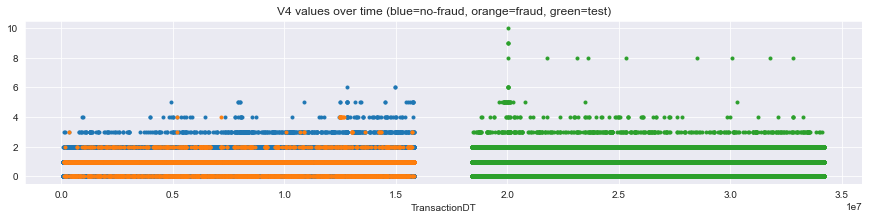

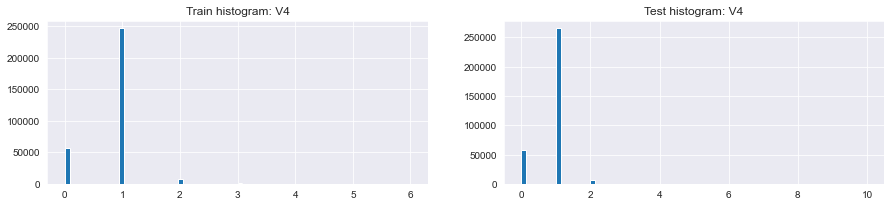

,V4,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,0.846,0.886,0.846,0.851,0.850,0.851
2,std,0.440,0.505,0.439,0.428,0.448,0.422
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,6.000,4.000,6.000,10.000,10.000,8.000
8,unique values,8.000,6.000,8.000,11.000,11.000,8.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V4,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,246500,0.019,4620,265348
2,0.000,56687,0.020,1113,57449
3,2.000,7385,0.046,343,6851
4,3.000,564,0.032,18,412
5,4.000,88,0.136,12,67
6,5.000,26,0.000,0,28
7,6.000,3,0.000,0,5


,V4,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,246500,0.019,4620,265348
2,0.000,56687,0.020,1113,57449
3,2.000,7385,0.046,343,6851
4,3.000,564,0.032,18,412
5,4.000,88,0.136,12,67
6,5.000,26,0.000,0,28
7,6.000,3,0.000,0,5


,Column,Correlation with V4
0,V4,1.000
1,V5,0.915
2,V82,0.684
3,V83,0.630
4,V61,0.607
5,V19,0.606
168,D2,-0.050
169,D10,-0.053
170,D15,-0.054
171,D1,-0.074


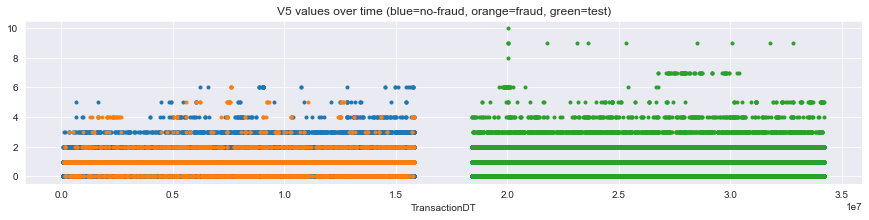

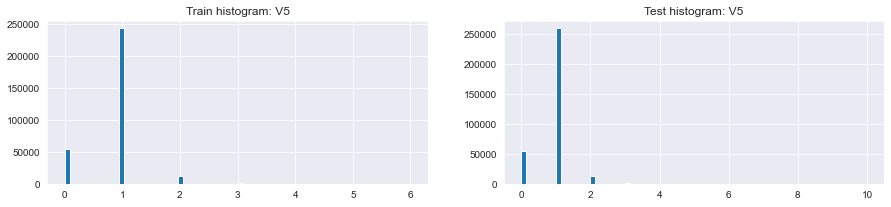

,V5,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,0.877,1.001,0.875,0.885,0.880,0.886
2,std,0.476,0.665,0.471,0.483,0.488,0.482
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,6.000,6.000,6.000,10.000,10.000,9.000
8,unique values,8.000,8.000,8.000,12.000,11.000,10.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V5,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,242883,0.018,4465,259837
2,0.000,54276,0.017,947,55494
3,2.000,12610,0.043,541,13196
4,3.000,1200,0.063,76,1137
5,4.000,193,0.264,51,291
6,5.000,55,0.400,22,111
7,6.000,36,0.111,4,31


,V5,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,242883,0.018,4465,259837
2,0.000,54276,0.017,947,55494
3,2.000,12610,0.043,541,13196
4,3.000,1200,0.063,76,1137
5,4.000,193,0.264,51,291
6,5.000,55,0.400,22,111
7,6.000,36,0.111,4,31


,Column,Correlation with V5
0,V5,1.000
1,V4,0.915
2,V83,0.659
3,V82,0.635
4,V62,0.588
5,V20,0.584
168,V69,-0.062
169,V90,-0.063
170,D1,-0.079
171,D2,-0.082


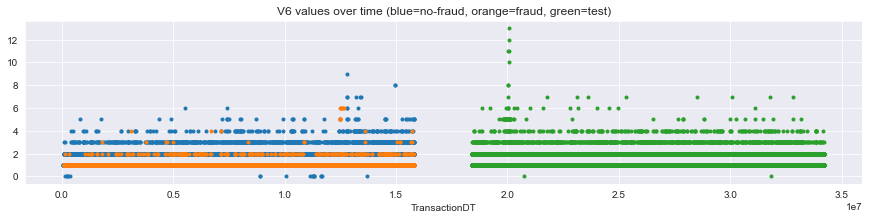

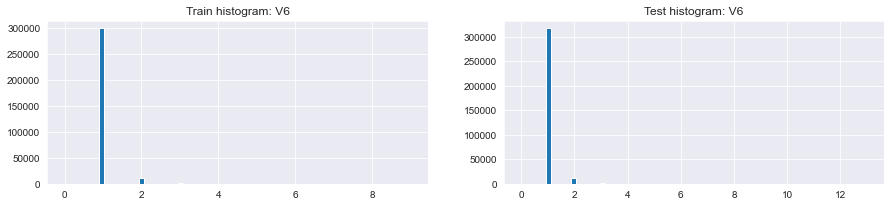

,V6,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,1.046,1.064,1.045,1.046,1.050,1.045
2,std,0.239,0.311,0.238,0.244,0.272,0.235
3,min,0.000,1.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,9.000,6.000,9.000,13.000,13.000,7.000
8,unique values,11.000,7.000,11.000,14.000,14.000,9.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V6,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,298627,0.019,5778,"316,806.000"
1,-999.000,279287,0.052,14557,"176,518.000"
2,2.000,11319,0.026,299,"12,027.000"
3,3.000,1044,0.013,14,"1,023.000"
4,4.000,180,0.028,5,235.000
5,5.000,46,0.087,4,48.000
6,0.000,18,0.000,0,2.000
7,6.000,11,0.545,6,16.000
8,7.000,5,0.000,0,9.000
9,8.000,2,0.000,0,2.000


,V6,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,298627,0.019,5778,316806
2,2.000,11319,0.026,299,12027
3,3.000,1044,0.013,14,1023
4,6.000,11,0.545,6,16
5,4.000,180,0.028,5,235
6,5.000,46,0.087,4,48
7,0.000,18,0.000,0,2
8,7.000,5,0.000,0,9
9,8.000,2,0.000,0,2


,Column,Correlation with V6
0,V6,1.000
1,V7,0.796
2,V8,0.676
3,V2,0.621
4,V9,0.561
5,V3,0.473
168,D15,-0.021
169,D1,-0.024
170,D2,-0.029
171,D5,-0.042


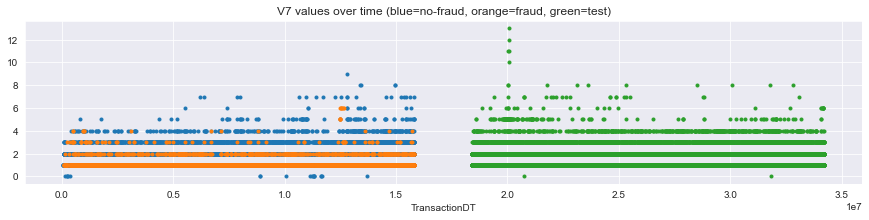

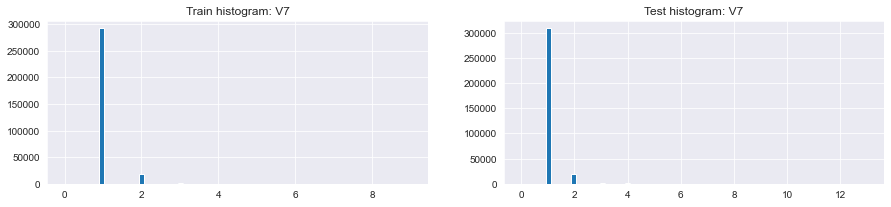

,V7,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,1.073,1.123,1.072,1.079,1.082,1.078
2,std,0.305,0.413,0.302,0.330,0.354,0.323
3,min,0.000,1.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,9.000,6.000,9.000,13.000,13.000,8.000
8,unique values,11.000,7.000,11.000,14.000,14.000,10.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V7,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,291485,0.019,5482,"308,215.000"
1,-999.000,279287,0.052,14557,"176,518.000"
2,2.000,17464,0.031,533,"18,901.000"
3,3.000,1823,0.037,68,"2,243.000"
4,4.000,337,0.039,13,613.000
5,5.000,83,0.048,4,136.000
6,7.000,20,0.000,0,22.000
7,0.000,18,0.000,0,2.000
8,6.000,18,0.333,6,26.000
9,8.000,4,0.000,0,10.000


,V7,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,291485,0.019,5482,308215
2,2.000,17464,0.031,533,18901
3,3.000,1823,0.037,68,2243
4,4.000,337,0.039,13,613
5,6.000,18,0.333,6,26
6,5.000,83,0.048,4,136
7,7.000,20,0.000,0,22
8,0.000,18,0.000,0,2
9,8.000,4,0.000,0,10


,Column,Correlation with V7
0,V7,1.000
1,V6,0.796
2,V9,0.595
3,V3,0.547
4,V8,0.539
5,V2,0.497
168,D1,-0.032
169,V48,-0.032
170,D2,-0.057
171,D5,-0.061


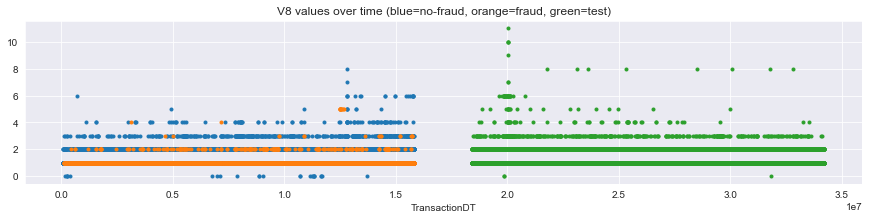

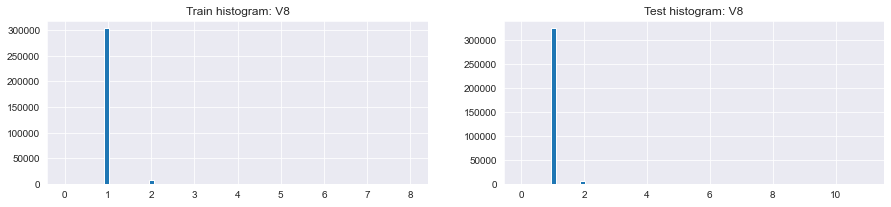

,V8,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,1.028,1.049,1.027,1.023,1.029,1.021
2,std,0.186,0.271,0.184,0.175,0.222,0.158
3,min,0.000,1.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,8.000,5.000,8.000,11.000,11.000,8.000
8,unique values,10.000,6.000,10.000,13.000,13.000,8.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V8,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,303466,0.019,5859,323436
1,-999.000,279287,0.052,14557,176518
2,2.000,7076,0.031,218,6206
3,3.000,553,0.031,17,408
4,4.000,95,0.021,2,58
5,0.000,24,0.000,0,3
6,6.000,19,0.000,0,27
7,5.000,18,0.556,10,20
8,7.000,1,0.000,0,2
9,8.000,1,0.000,0,8


,V8,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,303466,0.019,5859,323436
2,2.000,7076,0.031,218,6206
3,3.000,553,0.031,17,408
4,5.000,18,0.556,10,20
5,4.000,95,0.021,2,58
6,0.000,24,0.000,0,3
7,6.000,19,0.000,0,27
8,7.000,1,0.000,0,2
9,8.000,1,0.000,0,8


,Column,Correlation with V8
0,V8,1.000
1,V9,0.835
2,V2,0.733
3,V6,0.676
4,V3,0.557
5,V7,0.539
168,D10,-0.020
169,D1,-0.023
170,D15,-0.024
171,D2,-0.039


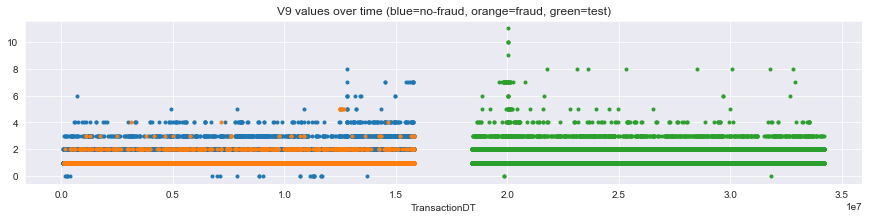

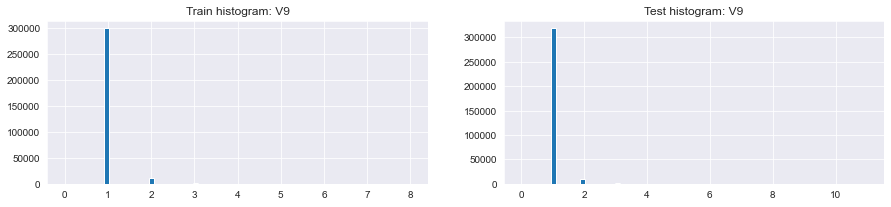

,V9,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,1.042,1.102,1.040,1.040,1.045,1.038
2,std,0.226,0.357,0.223,0.226,0.271,0.211
3,min,0.000,1.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,8.000,5.000,8.000,11.000,11.000,8.000
8,unique values,10.000,6.000,10.000,13.000,13.000,10.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V9,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,299625,0.019,5557,318347
1,-999.000,279287,0.052,14557,176518
2,2.000,10544,0.047,497,10859
3,3.000,848,0.046,39,765
4,4.000,172,0.017,3,126
5,0.000,24,0.000,0,3
6,5.000,19,0.526,10,25
7,7.000,11,0.000,0,26
8,6.000,9,0.000,0,9
9,8.000,1,0.000,0,8


,V9,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,1.000,299625,0.019,5557,318347
2,2.000,10544,0.047,497,10859
3,3.000,848,0.046,39,765
4,5.000,19,0.526,10,25
5,4.000,172,0.017,3,126
6,0.000,24,0.000,0,3
7,7.000,11,0.000,0,26
8,6.000,9,0.000,0,9
9,8.000,1,0.000,0,8


,Column,Correlation with V9
0,V9,1.000
1,V8,0.835
2,V3,0.653
3,V2,0.619
4,V7,0.595
5,V6,0.561
168,D5,-0.032
169,D3,-0.033
170,D15,-0.033
171,D2,-0.061


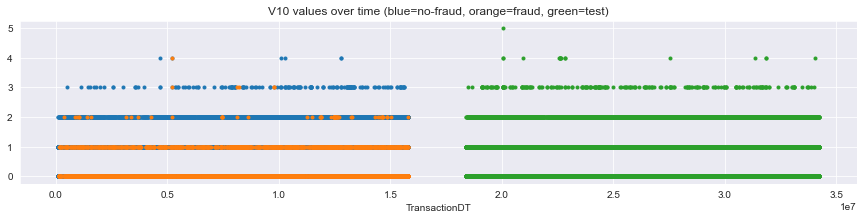

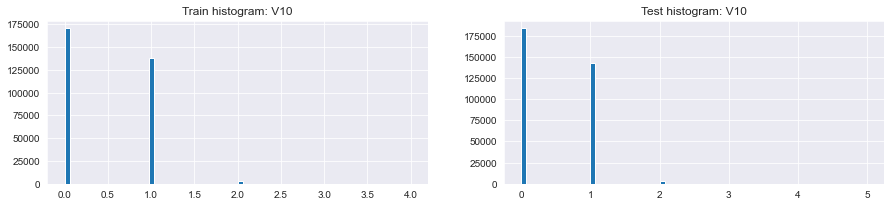

,V10,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,0.464,0.189,0.469,0.457,0.458,0.456
2,std,0.522,0.421,0.522,0.523,0.525,0.523
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,4.000,4.000,4.000,5.000,5.000,4.000
8,unique values,6.000,6.000,6.000,7.000,7.000,6.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V10,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,279287,0.052,14557,176518
1,0.000,170281,0.029,5020,183374
2,1.000,137743,0.007,1027,143115
3,2.000,3042,0.017,53,3421
4,3.000,180,0.028,5,246
5,4.000,7,0.143,1,16


,V10,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,0.000,170281,0.029,5020,183374
2,1.000,137743,0.007,1027,143115
3,2.000,3042,0.017,53,3421
4,3.000,180,0.028,5,246
5,4.000,7,0.143,1,16


,Column,Correlation with V10
0,V10,1.000
1,V11,0.969
2,V90,0.908
3,V48,0.893
4,V69,0.883
5,V29,0.880
168,V283,-0.139
169,V287,-0.146
170,V97,-0.147
171,V280,-0.157


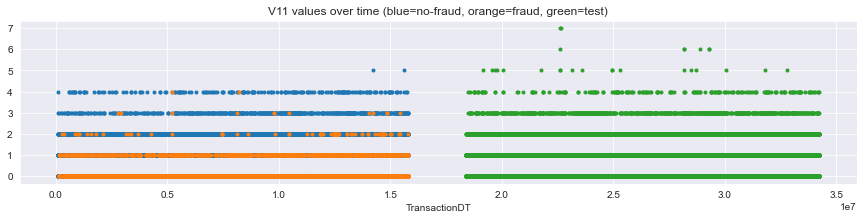

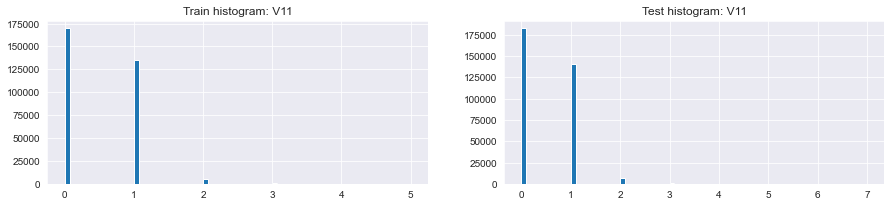

,V11,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"311,253.000","6,106.000","305,147.000","330,173.000","74,232.000","255,942.000"
1,mean,0.479,0.198,0.485,0.474,0.474,0.474
2,std,0.552,0.448,0.553,0.559,0.556,0.560
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,5.000,4.000,5.000,7.000,5.000,7.000
8,unique values,7.000,6.000,7.000,9.000,7.000,9.000
9,NaNs,"279,287.000","14,557.000","264,730.000","176,518.000","27,107.000","149,411.000"


,V11,Count in train (desc),Mean target,Sum target,Count in test
0,-999.000,279287,0.052,14557,176518
1,0.000,169633,0.030,5006,182449
2,1.000,135148,0.007,1007,140332
3,2.000,5672,0.014,79,6301
4,3.000,608,0.020,12,875
5,4.000,190,0.011,2,189
6,5.000,2,0.000,0,19


,V11,Count in train,Mean target,Sum target (desc),Count in test
0,-999.000,279287,0.052,14557,176518
1,0.000,169633,0.030,5006,182449
2,1.000,135148,0.007,1007,140332
3,2.000,5672,0.014,79,6301
4,3.000,608,0.020,12,875
5,4.000,190,0.011,2,189
6,5.000,2,0.000,0,19


,Column,Correlation with V11
0,V11,1.000
1,V10,0.969
2,V90,0.888
3,V91,0.885
4,V48,0.871
5,V49,0.866
168,V283,-0.127
169,V97,-0.132
170,V74,-0.132
171,V280,-0.141


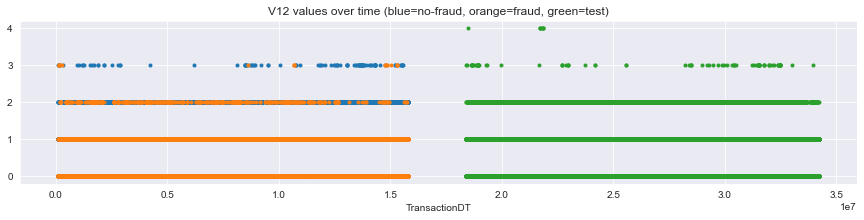

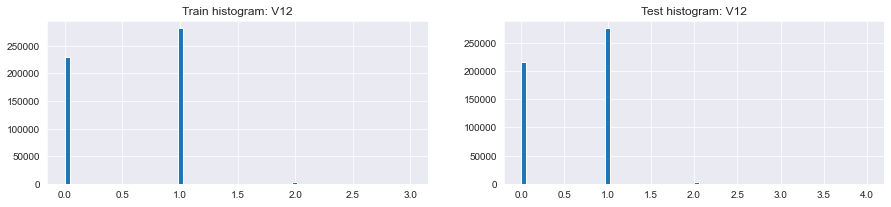

,V12,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.560,0.414,0.565,0.570,0.664,0.548
2,std,0.511,0.549,0.508,0.508,0.489,0.510
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,3.000,3.000,3.000,4.000,4.000,4.000
8,unique values,5.000,5.000,5.000,6.000,6.000,6.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V12,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,281003,0.021,6019,275401
1,0.000,230049,0.045,10303,215678
2,-999.000,76073,0.051,3887,12589
3,2.000,3295,0.132,436,2931
4,3.000,120,0.150,18,84


,V12,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,230049,0.045,10303,215678
1,1.000,281003,0.021,6019,275401
2,-999.000,76073,0.051,3887,12589
3,2.000,3295,0.132,436,2931
4,3.000,120,0.150,18,84


,Column,Correlation with V12
0,V12,1.000
1,V13,0.926
2,V75,0.709
3,V76,0.672
4,V35,0.660
5,V53,0.635
208,V32,-0.424
209,V42,-0.433
210,V31,-0.434
211,V92,-0.435


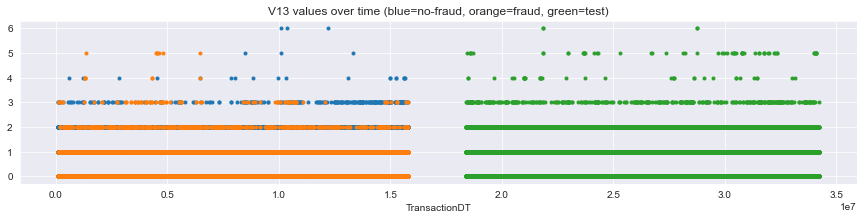

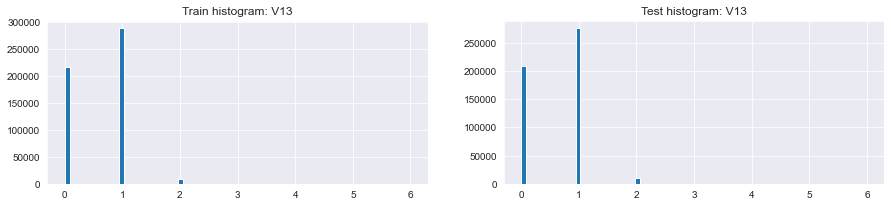

,V13,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.599,0.467,0.604,0.600,0.701,0.577
2,std,0.532,0.620,0.528,0.536,0.514,0.539
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,6.000,5.000,6.000,6.000,5.000,6.000
8,unique values,8.000,7.000,8.000,8.000,7.000,8.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V13,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,287644,0.021,6009,275677
1,0.000,216752,0.046,9923,208273
2,-999.000,76073,0.051,3887,12589
3,2.000,9661,0.076,733,9623
4,3.000,371,0.261,97,430
5,4.000,26,0.269,7,36
6,5.000,10,0.700,7,59
7,6.000,3,0.000,0,4


,V13,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,216752,0.046,9923,208273
1,1.000,287644,0.021,6009,275677
2,-999.000,76073,0.051,3887,12589
3,2.000,9661,0.076,733,9623
4,3.000,371,0.261,97,430
5,4.000,26,0.269,7,36
6,5.000,10,0.700,7,59
7,6.000,3,0.000,0,4


,Column,Correlation with V13
0,V13,1.000
1,V12,0.926
2,V76,0.720
3,V75,0.670
4,V36,0.669
5,V54,0.644
208,V32,-0.435
209,V42,-0.444
210,V31,-0.445
211,V92,-0.447


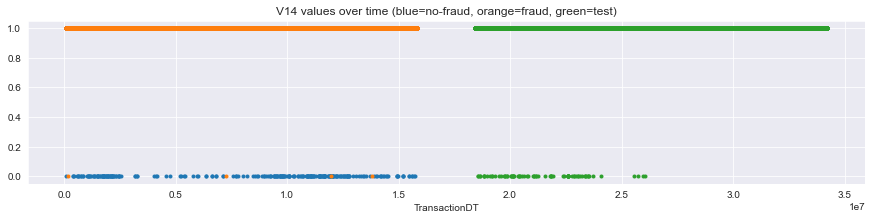

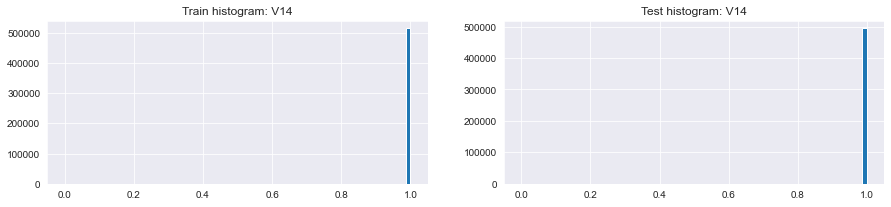

,V14,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,1.000,1.000,0.999,1.000,1.000,1.000
2,std,0.022,0.015,0.023,0.012,0.021,0.009
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,1.000,1.000,1.000,1.000,1.000,1.000
8,unique values,3.000,3.000,3.000,3.000,3.000,3.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V14,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,514210,0.033,16772,494026
1,-999.000,76073,0.051,3887,12589
2,0.000,257,0.016,4,76


,V14,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,514210,0.033,16772,494026
1,-999.000,76073,0.051,3887,12589
2,0.000,257,0.016,4,76


,Column,Correlation with V14
0,V14,1.000
1,V41,0.880
2,V65,0.844
3,V88,0.835
4,V25,0.118
5,V46,0.116
361,V155,-0.066
362,V148,-0.067
363,V154,-0.067
364,V153,-0.068


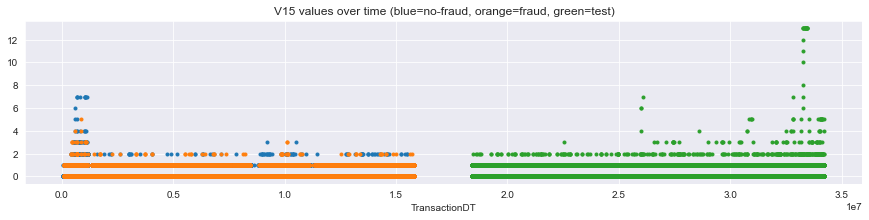

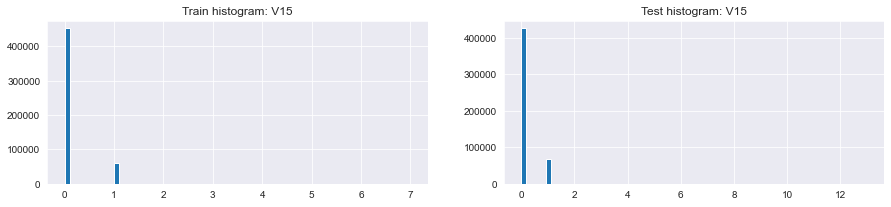

,V15,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.122,0.445,0.111,0.141,0.105,0.149
2,std,0.332,0.515,0.319,0.361,0.308,0.372
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,7.000,5.000,7.000,13.000,2.000,13.000
8,unique values,9.000,7.000,9.000,14.000,4.000,14.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V15,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,452075,0.021,9442,425298
1,-999.000,76073,0.051,3887,12589
2,1.000,61974,0.117,7231,68326
3,2.000,346,0.249,86,365
4,3.000,48,0.292,14,53
5,4.000,10,0.200,2,15
6,7.000,10,0.000,0,3
7,5.000,3,0.333,1,20
8,6.000,1,0.000,0,3


,V15,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,452075,0.021,9442,425298
1,1.000,61974,0.117,7231,68326
2,-999.000,76073,0.051,3887,12589
3,2.000,346,0.249,86,365
4,3.000,48,0.292,14,53
5,4.000,10,0.200,2,15
6,5.000,3,0.333,1,20
7,7.000,10,0.000,0,3
8,6.000,1,0.000,0,3


,Column,Correlation with V15
0,V15,1.000
1,V16,0.987
2,V57,0.959
3,V33,0.959
4,V94,0.954
5,V50,0.947
315,V53,-0.418
316,V54,-0.430
317,V35,-0.440
318,V36,-0.450


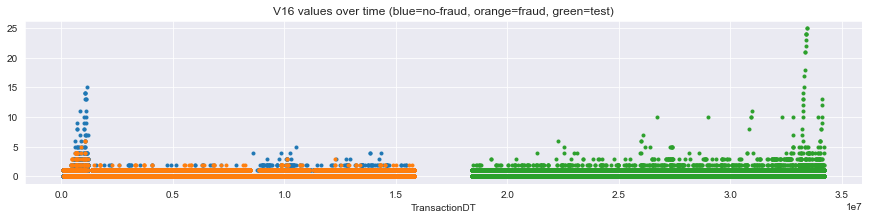

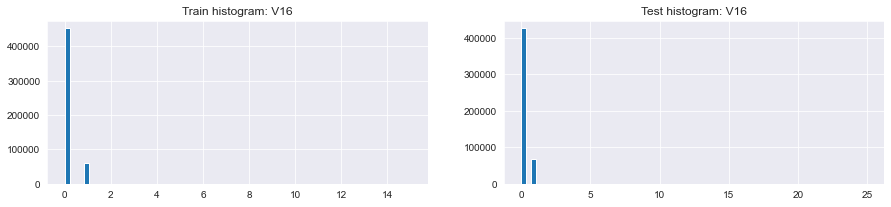

,V16,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.123,0.449,0.112,0.142,0.105,0.151
2,std,0.343,0.531,0.329,0.379,0.309,0.393
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,15.000,6.000,15.000,25.000,4.000,25.000
8,unique values,16.000,8.000,16.000,24.000,6.000,24.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V16,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,452052,0.021,9442,425270
1,-999.000,76073,0.051,3887,12589
2,1.000,61749,0.117,7198,68099
3,2.000,481,0.200,96,476
4,3.000,101,0.228,23,156
5,4.000,42,0.333,14,37
6,5.000,12,0.083,1,20
7,6.000,7,0.286,2,7
8,7.000,5,0.000,0,3
9,8.000,4,0.000,0,4


,V16,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,452052,0.021,9442,425270
1,1.000,61749,0.117,7198,68099
2,-999.000,76073,0.051,3887,12589
3,2.000,481,0.200,96,476
4,3.000,101,0.228,23,156
5,4.000,42,0.333,14,37
6,6.000,7,0.286,2,7
7,5.000,12,0.083,1,20
8,7.000,5,0.000,0,3
9,8.000,4,0.000,0,4


,Column,Correlation with V16
0,V16,1.000
1,V15,0.987
2,V33,0.944
3,V57,0.939
4,V94,0.933
5,V34,0.931
315,V53,-0.409
316,V54,-0.420
317,V35,-0.431
318,V36,-0.440


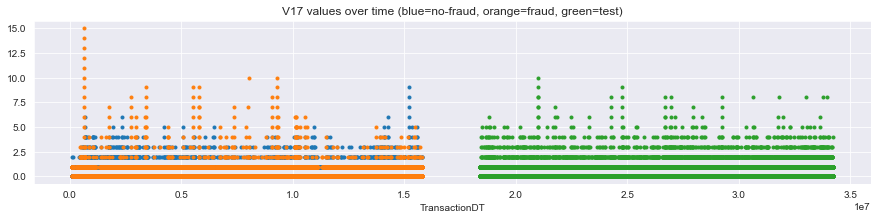

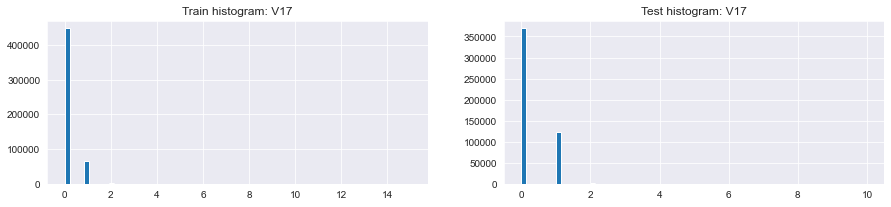

,V17,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.134,0.497,0.122,0.260,0.121,0.292
2,std,0.364,0.738,0.338,0.461,0.358,0.476
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,15.000,15.000,9.000,10.000,10.000,9.000
8,unique values,17.000,17.000,11.000,12.000,12.000,11.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V17,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,447823,0.021,9443,"369,022.000"
1,-999.000,76073,0.051,3887,"12,589.000"
2,1.000,65244,0.106,6892,"122,807.000"
3,2.000,927,0.237,220,"1,676.000"
4,3.000,274,0.347,95,365.000
5,4.000,104,0.481,50,143.000
6,5.000,40,0.700,28,46.000
7,6.000,21,0.810,17,19.000
8,7.000,12,0.917,11,9.000
9,8.000,8,0.875,7,12.000


,V17,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,447823,0.021,9443,369022
1,1.000,65244,0.106,6892,122807
2,-999.000,76073,0.051,3887,12589
3,2.000,927,0.237,220,1676
4,3.000,274,0.347,95,365
5,4.000,104,0.481,50,143
6,5.000,40,0.700,28,46
7,6.000,21,0.810,17,19
8,7.000,12,0.917,11,9
9,8.000,8,0.875,7,12


,Column,Correlation with V17
0,V17,1.000
1,V18,0.991
2,V21,0.952
3,V22,0.918
4,V84,0.909
5,V63,0.906
362,V12,-0.403
363,V35,-0.409
364,V54,-0.413
365,V13,-0.414


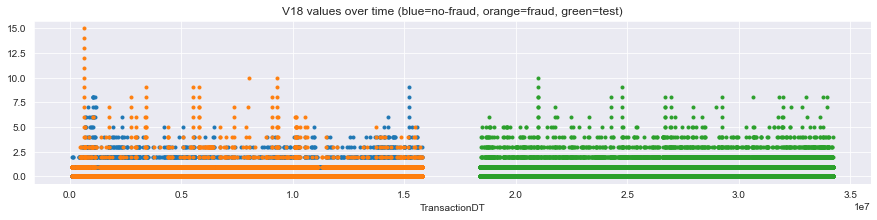

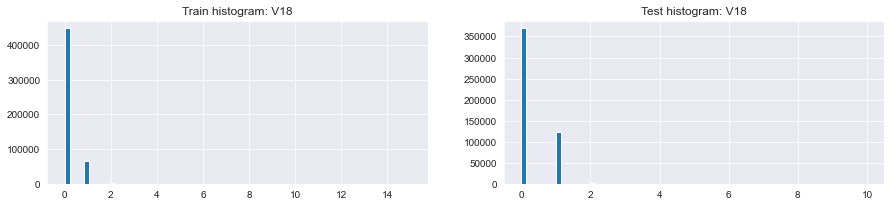

,V18,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.135,0.505,0.123,0.262,0.122,0.294
2,std,0.372,0.756,0.345,0.467,0.363,0.483
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,15.000,15.000,9.000,10.000,10.000,9.000
8,unique values,17.000,17.000,11.000,12.000,12.000,11.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V18,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,447792,0.021,9441,"368,966.000"
1,-999.000,76073,0.051,3887,"12,589.000"
2,1.000,64889,0.105,6819,"122,201.000"
3,2.000,1155,0.209,241,"2,216.000"
4,3.000,388,0.374,145,443.000
5,4.000,120,0.425,51,160.000
6,5.000,48,0.604,29,64.000
7,6.000,32,0.594,19,21.000
8,7.000,16,0.688,11,15.000
9,8.000,13,0.538,7,13.000


,V18,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,447792,0.021,9441,368966
1,1.000,64889,0.105,6819,122201
2,-999.000,76073,0.051,3887,12589
3,2.000,1155,0.209,241,2216
4,3.000,388,0.374,145,443
5,4.000,120,0.425,51,160
6,5.000,48,0.604,29,64
7,6.000,32,0.594,19,21
8,7.000,16,0.688,11,15
9,8.000,13,0.538,7,13


,Column,Correlation with V18
0,V18,1.000
1,V17,0.991
2,V21,0.945
3,V22,0.928
4,V84,0.900
5,V63,0.898
362,V12,-0.399
363,V35,-0.406
364,V54,-0.410
365,V13,-0.410


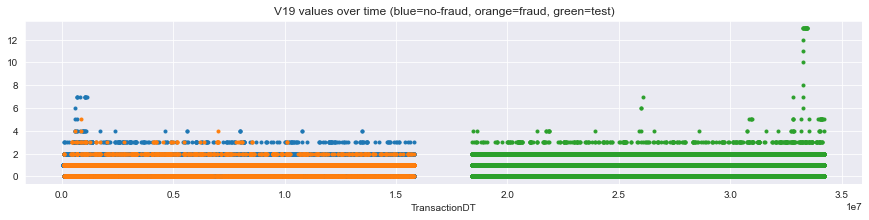

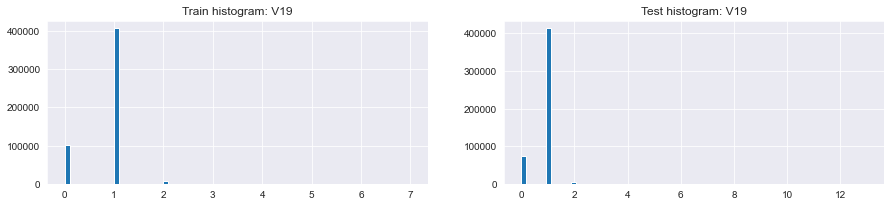

,V19,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.816,0.888,0.814,0.861,0.832,0.868
2,std,0.426,0.429,0.425,0.392,0.408,0.388
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,7.000,5.000,7.000,13.000,4.000,13.000
8,unique values,9.000,7.000,9.000,14.000,6.000,14.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V19,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,405665,0.034,13673,412869
1,0.000,101871,0.025,2522,75188
2,-999.000,76073,0.051,3887,12589
3,2.000,6540,0.080,524,5611
4,3.000,348,0.152,53,358
5,4.000,29,0.103,3,31
6,7.000,10,0.000,0,3
7,5.000,3,0.333,1,20
8,6.000,1,0.000,0,3


,V19,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,405665,0.034,13673,412869
1,-999.000,76073,0.051,3887,12589
2,0.000,101871,0.025,2522,75188
3,2.000,6540,0.080,524,5611
4,3.000,348,0.152,53,358
5,4.000,29,0.103,3,31
6,5.000,3,0.333,1,20
7,7.000,10,0.000,0,3
8,6.000,1,0.000,0,3


,Column,Correlation with V19
0,V19,1.000
1,V20,0.905
2,V82,0.722
3,V61,0.682
4,V83,0.644
5,V62,0.616
375,V183,-0.419
376,V329,-0.431
377,V330,-0.439
378,V327,-0.518


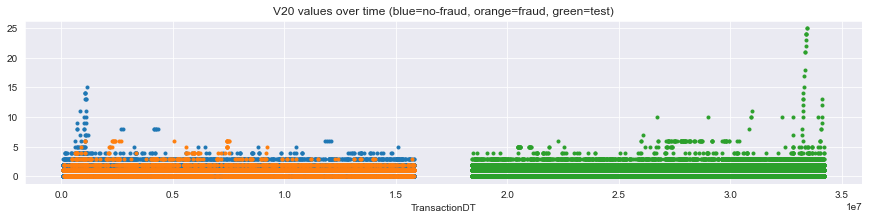

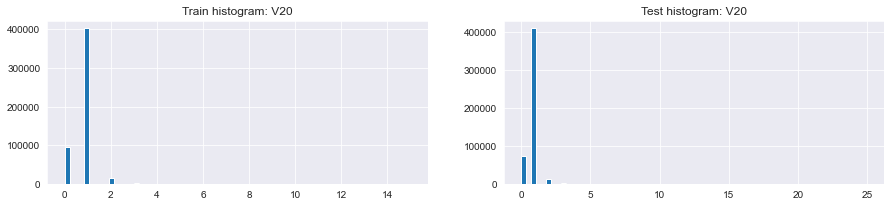

,V20,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.848,0.949,0.844,0.886,0.857,0.892
2,std,0.459,0.526,0.457,0.436,0.436,0.436
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,15.000,6.000,15.000,25.000,5.000,25.000
8,unique values,16.000,8.000,16.000,24.000,7.000,24.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V20,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,401929,0.034,13465,407937
1,0.000,96318,0.023,2254,72522
2,-999.000,76073,0.051,3887,12589
3,2.000,14902,0.056,832,12171
4,3.000,1070,0.149,159,1199
5,4.000,161,0.230,37,111
6,5.000,30,0.367,11,51
7,6.000,27,0.667,18,74
8,8.000,11,0.000,0,4
9,7.000,5,0.000,0,3


,V20,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,401929,0.034,13465,407937
1,-999.000,76073,0.051,3887,12589
2,0.000,96318,0.023,2254,72522
3,2.000,14902,0.056,832,12171
4,3.000,1070,0.149,159,1199
5,4.000,161,0.230,37,111
6,6.000,27,0.667,18,74
7,5.000,30,0.367,11,51
8,8.000,11,0.000,0,4
9,7.000,5,0.000,0,3


,Column,Correlation with V20
0,V20,1.000
1,V19,0.905
2,V83,0.674
3,V82,0.661
4,V62,0.634
5,V61,0.632
375,V328,-0.414
376,V329,-0.428
377,V330,-0.435
378,V327,-0.512


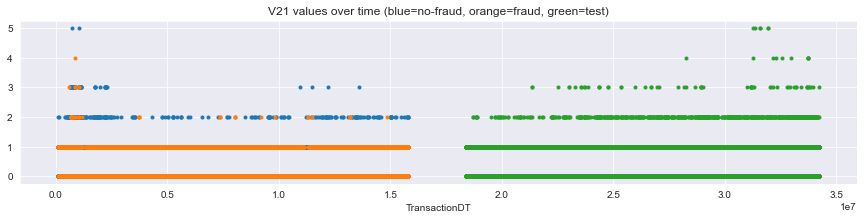

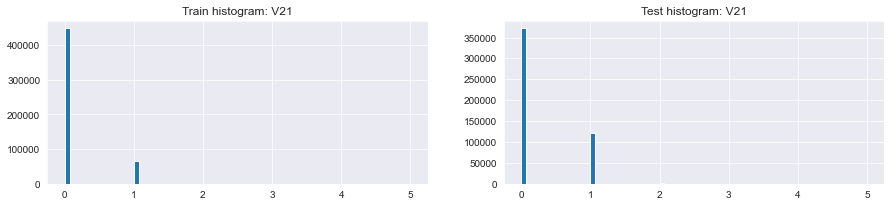

,V21,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.130,0.436,0.119,0.250,0.115,0.282
2,std,0.339,0.503,0.327,0.438,0.320,0.456
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,1.000
7,max,5.000,4.000,5.000,5.000,3.000,5.000
8,unique values,7.000,6.000,6.000,7.000,5.000,7.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V21,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,448220,0.021,9509,371730
1,-999.000,76073,0.051,3887,12589
2,1.000,65837,0.110,7223,121417
3,2.000,354,0.107,38,878
4,3.000,53,0.094,5,61
5,5.000,2,0.000,0,6
6,4.000,1,1.000,1,10


,V21,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,448220,0.021,9509,371730
1,1.000,65837,0.110,7223,121417
2,-999.000,76073,0.051,3887,12589
3,2.000,354,0.107,38,878
4,3.000,53,0.094,5,61
5,4.000,1,1.000,1,10
6,5.000,2,0.000,0,6


,Column,Correlation with V21
0,V21,1.000
1,V22,0.965
2,V84,0.955
3,V17,0.952
4,V63,0.947
5,V18,0.945
362,V12,-0.419
363,V35,-0.429
364,V54,-0.430
365,V13,-0.431


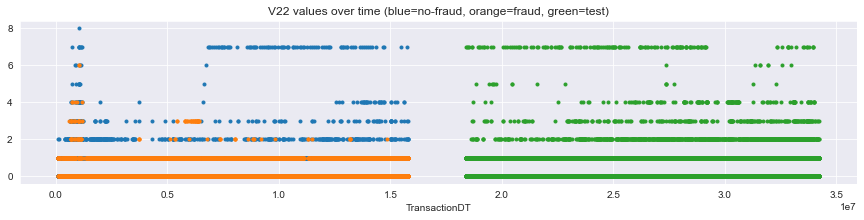

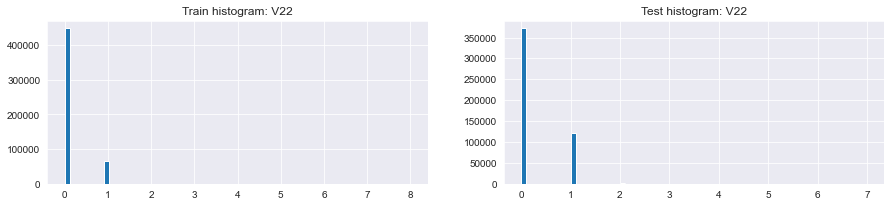

,V22,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.132,0.443,0.122,0.254,0.118,0.286
2,std,0.359,0.526,0.348,0.464,0.350,0.482
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,1.000
7,max,8.000,6.000,8.000,7.000,7.000,7.000
8,unique values,10.000,7.000,10.000,9.000,8.000,9.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V22,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,448185,0.021,9507,"371,688.000"
1,-999.000,76073,0.051,3887,"12,589.000"
2,1.000,65334,0.110,7167,"120,501.000"
3,2.000,604,0.081,49,"1,334.000"
4,3.000,169,0.272,46,249.000
5,7.000,94,0.000,0,149.000
6,4.000,63,0.079,5,157.000
7,5.000,9,0.000,0,16.000
8,6.000,8,0.250,2,8.000
9,8.000,1,0.000,0,nan


,V22,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,448185,0.021,9507,"371,688.000"
1,1.000,65334,0.110,7167,"120,501.000"
2,-999.000,76073,0.051,3887,"12,589.000"
3,2.000,604,0.081,49,"1,334.000"
4,3.000,169,0.272,46,249.000
5,4.000,63,0.079,5,157.000
6,6.000,8,0.250,2,8.000
7,7.000,94,0.000,0,149.000
8,5.000,9,0.000,0,16.000
9,8.000,1,0.000,0,nan


,Column,Correlation with V22
0,V22,1.000
1,V21,0.965
2,V42,0.934
3,V18,0.928
4,V63,0.921
5,V17,0.918
362,V12,-0.404
363,V54,-0.414
364,V13,-0.414
365,V35,-0.424


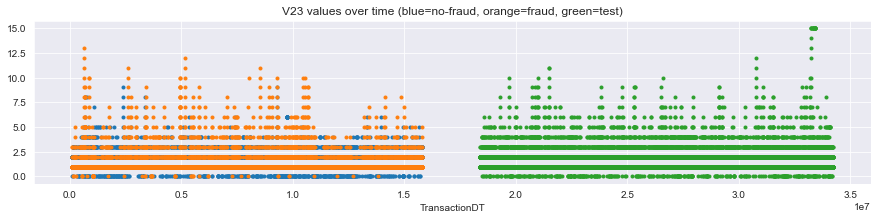

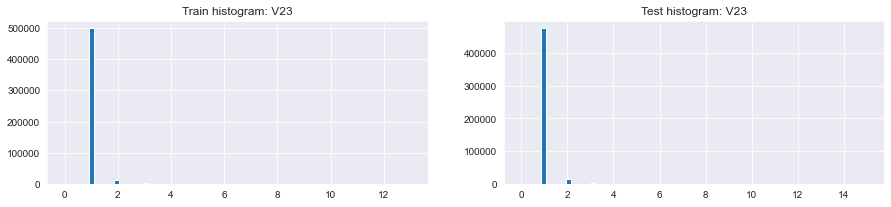

,V23,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,1.035,1.236,1.028,1.045,1.046,1.045
2,std,0.248,0.860,0.193,0.290,0.294,0.288
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,13.000,13.000,9.000,15.000,11.000,15.000
8,unique values,15.000,15.000,11.000,17.000,13.000,17.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V23,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,498764,0.029,14705,475616
1,-999.000,76073,0.051,3887,12589
2,2.000,13197,0.088,1158,15463
3,3.000,1244,0.314,390,1622
4,0.000,588,0.085,50,367
5,4.000,337,0.599,202,615
6,5.000,144,0.778,112,186
7,6.000,83,0.735,61,94
8,7.000,39,0.897,35,61
9,8.000,32,0.812,26,29


,V23,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,498764,0.029,14705,475616
1,-999.000,76073,0.051,3887,12589
2,2.000,13197,0.088,1158,15463
3,3.000,1244,0.314,390,1622
4,4.000,337,0.599,202,615
5,5.000,144,0.778,112,186
6,6.000,83,0.735,61,94
7,0.000,588,0.085,50,367
8,7.000,39,0.897,35,61
9,8.000,32,0.812,26,29


,Column,Correlation with V23
0,V23,1.000
1,V24,0.825
2,V123,0.613
3,V125,0.501
4,V86,0.452
5,V257,0.401
375,D8,-0.074
376,V292,-0.080
377,addr2,-0.081
378,V291,-0.084


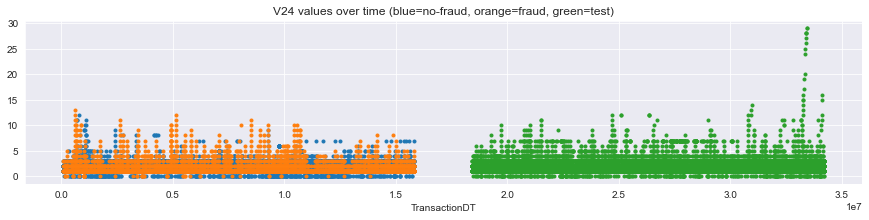

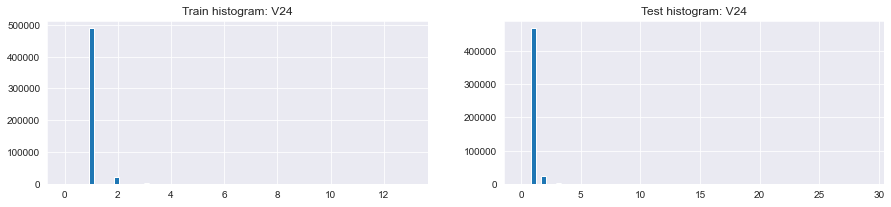

,V24,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,1.058,1.264,1.051,1.069,1.071,1.069
2,std,0.305,0.890,0.261,0.371,0.351,0.376
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,13.000,13.000,12.000,29.000,11.000,29.000
8,unique values,15.000,15.000,14.000,27.000,13.000,27.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V24,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,488478,0.029,14375,466502
1,-999.000,76073,0.051,3887,12589
2,2.000,22289,0.064,1419,23104
3,3.000,2241,0.197,441,2803
4,0.000,578,0.083,48,364
5,4.000,431,0.497,214,642
6,5.000,195,0.559,109,246
7,6.000,98,0.653,64,110
8,7.000,64,0.594,38,218
9,8.000,40,0.650,26,32


,V24,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,488478,0.029,14375,466502
1,-999.000,76073,0.051,3887,12589
2,2.000,22289,0.064,1419,23104
3,3.000,2241,0.197,441,2803
4,4.000,431,0.497,214,642
5,5.000,195,0.559,109,246
6,6.000,98,0.653,64,110
7,0.000,578,0.083,48,364
8,7.000,64,0.594,38,218
9,8.000,40,0.650,26,32


,Column,Correlation with V24
0,V24,1.000
1,V23,0.825
2,V123,0.532
3,V125,0.487
4,V87,0.426
5,V124,0.405
375,D5,-0.065
376,V292,-0.066
377,V291,-0.068
378,D7,-0.081


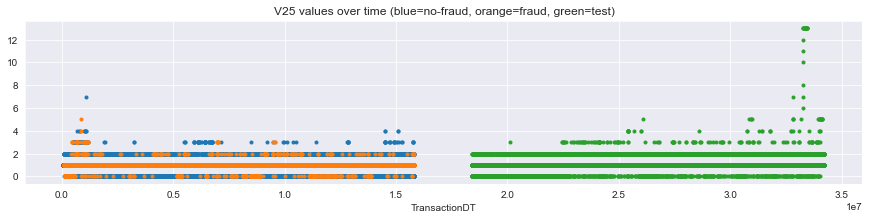

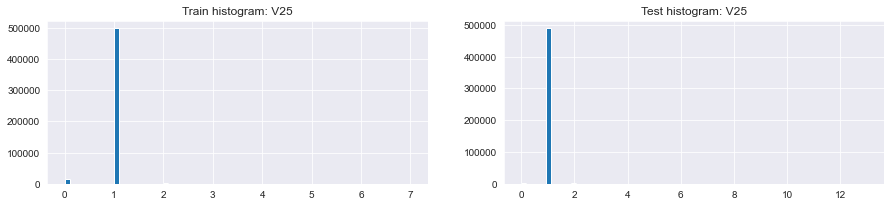

,V25,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.978,0.982,0.978,1.005,0.996,1.007
2,std,0.185,0.236,0.183,0.134,0.128,0.135
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,7.000,5.000,7.000,13.000,3.000,13.000
8,unique values,8.000,7.000,7.000,14.000,5.000,14.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V25,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,497241,0.032,15957,488731
1,-999.000,76073,0.051,3887,12589
2,0.000,14465,0.040,583,1754
3,2.000,2569,0.079,202,3420
4,3.000,177,0.181,32,127
5,4.000,13,0.077,1,27
6,5.000,1,1.000,1,21
7,7.000,1,0.000,0,2


,V25,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,497241,0.032,15957,488731
1,-999.000,76073,0.051,3887,12589
2,0.000,14465,0.040,583,1754
3,2.000,2569,0.079,202,3420
4,3.000,177,0.181,32,127
5,4.000,13,0.077,1,27
6,5.000,1,1.000,1,21
7,7.000,1,0.000,0,2


,Column,Correlation with V25
0,V25,1.000
1,V26,0.840
2,V66,0.556
3,V67,0.467
4,V19,0.329
5,V20,0.295
375,V90,-0.030
376,D7,-0.036
377,D14,-0.036
378,addr2,-0.042


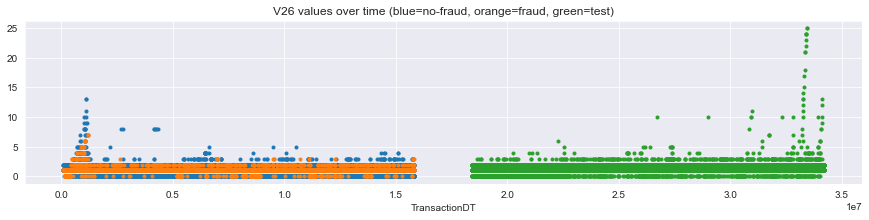

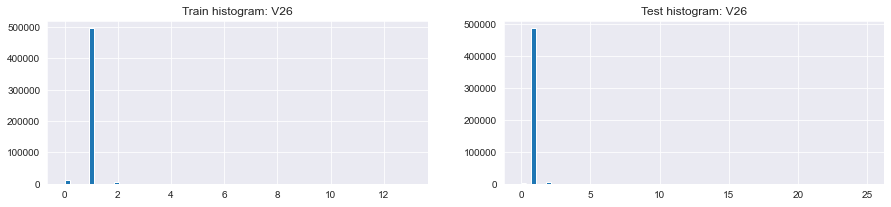

,V26,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.988,1.006,0.987,1.013,1.004,1.015
2,std,0.209,0.289,0.206,0.189,0.148,0.198
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,13.000,7.000,13.000,25.000,4.000,25.000
8,unique values,14.000,9.000,14.000,24.000,6.000,24.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V26,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,495119,0.032,15746,485604
1,-999.000,76073,0.051,3887,12589
2,0.000,13068,0.039,509,1543
3,2.000,5906,0.077,456,6476
4,3.000,271,0.192,52,367
5,4.000,50,0.120,6,48
6,5.000,17,0.118,2,18
7,8.000,13,0.000,0,4
8,6.000,8,0.375,3,7
9,7.000,7,0.286,2,5


,V26,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,495119,0.032,15746,485604
1,-999.000,76073,0.051,3887,12589
2,0.000,13068,0.039,509,1543
3,2.000,5906,0.077,456,6476
4,3.000,271,0.192,52,367
5,4.000,50,0.120,6,48
6,6.000,8,0.375,3,7
7,5.000,17,0.118,2,18
8,7.000,7,0.286,2,5
9,8.000,13,0.000,0,4


,Column,Correlation with V26
0,V26,1.000
1,V25,0.840
2,V67,0.478
3,V66,0.470
4,V20,0.341
5,V19,0.278
375,V48,-0.036
376,V90,-0.037
377,V11,-0.038
378,V10,-0.040


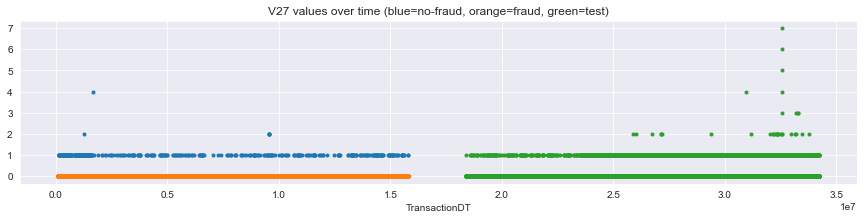

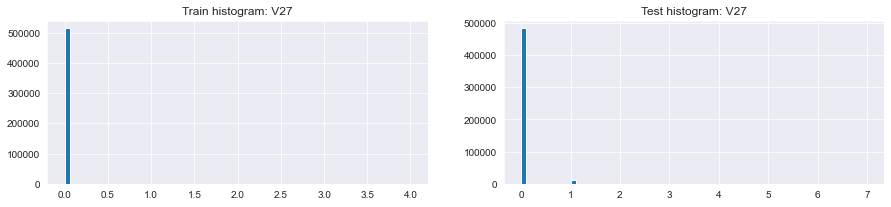

,V27,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.001,0.000,0.001,0.023,0.001,0.028
2,std,0.029,0.000,0.029,0.150,0.035,0.165
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,0.000,0.000,0.000,0.000,0.000
7,max,4.000,0.000,4.000,7.000,1.000,7.000
8,unique values,5.000,2.000,5.000,9.000,3.000,9.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V27,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,514076,0.033,16776,482965
1,-999.000,76073,0.051,3887,12589
2,1.000,385,0.000,0,11103
3,2.000,5,0.000,0,25
4,4.000,1,0.000,0,2


,V27,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,514076,0.033,16776,482965
1,-999.000,76073,0.051,3887,12589
2,1.000,385,0.000,0,11103
3,2.000,5,0.000,0,25
4,4.000,1,0.000,0,2


,Column,Correlation with V27
0,V27,1.000
1,V28,0.973
2,V89,0.935
3,V68,0.889
4,C3,0.548
5,V277,0.146
360,V329,-0.076
361,V328,-0.078
362,V330,-0.079
363,V327,-0.094


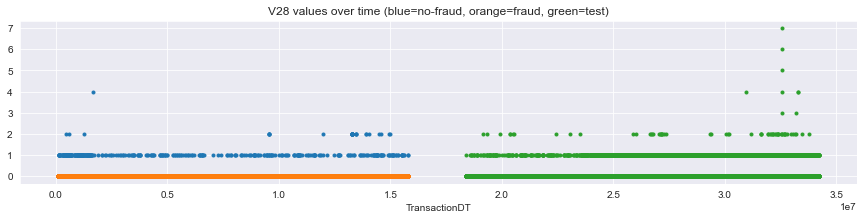

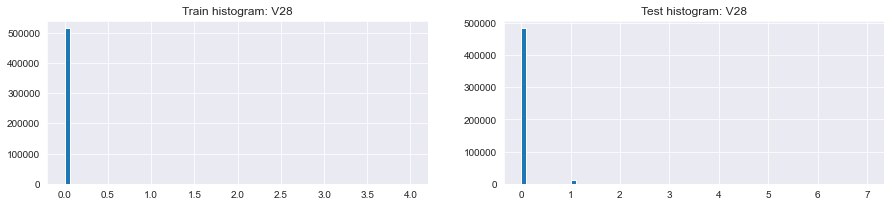

,V28,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.001,0.000,0.001,0.023,0.001,0.028
2,std,0.031,0.000,0.032,0.151,0.038,0.166
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,0.000,0.000,0.000,0.000,0.000
7,max,4.000,0.000,4.000,7.000,2.000,7.000
8,unique values,5.000,2.000,5.000,9.000,4.000,9.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V28,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,514073,0.033,16776,482958
1,-999.000,76073,0.051,3887,12589
2,1.000,363,0.000,0,11075
3,2.000,30,0.000,0,60
4,4.000,1,0.000,0,4


,V28,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,514073,0.033,16776,482958
1,-999.000,76073,0.051,3887,12589
2,1.000,363,0.000,0,11075
3,2.000,30,0.000,0,60
4,4.000,1,0.000,0,4


,Column,Correlation with V28
0,V28,1.000
1,V27,0.973
2,V89,0.968
3,V68,0.915
4,C3,0.594
5,V267,0.196
360,V329,-0.074
361,V328,-0.076
362,V330,-0.077
363,V327,-0.091


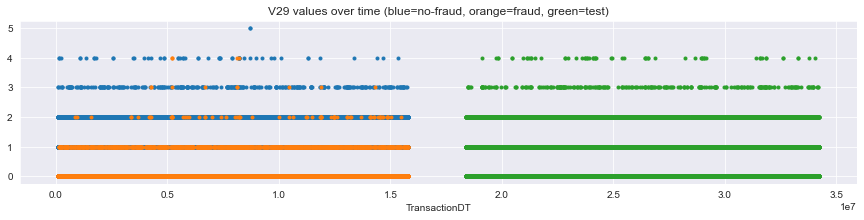

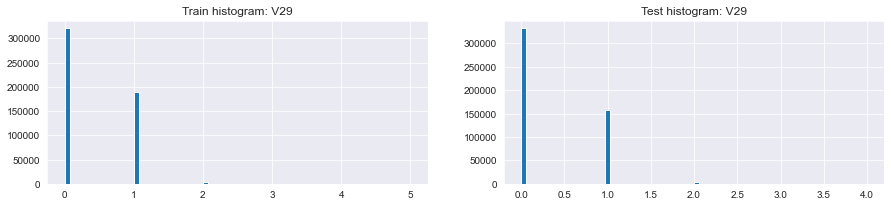

,V29,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.388,0.088,0.398,0.337,0.403,0.322
2,std,0.511,0.307,0.513,0.493,0.512,0.488
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,5.000,4.000,5.000,4.000,4.000,4.000
8,unique values,7.000,6.000,7.000,6.000,6.000,6.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V29,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,320407,0.048,15401,"331,940.000"
1,1.000,189060,0.007,1293,"158,112.000"
2,-999.000,76073,0.051,3887,"12,589.000"
3,2.000,4590,0.015,69,"3,717.000"
4,3.000,351,0.026,9,274.000
5,4.000,57,0.070,4,59.000
6,5.000,2,0.000,0,nan


,V29,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,320407,0.048,15401,"331,940.000"
1,-999.000,76073,0.051,3887,"12,589.000"
2,1.000,189060,0.007,1293,"158,112.000"
3,2.000,4590,0.015,69,"3,717.000"
4,3.000,351,0.026,9,274.000
5,4.000,57,0.070,4,59.000
6,5.000,2,0.000,0,nan


,Column,Correlation with V29
0,V29,1.000
1,V30,0.958
2,V90,0.932
3,V48,0.915
4,V69,0.915
5,V91,0.897
208,V31,-0.300
209,V94,-0.303
210,V52,-0.306
211,V51,-0.311


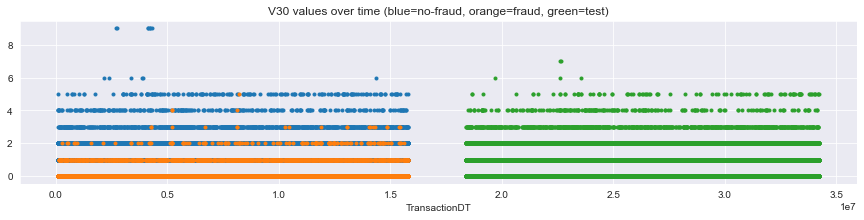

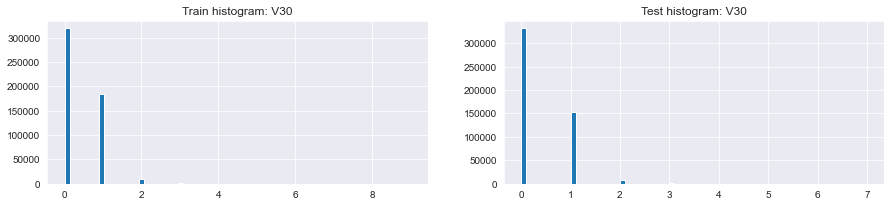

,V30,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.406,0.095,0.417,0.352,0.420,0.336
2,std,0.554,0.335,0.557,0.531,0.549,0.525
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,9.000,5.000,9.000,7.000,6.000,7.000
8,unique values,9.000,7.000,9.000,9.000,8.000,9.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V30,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,319017,0.048,15363,"331,104.000"
1,1.000,184133,0.007,1257,"153,788.000"
2,-999.000,76073,0.051,3887,"12,589.000"
3,2.000,9685,0.014,133,"7,899.000"
4,3.000,1160,0.016,19,979.000
5,4.000,279,0.011,3,225.000
6,5.000,180,0.006,1,102.000
7,9.000,7,0.000,0,nan
8,6.000,6,0.000,0,3.000


,V30,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,319017,0.048,15363,"331,104.000"
1,-999.000,76073,0.051,3887,"12,589.000"
2,1.000,184133,0.007,1257,"153,788.000"
3,2.000,9685,0.014,133,"7,899.000"
4,3.000,1160,0.016,19,979.000
5,4.000,279,0.011,3,225.000
6,5.000,180,0.006,1,102.000
7,9.000,7,0.000,0,nan
8,6.000,6,0.000,0,3.000


,Column,Correlation with V30
0,V30,1.000
1,V29,0.958
2,V91,0.916
3,V90,0.902
4,V70,0.895
5,V49,0.894
208,V31,-0.290
209,V94,-0.293
210,V52,-0.296
211,V51,-0.301


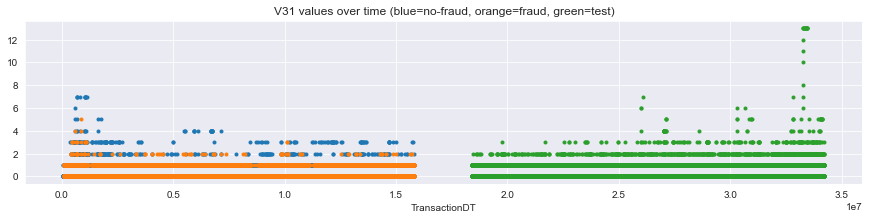

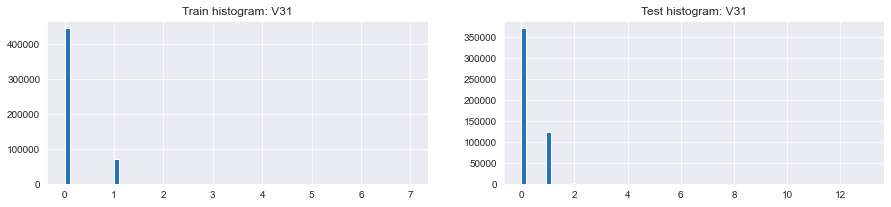

,V31,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.141,0.457,0.130,0.256,0.121,0.287
2,std,0.356,0.516,0.344,0.453,0.329,0.471
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,7.000,5.000,7.000,13.000,3.000,13.000
8,unique values,9.000,7.000,9.000,14.000,5.000,14.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V31,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,443045,0.021,9239,369773
1,-999.000,76073,0.051,3887,12589
2,1.000,70729,0.105,7429,122946
3,2.000,477,0.191,91,1120
4,3.000,167,0.084,14,176
5,4.000,33,0.061,2,36
6,7.000,10,0.000,0,3
7,5.000,5,0.200,1,24
8,6.000,1,0.000,0,5


,V31,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,443045,0.021,9239,369773
1,1.000,70729,0.105,7429,122946
2,-999.000,76073,0.051,3887,12589
3,2.000,477,0.191,91,1120
4,3.000,167,0.084,14,176
5,4.000,33,0.061,2,36
6,5.000,5,0.200,1,24
7,7.000,10,0.000,0,3
8,6.000,1,0.000,0,5


,Column,Correlation with V31
0,V31,1.000
1,V32,0.986
2,V50,0.981
3,V92,0.966
4,V71,0.959
5,V93,0.928
362,V159,-0.487
363,V160,-0.502
364,V150,-0.503
365,V151,-0.539


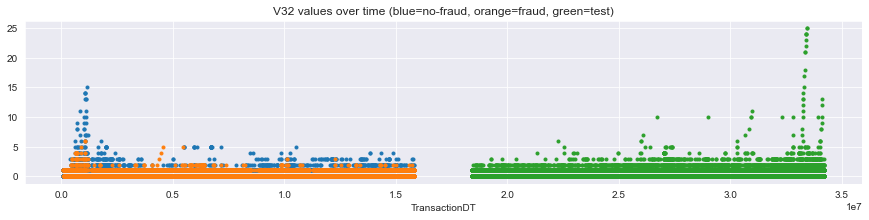

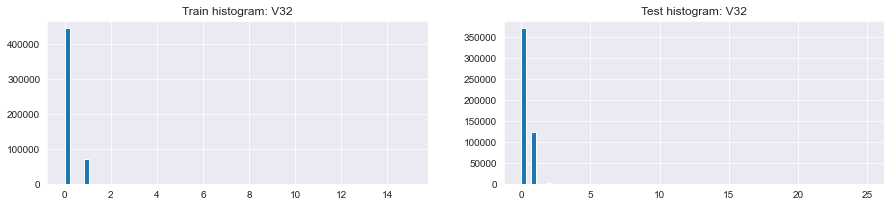

,V32,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.142,0.464,0.132,0.258,0.122,0.290
2,std,0.368,0.539,0.356,0.471,0.332,0.493
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,15.000,6.000,15.000,25.000,4.000,25.000
8,unique values,16.000,8.000,16.000,24.000,6.000,24.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V32,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,443018,0.021,9239,369709
1,-999.000,76073,0.051,3887,12589
2,1.000,70307,0.105,7365,122196
3,2.000,790,0.162,128,1723
4,3.000,226,0.106,24,324
5,4.000,51,0.294,15,78
6,5.000,44,0.068,3,26
7,6.000,8,0.250,2,8
8,7.000,5,0.000,0,4
9,8.000,4,0.000,0,4


,V32,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,443018,0.021,9239,369709
1,1.000,70307,0.105,7365,122196
2,-999.000,76073,0.051,3887,12589
3,2.000,790,0.162,128,1723
4,3.000,226,0.106,24,324
5,4.000,51,0.294,15,78
6,5.000,44,0.068,3,26
7,6.000,8,0.250,2,8
8,7.000,5,0.000,0,4
9,8.000,4,0.000,0,4


,Column,Correlation with V32
0,V32,1.000
1,V31,0.986
2,V50,0.961
3,V92,0.946
4,V71,0.939
5,V16,0.912
362,V150,-0.447
363,V36,-0.452
364,addr2,-0.457
365,V151,-0.479


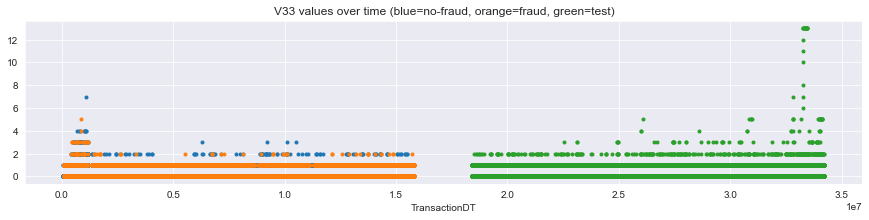

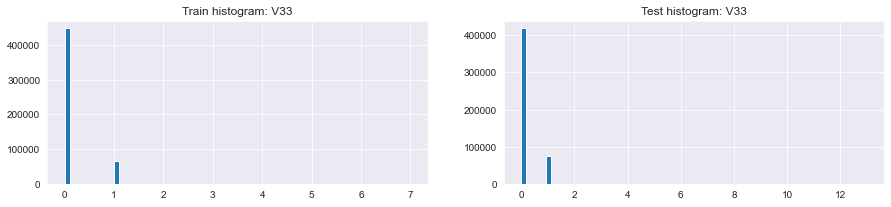

,V33,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.131,0.471,0.119,0.155,0.120,0.163
2,std,0.341,0.518,0.327,0.374,0.327,0.384
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,7.000,5.000,7.000,13.000,2.000,13.000
8,unique values,8.000,7.000,7.000,14.000,4.000,14.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V33,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,447769,0.020,9000,418368
1,-999.000,76073,0.051,3887,12589
2,1.000,66267,0.116,7672,75243
3,2.000,338,0.234,79,383
4,3.000,82,0.280,23,52
5,4.000,9,0.111,1,13
6,5.000,1,1.000,1,21
7,7.000,1,0.000,0,2


,V33,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,447769,0.020,9000,418368
1,1.000,66267,0.116,7672,75243
2,-999.000,76073,0.051,3887,12589
3,2.000,338,0.234,79,383
4,3.000,82,0.280,23,52
5,4.000,9,0.111,1,13
6,5.000,1,1.000,1,21
7,7.000,1,0.000,0,2


,Column,Correlation with V33
0,V33,1.000
1,V94,0.976
2,V34,0.959
3,V15,0.959
4,V16,0.944
5,V51,0.940
328,V53,-0.387
329,V54,-0.398
330,V35,-0.412
331,V36,-0.421


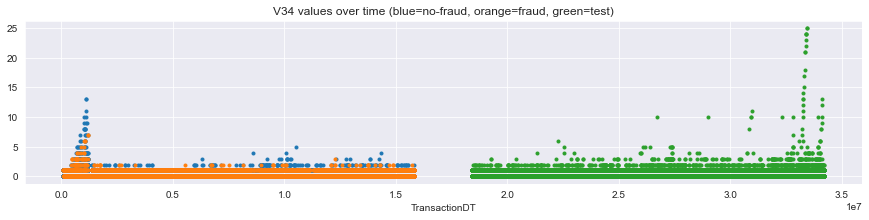

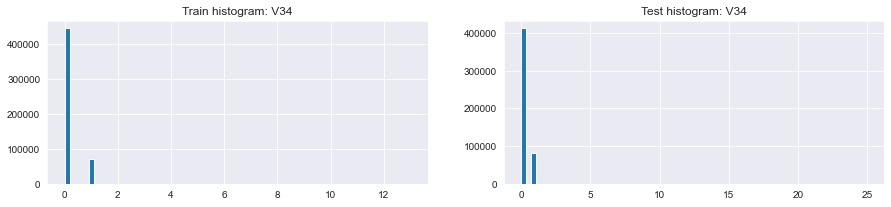

,V34,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"514,467.000","16,776.000","497,691.000","494,102.000","93,884.000","400,219.000"
1,mean,0.139,0.490,0.127,0.170,0.135,0.178
2,std,0.358,0.538,0.344,0.404,0.344,0.416
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,13.000,7.000,13.000,25.000,4.000,25.000
8,unique values,14.000,9.000,14.000,24.000,6.000,24.000
9,NaNs,"76,073.000","3,887.000","72,186.000","12,589.000","7,455.000","5,134.000"


,V34,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,443989,0.020,8760,411616
1,-999.000,76073,0.051,3887,12589
2,1.000,69776,0.113,7883,81672
3,2.000,496,0.169,84,566
4,3.000,129,0.279,36,153
5,4.000,34,0.176,6,36
6,5.000,14,0.143,2,17
7,6.000,8,0.375,3,6
8,7.000,7,0.286,2,2
9,8.000,6,0.000,0,4


,V34,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,443989,0.020,8760,411616
1,1.000,69776,0.113,7883,81672
2,-999.000,76073,0.051,3887,12589
3,2.000,496,0.169,84,566
4,3.000,129,0.279,36,153
5,4.000,34,0.176,6,36
6,6.000,8,0.375,3,6
7,5.000,14,0.143,2,17
8,7.000,7,0.286,2,2
9,8.000,6,0.000,0,4


,Column,Correlation with V34
0,V34,1.000
1,V33,0.959
2,V94,0.934
3,V16,0.931
4,V15,0.922
5,V51,0.905
328,V53,-0.364
329,V54,-0.366
330,V35,-0.389
331,V36,-0.392


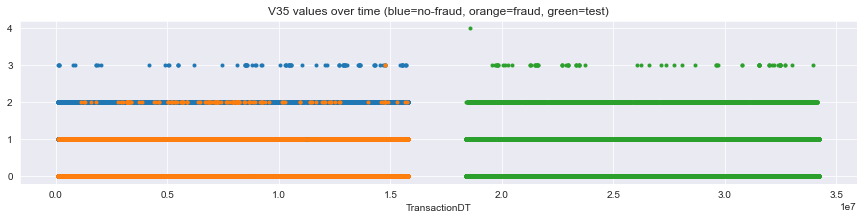

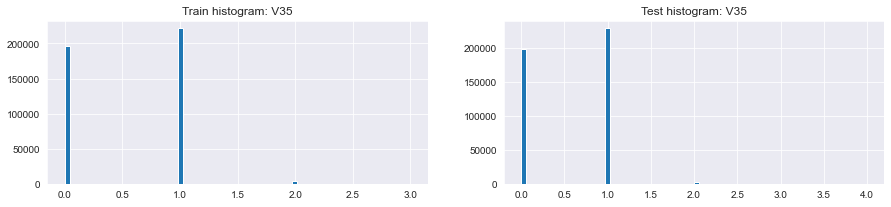

,V35,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.543,0.332,0.550,0.544,0.648,0.520
2,std,0.516,0.490,0.515,0.511,0.494,0.512
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,3.000,3.000,3.000,4.000,4.000,3.000
8,unique values,5.000,5.000,5.000,6.000,6.000,5.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V35,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,221387,0.021,4578,228457
1,0.000,196551,0.050,9859,198704
2,-999.000,168969,0.036,6096,76854
3,2.000,3544,0.036,128,2597
4,3.000,89,0.022,2,78


,V35,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,196551,0.050,9859,198704
1,-999.000,168969,0.036,6096,76854
2,1.000,221387,0.021,4578,228457
3,2.000,3544,0.036,128,2597
4,3.000,89,0.022,2,78


,Column,Correlation with V35
0,V35,1.000
1,V36,0.932
2,V75,0.744
3,V76,0.705
4,V12,0.660
5,V13,0.633
208,V32,-0.442
209,V71,-0.444
210,V92,-0.452
211,V31,-0.453


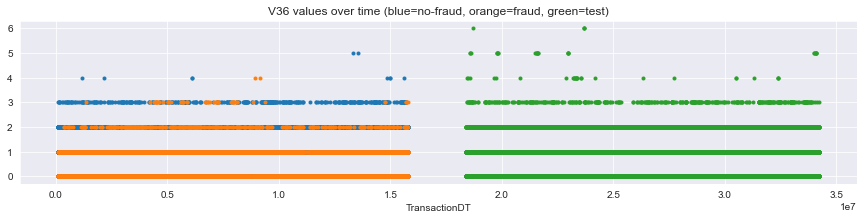

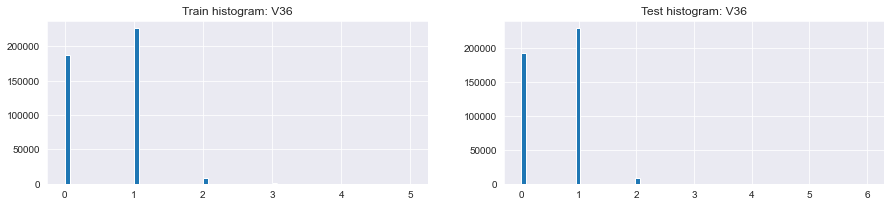

,V36,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.579,0.380,0.586,0.573,0.685,0.547
2,std,0.539,0.560,0.537,0.538,0.520,0.539
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,5.000,4.000,5.000,6.000,6.000,6.000
8,unique values,7.000,6.000,7.000,8.000,8.000,8.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V36,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,226024,0.020,4561,228956
1,0.000,186733,0.051,9545,192534
2,-999.000,168969,0.036,6096,76854
3,2.000,8307,0.049,409,7863
4,3.000,495,0.101,50,427
5,4.000,10,0.200,2,27
6,5.000,2,0.000,0,26


,V36,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,186733,0.051,9545,192534
1,-999.000,168969,0.036,6096,76854
2,1.000,226024,0.020,4561,228956
3,2.000,8307,0.049,409,7863
4,3.000,495,0.101,50,427
5,4.000,10,0.200,2,27
6,5.000,2,0.000,0,26


,Column,Correlation with V36
0,V36,1.000
1,V35,0.932
2,V76,0.747
3,V75,0.703
4,V13,0.669
5,V54,0.640
208,V32,-0.452
209,V71,-0.454
210,V92,-0.462
211,V31,-0.463


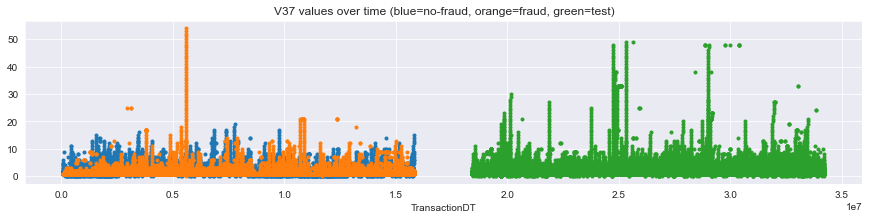

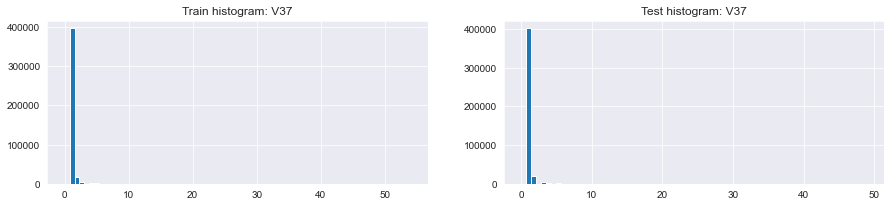

,V37,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,1.108,1.754,1.085,1.138,1.116,1.143
2,std,0.691,2.629,0.481,1.003,0.729,1.055
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,2.000,1.000,1.000,1.000,1.000
7,max,54.000,54.000,19.000,49.000,30.000,49.000
8,unique values,56.000,56.000,21.000,51.000,32.000,51.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V37,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,395228,0.027,10822,"401,275.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,2.000,18453,0.106,1956,"19,231.000"
3,3.000,3801,0.196,744,"4,231.000"
4,4.000,1474,0.195,288,"1,778.000"
5,5.000,796,0.200,159,902.000
6,6.000,420,0.305,128,555.000
7,7.000,327,0.297,97,362.000
8,0.000,325,0.006,2,191.000
9,8.000,193,0.347,67,255.000


,V37,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,395228,0.027,10822,401275
1,-999.000,168969,0.036,6096,76854
2,2.000,18453,0.106,1956,19231
3,3.000,3801,0.196,744,4231
4,4.000,1474,0.195,288,1778
5,5.000,796,0.200,159,902
6,6.000,420,0.305,128,555
7,7.000,327,0.297,97,362
8,9.000,168,0.452,76,151
9,8.000,193,0.347,67,255


,Column,Correlation with V37
0,V37,1.000
1,V38,0.869
2,V77,0.689
3,V228,0.687
4,V44,0.647
5,V230,0.598
375,V53,-0.114
376,V54,-0.117
377,V12,-0.117
378,V13,-0.120


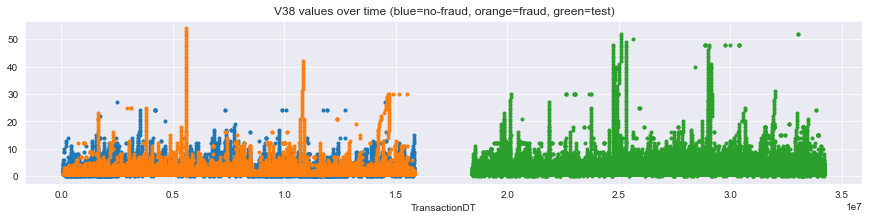

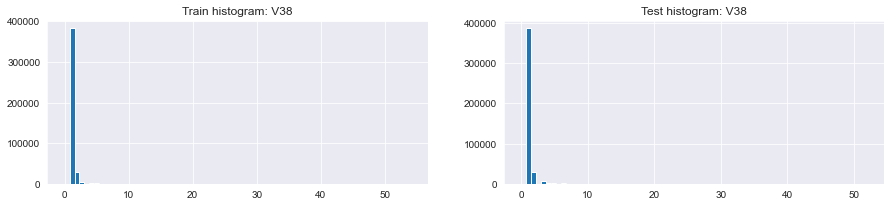

,V38,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,1.162,2.066,1.130,1.209,1.177,1.217
2,std,0.859,3.203,0.606,1.184,0.851,1.247
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,2.000,1.000,1.000,1.000,1.000
7,max,54.000,54.000,27.000,52.000,30.000,52.000
8,unique values,56.000,56.000,27.000,54.000,32.000,54.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V38,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,382093,0.026,9751,"386,613.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,2.000,28073,0.082,2301,"28,514.000"
3,3.000,5616,0.175,982,"6,793.000"
4,4.000,2208,0.206,454,"2,794.000"
5,5.000,1129,0.218,246,"1,516.000"
6,6.000,615,0.285,175,854.000
7,7.000,426,0.343,146,555.000
8,0.000,325,0.006,2,187.000
9,8.000,263,0.297,78,398.000


,V38,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,382093,0.026,9751,386613
1,-999.000,168969,0.036,6096,76854
2,2.000,28073,0.082,2301,28514
3,3.000,5616,0.175,982,6793
4,4.000,2208,0.206,454,2794
5,5.000,1129,0.218,246,1516
6,6.000,615,0.285,175,854
7,7.000,426,0.343,146,555
8,8.000,263,0.297,78,398
9,10.000,144,0.451,65,358


,Column,Correlation with V38
0,V38,1.000
1,V37,0.869
2,V45,0.641
3,V77,0.636
4,V78,0.633
5,V228,0.625
375,V53,-0.121
376,D2,-0.122
377,V12,-0.122
378,V13,-0.122


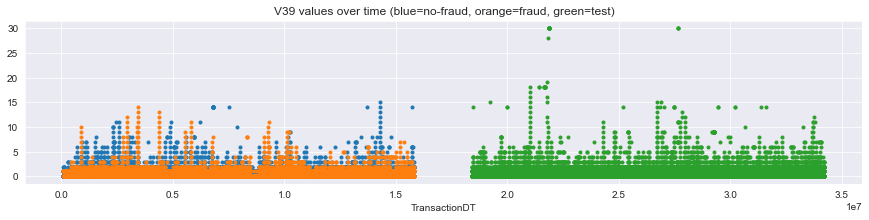

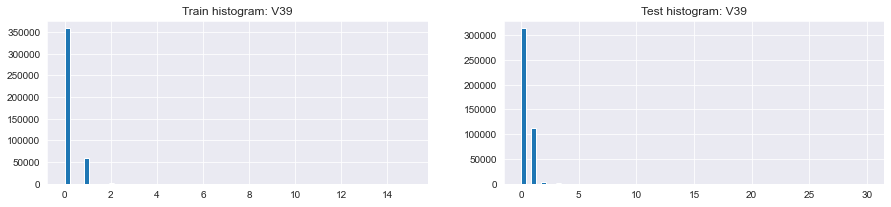

,V39,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.166,0.651,0.149,0.293,0.145,0.327
2,std,0.452,0.948,0.413,0.572,0.515,0.579
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,15.000,14.000,15.000,30.000,19.000,30.000
8,unique values,17.000,16.000,17.000,23.000,21.000,19.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V39,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,357994,0.020,7291,313015
1,-999.000,168969,0.036,6096,76854
2,1.000,59921,0.102,6097,111693
3,2.000,2497,0.295,736,3720
4,3.000,566,0.410,232,679
5,4.000,253,0.348,88,277
6,5.000,108,0.352,38,176
7,6.000,82,0.329,27,75
8,7.000,48,0.292,14,44
9,8.000,37,0.405,15,35


,V39,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,357994,0.020,7291,313015
1,1.000,59921,0.102,6097,111693
2,-999.000,168969,0.036,6096,76854
3,2.000,2497,0.295,736,3720
4,3.000,566,0.410,232,679
5,4.000,253,0.348,88,277
6,5.000,108,0.352,38,176
7,6.000,82,0.329,27,75
8,8.000,37,0.405,15,35
9,7.000,48,0.292,14,44


,Column,Correlation with V39
0,V39,1.000
1,V40,0.944
2,V80,0.902
3,V59,0.896
4,V42,0.876
5,V81,0.867
362,V12,-0.390
363,V36,-0.395
364,V13,-0.400
365,V53,-0.401


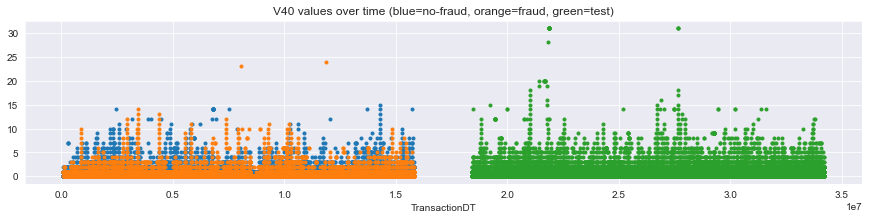

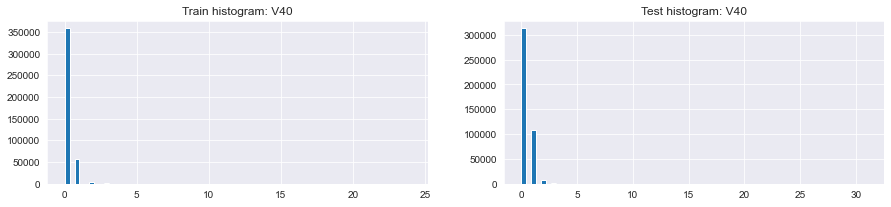

,V40,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.177,0.745,0.157,0.311,0.163,0.345
2,std,0.506,1.155,0.453,0.639,0.607,0.641
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,1.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,24.000,24.000,15.000,31.000,20.000,31.000
8,unique values,19.000,18.000,17.000,24.000,22.000,22.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V40,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,357837,0.020,7265,"312,763.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,1.000,57473,0.096,5514,"107,469.000"
3,2.000,4230,0.241,1020,"6,757.000"
4,3.000,1046,0.399,417,"1,415.000"
5,4.000,400,0.357,143,591.000
6,5.000,209,0.273,57,320.000
7,6.000,145,0.421,61,183.000
8,7.000,78,0.295,23,88.000
9,8.000,50,0.440,22,84.000


,V40,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,357837,0.020,7265,312763
1,-999.000,168969,0.036,6096,76854
2,1.000,57473,0.096,5514,107469
3,2.000,4230,0.241,1020,6757
4,3.000,1046,0.399,417,1415
5,4.000,400,0.357,143,591
6,6.000,145,0.421,61,183
7,5.000,209,0.273,57,320
8,7.000,78,0.295,23,88
9,8.000,50,0.440,22,84


,Column,Correlation with V40
0,V40,1.000
1,V39,0.944
2,V81,0.876
3,V60,0.866
4,V80,0.863
5,V43,0.853
362,V36,-0.376
363,V13,-0.381
364,V53,-0.383
365,addr2,-0.387


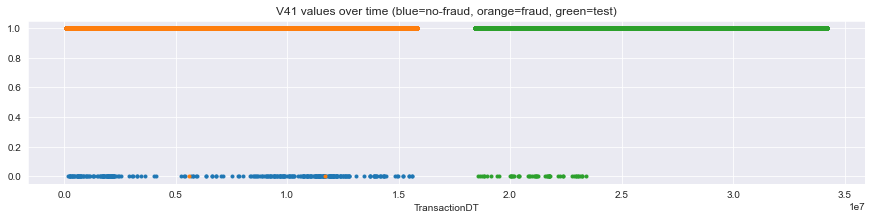

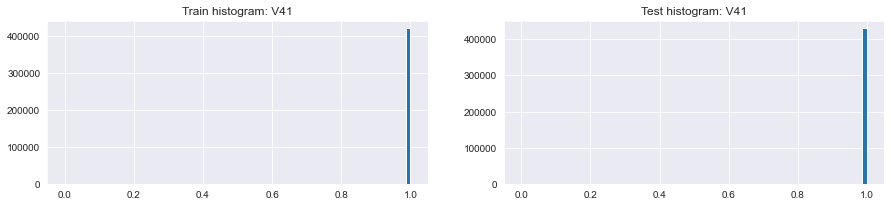

,V41,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.999,1.000,0.999,1.000,1.000,1.000
2,std,0.027,0.012,0.027,0.011,0.021,0.006
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,1.000,1.000,1.000,1.000,1.000,1.000
8,unique values,3.000,3.000,3.000,3.000,3.000,3.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V41,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,421263,0.035,14565,429786
1,-999.000,168969,0.036,6096,76854
2,0.000,308,0.006,2,51


,V41,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,421263,0.035,14565,429786
1,-999.000,168969,0.036,6096,76854
2,0.000,308,0.006,2,51


,Column,Correlation with V41
0,V41,1.000
1,V88,0.943
2,V65,0.891
3,V14,0.880
4,V1,0.462
5,V46,0.166
375,V302,-0.048
376,D5,-0.051
377,D6,-0.051
378,D8,-0.066


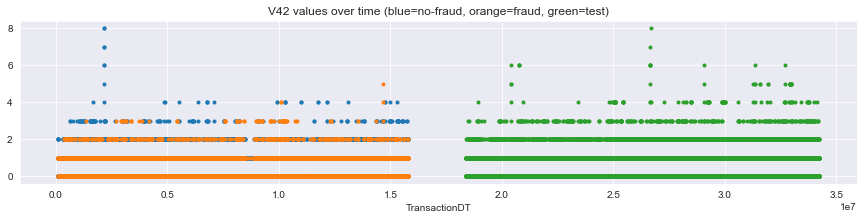

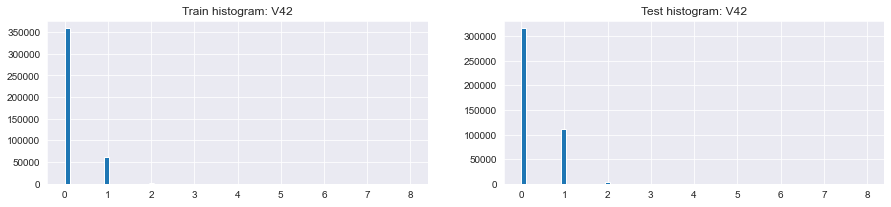

,V42,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.156,0.540,0.142,0.276,0.130,0.310
2,std,0.383,0.597,0.366,0.475,0.361,0.491
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,8.000,5.000,8.000,8.000,6.000,8.000
8,unique values,10.000,7.000,10.000,10.000,8.000,10.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V42,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,358439,0.021,7401,315401
1,-999.000,168969,0.036,6096,76854
2,1.000,60801,0.108,6558,110831
3,2.000,2037,0.259,528,3027
4,3.000,256,0.297,76,427
5,4.000,30,0.100,3,108
6,5.000,2,0.500,1,30
7,6.000,2,0.000,0,11
8,7.000,2,0.000,0,1
9,8.000,2,0.000,0,1


,V42,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,358439,0.021,7401,315401
1,1.000,60801,0.108,6558,110831
2,-999.000,168969,0.036,6096,76854
3,2.000,2037,0.259,528,3027
4,3.000,256,0.297,76,427
5,4.000,30,0.100,3,108
6,5.000,2,0.500,1,30
7,6.000,2,0.000,0,11
8,7.000,2,0.000,0,1
9,8.000,2,0.000,0,1


,Column,Correlation with V42
0,V42,1.000
1,V84,0.958
2,V63,0.953
3,V43,0.952
4,V21,0.944
5,V22,0.934
362,V12,-0.433
363,V36,-0.438
364,V13,-0.444
365,V53,-0.447


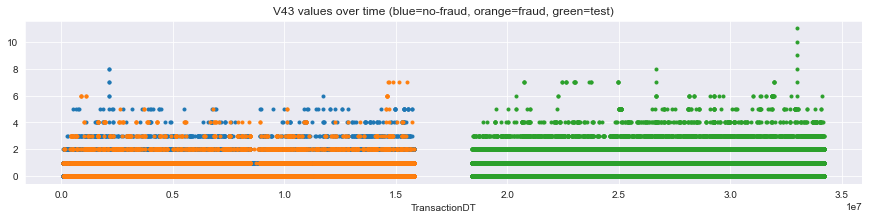

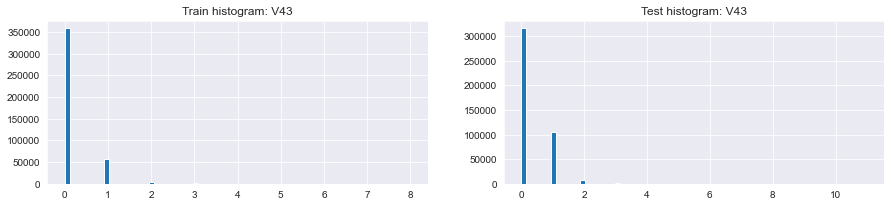

,V43,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.169,0.623,0.153,0.298,0.146,0.333
2,std,0.433,0.770,0.407,0.540,0.427,0.557
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,8.000,7.000,8.000,11.000,7.000,11.000
8,unique values,10.000,9.000,10.000,13.000,9.000,13.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V43,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,358261,0.021,7372,315056
1,-999.000,168969,0.036,6096,76854
2,1.000,56929,0.102,5830,104444
3,2.000,5234,0.188,985,8167
4,3.000,885,0.324,287,1632
5,4.000,174,0.397,69,359
6,5.000,66,0.136,9,104
7,6.000,13,0.769,10,44
8,7.000,7,0.714,5,26
9,8.000,2,0.000,0,2


,V43,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,358261,0.021,7372,315056
1,-999.000,168969,0.036,6096,76854
2,1.000,56929,0.102,5830,104444
3,2.000,5234,0.188,985,8167
4,3.000,885,0.324,287,1632
5,4.000,174,0.397,69,359
6,6.000,13,0.769,10,44
7,5.000,66,0.136,9,104
8,7.000,7,0.714,5,26
9,8.000,2,0.000,0,2


,Column,Correlation with V43
0,V43,1.000
1,V42,0.952
2,V64,0.920
3,V85,0.915
4,V84,0.915
5,V63,0.910
362,V12,-0.414
363,V36,-0.419
364,V13,-0.425
365,V53,-0.427


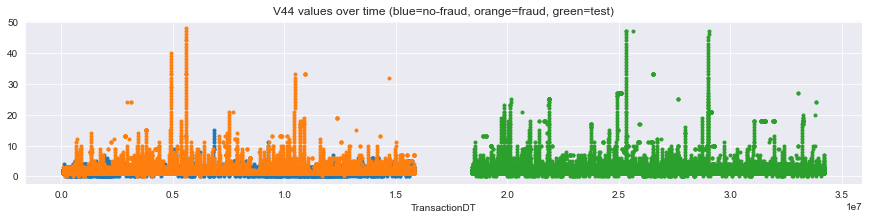

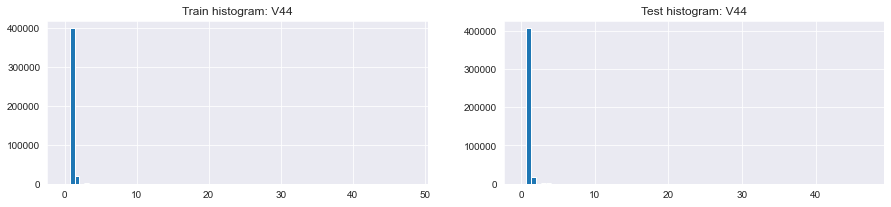

,V44,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,1.084,1.964,1.052,1.103,1.110,1.102
2,std,0.639,3.011,0.264,0.844,0.753,0.863
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,2.000,1.000,1.000,1.000,1.000
7,max,48.000,48.000,15.000,47.000,25.000,47.000
8,unique values,50.000,50.000,17.000,49.000,27.000,49.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V44,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,397653,0.026,10345,"405,518.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,2.000,19434,0.102,1979,"18,884.000"
3,3.000,2242,0.330,740,"2,588.000"
4,4.000,615,0.686,422,868.000
5,0.000,441,0.077,34,202.000
6,5.000,319,0.765,244,341.000
7,6.000,208,0.812,169,219.000
8,7.000,138,0.949,131,167.000
9,9.000,102,0.961,98,109.000


,V44,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,397653,0.026,10345,405518
1,-999.000,168969,0.036,6096,76854
2,2.000,19434,0.102,1979,18884
3,3.000,2242,0.330,740,2588
4,4.000,615,0.686,422,868
5,5.000,319,0.765,244,341
6,6.000,208,0.812,169,219
7,7.000,138,0.949,131,167
8,9.000,102,0.961,98,109
9,8.000,83,0.928,77,98


,Column,Correlation with V44
0,V44,1.000
1,V45,0.905
2,V257,0.767
3,V200,0.693
4,V199,0.688
5,V246,0.682
375,V13,-0.065
376,V53,-0.069
377,V54,-0.071
378,D8,-0.082


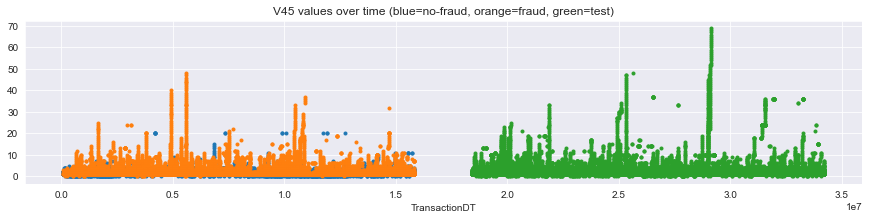

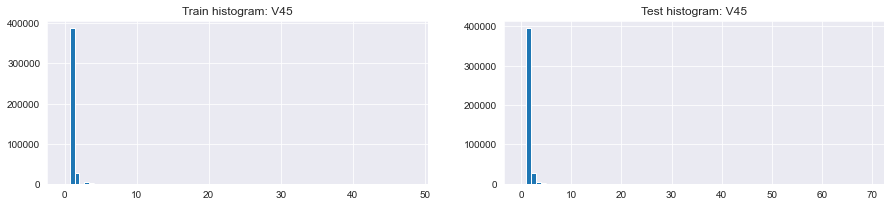

,V45,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,1.121,2.208,1.082,1.147,1.156,1.144
2,std,0.730,3.291,0.347,1.076,0.859,1.119
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,2.000,1.000,1.000,1.000,1.000
7,max,48.000,48.000,20.000,69.000,25.000,69.000
8,unique values,50.000,50.000,18.000,71.000,27.000,71.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V45,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,387027,0.025,9613,394651
1,-999.000,168969,0.036,6096,76854
2,2.000,28125,0.077,2166,27474
3,3.000,3472,0.231,801,3956
4,4.000,906,0.620,562,1230
5,5.000,438,0.733,321,520
6,0.000,412,0.061,25,195
7,6.000,253,0.814,206,365
8,7.000,214,0.921,197,202
9,9.000,143,0.958,137,117


,V45,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,387027,0.025,9613,394651
1,-999.000,168969,0.036,6096,76854
2,2.000,28125,0.077,2166,27474
3,3.000,3472,0.231,801,3956
4,4.000,906,0.620,562,1230
5,5.000,438,0.733,321,520
6,6.000,253,0.814,206,365
7,7.000,214,0.921,197,202
8,9.000,143,0.958,137,117
9,8.000,132,0.924,122,134


,Column,Correlation with V45
0,V45,1.000
1,V44,0.905
2,V257,0.742
3,V201,0.670
4,V246,0.669
5,V199,0.666
375,V12,-0.067
376,V54,-0.069
377,V53,-0.070
378,D8,-0.090


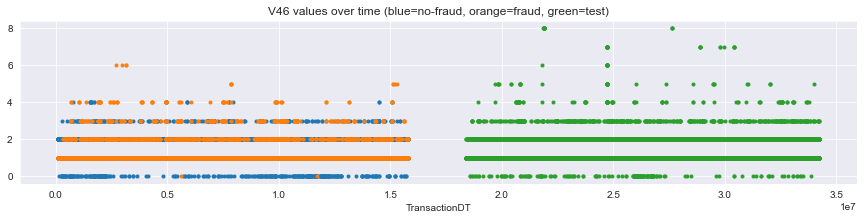

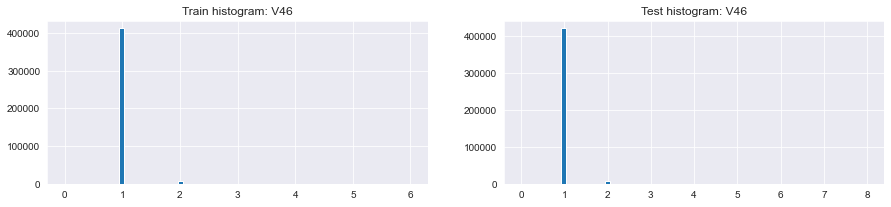

,V46,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,1.022,1.133,1.018,1.022,1.021,1.023
2,std,0.167,0.448,0.145,0.176,0.167,0.178
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,6.000,6.000,4.000,8.000,6.000,8.000
8,unique values,8.000,8.000,6.000,10.000,8.000,10.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V46,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,412247,0.032,13110,421088
1,-999.000,168969,0.036,6096,76854
2,2.000,8340,0.129,1075,7784
3,3.000,521,0.551,287,620
4,0.000,348,0.006,2,171
5,4.000,103,0.786,81,94
6,5.000,8,1.000,8,36
7,6.000,4,1.000,4,10


,V46,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,412247,0.032,13110,421088
1,-999.000,168969,0.036,6096,76854
2,2.000,8340,0.129,1075,7784
3,3.000,521,0.551,287,620
4,4.000,103,0.786,81,94
5,5.000,8,1.000,8,36
6,6.000,4,1.000,4,10
7,0.000,348,0.006,2,171


,Column,Correlation with V46
0,V46,1.000
1,V47,0.755
2,V44,0.391
3,V37,0.391
4,V45,0.360
5,V38,0.340
375,V12,-0.040
376,V29,-0.040
377,V75,-0.043
378,D8,-0.062


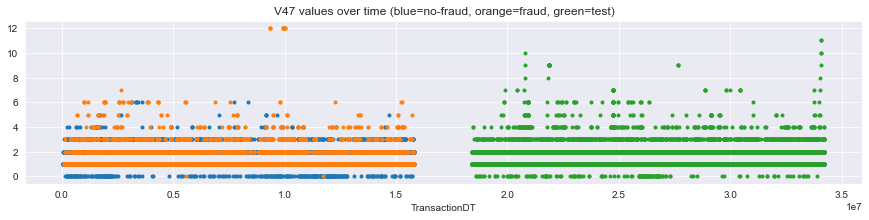

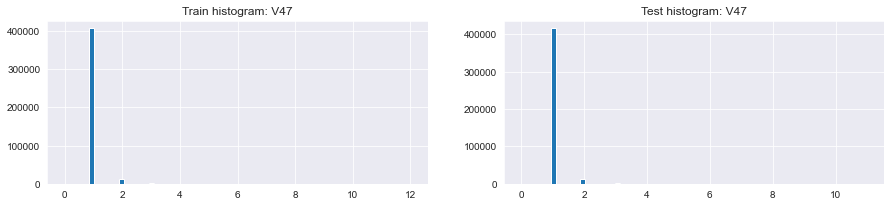

,V47,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,1.039,1.240,1.031,1.038,1.037,1.038
2,std,0.232,0.708,0.190,0.236,0.235,0.236
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,12.000,12.000,6.000,11.000,10.000,11.000
8,unique values,10.000,10.000,8.000,13.000,12.000,13.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V47,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,406519,0.030,12234,"415,540.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,2.000,13389,0.122,1628,"12,651.000"
3,3.000,1018,0.471,479,"1,014.000"
4,0.000,347,0.006,2,169.000
5,4.000,189,0.714,135,284.000
6,6.000,49,0.796,39,55.000
7,5.000,44,0.773,34,75.000
8,12.000,15,1.000,15,nan
9,7.000,1,1.000,1,26.000


,V47,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,406519,0.030,12234,"415,540.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,2.000,13389,0.122,1628,"12,651.000"
3,3.000,1018,0.471,479,"1,014.000"
4,4.000,189,0.714,135,284.000
5,6.000,49,0.796,39,55.000
6,5.000,44,0.773,34,75.000
7,12.000,15,1.000,15,nan
8,0.000,347,0.006,2,169.000
9,7.000,1,1.000,1,26.000


,Column,Correlation with V47
0,V47,1.000
1,V46,0.755
2,V38,0.412
3,V45,0.399
4,V52,0.365
5,V44,0.310
375,V69,-0.058
376,V90,-0.059
377,V29,-0.060
378,D8,-0.072


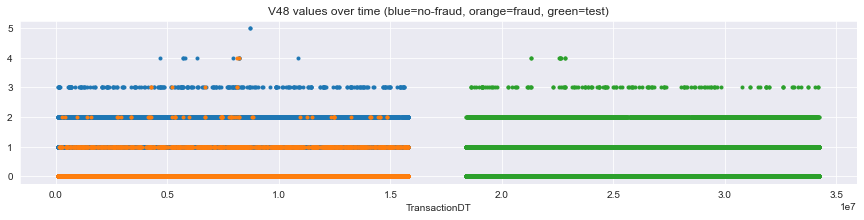

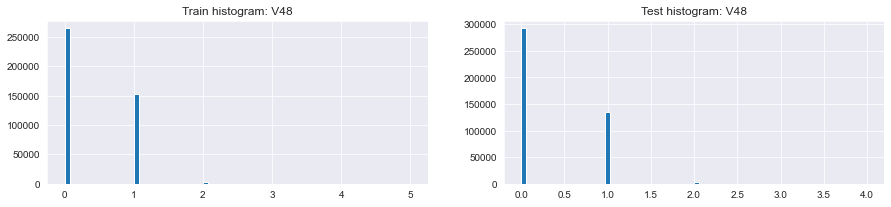

,V48,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.383,0.072,0.394,0.328,0.404,0.310
2,std,0.508,0.281,0.511,0.486,0.510,0.478
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,5.000,4.000,5.000,4.000,4.000,4.000
8,unique values,7.000,6.000,7.000,6.000,6.000,6.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V48,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,264325,0.051,13591,"292,210.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,1.000,153267,0.006,911,"134,613.000"
3,2.000,3685,0.015,57,"2,862.000"
4,3.000,280,0.021,6,143.000
5,4.000,12,0.167,2,9.000
6,5.000,2,0.000,0,nan


,V48,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,264325,0.051,13591,"292,210.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,1.000,153267,0.006,911,"134,613.000"
3,2.000,3685,0.015,57,"2,862.000"
4,3.000,280,0.021,6,143.000
5,4.000,12,0.167,2,9.000
6,5.000,2,0.000,0,nan


,Column,Correlation with V48
0,V48,1.000
1,V49,0.968
2,V90,0.945
3,V29,0.915
4,V69,0.912
5,V91,0.910
208,V92,-0.324
209,V33,-0.327
210,V34,-0.329
211,V94,-0.331


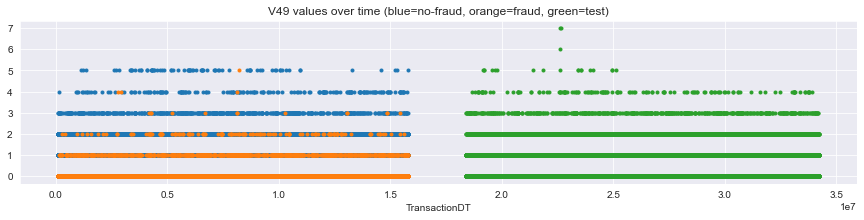

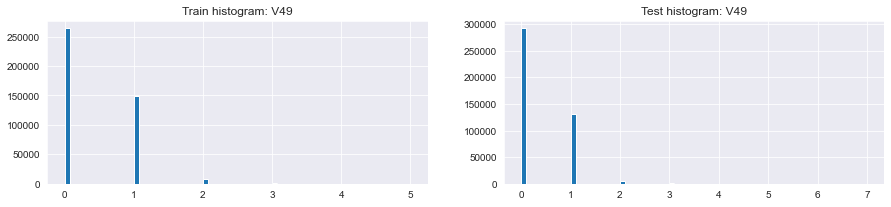

,V49,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.398,0.080,0.409,0.340,0.419,0.321
2,std,0.543,0.317,0.546,0.516,0.543,0.508
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,5.000,5.000,5.000,7.000,5.000,7.000
8,unique values,7.000,7.000,7.000,9.000,7.000,9.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V49,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,263761,0.051,13580,291701
1,-999.000,168969,0.036,6096,76854
2,1.000,149250,0.006,837,131223
3,2.000,7604,0.017,133,6131
4,3.000,691,0.019,13,621
5,4.000,187,0.016,3,140
6,5.000,78,0.013,1,18


,V49,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,263761,0.051,13580,291701
1,-999.000,168969,0.036,6096,76854
2,1.000,149250,0.006,837,131223
3,2.000,7604,0.017,133,6131
4,3.000,691,0.019,13,621
5,4.000,187,0.016,3,140
6,5.000,78,0.013,1,18


,Column,Correlation with V49
0,V49,1.000
1,V48,0.968
2,V91,0.926
3,V90,0.918
4,V30,0.894
5,V70,0.891
208,V92,-0.315
209,V33,-0.317
210,V34,-0.320
211,V94,-0.322


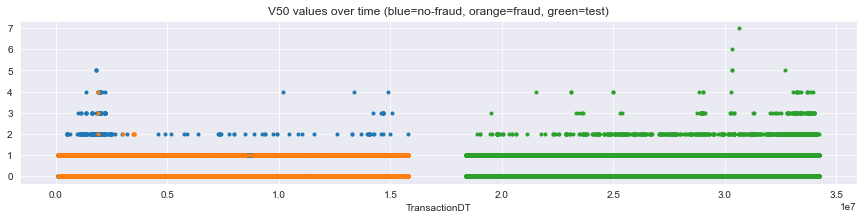

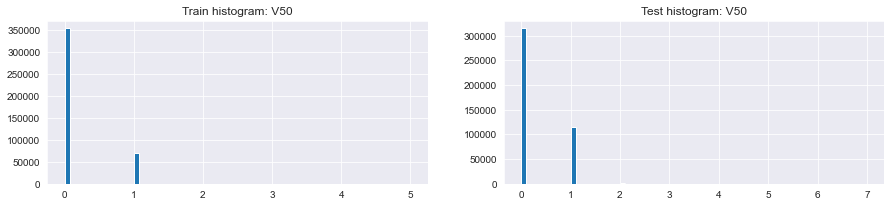

,V50,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.165,0.520,0.152,0.272,0.128,0.305
2,std,0.374,0.502,0.362,0.453,0.336,0.469
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,1.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,5.000,4.000,5.000,7.000,4.000,7.000
8,unique values,7.000,6.000,7.000,9.000,6.000,9.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V50,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,352482,0.020,6997,314211
1,-999.000,168969,0.036,6096,76854
2,1.000,68817,0.110,7561,114527
3,2.000,202,0.035,7,959
4,3.000,52,0.019,1,114
5,4.000,15,0.067,1,21
6,5.000,3,0.000,0,3


,V50,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,68817,0.110,7561,114527
1,0.000,352482,0.020,6997,314211
2,-999.000,168969,0.036,6096,76854
3,2.000,202,0.035,7,959
4,3.000,52,0.019,1,114
5,4.000,15,0.067,1,21
6,5.000,3,0.000,0,3


,Column,Correlation with V50
0,V50,1.000
1,V31,0.981
2,V92,0.971
3,V71,0.964
4,V32,0.961
5,V15,0.947
362,V160,-0.529
363,V145,-0.534
364,V150,-0.540
365,V151,-0.573


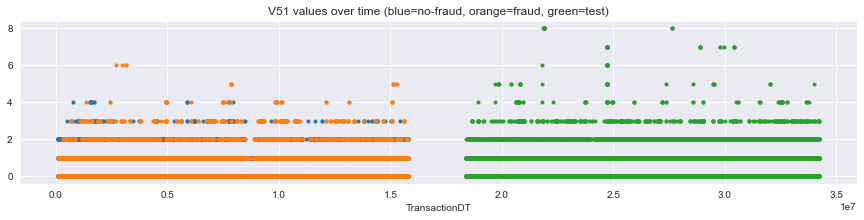

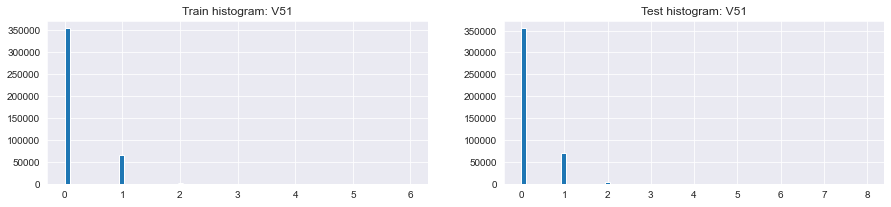

,V51,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.171,0.647,0.154,0.186,0.147,0.195
2,std,0.404,0.724,0.377,0.426,0.389,0.434
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,1.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,6.000,6.000,4.000,8.000,6.000,8.000
8,unique values,8.000,8.000,6.000,10.000,8.000,10.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V51,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,353522,0.019,6777,354721
1,-999.000,168969,0.036,6096,76854
2,1.000,64775,0.102,6578,71266
3,2.000,2780,0.311,865,3205
4,3.000,416,0.688,286,485
5,4.000,66,0.742,49,83
6,5.000,8,1.000,8,33
7,6.000,4,1.000,4,10


,V51,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,353522,0.019,6777,354721
1,1.000,64775,0.102,6578,71266
2,-999.000,168969,0.036,6096,76854
3,2.000,2780,0.311,865,3205
4,3.000,416,0.688,286,485
5,4.000,66,0.742,49,83
6,5.000,8,1.000,8,33
7,6.000,4,1.000,4,10


,Column,Correlation with V51
0,V51,1.000
1,V52,0.952
2,V94,0.951
3,V33,0.940
4,V73,0.936
5,V15,0.923
328,V12,-0.418
329,V13,-0.428
330,V53,-0.435
331,V54,-0.445


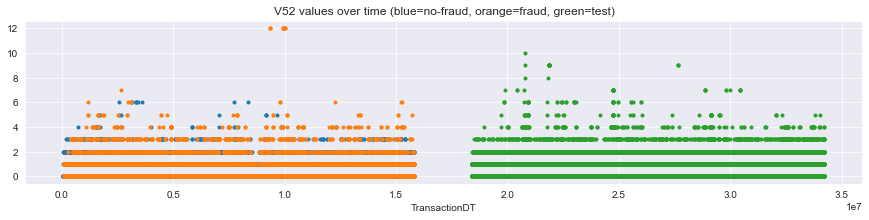

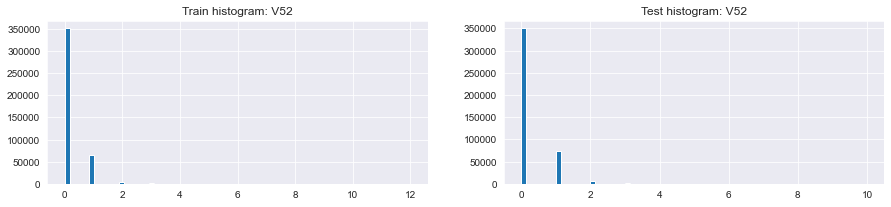

,V52,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"421,571.000","14,567.000","407,004.000","429,837.000","80,247.000","349,591.000"
1,mean,0.183,0.738,0.163,0.205,0.165,0.215
2,std,0.439,0.924,0.397,0.465,0.432,0.472
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,1.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,12.000,12.000,6.000,10.000,10.000,9.000
8,unique values,10.000,10.000,8.000,12.000,12.000,11.000
9,NaNs,"168,969.000","6,096.000","162,873.000","76,854.000","21,092.000","55,762.000"


,V52,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,351237,0.019,6650,"349,816.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,1.000,65030,0.094,6085,"73,528.000"
3,2.000,4362,0.273,1190,"5,357.000"
4,3.000,705,0.638,450,774.000
5,4.000,161,0.839,135,214.000
6,5.000,41,0.780,32,65.000
7,6.000,19,0.474,9,42.000
8,12.000,15,1.000,15,nan
9,7.000,1,1.000,1,24.000


,V52,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,351237,0.019,6650,"349,816.000"
1,-999.000,168969,0.036,6096,"76,854.000"
2,1.000,65030,0.094,6085,"73,528.000"
3,2.000,4362,0.273,1190,"5,357.000"
4,3.000,705,0.638,450,774.000
5,4.000,161,0.839,135,214.000
6,5.000,41,0.780,32,65.000
7,12.000,15,1.000,15,nan
8,6.000,19,0.474,9,42.000
9,7.000,1,1.000,1,24.000


,Column,Correlation with V52
0,V52,1.000
1,V51,0.952
2,V94,0.905
3,V74,0.900
4,V33,0.895
5,V73,0.895
328,V12,-0.394
329,V13,-0.399
330,V53,-0.413
331,V54,-0.417


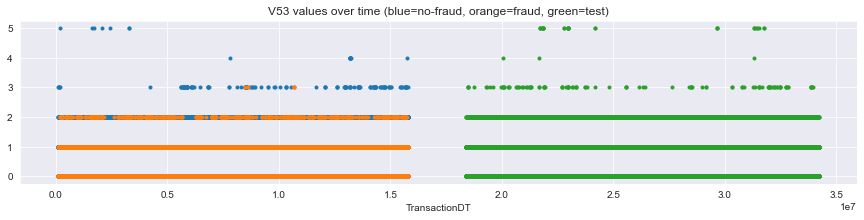

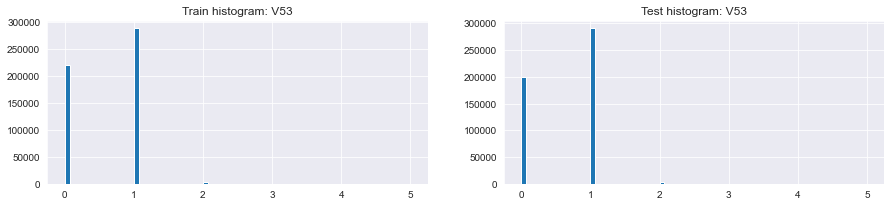

,V53,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.578,0.443,0.582,0.605,0.706,0.581
2,std,0.512,0.566,0.509,0.508,0.482,0.511
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,5.000,3.000,5.000,5.000,5.000,5.000
8,unique values,7.000,5.000,7.000,7.000,7.000,7.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V53,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,288055,0.021,5984,290128
1,0.000,221227,0.043,9586,199557
2,-999.000,77096,0.058,4509,12899
3,2.000,4006,0.145,579,3961
4,3.000,140,0.036,5,113
5,4.000,9,0.000,0,3
6,5.000,7,0.000,0,30


,V53,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,221227,0.043,9586,199557
1,1.000,288055,0.021,5984,290128
2,-999.000,77096,0.058,4509,12899
3,2.000,4006,0.145,579,3961
4,3.000,140,0.036,5,113
5,4.000,9,0.000,0,3
6,5.000,7,0.000,0,30


,Column,Correlation with V53
0,V53,1.000
1,V54,0.920
2,V75,0.659
3,V12,0.635
4,V35,0.631
5,V76,0.622
208,V51,-0.435
209,V71,-0.436
210,V92,-0.446
211,V42,-0.447


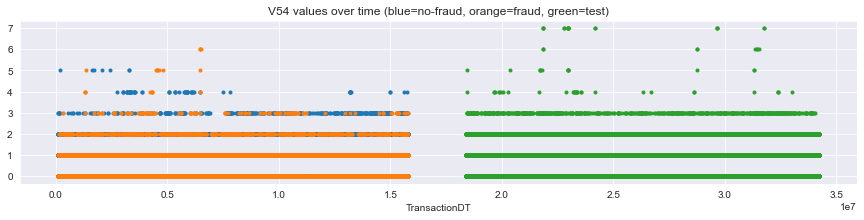

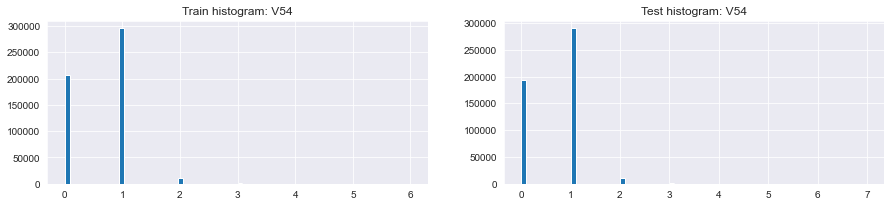

,V54,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.620,0.510,0.624,0.634,0.746,0.609
2,std,0.535,0.654,0.530,0.536,0.509,0.538
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,6.000,6.000,5.000,7.000,5.000,7.000
8,unique values,8.000,8.000,7.000,9.000,7.000,9.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V54,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,295235,0.020,5977,289597
1,0.000,207068,0.044,9131,192825
2,-999.000,77096,0.058,4509,12899
3,2.000,10445,0.087,905,10571
4,3.000,603,0.204,123,728
5,4.000,76,0.105,8,32
6,5.000,14,0.500,7,13
7,6.000,3,1.000,3,8


,V54,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,207068,0.044,9131,192825
1,1.000,295235,0.020,5977,289597
2,-999.000,77096,0.058,4509,12899
3,2.000,10445,0.087,905,10571
4,3.000,603,0.204,123,728
5,4.000,76,0.105,8,32
6,5.000,14,0.500,7,13
7,6.000,3,1.000,3,8


,Column,Correlation with V54
0,V54,1.000
1,V53,0.920
2,V76,0.669
3,V13,0.644
4,V36,0.640
5,V75,0.623
208,V31,-0.446
209,V71,-0.448
210,V42,-0.458
211,V92,-0.458


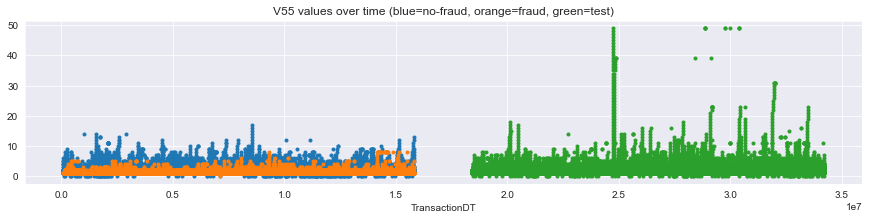

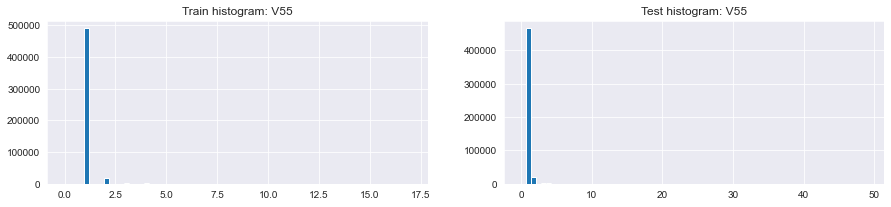

,V55,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,1.068,1.176,1.064,1.093,1.077,1.096
2,std,0.391,0.585,0.383,0.667,0.425,0.712
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,17.000,8.000,17.000,49.000,18.000,49.000
8,unique values,19.000,10.000,19.000,51.000,20.000,51.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V55,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,489239,0.029,14104,465610
1,-999.000,77096,0.058,4509,12899
2,2.000,18464,0.088,1619,21137
3,3.000,3100,0.083,257,3706
4,4.000,1233,0.067,83,1436
5,5.000,530,0.089,47,654
6,6.000,300,0.027,8,383
7,0.000,180,0.006,1,139
8,7.000,144,0.021,3,185
9,8.000,124,0.258,32,116


,V55,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,489239,0.029,14104,465610
1,-999.000,77096,0.058,4509,12899
2,2.000,18464,0.088,1619,21137
3,3.000,3100,0.083,257,3706
4,4.000,1233,0.067,83,1436
5,5.000,530,0.089,47,654
6,8.000,124,0.258,32,116
7,6.000,300,0.027,8,383
8,7.000,144,0.021,3,185
9,0.000,180,0.006,1,139


,Column,Correlation with V55
0,V55,1.000
1,V56,0.692
2,V290,0.612
3,V292,0.531
4,V281,0.528
5,V77,0.522
375,V29,-0.097
376,V49,-0.097
377,V48,-0.100
378,D2,-0.127


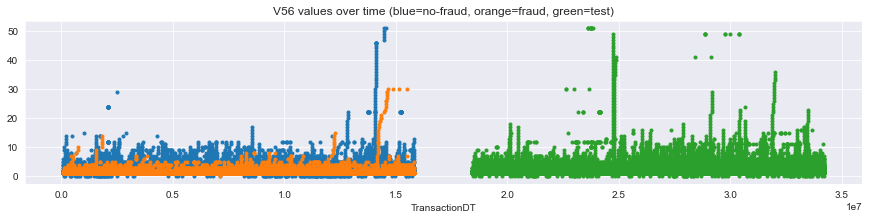

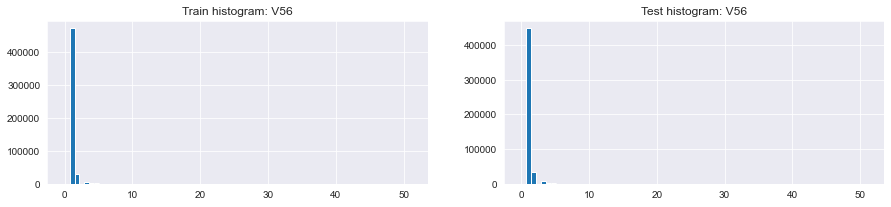

,V56,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,1.121,1.346,1.114,1.156,1.135,1.161
2,std,0.661,1.199,0.635,0.831,0.553,0.883
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,51.000,30.000,51.000,51.000,18.000,51.000
8,unique values,53.000,32.000,53.000,52.000,20.000,52.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V56,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,472700,0.027,12939,"447,151.000"
1,-999.000,77096,0.058,4509,"12,899.000"
2,2.000,30886,0.071,2180,"33,758.000"
3,3.000,5610,0.098,547,"7,192.000"
4,4.000,1881,0.156,293,"2,536.000"
5,5.000,952,0.102,97,"1,194.000"
6,6.000,355,0.068,24,549.000
7,7.000,246,0.073,18,337.000
8,0.000,180,0.006,1,136.000
9,8.000,169,0.059,10,210.000


,V56,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,472700,0.027,12939,447151
1,-999.000,77096,0.058,4509,12899
2,2.000,30886,0.071,2180,33758
3,3.000,5610,0.098,547,7192
4,4.000,1881,0.156,293,2536
5,5.000,952,0.102,97,1194
6,6.000,355,0.068,24,549
7,7.000,246,0.073,18,337
8,8.000,169,0.059,10,210
9,30.000,5,0.800,4,7


,Column,Correlation with V56
0,V56,1.000
1,V292,0.737
2,V55,0.692
3,V290,0.664
4,V291,0.658
5,V78,0.587
375,V90,-0.098
376,V29,-0.098
377,V48,-0.098
378,D7,-0.133


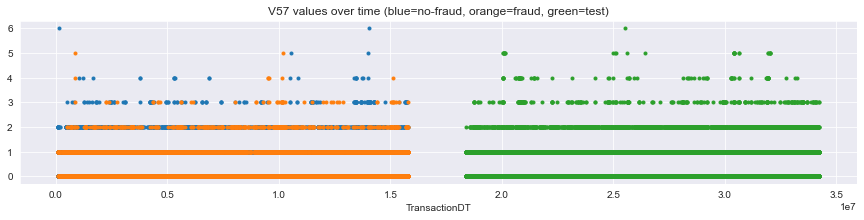

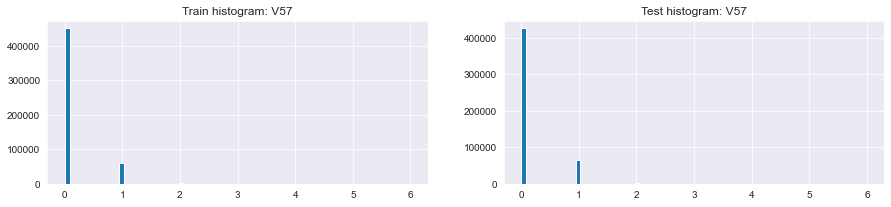

,V57,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.128,0.455,0.118,0.146,0.110,0.154
2,std,0.349,0.575,0.334,0.376,0.340,0.383
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,6.000,5.000,6.000,6.000,5.000,6.000
8,unique values,8.000,7.000,8.000,8.000,7.000,8.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V57,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,449807,0.021,9386,425265
1,-999.000,77096,0.058,4509,12899
2,1.000,61670,0.101,6248,65642
3,2.000,1731,0.266,461,2475
4,3.000,203,0.251,51,299
5,4.000,27,0.222,6,83
6,5.000,4,0.500,2,27
7,6.000,2,0.000,0,1


,V57,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,449807,0.021,9386,425265
1,1.000,61670,0.101,6248,65642
2,-999.000,77096,0.058,4509,12899
3,2.000,1731,0.266,461,2475
4,3.000,203,0.251,51,299
5,4.000,27,0.222,6,83
6,5.000,4,0.500,2,27
7,6.000,2,0.000,0,1


,Column,Correlation with V57
0,V57,1.000
1,V58,0.963
2,V15,0.959
3,V71,0.943
4,V73,0.941
5,V50,0.939
315,V53,-0.415
316,V54,-0.426
317,V35,-0.436
318,V36,-0.445


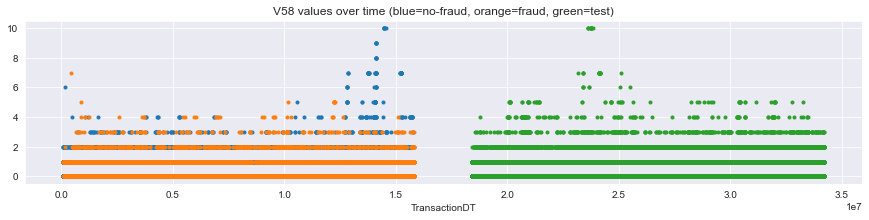

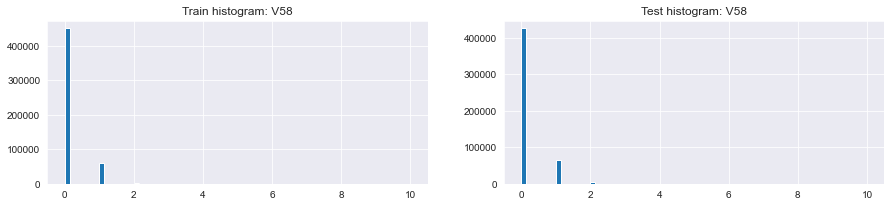

,V58,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.132,0.491,0.121,0.151,0.114,0.159
2,std,0.373,0.650,0.354,0.400,0.364,0.408
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,10.000,7.000,10.000,10.000,5.000,10.000
8,unique values,12.000,8.000,12.000,10.000,7.000,10.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V58,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,449600,0.021,9357,"425,256.000"
1,-999.000,77096,0.058,4509,"12,899.000"
2,1.000,60662,0.097,5875,"63,921.000"
3,2.000,2675,0.286,765,"3,789.000"
4,3.000,300,0.400,120,596.000
5,4.000,105,0.267,28,129.000
6,7.000,45,0.022,1,18.000
7,5.000,31,0.258,8,65.000
8,6.000,10,0.000,0,7.000
9,10.000,6,0.000,0,11.000


,V58,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,449600,0.021,9357,425256
1,1.000,60662,0.097,5875,63921
2,-999.000,77096,0.058,4509,12899
3,2.000,2675,0.286,765,3789
4,3.000,300,0.400,120,596
5,4.000,105,0.267,28,129
6,5.000,31,0.258,8,65
7,7.000,45,0.022,1,18
8,6.000,10,0.000,0,7
9,10.000,6,0.000,0,11


,Column,Correlation with V58
0,V58,1.000
1,V57,0.963
2,V79,0.948
3,V72,0.944
4,V15,0.926
5,V71,0.908
315,V53,-0.401
316,V54,-0.412
317,V35,-0.420
318,V36,-0.430


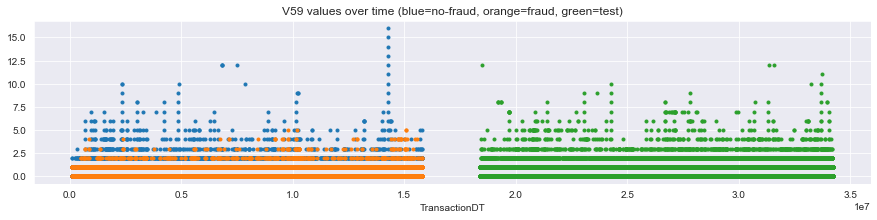

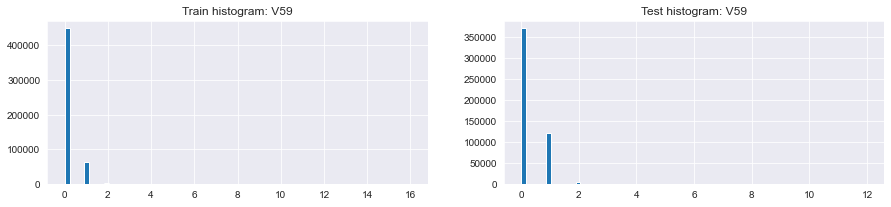

,V59,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.134,0.452,0.124,0.266,0.124,0.300
2,std,0.379,0.600,0.365,0.487,0.388,0.501
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,16.000,5.000,16.000,12.000,12.000,12.000
8,unique values,18.000,7.000,18.000,14.000,11.000,14.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V59,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,448636,0.021,9555,"369,048.000"
1,-999.000,77096,0.058,4509,"12,899.000"
2,1.000,61876,0.098,6049,"119,715.000"
3,2.000,2264,0.191,432,"4,054.000"
4,3.000,388,0.211,82,605.000
5,4.000,148,0.216,32,171.000
6,5.000,62,0.065,4,91.000
7,6.000,29,0.000,0,43.000
8,7.000,13,0.000,0,36.000
9,8.000,7,0.000,0,17.000


,V59,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,448636,0.021,9555,"369,048.000"
1,1.000,61876,0.098,6049,"119,715.000"
2,-999.000,77096,0.058,4509,"12,899.000"
3,2.000,2264,0.191,432,"4,054.000"
4,3.000,388,0.211,82,605.000
5,4.000,148,0.216,32,171.000
6,5.000,62,0.065,4,91.000
7,12.000,5,0.000,0,3.000
8,15.000,1,0.000,0,nan
9,14.000,1,0.000,0,nan


,Column,Correlation with V59
0,V59,1.000
1,V60,0.953
2,V63,0.935
3,V302,0.926
4,V21,0.906
5,V80,0.902
362,V13,-0.394
363,V53,-0.400
364,V35,-0.400
365,V36,-0.409


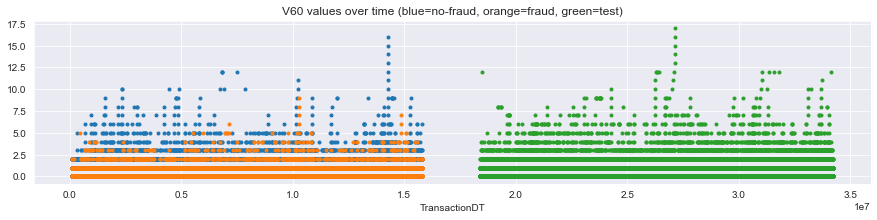

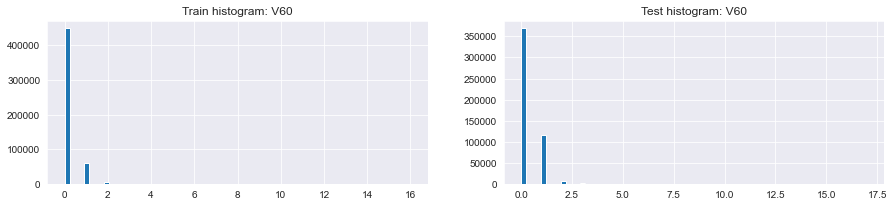

,V60,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.143,0.493,0.131,0.280,0.135,0.314
2,std,0.418,0.688,0.401,0.540,0.439,0.555
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,16.000,9.000,16.000,17.000,12.000,17.000
8,unique values,18.000,11.000,18.000,19.000,11.000,19.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V60,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,448369,0.021,9495,368830
1,-999.000,77096,0.058,4509,12899
2,1.000,59589,0.095,5683,115570
3,2.000,4065,0.188,764,7218
4,3.000,854,0.159,136,1291
5,4.000,296,0.176,52,432
6,5.000,137,0.124,17,197
7,6.000,52,0.058,3,122
8,7.000,24,0.083,2,51
9,9.000,21,0.048,1,27


,V60,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,448369,0.021,9495,368830
1,1.000,59589,0.095,5683,115570
2,-999.000,77096,0.058,4509,12899
3,2.000,4065,0.188,764,7218
4,3.000,854,0.159,136,1291
5,4.000,296,0.176,52,432
6,5.000,137,0.124,17,197
7,6.000,52,0.058,3,122
8,7.000,24,0.083,2,51
9,8.000,17,0.059,1,26


,Column,Correlation with V60
0,V60,1.000
1,V59,0.953
2,V302,0.915
3,V304,0.907
4,V64,0.902
5,V63,0.892
362,V13,-0.378
363,V35,-0.384
364,V53,-0.385
365,V36,-0.393


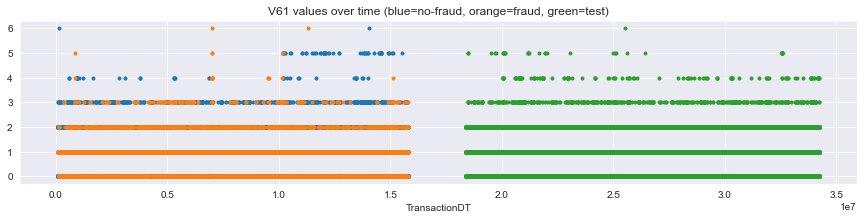

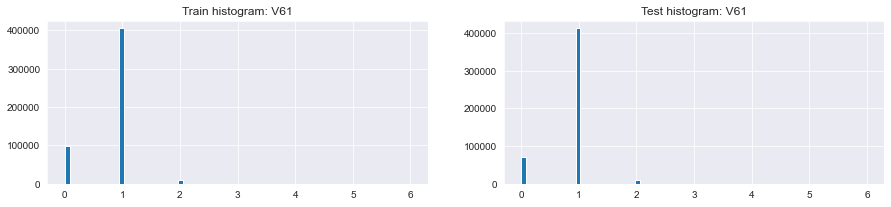

,V61,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.830,0.949,0.826,0.880,0.856,0.886
2,std,0.437,0.503,0.434,0.397,0.428,0.390
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,6.000,6.000,6.000,6.000,5.000,6.000
8,unique values,8.000,8.000,8.000,8.000,7.000,8.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V61,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,404182,0.031,12646,412011
1,0.000,98827,0.023,2254,70995
2,-999.000,77096,0.058,4509,12899
3,2.000,9620,0.114,1095,10041
4,3.000,702,0.202,142,583
5,5.000,60,0.067,4,35
6,4.000,49,0.224,11,126
7,6.000,4,0.500,2,1


,V61,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,404182,0.031,12646,412011
1,-999.000,77096,0.058,4509,12899
2,0.000,98827,0.023,2254,70995
3,2.000,9620,0.114,1095,10041
4,3.000,702,0.202,142,583
5,4.000,49,0.224,11,126
6,5.000,60,0.067,4,35
7,6.000,4,0.500,2,1


,Column,Correlation with V61
0,V61,1.000
1,V62,0.890
2,V82,0.698
3,V19,0.682
4,V20,0.632
5,V83,0.629
375,V328,-0.486
376,V329,-0.486
377,V330,-0.500
378,V327,-0.547


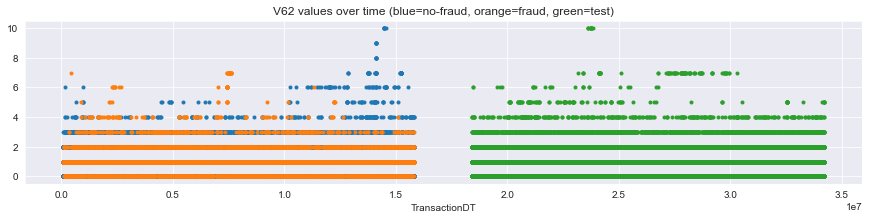

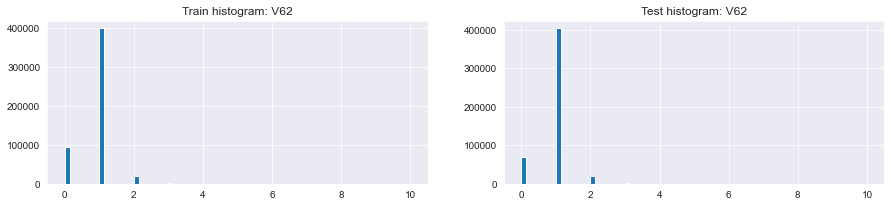

,V62,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.868,1.062,0.861,0.913,0.893,0.918
2,std,0.484,0.685,0.474,0.453,0.478,0.447
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,10.000,7.000,10.000,10.000,6.000,10.000
8,unique values,12.000,9.000,12.000,10.000,8.000,10.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V62,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,398513,0.030,11944,"403,691.000"
1,0.000,93177,0.022,2023,"68,371.000"
2,-999.000,77096,0.058,4509,"12,899.000"
3,2.000,19368,0.084,1621,"19,204.000"
4,3.000,1860,0.223,414,"1,918.000"
5,4.000,287,0.324,93,378.000
6,6.000,82,0.256,21,24.000
7,5.000,78,0.244,19,110.000
8,7.000,63,0.302,19,85.000
9,10.000,6,0.000,0,11.000


,V62,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,398513,0.030,11944,403691
1,-999.000,77096,0.058,4509,12899
2,0.000,93177,0.022,2023,68371
3,2.000,19368,0.084,1621,19204
4,3.000,1860,0.223,414,1918
5,4.000,287,0.324,93,378
6,6.000,82,0.256,21,24
7,5.000,78,0.244,19,110
8,7.000,63,0.302,19,85
9,10.000,6,0.000,0,11


,Column,Correlation with V62
0,V62,1.000
1,V61,0.890
2,V83,0.684
3,V20,0.634
4,V82,0.630
5,V19,0.616
375,V328,-0.481
376,V329,-0.481
377,V330,-0.495
378,V327,-0.539


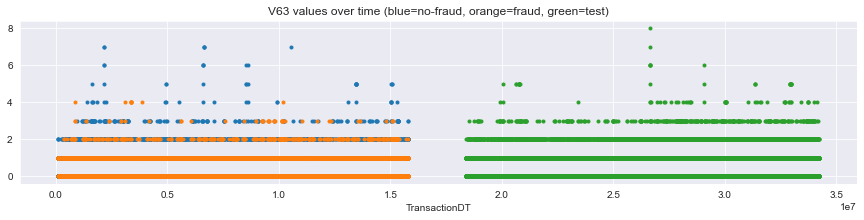

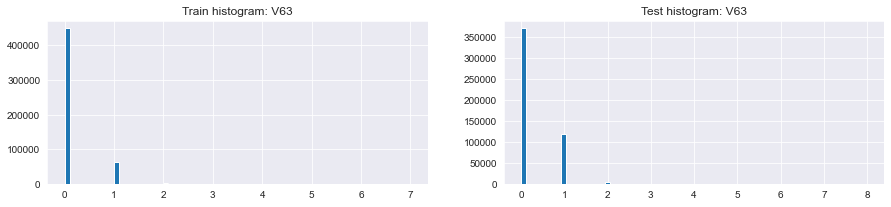

,V63,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.131,0.433,0.121,0.257,0.117,0.289
2,std,0.355,0.558,0.342,0.461,0.345,0.478
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,1.000
7,max,7.000,4.000,7.000,8.000,5.000,8.000
8,unique values,9.000,6.000,9.000,10.000,7.000,10.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V63,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,448961,0.021,9619,371489
1,-999.000,77096,0.058,4509,12899
2,1.000,62231,0.099,6136,118419
3,2.000,1969,0.176,347,3388
4,3.000,221,0.195,43,415
5,4.000,32,0.281,9,49
6,5.000,17,0.000,0,25
7,6.000,7,0.000,0,5
8,7.000,6,0.000,0,1


,V63,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,448961,0.021,9619,371489
1,1.000,62231,0.099,6136,118419
2,-999.000,77096,0.058,4509,12899
3,2.000,1969,0.176,347,3388
4,3.000,221,0.195,43,415
5,4.000,32,0.281,9,49
6,5.000,17,0.000,0,25
7,6.000,7,0.000,0,5
8,7.000,6,0.000,0,1


,Column,Correlation with V63
0,V63,1.000
1,V84,0.955
2,V42,0.953
3,V21,0.947
4,V64,0.944
5,V59,0.935
362,V13,-0.409
363,V53,-0.416
364,V35,-0.418
365,V54,-0.427


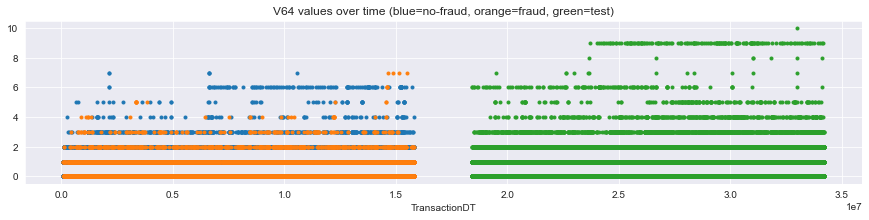

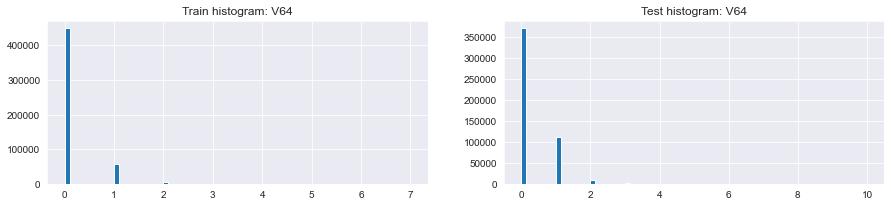

,V64,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.142,0.481,0.131,0.280,0.132,0.314
2,std,0.406,0.664,0.390,0.554,0.417,0.576
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,1.000
7,max,7.000,7.000,7.000,10.000,7.000,10.000
8,unique values,9.000,9.000,9.000,12.000,9.000,12.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V64,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,448662,0.021,9557,371179
1,-999.000,77096,0.058,4509,12899
2,1.000,58547,0.097,5690,112063
3,2.000,5145,0.139,717,8094
4,3.000,757,0.196,148,1467
5,6.000,144,0.028,4,149
6,4.000,118,0.212,25,460
7,5.000,61,0.148,9,187
8,7.000,10,0.400,4,12


,V64,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,448662,0.021,9557,371179
1,1.000,58547,0.097,5690,112063
2,-999.000,77096,0.058,4509,12899
3,2.000,5145,0.139,717,8094
4,3.000,757,0.196,148,1467
5,4.000,118,0.212,25,460
6,5.000,61,0.148,9,187
7,6.000,144,0.028,4,149
8,7.000,10,0.400,4,12


,Column,Correlation with V64
0,V64,1.000
1,V63,0.944
2,V43,0.920
3,V85,0.916
4,V42,0.912
5,V84,0.903
362,V13,-0.387
363,V53,-0.394
364,V35,-0.400
365,V54,-0.405


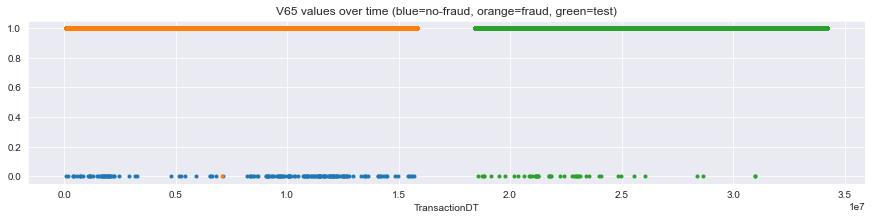

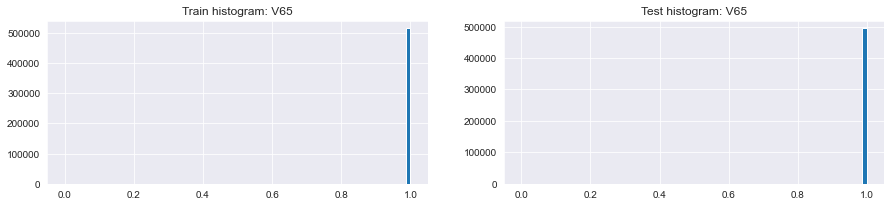

,V65,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,1.000,1.000,1.000,1.000,1.000,1.000
2,std,0.018,0.008,0.019,0.010,0.016,0.008
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,1.000,1.000,1.000,1.000,1.000,1.000
8,unique values,3.000,3.000,3.000,3.000,3.000,3.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V65,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,513271,0.031,16153,493746
1,-999.000,77096,0.058,4509,12899
2,0.000,173,0.006,1,46


,V65,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,513271,0.031,16153,493746
1,-999.000,77096,0.058,4509,12899
2,0.000,173,0.006,1,46


,Column,Correlation with V65
0,V65,1.000
1,V41,0.891
2,V14,0.844
3,V88,0.795
4,V326,0.102
5,V46,0.101
361,V155,-0.069
362,V148,-0.069
363,V154,-0.069
364,V153,-0.069


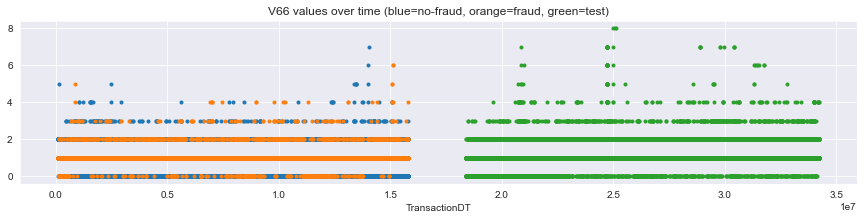

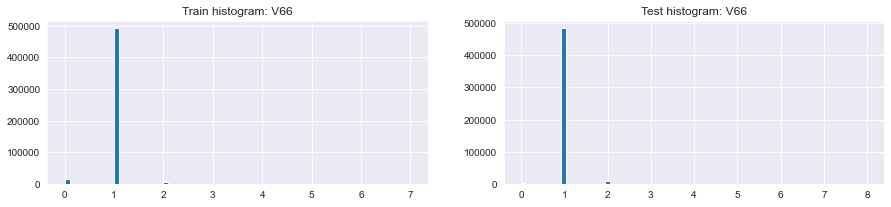

,V66,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.981,1.026,0.980,1.015,1.007,1.017
2,std,0.216,0.364,0.210,0.171,0.182,0.168
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,7.000,6.000,7.000,8.000,7.000,8.000
8,unique values,9.000,8.000,9.000,10.000,9.000,10.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V66,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,490779,0.030,14509,483557
1,-999.000,77096,0.058,4509,12899
2,0.000,16418,0.041,681,1828
3,2.000,5897,0.145,856,7692
4,3.000,285,0.291,83,523
5,4.000,50,0.400,20,124
6,5.000,11,0.273,3,25
7,6.000,3,0.667,2,19
8,7.000,1,0.000,0,21


,V66,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,490779,0.030,14509,483557
1,-999.000,77096,0.058,4509,12899
2,2.000,5897,0.145,856,7692
3,0.000,16418,0.041,681,1828
4,3.000,285,0.291,83,523
5,4.000,50,0.400,20,124
6,5.000,11,0.273,3,25
7,6.000,3,0.667,2,19
8,7.000,1,0.000,0,21


,Column,Correlation with V66
0,V66,1.000
1,V67,0.828
2,V25,0.556
3,V26,0.470
4,V61,0.363
5,V62,0.310
375,V90,-0.050
376,V49,-0.052
377,V48,-0.052
378,D8,-0.065


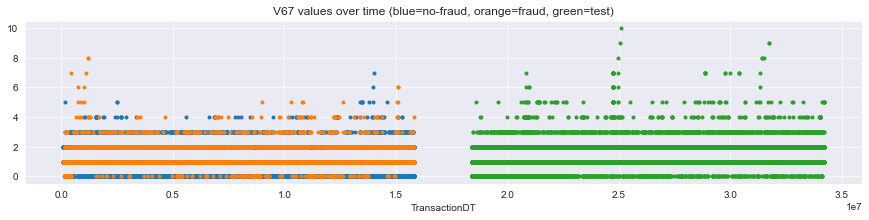

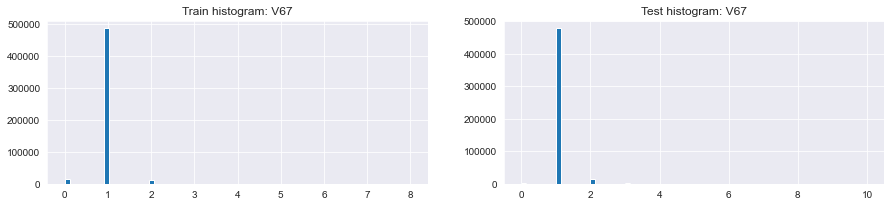

,V67,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.998,1.102,0.995,1.032,1.025,1.033
2,std,0.246,0.485,0.233,0.220,0.232,0.218
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,8.000,8.000,7.000,10.000,7.000,10.000
8,unique values,10.000,10.000,9.000,12.000,9.000,12.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V67,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,486457,0.028,13728,476992
1,-999.000,77096,0.058,4509,12899
2,0.000,14565,0.041,594,1567
3,2.000,11435,0.133,1521,13732
4,3.000,844,0.288,243,1215
5,4.000,112,0.446,50,166
6,5.000,21,0.476,10,76
7,6.000,5,0.800,4,14
8,7.000,3,0.667,2,22
9,8.000,2,1.000,2,4


,V67,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,486457,0.028,13728,476992
1,-999.000,77096,0.058,4509,12899
2,2.000,11435,0.133,1521,13732
3,0.000,14565,0.041,594,1567
4,3.000,844,0.288,243,1215
5,4.000,112,0.446,50,166
6,5.000,21,0.476,10,76
7,6.000,5,0.800,4,14
8,7.000,3,0.667,2,22
9,8.000,2,1.000,2,4


,Column,Correlation with V67
0,V67,1.000
1,V66,0.828
2,V26,0.478
3,V25,0.467
4,V62,0.348
5,V61,0.306
375,V49,-0.075
376,D8,-0.076
377,V90,-0.079
378,V48,-0.079


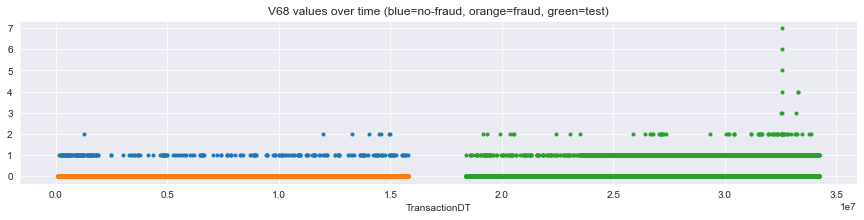

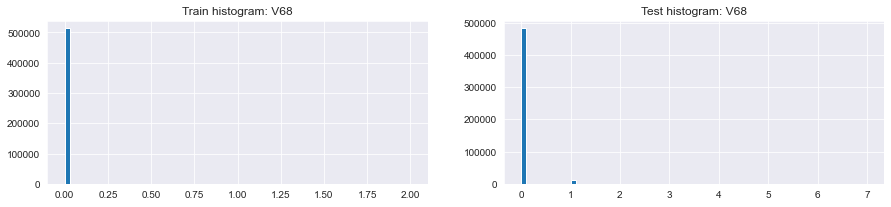

,V68,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.001,0.000,0.001,0.023,0.001,0.028
2,std,0.024,0.000,0.024,0.152,0.033,0.168
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,0.000,0.000,0.000,0.000,0.000
7,max,2.000,0.000,2.000,7.000,2.000,7.000
8,unique values,4.000,2.000,4.000,9.000,4.000,9.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V68,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,513178,0.031,16154,482453
1,-999.000,77096,0.058,4509,12899
2,1.000,258,0.000,0,11258
3,2.000,8,0.000,0,72


,V68,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,513178,0.031,16154,482453
1,-999.000,77096,0.058,4509,12899
2,1.000,258,0.000,0,11258
3,2.000,8,0.000,0,72


,Column,Correlation with V68
0,V68,1.000
1,V28,0.915
2,V89,0.913
3,V27,0.889
4,C3,0.555
5,V267,0.183
361,V329,-0.096
362,V328,-0.097
363,V330,-0.099
364,V327,-0.117


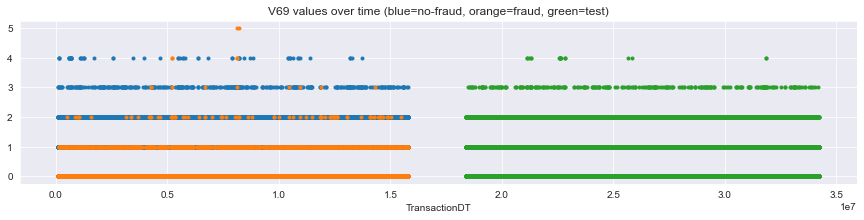

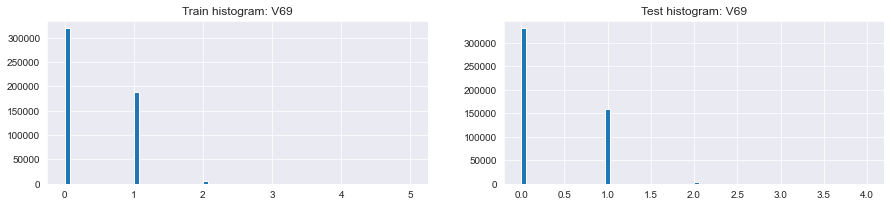

,V69,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.390,0.092,0.400,0.339,0.407,0.324
2,std,0.514,0.321,0.516,0.495,0.515,0.488
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,5.000,5.000,4.000,4.000,4.000,4.000
8,unique values,7.000,7.000,6.000,6.000,6.000,6.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V69,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,319136,0.046,14786,"330,879.000"
1,1.000,188826,0.007,1268,"158,570.000"
2,-999.000,77096,0.058,4509,"12,899.000"
3,2.000,4989,0.017,85,"4,031.000"
4,3.000,432,0.021,9,294.000
5,4.000,59,0.068,4,18.000
6,5.000,2,1.000,2,nan


,V69,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,319136,0.046,14786,"330,879.000"
1,-999.000,77096,0.058,4509,"12,899.000"
2,1.000,188826,0.007,1268,"158,570.000"
3,2.000,4989,0.017,85,"4,031.000"
4,3.000,432,0.021,9,294.000
5,4.000,59,0.068,4,18.000
6,5.000,2,1.000,2,nan


,Column,Correlation with V69
0,V69,1.000
1,V70,0.962
2,V90,0.925
3,V29,0.915
4,V48,0.912
5,V91,0.891
208,V92,-0.297
209,V94,-0.306
210,V52,-0.310
211,V51,-0.313


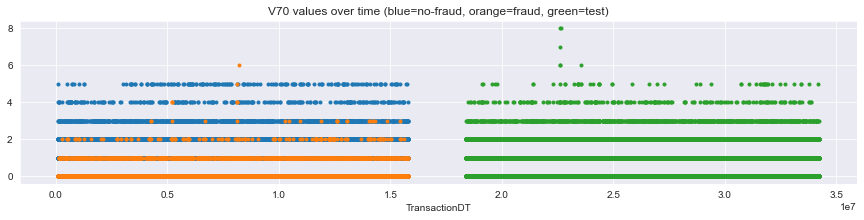

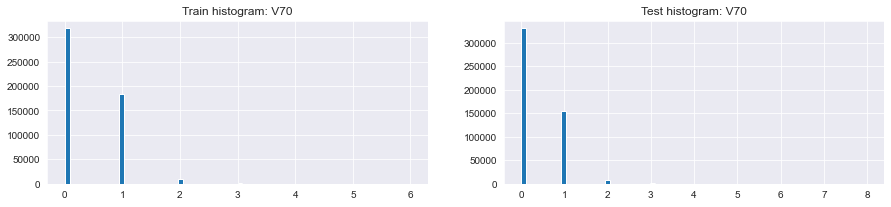

,V70,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.408,0.097,0.418,0.354,0.424,0.337
2,std,0.554,0.345,0.557,0.531,0.549,0.525
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,6.000,6.000,5.000,8.000,5.000,8.000
8,unique values,8.000,8.000,7.000,10.000,7.000,10.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V70,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,317801,0.047,14780,330132
1,1.000,184177,0.007,1208,154228
2,-999.000,77096,0.058,4509,12899
3,2.000,9739,0.014,140,8172
4,3.000,1296,0.015,20,982
5,4.000,253,0.016,4,216
6,5.000,177,0.006,1,56
7,6.000,1,1.000,1,3


,V70,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,317801,0.047,14780,330132
1,-999.000,77096,0.058,4509,12899
2,1.000,184177,0.007,1208,154228
3,2.000,9739,0.014,140,8172
4,3.000,1296,0.015,20,982
5,4.000,253,0.016,4,216
6,5.000,177,0.006,1,56
7,6.000,1,1.000,1,3


,Column,Correlation with V70
0,V70,1.000
1,V69,0.962
2,V91,0.908
3,V90,0.897
4,V30,0.895
5,V49,0.891
208,V92,-0.288
209,V94,-0.296
210,V52,-0.301
211,V51,-0.304


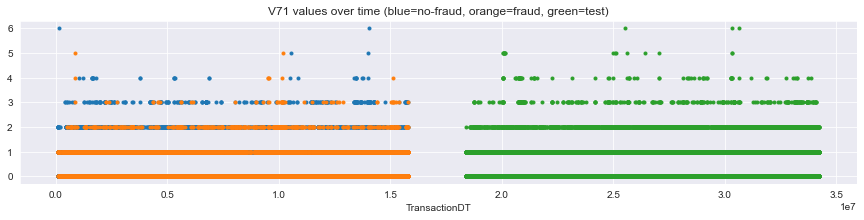

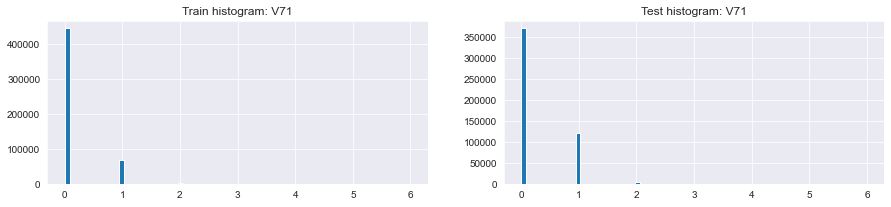

,V71,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.141,0.458,0.130,0.259,0.122,0.291
2,std,0.364,0.575,0.351,0.460,0.355,0.475
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,6.000,5.000,6.000,6.000,5.000,6.000
8,unique values,8.000,7.000,8.000,8.000,7.000,8.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V71,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,443821,0.021,9349,370174
1,-999.000,77096,0.058,4509,12899
2,1.000,67435,0.093,6286,120022
3,2.000,1837,0.250,460,3161
4,3.000,311,0.164,51,342
5,4.000,34,0.176,6,75
6,5.000,4,0.500,2,15
7,6.000,2,0.000,0,3


,V71,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,443821,0.021,9349,370174
1,1.000,67435,0.093,6286,120022
2,-999.000,77096,0.058,4509,12899
3,2.000,1837,0.250,460,3161
4,3.000,311,0.164,51,342
5,4.000,34,0.176,6,75
6,5.000,4,0.500,2,15
7,6.000,2,0.000,0,3


,Column,Correlation with V71
0,V71,1.000
1,V50,0.964
2,V72,0.964
3,V92,0.961
4,V31,0.959
5,V57,0.943
362,V160,-0.473
363,V150,-0.473
364,addr2,-0.499
365,V151,-0.505


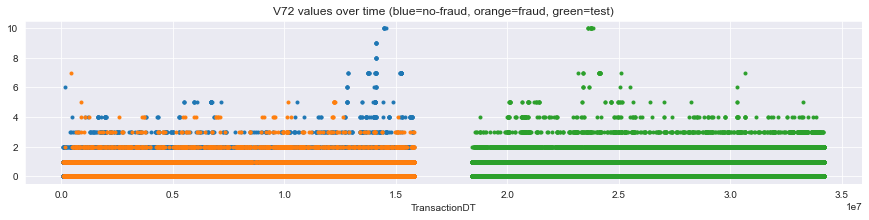

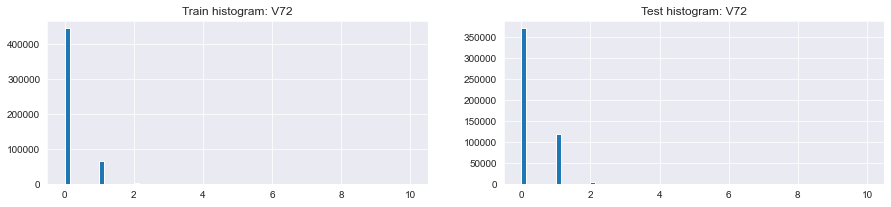

,V72,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.145,0.493,0.134,0.265,0.127,0.297
2,std,0.389,0.650,0.372,0.482,0.379,0.497
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,10.000,7.000,10.000,10.000,5.000,10.000
8,unique values,12.000,8.000,12.000,10.000,7.000,10.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V72,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,443611,0.021,9320,"370,131.000"
1,-999.000,77096,0.058,4509,"12,899.000"
2,1.000,66364,0.089,5913,"117,888.000"
3,2.000,2802,0.273,765,"4,879.000"
4,3.000,413,0.288,119,676.000
5,4.000,129,0.217,28,134.000
6,5.000,54,0.148,8,46.000
7,7.000,45,0.022,1,19.000
8,6.000,10,0.000,0,8.000
9,10.000,6,0.000,0,11.000


,V72,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,443611,0.021,9320,370131
1,1.000,66364,0.089,5913,117888
2,-999.000,77096,0.058,4509,12899
3,2.000,2802,0.273,765,4879
4,3.000,413,0.288,119,676
5,4.000,129,0.217,28,134
6,5.000,54,0.148,8,46
7,7.000,45,0.022,1,19
8,6.000,10,0.000,0,8
9,10.000,6,0.000,0,11


,Column,Correlation with V72
0,V72,1.000
1,V71,0.964
2,V93,0.946
3,V58,0.944
4,V50,0.932
5,V92,0.931
362,V35,-0.429
363,V54,-0.432
364,V36,-0.438
365,V152,-0.454


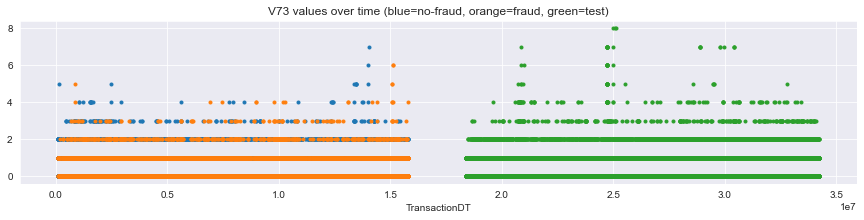

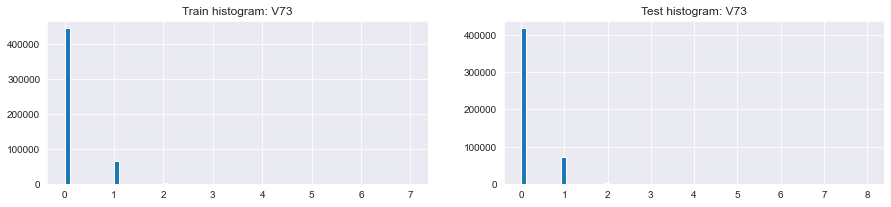

,V73,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.140,0.494,0.128,0.162,0.127,0.171
2,std,0.367,0.605,0.351,0.397,0.360,0.405
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,7.000,6.000,7.000,8.000,7.000,8.000
8,unique values,9.000,8.000,9.000,10.000,9.000,10.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V73,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,444786,0.020,8951,417899
1,-999.000,77096,0.058,4509,12899
2,1.000,65814,0.100,6549,72433
3,2.000,2551,0.218,557,2991
4,3.000,235,0.323,76,312
5,4.000,43,0.372,16,98
6,5.000,11,0.273,3,23
7,6.000,3,0.667,2,12
8,7.000,1,0.000,0,21


,V73,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,444786,0.020,8951,417899
1,1.000,65814,0.100,6549,72433
2,-999.000,77096,0.058,4509,12899
3,2.000,2551,0.218,557,2991
4,3.000,235,0.323,76,312
5,4.000,43,0.372,16,98
6,5.000,11,0.273,3,23
7,6.000,3,0.667,2,12
8,7.000,1,0.000,0,21


,Column,Correlation with V73
0,V73,1.000
1,V74,0.955
2,V94,0.946
3,V57,0.941
4,V51,0.936
5,V33,0.936
328,V13,-0.378
329,V54,-0.384
330,V35,-0.402
331,V36,-0.411


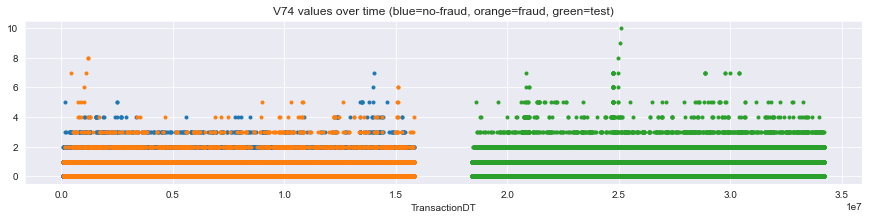

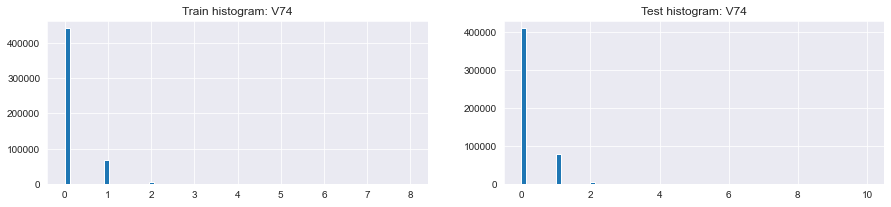

,V74,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"513,444.000","16,154.000","497,290.000","493,792.000","93,474.000","400,319.000"
1,mean,0.152,0.558,0.139,0.186,0.150,0.195
2,std,0.393,0.699,0.372,0.435,0.402,0.442
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,8.000,8.000,7.000,10.000,7.000,10.000
8,unique values,10.000,10.000,9.000,12.000,9.000,12.000
9,NaNs,"77,096.000","4,509.000","72,587.000","12,899.000","7,865.000","5,034.000"


,V74,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,440878,0.020,8618,409188
1,-999.000,77096,0.058,4509,12899
2,1.000,67816,0.094,6400,78706
3,2.000,4109,0.215,885,4955
4,3.000,525,0.368,193,693
5,4.000,86,0.477,41,145
6,5.000,21,0.476,10,68
7,6.000,4,0.750,3,13
8,7.000,3,0.667,2,21
9,8.000,2,1.000,2,1


,V74,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,440878,0.020,8618,409188
1,1.000,67816,0.094,6400,78706
2,-999.000,77096,0.058,4509,12899
3,2.000,4109,0.215,885,4955
4,3.000,525,0.368,193,693
5,4.000,86,0.477,41,145
6,5.000,21,0.476,10,68
7,6.000,4,0.750,3,13
8,7.000,3,0.667,2,21
9,8.000,2,1.000,2,1


,Column,Correlation with V74
0,V74,1.000
1,V73,0.955
2,V94,0.910
3,V51,0.906
4,V33,0.900
5,V57,0.900
328,V54,-0.353
329,V53,-0.354
330,V35,-0.385
331,V36,-0.388


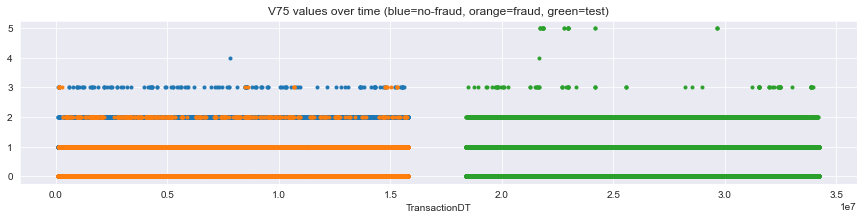

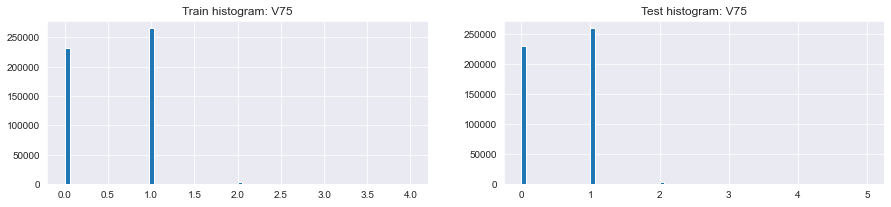

,V75,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.544,0.398,0.549,0.539,0.628,0.518
2,std,0.514,0.546,0.512,0.513,0.500,0.514
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,4.000,3.000,4.000,5.000,5.000,5.000
8,unique values,6.000,5.000,6.000,7.000,7.000,6.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V75,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,265082,0.021,5630,259969
1,0.000,232467,0.044,10318,231432
2,-999.000,89164,0.048,4276,12081
3,2.000,3676,0.114,420,3106
4,3.000,150,0.127,19,80
5,4.000,1,0.000,0,1


,V75,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,232467,0.044,10318,231432
1,1.000,265082,0.021,5630,259969
2,-999.000,89164,0.048,4276,12081
3,2.000,3676,0.114,420,3106
4,3.000,150,0.127,19,80
5,4.000,1,0.000,0,1


,Column,Correlation with V75
0,V75,1.000
1,V76,0.918
2,V35,0.744
3,V12,0.709
4,V36,0.703
5,V13,0.670
208,V71,-0.412
209,V42,-0.419
210,V31,-0.421
211,V92,-0.423


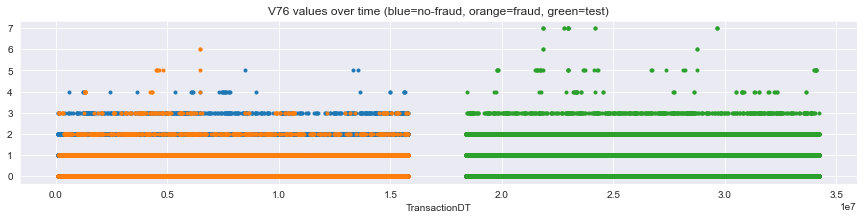

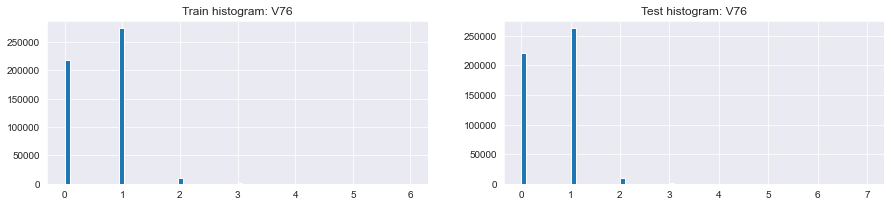

,V76,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.588,0.452,0.592,0.574,0.670,0.551
2,std,0.538,0.624,0.534,0.543,0.527,0.544
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,1.000,0.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,6.000,6.000,5.000,7.000,5.000,7.000
8,unique values,8.000,8.000,7.000,9.000,7.000,9.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V76,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,273293,0.021,5702,262516
1,0.000,217817,0.046,9926,221908
2,-999.000,89164,0.048,4276,12081
3,2.000,9571,0.063,607,9466
4,3.000,641,0.207,133,617
5,4.000,43,0.256,11,45
6,5.000,9,0.667,6,38
7,6.000,2,1.000,2,4


,V76,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,217817,0.046,9926,221908
1,1.000,273293,0.021,5702,262516
2,-999.000,89164,0.048,4276,12081
3,2.000,9571,0.063,607,9466
4,3.000,641,0.207,133,617
5,4.000,43,0.256,11,45
6,5.000,9,0.667,6,38
7,6.000,2,1.000,2,4


,Column,Correlation with V76
0,V76,1.000
1,V75,0.918
2,V36,0.747
3,V13,0.720
4,V35,0.705
5,V12,0.672
208,V71,-0.425
209,V42,-0.431
210,V31,-0.434
211,V92,-0.437


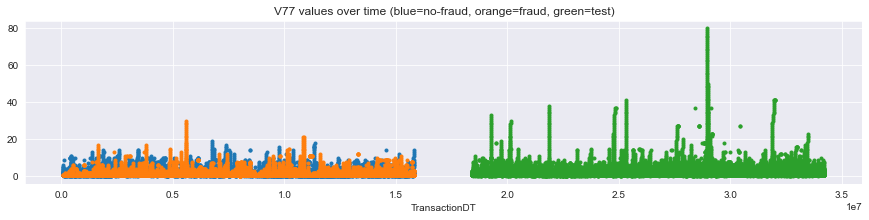

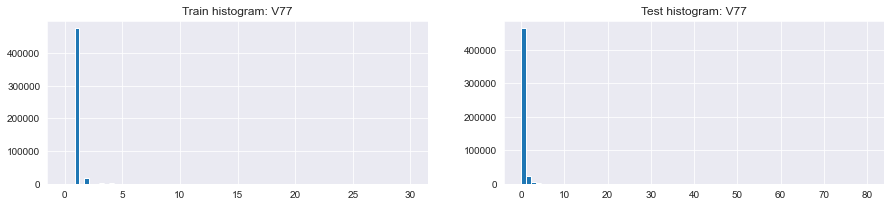

,V77,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,1.087,1.546,1.071,1.124,1.106,1.128
2,std,0.533,1.677,0.437,1.021,0.718,1.080
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,30.000,30.000,19.000,80.000,33.000,80.000
8,unique values,32.000,32.000,21.000,82.000,35.000,82.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V77,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,474434,0.027,12962,463392
1,-999.000,89164,0.048,4276,12081
2,2.000,18955,0.090,1699,22014
3,3.000,3695,0.170,627,4221
4,4.000,1623,0.244,396,1914
5,5.000,742,0.248,184,855
6,0.000,571,0.019,11,205
7,6.000,415,0.304,126,584
8,7.000,297,0.370,110,314
9,8.000,183,0.333,61,242


,V77,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,474434,0.027,12962,463392
1,-999.000,89164,0.048,4276,12081
2,2.000,18955,0.090,1699,22014
3,3.000,3695,0.170,627,4221
4,4.000,1623,0.244,396,1914
5,5.000,742,0.248,184,855
6,6.000,415,0.304,126,584
7,7.000,297,0.370,110,314
8,9.000,157,0.420,66,137
9,8.000,183,0.333,61,242


,Column,Correlation with V77
0,V77,1.000
1,V78,0.753
2,V37,0.689
3,V38,0.636
4,V228,0.615
5,V86,0.590
375,V36,-0.115
376,V12,-0.115
377,V13,-0.119
378,D8,-0.129


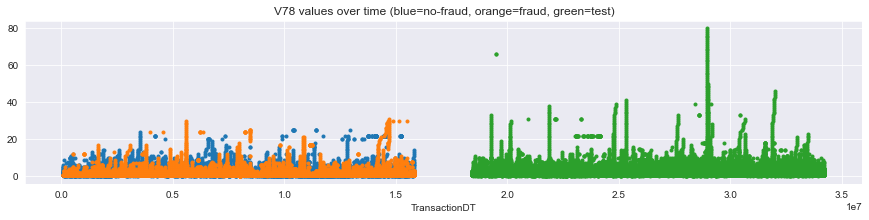

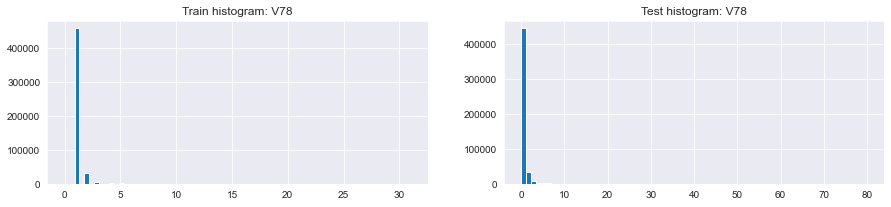

,V78,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,1.144,1.784,1.123,1.191,1.165,1.198
2,std,0.781,2.366,0.654,1.167,0.864,1.228
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,2.000,1.000,1.000,1.000,1.000
7,max,31.000,31.000,25.000,80.000,66.000,80.000
8,unique values,33.000,33.000,27.000,82.000,36.000,82.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V78,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,457915,0.026,11972,445500
1,-999.000,89164,0.048,4276,12081
2,2.000,31364,0.068,2139,34375
3,3.000,6135,0.143,880,7032
4,4.000,2261,0.204,462,2938
5,5.000,1125,0.233,262,1431
6,6.000,609,0.271,165,886
7,0.000,571,0.019,11,202
8,7.000,353,0.303,107,463
9,8.000,211,0.327,69,402


,V78,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,457915,0.026,11972,445500
1,-999.000,89164,0.048,4276,12081
2,2.000,31364,0.068,2139,34375
3,3.000,6135,0.143,880,7032
4,4.000,2261,0.204,462,2938
5,5.000,1125,0.233,262,1431
6,6.000,609,0.271,165,886
7,7.000,353,0.303,107,463
8,8.000,211,0.327,69,402
9,9.000,157,0.312,49,298


,Column,Correlation with V78
0,V78,1.000
1,V77,0.753
2,V38,0.633
3,V56,0.587
4,V37,0.537
5,V87,0.536
375,V13,-0.105
376,V53,-0.106
377,D8,-0.129
378,D2,-0.129


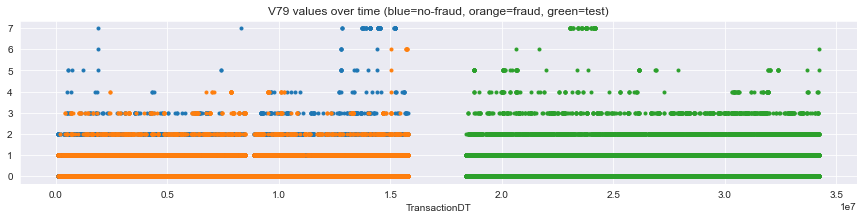

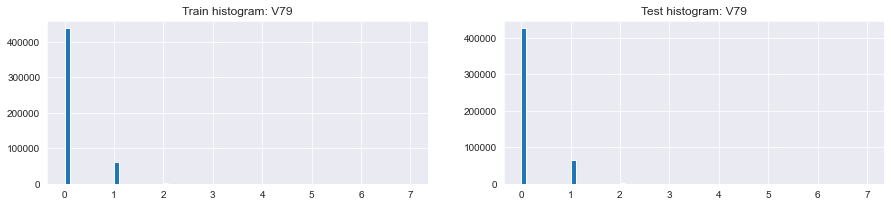

,V79,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.137,0.538,0.123,0.151,0.115,0.159
2,std,0.380,0.667,0.359,0.399,0.367,0.406
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,7.000,6.000,7.000,7.000,6.000,7.000
8,unique values,9.000,8.000,9.000,9.000,8.000,9.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V79,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,436802,0.020,8801,425386
1,-999.000,89164,0.048,4276,12081
2,1.000,61751,0.108,6653,65288
3,2.000,2179,0.317,690,3020
4,3.000,435,0.464,202,662
5,7.000,109,0.000,0,64
6,4.000,68,0.485,33,118
7,5.000,19,0.053,1,69
8,6.000,13,0.538,7,3


,V79,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,436802,0.020,8801,425386
1,1.000,61751,0.108,6653,65288
2,-999.000,89164,0.048,4276,12081
3,2.000,2179,0.317,690,3020
4,3.000,435,0.464,202,662
5,4.000,68,0.485,33,118
6,6.000,13,0.538,7,3
7,5.000,19,0.053,1,69
8,7.000,109,0.000,0,64


,Column,Correlation with V79
0,V79,1.000
1,V58,0.948
2,V15,0.928
3,V57,0.926
4,V93,0.924
5,V16,0.909
315,V53,-0.415
316,V35,-0.419
317,V54,-0.427
318,V36,-0.428


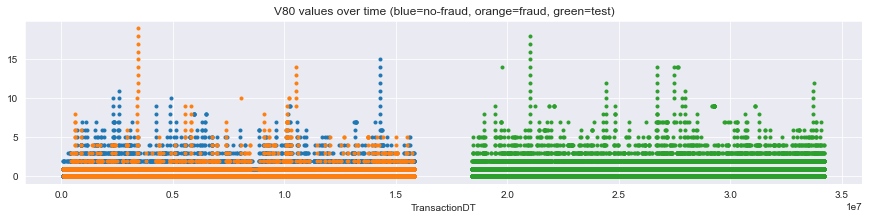

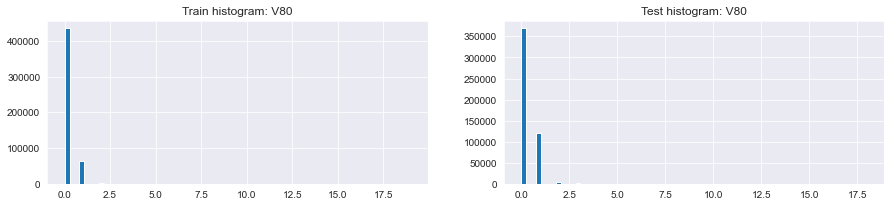

,V80,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.144,0.546,0.130,0.270,0.131,0.303
2,std,0.410,0.866,0.378,0.509,0.427,0.521
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,19.000,19.000,15.000,18.000,18.000,14.000
8,unique values,21.000,21.000,17.000,20.000,20.000,16.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V80,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,434732,0.021,9021,"368,894.000"
1,-999.000,89164,0.048,4276,"12,081.000"
2,1.000,63368,0.104,6584,"120,578.000"
3,2.000,2283,0.216,492,"3,797.000"
4,3.000,475,0.236,112,731.000
5,4.000,245,0.322,79,281.000
6,5.000,112,0.330,37,116.000
7,6.000,52,0.308,16,69.000
8,7.000,48,0.354,17,58.000
9,8.000,20,0.300,6,18.000


,V80,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,434732,0.021,9021,368894
1,1.000,63368,0.104,6584,120578
2,-999.000,89164,0.048,4276,12081
3,2.000,2283,0.216,492,3797
4,3.000,475,0.236,112,731
5,4.000,245,0.322,79,281
6,5.000,112,0.330,37,116
7,7.000,48,0.354,17,58
8,6.000,52,0.308,16,69
9,8.000,20,0.300,6,18


,Column,Correlation with V80
0,V80,1.000
1,V81,0.953
2,V17,0.903
3,V39,0.902
4,V59,0.902
5,V84,0.896
362,V53,-0.388
363,V13,-0.390
364,V35,-0.391
365,V54,-0.399


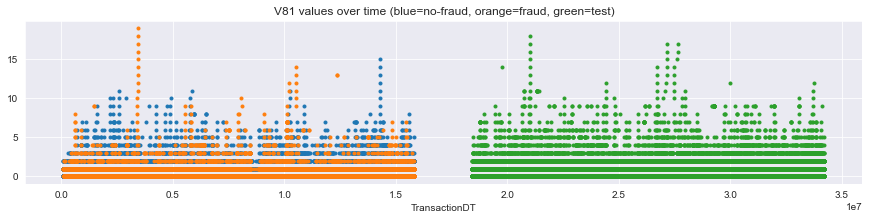

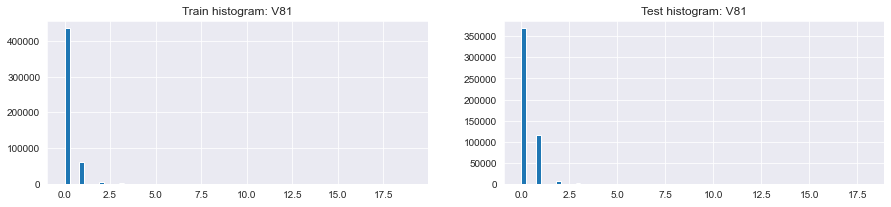

,V81,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.153,0.601,0.138,0.285,0.144,0.319
2,std,0.452,0.976,0.415,0.569,0.504,0.578
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,19.000,19.000,15.000,18.000,18.000,17.000
8,unique values,21.000,21.000,17.000,20.000,20.000,19.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V81,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,434653,0.021,8998,"368,726.000"
1,-999.000,89164,0.048,4276,"12,081.000"
2,1.000,60829,0.101,6120,"116,427.000"
3,2.000,4033,0.190,766,"6,846.000"
4,3.000,902,0.268,242,"1,313.000"
5,4.000,509,0.246,125,600.000
6,5.000,191,0.225,43,270.000
7,6.000,106,0.340,36,145.000
8,7.000,68,0.309,21,98.000
9,8.000,29,0.276,8,48.000


,V81,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,434653,0.021,8998,368726
1,1.000,60829,0.101,6120,116427
2,-999.000,89164,0.048,4276,12081
3,2.000,4033,0.190,766,6846
4,3.000,902,0.268,242,1313
5,4.000,509,0.246,125,600
6,5.000,191,0.225,43,270
7,6.000,106,0.340,36,145
8,7.000,68,0.309,21,98
9,9.000,20,0.400,8,79


,Column,Correlation with V81
0,V81,1.000
1,V80,0.953
2,V60,0.879
3,V40,0.876
4,V85,0.875
5,V17,0.873
362,V53,-0.374
363,V13,-0.375
364,V35,-0.376
365,V54,-0.384


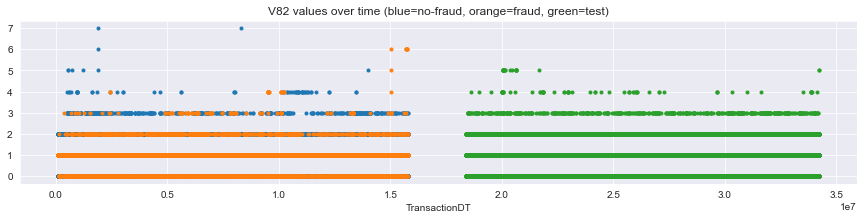

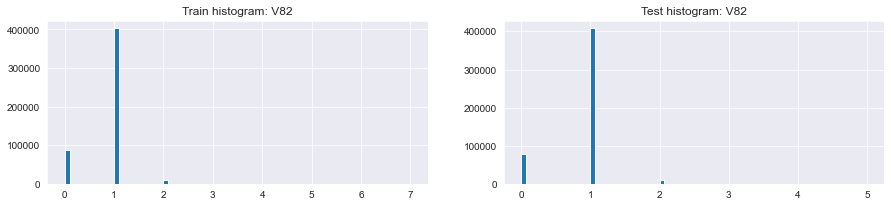

,V82,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.845,0.962,0.841,0.864,0.841,0.870
2,std,0.423,0.491,0.419,0.403,0.432,0.396
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,7.000,6.000,7.000,5.000,5.000,5.000
8,unique values,9.000,8.000,9.000,7.000,7.000,7.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V82,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,402612,0.033,13180,"407,790.000"
1,-999.000,89164,0.048,4276,"12,081.000"
2,0.000,88757,0.023,2020,"77,355.000"
3,2.000,9288,0.109,1017,"8,745.000"
4,3.000,626,0.228,143,629.000
5,4.000,76,0.250,19,67.000
6,6.000,8,0.875,7,nan
7,5.000,7,0.143,1,24.000
8,7.000,2,0.000,0,nan


,V82,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,402612,0.033,13180,"407,790.000"
1,-999.000,89164,0.048,4276,"12,081.000"
2,0.000,88757,0.023,2020,"77,355.000"
3,2.000,9288,0.109,1017,"8,745.000"
4,3.000,626,0.228,143,629.000
5,4.000,76,0.250,19,67.000
6,6.000,8,0.875,7,nan
7,5.000,7,0.143,1,24.000
8,7.000,2,0.000,0,nan


,Column,Correlation with V82
0,V82,1.000
1,V83,0.882
2,V19,0.722
3,V61,0.698
4,V4,0.684
5,V20,0.661
375,V329,-0.177
376,V224,-0.185
377,D6,-0.227
378,V327,-0.381


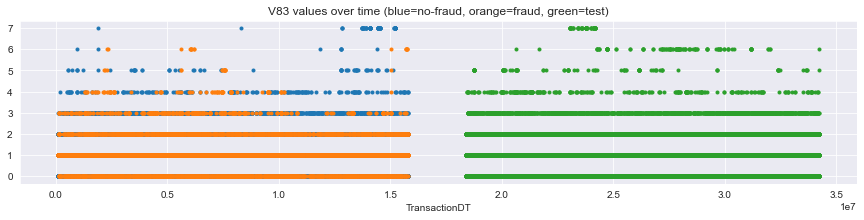

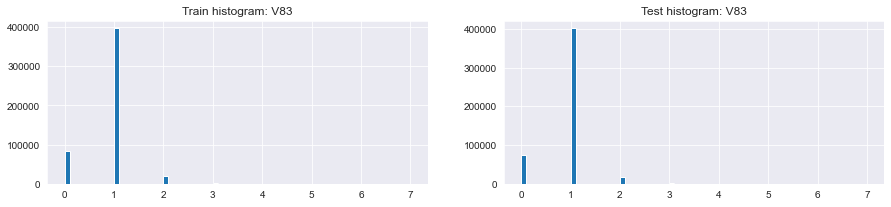

,V83,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.882,1.059,0.876,0.897,0.876,0.901
2,std,0.471,0.621,0.464,0.455,0.477,0.449
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,7.000,6.000,7.000,7.000,6.000,7.000
8,unique values,9.000,8.000,9.000,9.000,8.000,9.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V83,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,396619,0.032,12635,400827
1,-999.000,89164,0.048,4276,12081
2,0.000,83605,0.021,1749,74121
3,2.000,18834,0.078,1465,17393
4,3.000,1816,0.227,412,1709
5,4.000,292,0.318,93,286
6,7.000,109,0.000,0,64
7,5.000,76,0.211,16,97
8,6.000,25,0.680,17,113


,V83,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,396619,0.032,12635,400827
1,-999.000,89164,0.048,4276,12081
2,0.000,83605,0.021,1749,74121
3,2.000,18834,0.078,1465,17393
4,3.000,1816,0.227,412,1709
5,4.000,292,0.318,93,286
6,6.000,25,0.680,17,113
7,5.000,76,0.211,16,97
8,7.000,109,0.000,0,64


,Column,Correlation with V83
0,V83,1.000
1,V82,0.882
2,V62,0.684
3,V20,0.674
4,V5,0.659
5,V19,0.644
375,D8,-0.152
376,V329,-0.175
377,D6,-0.176
378,V327,-0.375


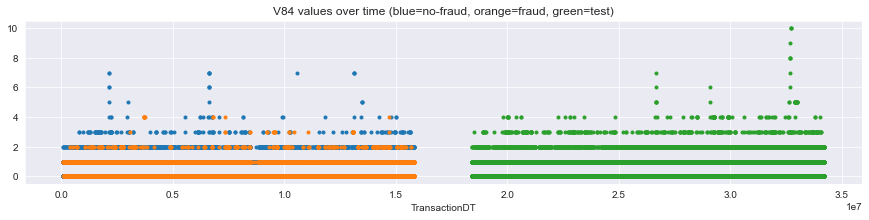

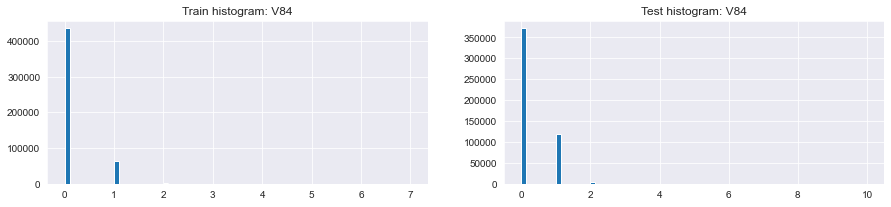

,V84,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.137,0.470,0.126,0.258,0.121,0.290
2,std,0.362,0.554,0.348,0.463,0.349,0.480
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,1.000
7,max,7.000,4.000,7.000,10.000,4.000,10.000
8,unique values,9.000,6.000,9.000,12.000,6.000,12.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V84,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,435246,0.021,9101,371522
1,-999.000,89164,0.048,4276,12081
2,1.000,63848,0.108,6917,119235
3,2.000,2035,0.163,331,3307
4,3.000,191,0.147,28,426
5,4.000,35,0.286,10,84
6,7.000,10,0.000,0,2
7,5.000,6,0.000,0,24
8,6.000,5,0.000,0,3


,V84,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,435246,0.021,9101,371522
1,1.000,63848,0.108,6917,119235
2,-999.000,89164,0.048,4276,12081
3,2.000,2035,0.163,331,3307
4,3.000,191,0.147,28,426
5,4.000,35,0.286,10,84
6,7.000,10,0.000,0,2
7,5.000,6,0.000,0,24
8,6.000,5,0.000,0,3


,Column,Correlation with V84
0,V84,1.000
1,V42,0.958
2,V63,0.955
3,V21,0.955
4,V85,0.937
5,V22,0.917
362,V53,-0.420
363,V13,-0.422
364,V35,-0.425
365,V54,-0.432


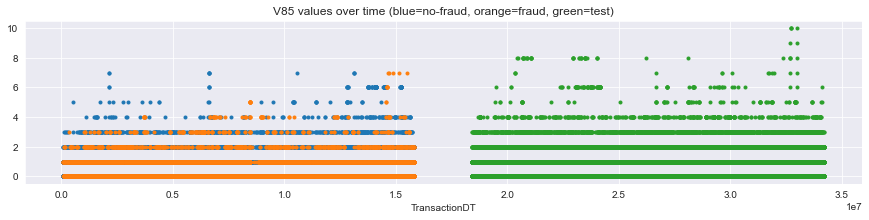

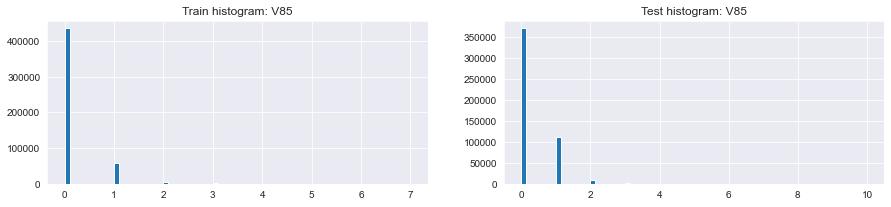

,V85,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.150,0.535,0.137,0.280,0.138,0.313
2,std,0.419,0.708,0.400,0.535,0.435,0.551
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,1.000
7,max,7.000,7.000,7.000,10.000,8.000,10.000
8,unique values,9.000,9.000,9.000,12.000,10.000,12.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V85,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,435103,0.021,9077,371150
1,-999.000,89164,0.048,4276,12081
2,1.000,59565,0.105,6277,112615
3,2.000,5322,0.138,735,8175
4,3.000,987,0.208,205,1937
5,4.000,216,0.343,74,481
6,6.000,121,0.041,5,104
7,5.000,47,0.191,9,87
8,7.000,15,0.333,5,13


,V85,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,435103,0.021,9077,371150
1,1.000,59565,0.105,6277,112615
2,-999.000,89164,0.048,4276,12081
3,2.000,5322,0.138,735,8175
4,3.000,987,0.208,205,1937
5,4.000,216,0.343,74,481
6,5.000,47,0.191,9,87
7,6.000,121,0.041,5,104
8,7.000,15,0.333,5,13


,Column,Correlation with V85
0,V85,1.000
1,V84,0.937
2,V64,0.916
3,V43,0.915
4,V42,0.903
5,V63,0.900
362,V53,-0.396
363,V13,-0.397
364,V35,-0.401
365,V54,-0.407


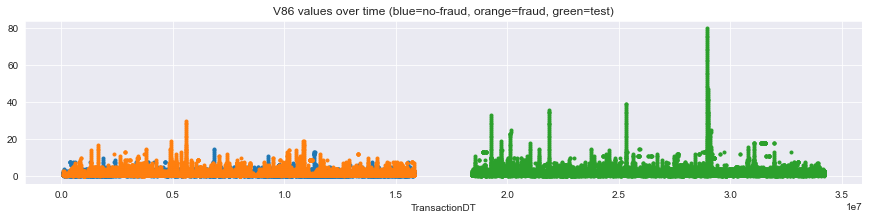

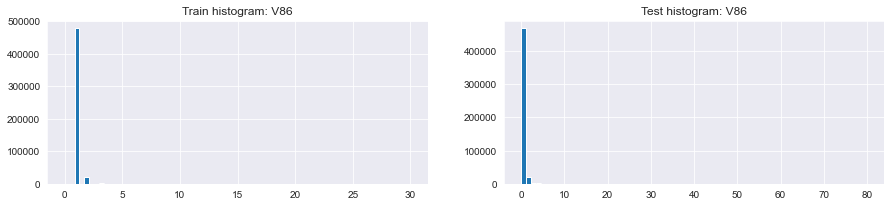

,V86,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,1.065,1.640,1.045,1.092,1.094,1.092
2,std,0.420,1.737,0.262,0.897,0.684,0.940
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,30.000,30.000,15.000,80.000,33.000,80.000
8,unique values,32.000,32.000,17.000,82.000,35.000,82.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V86,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,476911,0.026,12288,467922
1,-999.000,89164,0.048,4276,12081
2,2.000,19527,0.095,1862,21070
3,3.000,2428,0.358,870,2684
4,4.000,743,0.676,502,1112
5,0.000,727,0.070,51,338
6,5.000,355,0.679,241,317
7,6.000,217,0.765,166,255
8,7.000,128,0.930,119,129
9,8.000,86,0.698,60,94


,V86,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,476911,0.026,12288,467922
1,-999.000,89164,0.048,4276,12081
2,2.000,19527,0.095,1862,21070
3,3.000,2428,0.358,870,2684
4,4.000,743,0.676,502,1112
5,5.000,355,0.679,241,317
6,6.000,217,0.765,166,255
7,7.000,128,0.930,119,129
8,9.000,79,0.937,74,75
9,8.000,86,0.698,60,94


,Column,Correlation with V86
0,V86,1.000
1,V87,0.849
2,V257,0.661
3,V246,0.636
4,V44,0.628
5,V45,0.608
375,V53,-0.078
376,V54,-0.081
377,D8,-0.109
378,V326,-0.113


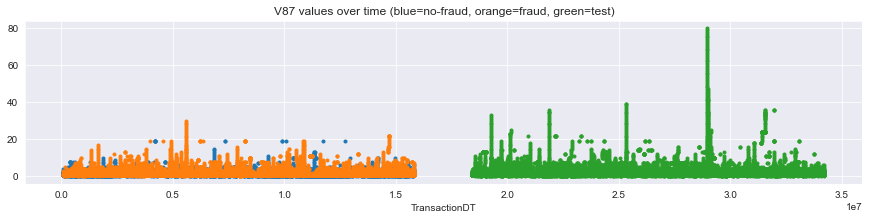

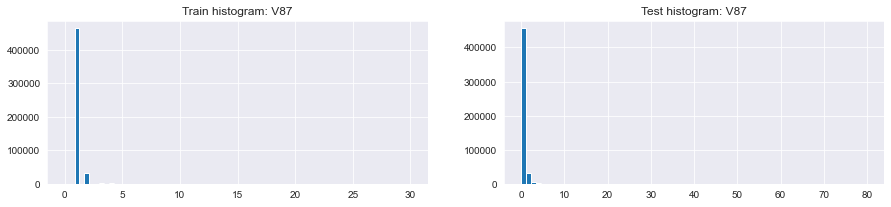

,V87,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,1.099,1.800,1.076,1.132,1.134,1.131
2,std,0.511,2.020,0.339,0.989,0.748,1.038
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,2.000,1.000,1.000,1.000,1.000
7,max,30.000,30.000,19.000,80.000,33.000,80.000
8,unique values,32.000,32.000,18.000,82.000,35.000,82.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V87,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,463708,0.025,11543,455162
1,-999.000,89164,0.048,4276,12081
2,2.000,30832,0.072,2235,31444
3,3.000,3761,0.248,934,4209
4,4.000,1033,0.621,641,1299
5,0.000,694,0.053,37,328
6,5.000,480,0.585,281,482
7,6.000,205,0.741,152,349
8,7.000,148,0.905,134,338
9,8.000,147,0.796,117,170


,V87,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,463708,0.025,11543,455162
1,-999.000,89164,0.048,4276,12081
2,2.000,30832,0.072,2235,31444
3,3.000,3761,0.248,934,4209
4,4.000,1033,0.621,641,1299
5,5.000,480,0.585,281,482
6,6.000,205,0.741,152,349
7,7.000,148,0.905,134,338
8,8.000,147,0.796,117,170
9,9.000,75,0.907,68,95


,Column,Correlation with V87
0,V87,1.000
1,V86,0.849
2,V45,0.634
3,V257,0.602
4,V246,0.587
5,V199,0.539
375,V29,-0.073
376,V69,-0.074
377,V326,-0.090
378,D8,-0.110


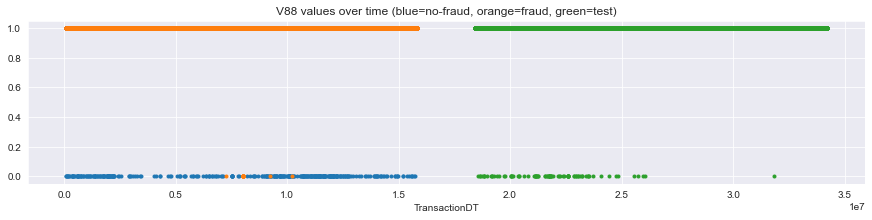

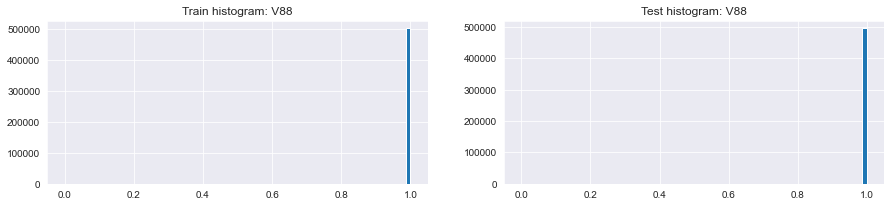

,V88,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.999,0.999,0.999,1.000,1.000,1.000
2,std,0.027,0.026,0.027,0.013,0.022,0.010
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,1.000,1.000,1.000,1.000,1.000,1.000
5,50%,1.000,1.000,1.000,1.000,1.000,1.000
6,75%,1.000,1.000,1.000,1.000,1.000,1.000
7,max,1.000,1.000,1.000,1.000,1.000,1.000
8,unique values,3.000,3.000,3.000,3.000,3.000,3.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V88,Count in train (desc),Mean target,Sum target,Count in test
0,1.000,500998,0.033,16376,494526
1,-999.000,89164,0.048,4276,12081
2,0.000,378,0.029,11,84


,V88,Count in train,Mean target,Sum target (desc),Count in test
0,1.000,500998,0.033,16376,494526
1,-999.000,89164,0.048,4276,12081
2,0.000,378,0.029,11,84


,Column,Correlation with V88
0,V88,1.000
1,V41,0.943
2,V14,0.835
3,V65,0.795
4,V1,0.548
5,V46,0.144
375,V153,-0.051
376,V302,-0.053
377,D8,-0.055
378,D6,-0.056


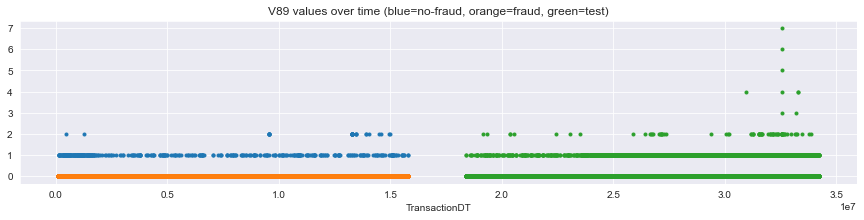

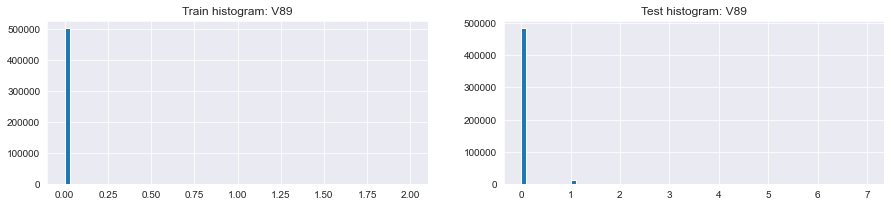

,V89,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.001,0.000,0.001,0.023,0.001,0.028
2,std,0.032,0.000,0.032,0.151,0.037,0.167
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,0.000,0.000,0.000,0.000,0.000
7,max,2.000,0.000,2.000,7.000,2.000,7.000
8,unique values,4.000,2.000,4.000,9.000,4.000,9.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V89,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,500954,0.033,16387,483452
1,-999.000,89164,0.048,4276,12081
2,1.000,392,0.000,0,11075
3,2.000,30,0.000,0,74


,V89,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,500954,0.033,16387,483452
1,-999.000,89164,0.048,4276,12081
2,1.000,392,0.000,0,11075
3,2.000,30,0.000,0,74


,Column,Correlation with V89
0,V89,1.000
1,V28,0.968
2,V27,0.935
3,V68,0.913
4,C3,0.592
5,V264,0.211
360,V19,-0.048
361,V83,-0.052
362,V82,-0.055
363,V327,-0.063


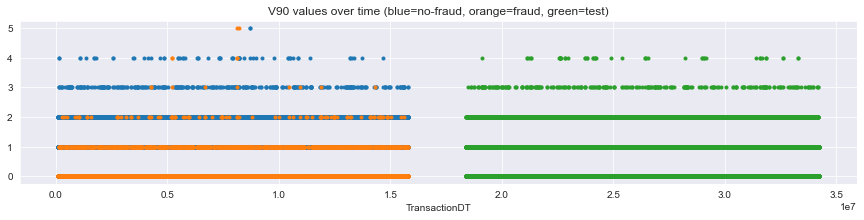

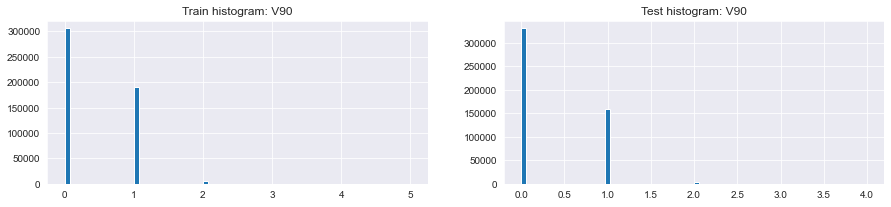

,V90,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.402,0.093,0.412,0.341,0.413,0.324
2,std,0.516,0.323,0.518,0.494,0.517,0.487
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,5.000,5.000,5.000,4.000,4.000,4.000
8,unique values,7.000,7.000,7.000,6.000,6.000,6.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V90,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,305817,0.049,15004,"330,402.000"
1,1.000,190162,0.007,1273,"160,149.000"
2,-999.000,89164,0.048,4276,"12,081.000"
3,2.000,4941,0.019,95,"3,734.000"
4,3.000,388,0.023,9,278.000
5,4.000,64,0.062,4,47.000
6,5.000,4,0.500,2,nan


,V90,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,305817,0.049,15004,"330,402.000"
1,-999.000,89164,0.048,4276,"12,081.000"
2,1.000,190162,0.007,1273,"160,149.000"
3,2.000,4941,0.019,95,"3,734.000"
4,3.000,388,0.023,9,278.000
5,4.000,64,0.062,4,47.000
6,5.000,4,0.500,2,nan


,Column,Correlation with V90
0,V90,1.000
1,V91,0.960
2,V48,0.945
3,V29,0.932
4,V69,0.925
5,V49,0.918
208,V34,-0.311
209,V92,-0.312
210,V52,-0.314
211,V51,-0.319


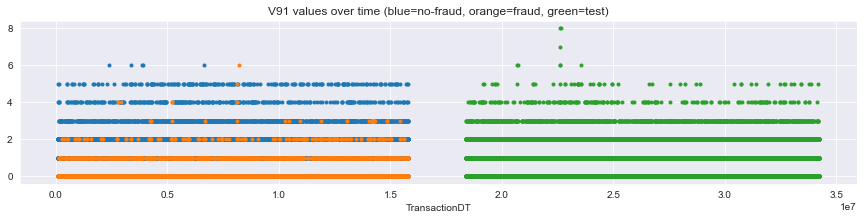

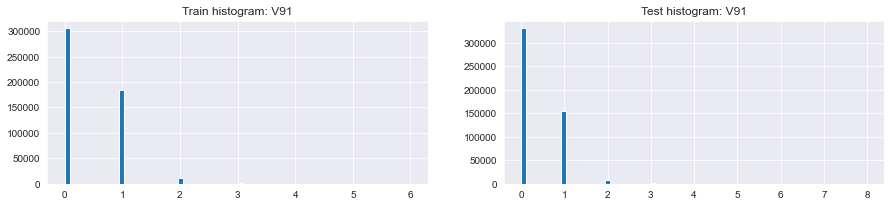

,V91,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.420,0.098,0.431,0.357,0.432,0.339
2,std,0.562,0.349,0.564,0.534,0.560,0.526
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,1.000,0.000,1.000,1.000,1.000,1.000
7,max,6.000,6.000,6.000,8.000,6.000,8.000
8,unique values,8.000,8.000,8.000,10.000,8.000,10.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V91,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,305135,0.049,15000,329824
1,1.000,184121,0.007,1204,154755
2,-999.000,89164,0.048,4276,12081
3,2.000,10470,0.015,156,8720
4,3.000,1086,0.017,19,1035
5,4.000,336,0.018,6,211
6,5.000,222,0.005,1,57
7,6.000,6,0.167,1,5


,V91,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,305135,0.049,15000,329824
1,-999.000,89164,0.048,4276,12081
2,1.000,184121,0.007,1204,154755
3,2.000,10470,0.015,156,8720
4,3.000,1086,0.017,19,1035
5,4.000,336,0.018,6,211
6,5.000,222,0.005,1,57
7,6.000,6,0.167,1,5


,Column,Correlation with V91
0,V91,1.000
1,V90,0.960
2,V49,0.926
3,V30,0.916
4,V48,0.910
5,V70,0.908
208,V34,-0.299
209,V92,-0.299
210,V52,-0.302
211,V51,-0.307


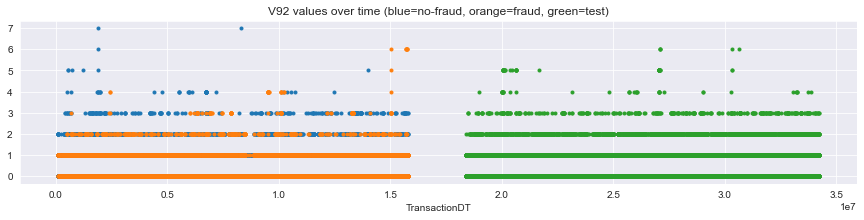

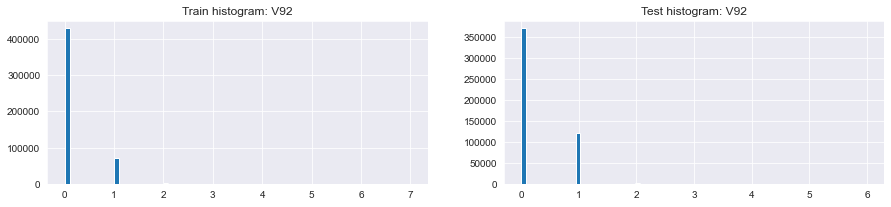

,V92,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.150,0.519,0.138,0.260,0.127,0.291
2,std,0.376,0.609,0.359,0.460,0.362,0.475
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,7.000,6.000,7.000,6.000,5.000,6.000
8,unique values,9.000,8.000,9.000,8.000,7.000,8.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V92,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,428699,0.020,8643,"370,042.000"
1,-999.000,89164,0.048,4276,"12,081.000"
2,1.000,70511,0.101,7146,"121,235.000"
3,2.000,1744,0.271,473,"2,844.000"
4,3.000,348,0.282,98,401.000
5,4.000,57,0.333,19,39.000
6,6.000,8,0.875,7,5.000
7,5.000,7,0.143,1,44.000
8,7.000,2,0.000,0,nan


,V92,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,428699,0.020,8643,"370,042.000"
1,1.000,70511,0.101,7146,"121,235.000"
2,-999.000,89164,0.048,4276,"12,081.000"
3,2.000,1744,0.271,473,"2,844.000"
4,3.000,348,0.282,98,401.000
5,4.000,57,0.333,19,39.000
6,6.000,8,0.875,7,5.000
7,5.000,7,0.143,1,44.000
8,7.000,2,0.000,0,nan


,Column,Correlation with V92
0,V92,1.000
1,V50,0.971
2,V31,0.966
3,V93,0.963
4,V71,0.961
5,V32,0.946
362,V145,-0.460
363,V36,-0.462
364,V150,-0.465
365,V151,-0.493


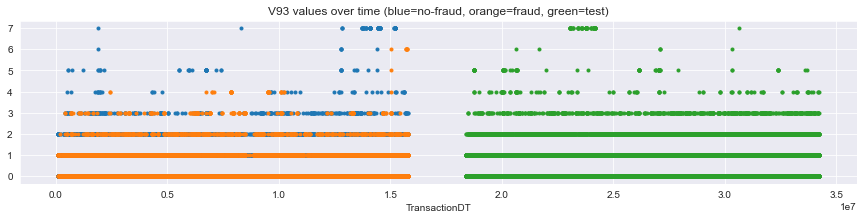

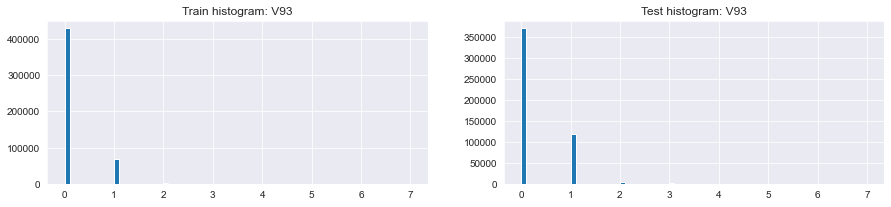

,V93,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.155,0.551,0.141,0.267,0.132,0.298
2,std,0.402,0.671,0.383,0.486,0.387,0.501
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,1.000,0.000,1.000
7,max,7.000,6.000,7.000,7.000,6.000,7.000
8,unique values,9.000,8.000,9.000,9.000,8.000,9.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V93,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,428694,0.020,8641,370007
1,-999.000,89164,0.048,4276,12081
2,1.000,69196,0.098,6769,118930
3,2.000,2682,0.271,728,4593
4,3.000,556,0.374,208,819
5,7.000,109,0.000,0,65
6,4.000,80,0.412,33,106
7,5.000,46,0.022,1,84
8,6.000,13,0.538,7,6


,V93,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,428694,0.020,8641,370007
1,1.000,69196,0.098,6769,118930
2,-999.000,89164,0.048,4276,12081
3,2.000,2682,0.271,728,4593
4,3.000,556,0.374,208,819
5,4.000,80,0.412,33,106
6,6.000,13,0.538,7,6
7,5.000,46,0.022,1,84
8,7.000,109,0.000,0,65


,Column,Correlation with V93
0,V93,1.000
1,V92,0.963
2,V72,0.946
3,V50,0.934
4,V31,0.928
5,V71,0.925
362,V35,-0.434
363,V54,-0.440
364,V36,-0.444
365,V151,-0.445


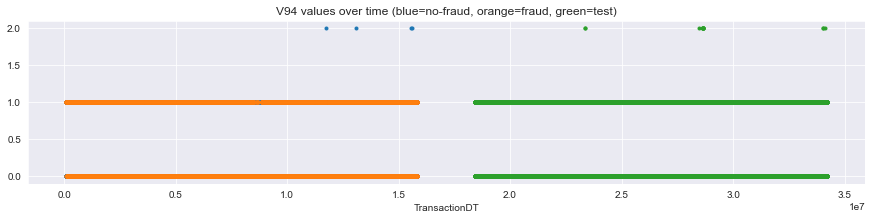

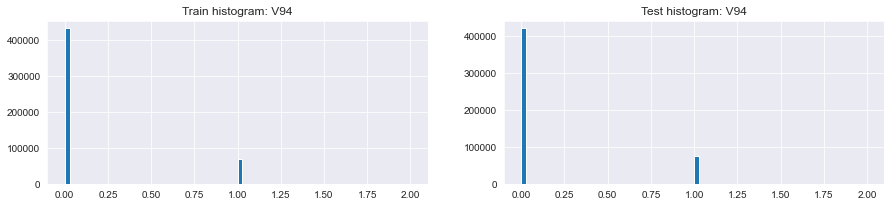

,V94,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"501,376.000","16,387.000","484,989.000","494,610.000","94,022.000","400,589.000"
1,mean,0.137,0.489,0.125,0.153,0.118,0.161
2,std,0.344,0.500,0.331,0.360,0.322,0.368
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,2.000,1.000,2.000,2.000,1.000,2.000
8,unique values,4.000,3.000,4.000,4.000,3.000,4.000
9,NaNs,"89,164.000","4,276.000","84,888.000","12,081.000","7,317.000","4,764.000"


,V94,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,432688,0.019,8366,419096
1,-999.000,89164,0.048,4276,12081
2,1.000,68684,0.117,8021,75500
3,2.000,4,0.000,0,14


,V94,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,432688,0.019,8366,419096
1,1.000,68684,0.117,8021,75500
2,-999.000,89164,0.048,4276,12081
3,2.000,4,0.000,0,14


,Column,Correlation with V94
0,V94,1.000
1,V33,0.976
2,V15,0.954
3,V51,0.951
4,V73,0.946
5,V57,0.936
328,V53,-0.413
329,V35,-0.417
330,V54,-0.424
331,V36,-0.427


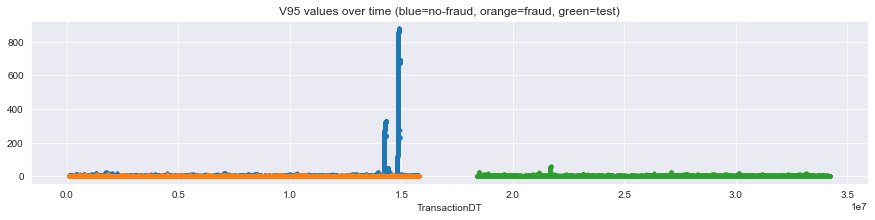

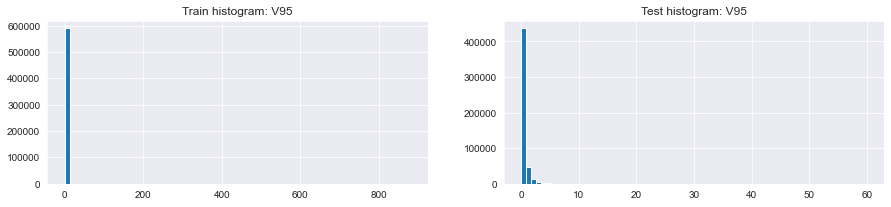

,V95,Train,Train fraud,Train Not fraud,Test,Test public,Test private
0,count,"590,226.000","20,646.000","569,580.000","506,691.000","101,339.000","405,353.000"
1,mean,1.038,0.583,1.055,0.232,0.271,0.222
2,std,21.034,1.240,21.411,0.859,1.211,0.746
3,min,0.000,0.000,0.000,0.000,0.000,0.000
4,25%,0.000,0.000,0.000,0.000,0.000,0.000
5,50%,0.000,0.000,0.000,0.000,0.000,0.000
6,75%,0.000,1.000,0.000,0.000,0.000,0.000
7,max,880.000,13.000,880.000,60.000,60.000,27.000
8,unique values,882.000,15.000,882.000,61.000,61.000,28.000
9,NaNs,314.000,17.000,297.000,0.000,0.000,0.000


,V95,Count in train (desc),Mean target,Sum target,Count in test
0,0.000,510542,0.029,14585,"436,511.000"
1,1.000,52008,0.064,3315,"46,915.000"
2,2.000,14804,0.090,1332,"13,276.000"
3,3.000,5758,0.112,647,"4,986.000"
4,4.000,2646,0.125,332,"2,330.000"
5,5.000,1281,0.136,174,"1,116.000"
6,6.000,684,0.142,97,578.000
7,7.000,411,0.163,67,322.000
8,-999.000,314,0.054,17,nan
9,8.000,239,0.184,44,196.000


,V95,Count in train,Mean target,Sum target (desc),Count in test
0,0.000,510542,0.029,14585,436511
1,1.000,52008,0.064,3315,46915
2,2.000,14804,0.090,1332,13276
3,3.000,5758,0.112,647,4986
4,4.000,2646,0.125,332,2330
5,5.000,1281,0.136,174,1116
6,6.000,684,0.142,97,578
7,7.000,411,0.163,67,322
8,8.000,239,0.184,44,196
9,9.000,167,0.192,32,119


,Column,Correlation with V95
0,V95,1.000
1,V322,1.000
2,V101,1.000
3,V279,0.999
4,V293,0.998
5,V132,0.995
375,V155,-0.133
376,V148,-0.137
377,V154,-0.145
378,V153,-0.148


In [130]:
for col in list(tr.columns.values[:COLS_TO_SHOW]):
    proc(col)

## LightGBM

In [132]:
trid = tr.merge(trid, on='TransactionID',how='left' )

In [133]:
#Remove variables with missing values more than 30 percent

A = (np.sum(pd.isnull(trid)).sort_values(ascending=False)/len(trid))*100
Removed_col = A[A>0.3].index
trid.drop(columns=Removed_col, inplace=True)

In [134]:
trid.shape

(590540, 110)

In [135]:
#Change Categorical Variables to dummies
train_dummy = pd.get_dummies(trid, drop_first=True)

In [136]:
train_dummy.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card3,C1,C2,C3,C4,...,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,card4_discover,card4_mastercard,card4_visa,card6_credit,card6_debit,card6_debit or credit
0,2987000,0,86400,68.500,13926,150.000,1.000,1.000,0.000,0.000,...,0,0,0,1,1,0,0,1,0,0
1,2987001,0,86401,29.000,2755,150.000,1.000,1.000,0.000,0.000,...,0,0,0,1,0,1,0,1,0,0
2,2987002,0,86469,59.000,4663,150.000,1.000,1.000,0.000,0.000,...,0,0,0,1,0,0,1,0,1,0
3,2987003,0,86499,50.000,18132,150.000,2.000,5.000,0.000,0.000,...,0,0,0,1,0,1,0,0,1,0
4,2987004,0,86506,50.000,4497,150.000,1.000,1.000,0.000,0.000,...,1,0,0,0,0,1,0,1,0,0


In [137]:
#Remove redundant variables
train_dummy.drop(columns = 'TransactionID', inplace = True)

In [138]:
%%time
X_train, X_valid, y_train, y_valid = train_test_split(
    train_dummy.drop(columns='isFraud'), train_dummy['isFraud'], test_size=0.25, random_state=0)



params = {'num_leaves': 256,
          'min_child_samples': 79,
          'objective': 'binary',
          'max_depth': 13,
          'learning_rate': 0.03,
          "boosting_type": "gbdt",
          "subsample_freq": 3,
          "subsample": 0.9,
          "bagging_seed": 11,
          "metric": 'auc',
          "verbosity": -1,
          'reg_alpha': 0.3,
          'reg_lambda': 0.3,
          'colsample_bytree': 0.9,
          'is_unbalance':True,

         }

d_train = lgb.Dataset(X_train, y_train)
d_valid = lgb.Dataset(X_valid, y_valid)
    
bst = lgb.train(params, d_train, num_boost_round= 300, valid_sets=[d_train, d_valid], verbose_eval=50, early_stopping_rounds=50)

Training until validation scores don't improve for 50 rounds
[50]	training's auc: 0.955114	valid_1's auc: 0.921751
[100]	training's auc: 0.963794	valid_1's auc: 0.928287
[150]	training's auc: 0.97134	valid_1's auc: 0.934849
[200]	training's auc: 0.976895	valid_1's auc: 0.939809
[250]	training's auc: 0.981055	valid_1's auc: 0.942742
[300]	training's auc: 0.984495	valid_1's auc: 0.944613
Did not meet early stopping. Best iteration is:
[300]	training's auc: 0.984495	valid_1's auc: 0.944613
Wall time: 40.8 s


## Random Forest & LogisticRegression

In [140]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import resample
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.linear_model import 
import time
import matplotlib.patches as mpatches
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import warnings

In [141]:
train_transactions=pd.read_csv('train_transaction.csv')
train_identity=pd.read_csv('train_identity.csv')
print('Train data set is loaded !')

Train data set is loaded !


In [142]:
train_df = train_transactions.merge(train_identity, how="left", on="TransactionID")

print('Train shape',train_df.shape)

print("Data set merged ")

del train_transactions, train_identity

Train shape (590540, 434)
Data set merged 


In [143]:
test_transaction=pd.read_csv('test_transaction.csv')
test_identity=pd.read_csv('test_identity.csv')
sample_submission=pd.read_csv('sample_submission.csv')
print('Test data set is loaded !')

Test data set is loaded !


### Merging testing data

In [145]:
test_df = test_transaction.merge(test_identity, how="left", on="TransactionID")

print('Train shape',train_df.shape)

print("Data set merged ")

del test_transaction, test_identity

Train shape (590540, 434)
Data set merged 


In [146]:
# fix columns names
test_df= test_df.rename(columns=lambda x:"_".join(x.split("-")))

# set TransactionID as index
train_df.set_index('TransactionID', inplace=True)
test_df.set_index('TransactionID', inplace=True)

### Replace missing values and use label encoder for categorical variables

In [147]:
# Replace missing values with -999
train_df = train_df.fillna(-999)
test_df = test_df.fillna(-999)

In [148]:
# Label Encoding
for f in train_df.columns:
    if train_df[f].dtype=='object': 
        lbl = LabelEncoder()
        lbl.fit(list(train_df[f].values))
        train_df[f] = lbl.transform(list(train_df[f].values)) 

for f in test_df.columns:
    if test_df[f].dtype=='object': 
        lbl = LabelEncoder()
        lbl.fit(list(test_df[f].values))
        test_df[f] = lbl.transform(list(test_df[f].values))

- We will now split the train dataset into train and validation sets (20% of data for validation)

In [149]:
X_train, X_test, y_train, y_test = train_test_split(train_df.drop('isFraud', axis=1), train_df['isFraud'].astype('uint8'), test_size=.2, random_state=42, stratify=train_df['isFraud'].astype('uint8'))

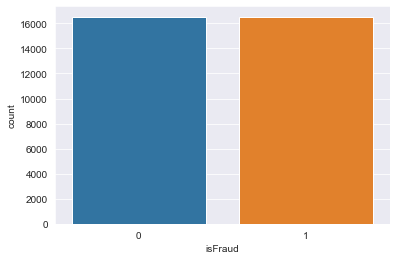

In [150]:
df_majority = X_train[y_train == 0]
df_minority = X_train[y_train == 1]
size_minor = len(df_minority)

y_majority = y_train[y_train == 0]
y_minority = y_train[y_train == 1]

# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                   replace=False,    # sample with replacement
                   n_samples=size_minor,    # to match majority class
                   random_state=42)  # reproducible results

X_down_train = pd.concat([df_minority, df_majority_downsampled])
# print(X_down_train.shape)

y_majority_downsampled = y_majority[df_majority_downsampled.index]
y_down_train = pd.concat([y_minority, y_majority_downsampled])
# y_down_train.value_counts()

sns.countplot(x = y_down_train);

## Fit the model

In [151]:
clf_rf_down = RandomForestClassifier(random_state=42)
model_rf_down = clf_rf_down.fit(X_down_train, y_down_train)
# y_pred = model_rf_down.predict(X_test)
y_prob_rf = model_rf_down.predict_proba(X_test)[:, 1]
print(f'ROC-AUC score: {roc_auc_score(y_test, y_prob_rf):.3f}')

predictions_rf = clf_rf_down.predict_proba(test_df)[:,1]

ROC-AUC score: 0.923


## Alternative model

In [153]:
from sklearn.linear_model import LogisticRegression
logit_model = LogisticRegression().fit(X_down_train, y_down_train)

y_prob_logit = logit_model.predict_proba(X_test)[:, 1]
print(f'ROC-AUC score: {roc_auc_score(y_test, y_prob_logit):.3f}')

predictions_logit = logit_model.predict_proba(test_df)[:,1]

ROC-AUC score: 0.749


## Prepare submission file

In [155]:
# weight diferent model predictions
weights = [0.1, 0.9]

y_prob_joined = (weights[0]*y_prob_logit + weights[1]*y_prob_rf)/sum(weights)
print(f'ROC-AUC score: {roc_auc_score(y_test, y_prob_joined):.3f}')

ROC-AUC score: 0.922


In [156]:
predictions_joined = (weights[0]*predictions_logit + weights[1]*predictions_rf)/sum(weights)

submission = pd.DataFrame({'TransactionID':test_df.index,'isFraud':predictions_joined})
submission["TransactionID"]=submission["TransactionID"].astype(int)
submission.head()

,TransactionID,isFraud
0,3663549,0.194
1,3663550,0.261
2,3663551,0.383
3,3663552,0.205
4,3663553,0.229


In [157]:
filename = 'joined_model_submission_min.csv'
submission.to_csv(filename, index=False)
print(f'Saved file: {filename}')

Saved file: joined_model_submission_min.csv


## Base Model

In [158]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV,cross_validate
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor,VotingClassifier
from sklearn.preprocessing import MinMaxScaler,LabelEncoder, StandardScaler, RobustScaler
from sklearn.impute import KNNImputer
from sklearn.linear_model import LogisticRegression,LinearRegression, Ridge, Lasso, ElasticNet
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
from sklearn.exceptions import ConvergenceWarning
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,VotingRegressor
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score,roc_auc_score
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, AdaBoostClassifier
from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import classification_report

In [159]:
warnings.simplefilter("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [160]:
train_transaction1=pd.read_csv('train_transaction.csv')
train_identity1=pd.read_csv('train_identity.csv')
test_transaction1=pd.read_csv('test_transaction.csv')
test_identity1=pd.read_csv('test_identity.csv')
sample_submission1=pd.read_csv('sample_submission.csv')

In [161]:
train_df1 = train_transaction1.merge(train_identity1, how="left", on="TransactionID")

test_df1 = test_transaction1.merge(test_identity1, how="left", on="TransactionID")

In [162]:
test_df1= test_df1.rename(columns=lambda x:"_".join(x.split("-")))

#### reduce memory

In [163]:
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [164]:
train_df1 = reduce_mem_usage(train_df1)
test_df1  = reduce_mem_usage(test_df1)

Mem. usage decreased to 650.48 Mb (66.8% reduction)
Mem. usage decreased to 565.37 Mb (66.3% reduction)


# Filling Missing Values


In [165]:
train_df1 = train_df1.fillna(-999)
test_df1 = test_df1.fillna(-999)

# Label Encoder

In [166]:
for f in train_df1.columns:
    if train_df1[f].dtype=='object': 
        lbl = LabelEncoder()
        lbl.fit(list(train_df1[f].values))
        train_df1[f] = lbl.transform(list(train_df1[f].values)) 

In [167]:
for f in test_df1.columns:
    if test_df1[f].dtype=='object': 
        lbl = LabelEncoder()
        lbl.fit(list(test_df1[f].values))
        test_df1[f] = lbl.transform(list(test_df1[f].values))

# Model

In [168]:
y = train_df1["isFraud"]
X = train_df1.drop(["isFraud"], axis=1)

In [169]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0, stratify=y)

In [170]:
classifiers = [("CART", DecisionTreeClassifier()),
               ("RF", RandomForestClassifier()),
               ('Adaboost', AdaBoostClassifier()),
               ('GBM', GradientBoostingClassifier()),
               ('XGBoost', XGBClassifier()),
               ('LightGBM', LGBMClassifier()),
               ]

    
for name, classifier in classifiers:
    print(f" {name} for train")
    model = classifier.fit(X_train, y_train)
    y_pred = model.predict(X_train)
    y_prob = model.predict_proba(X_train)[:, 1]
    print(classification_report(y_train, y_pred))
    print(f" AUC: {roc_auc_score(y_train, y_prob)}")
    print("-----------------------------------------------------")
    print(f" {name} for test")
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]
    print(classification_report(y_test, y_pred))
    print(f" AUC: {roc_auc_score(y_test, y_prob)}")
    print("######################################################")

 CART for train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    398914
           1       1.00      1.00      1.00     14464

    accuracy                           1.00    413378
   macro avg       1.00      1.00      1.00    413378
weighted avg       1.00      1.00      1.00    413378

 AUC: 1.0
-----------------------------------------------------
 CART for test
              precision    recall  f1-score   support

           0       0.98      0.98      0.98    170963
           1       0.54      0.58      0.56      6199

    accuracy                           0.97    177162
   macro avg       0.76      0.78      0.77    177162
weighted avg       0.97      0.97      0.97    177162

 AUC: 0.7830425096663813
######################################################
 RF for train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    398914
           1       1.00      1.00      1.00     

## Lightgbm & xgboost

# xgboost submission

In [171]:
xgboost_model = XGBClassifier(random_state=17).fit(X_train, y_train)
y_pred = xgboost_model.predict(X_test)
y_prob = xgboost_model.predict_proba(X_test)[:, 1]
print(classification_report(y_test, y_pred))
roc_auc_score(y_test, y_prob)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99    170963
           1       0.92      0.49      0.64      6199

    accuracy                           0.98    177162
   macro avg       0.95      0.75      0.82    177162
weighted avg       0.98      0.98      0.98    177162



0.9406964804423688

In [172]:
predictions_xgboost = xgboost_model.predict_proba(test_df1)[:,1]
submission = pd.DataFrame({'TransactionID':test_transaction1['TransactionID'],'isFraud':predictions_xgboost})
submission["TransactionID"]=submission["TransactionID"].astype(int)
submission.head()

,TransactionID,isFraud
0,3663549,0.005
1,3663550,0.002
2,3663551,0.003
3,3663552,0.002
4,3663553,0.001


In [173]:
filename = 'CIS Fraud Detection base model xgboost_min.csv'

submission.to_csv(filename,index=False)


print('Saved file: ' + filename)

Saved file: CIS Fraud Detection base model xgboost_min.csv


- Predict_proba
- Score: 0.891545
- Public score: 0.916079


# lightgbm submission

In [174]:
lgbm_model = LGBMClassifier(random_state=17).fit(X_train, y_train)
y_pred = lgbm_model.predict(X_test)
y_prob = lgbm_model.predict_proba(X_test)[:, 1]
print(classification_report(y_test, y_pred))
roc_auc_score(y_test, y_prob)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99    170963
           1       0.89      0.44      0.59      6199

    accuracy                           0.98    177162
   macro avg       0.94      0.72      0.79    177162
weighted avg       0.98      0.98      0.97    177162



0.927581425940798

In [175]:
predictions_lgbm = lgbm_model.predict_proba(test_df1)[:,1]
submission = pd.DataFrame({'TransactionID':test_transaction1['TransactionID'],'isFraud':predictions_lgbm})
submission["TransactionID"]=submission["TransactionID"].astype(int)
submission.head()

,TransactionID,isFraud
0,3663549,0.002
1,3663550,0.006
2,3663551,0.016
3,3663552,0.003
4,3663553,0.003


In [176]:
filename = 'CIS Fraud Detection base model lgbm_min.csv'

submission.to_csv(filename,index=False)

print('Saved file: ' + filename)

Saved file: CIS Fraud Detection base model lgbm_min.csv


- Predict_proba
- Score: 0.894476
- Public score: 0.920603

# 1등 솔루션
- 1등 팀인 FraudSquad 의 결과에서 가장 중요했던 부분은 UID 를 찾고 만들어내는 부분이었다고 한다.
UID 가 뭔지에 대해서 가볍게 설명하자면 사기거래에 해당하는 사람의 모든 거래를 사기거래라고 가정하고 그것을 새로운 변수인 UID 로 만들어서 분석에 사용한 것이다.

- Features Validation 에서도 특이한 기법을 사용하였는데 이 또한 많은 사람들이 궁금해하고 이에 대한 내용도 Discussion 에서 확인 할 수 있다.
Train 2 month / skip 2 / predict 2 &
Train 4 / skip 1 / predict 1
의 방식으로 데이터를 나눠 학습시키며 과적합을 방지한 것으로 보인다.

- Model
모델은 CatBoost, LGBM, XGB 를 사용했으며 최종적으로 CatBoost 와 LGBM 을 앙상블 하여 사용하였다고 한다.

- Predictions
6 folds / GroupKfold by month &
almost no fine-tuning for models


- Refer : https://www.kaggle.com/c/ieee-fraud-detection/discussion/111284 , https://www.kaggle.com/c/ieee-fraud-detection/discussion/111308 , 
https://www.kaggle.com/c/ieee-fraud-detection/discussion/108575#latest-641841 ,
https://www.kaggle.com/code/cdeotte/xgb-fraud-with-magic-0-9600



## 1st Place Solution - Part 1
- I can't believe that I'm writing a post with the title "1st Place Solution". I am so happy right now and I'm so grateful to everyone at Kaggle for all that you've shared. Thank you Konstantin who allowed this amazing experience to be possible.

Time is not most important
After Microsoft Malware, I was reluctant to enter another time series competition. To my relief, this competition actually isn't about time. The reason adversarial validation has AUC=1 is not because the nature of fraud changes radically over time but rather because the clients in the dataset change radically over time.

Once you realize this, you will know that the challenge in this competition is building a model that can predict unseen clients (not unseen time). Below is a plot showing the data in the private dataset (which has 400,000 rows). 68.2% of the data are clients we do not see in train dataset. 16.4% of data are in both the train and test dataset. And 15.4% we were unsure about. Each blue line below is one client. Each client makes many transactions, the left end of the blue line is their first transaction in time and the right end is the last transaction in time.

Magic Feature
We are not predicting fraudulent transactions. According to the competition host Lynn here. Once a client (credit card) has fraud, their entire account is converted to isFraud=1. Therefore we are predicting fraudulent clients (credit cards).

The logic of our labeling is define reported chargeback on the card as fraud transaction (isFraud=1) and transactions posterior to it with either user account, email address or billing address directly linked to these attributes as fraud too. If none of above is reported and found beyond 120 days, then we define as legit transaction (isFraud=0).

You may think that after 120 days, a card becomes isFraud=0. We rarely see that in the training data. (Perhaps fraudulent credit cards get terminated instead of reused). The pie chart below shows this. The training dataset has 73838 clients (credit cards) with 2 or more transaction. Of those, 71575 (96.9%) are always isFraud=0 and 2134 (2.9%) are always isFraud=1. Only 129 (0.2%) have a mixture of isFraud=0 and isFraud=1.

Fraudulent Clients
Below is one example among 2134 examples that I could show you of clients with isFraud=1. This is client = 2988694 The key to identifying clients are the three columns card1, addr1, and D1. The column D1 is "days since client (credit card) began". Therefore if we create D1n = TransactionDay minus D1, we get the day the card began (where TransactionDay = TransactionDT / (24*60*60) ). In the example below, this credit card began on day = -81 (which is approximately Sept 10, 2017 because dataset is believed to begin on December 1, 2017). We also see that D3n = TransactionDay minus D3 is a pointer to the day of each client's last transaction. (There are more columns that help us identify clients too).

Preventing Overfitting
To prevent overfitting the train and overfitting public test dataset, we must not use client UID directly nor the dozens of columns in the dataset that help identify client like certain D, V, and ID columns. (You know which columns identify clients from reviewing LGBM feature importance during train/test adversarial validation explained here).

We cannot add UID as a new column because 68.2% of clients in private test dataset are not in the training dataset. Instead we must create aggregated group features. For example we can take all the C, M columns and do this new_features = df.groupby('uid')[CM_columns].agg(['mean']). Then we delete the column uid. Now our model has the ability to classify clients that it has never seen before.

Model Details
There is so much more to say. Namely, I know you would like to know the specifics of our EDA, our models, validation methodology, and stacking/ensembling methodology. Konstantin has provided a brief summary here. I will begin working on "1st Place Solution - Part 2" that describes the technical aspects in more detail. Also we will begin sharing our code as we clean it up.

I look forward to reading everyone's solutions. Please share.

UPDATE: "1st Place Solution - Part 2" is posted here. UPDATE: XGB LB 0.9620 notebook posted here


## 1st Place Solution - Part 2
- In "1st Place Solution - Part 1" posted here, we discussed the benefits of classifying clients (credit cards) instead of transactions in Kaggle's Fraud competition. Here we will discuss the technical details.

Final Model
Our final model was a combination of 3 high scoring single models. CatBoost (Public/Private LB of 0.9639/0.9408), LGBM (0.9617/0.9384), and XGB (0.9602/0.9324). These models were diversified because Konstantin built the CAT and LGB while I built the XGB and NN. And we engineered features independently. (In the end we didn't use the NN which had LB 0.9432). XGB notebook posted here.

One final submission was a stack where LGBM was trained on top of the predictions of CAT and XGB and the other final submission was an ensemble with equal weights. Both submissions were post processed by taking all predictions from a single client (credit card) and replacing them with that client's average prediction. This PP increased LB by 0.001.

How to Find UIDs
We found UIDs in two different ways. (Specific details here).

Wrote a script that finds UIDs here
Train our models to find UIDs here and here
If you remember, Konstantin's original public FE kernel here without UIDs achieves local validation AUC = 0.9245 and public LB 0.9485. His new FE kernel here achieves local validation AUC = 0.9377 and public LB 0.9617 by finding and using UIDs. Soon I will post my XGB kernel which finds UIDs with even less human assistance and proves to beat all other methods of finding UIDs. (XGB posted here). The purpose of producing UIDs by a script was for EDA, special validation tests, and post process. We did not add the script's UIDs to our models. Machine learning did better finding them on its own.

EDA
EDA was daunting in this competition. There were so many columns to analyze and their meanings were obscured. For the first 150 columns, we used Alijs's great EDA here. For the remaining 300 columns, we used my V and ID EDA here. We reduced the number of V columns with 3 tricks. First groups of V columns were found that shared similar NAN structure, next we used 1 of 3 methods:

We applied PCA on each group individually
We selected a maximum sized subset of uncorrelated columns from each group
We replaced the entire group with all columns averaged.
Afterward, these reduced groups were further evaluated using feature selection techniques below. For example, the block V322-V339 failed "time consistency" and was removed from our models.

Feature Selection
Feature selection was important because we had many columns and preferred to keep our models efficient. My XGB had 250 features and would train 6 folds in 10 minutes. Konstantin will need to say what his models had. We used every trick we knew to select our features:

forward feature selection (using single or groups of features)
recursive feature elimination (using single or groups of features)
permutation importance
adversarial validation
correlation analysis
time consistency
client consistency
train/test distribution analysis
One interesting trick called "time consistency" is to train a single model using a single feature (or small group of features) on the first month of train dataset and predict isFraud for the last month of train dataset. This evaluates whether a feature by itself is consistent over time. 95% were but we found 5% of columns hurt our models. They had training AUC around 0.60 and validation AUC 0.40. In other words some features found patterns in the present that did not exist in the future. Of course the possible of interactions complicates things but we double checked every test with other tests.

Validation Strategy
We never trusted a single validation strategy so we used lots of validation strategies. Train on first 4 months of train, skip a month, predict last month. We also did train 2, skip 2, predict 2. We did train 1 skip 4 predict 1. We reviewed LB scores (which is just train 6, skip 1, predict 1 and no less valid than other holdouts). We did a CV GroupKFold using month as the group. We also analyzed models by how well they classified known versus unknown clients using our script's UIDs.

For example when training on the first 5 months and predicting the last month, we found that our

XGB model did best predicting known UIDs with AUC = 0.99723
LGBM model did best predicting unknown UIDs with AUC = 0.92117
CAT model did best predicting questionable UIDs with AUC = 0.98834
Questionable UIDs are transactions that our script could not confidently link to other transactions. When we ensembled and/or stacked our models we found that the resultant model excelled in all three categories. It could predict known, unknown, and questionable UIDs forward in time with great accuracy !!

In [ ]:
from IPython.display import Image

## 1st Place Solution - Part 1 에 대한 설명

![1](1.png)
![2](2.png)
![3](3.png)

## 1st Place Solution - Part 2 에 대한 설명

## XGB Fraud with Magic - [0.9600] 에 대한 설명

![4](4.png)
![5](5.png)
![6](6.png)

# 마무리

- 설명

![7](7.png)